In [1]:
%load_ext autoreload
%autoreload 2

In [7]:
import torch
import numpy as np
import matplotlib.pyplot as plt
from data import DataLoader, get_sampled_data
from model import NNModel
from model import MLPModel
from model import MLPModelTest
from trainer import ModelTrainer
from sklearn.model_selection import train_test_split
from utils import plot_loss
from utils import format_metrics
from utils import write_results_to_file
from utils import save_and_plot_redshifts
from evaluation import ModelEvaluator
from sklearn.linear_model import LinearRegression
from sklearn.linear_model import LogisticRegression # for classification
from sklearn.preprocessing import StandardScaler
import os

In [8]:
parameter = "smooth"  
modality = "VIS_NISP_SED"

In [9]:
# Paths and files
if modality == 'VIS':
    folder_path = "/home/msiudek/myspace/projects/EUCLID/Q1/astropt/VIS"  
elif modality == 'VIS_NISP':
    folder_path = "../VIS_NISP" 
elif modality=="VIS_NISP_SED" or modality=="SED_only" :
    folder_path = "../VIS_NISP_SED" 
else:
    print("The modality is not defined")

In [10]:
if modality=="VIS":
    folder_path = "/home/msiudek/myspace/projects/EUCLID/Q1/astropt/VIS"  
elif modality=="VIS_NISP":
    folder_path = "/home/msiudek/myspace/projects/EUCLID/Q1/astropt/VIS_NISP" 
elif modality=="VIS_NISP_SED" or modality=="SED_only" :
    folder_path = "/home/msiudek/myspace/projects/EUCLID/Q1/astropt/VIS_NISP_SED" 
else:
    print("No modality is given")

In [11]:
if modality=="VIS" or modality=="VIS_NISP" or modality=="VIS_NISP_SED":
    train_embedding_file = "zss_64t_mean.npy"
    train_idx_file = "idxs_64t_mean.npy"
    test_embedding_file = "zss_64t_mean_test.npy"
    test_idx_file = "idxs_64t_mean_test.npy"

elif modality=="SED_only":
    train_embedding_file = "zss_sedonly.npy" 
    train_idx_file = "idxs_sedonly.npy" 
    test_embedding_file = "zss_sedonly_test.npy" 
    test_idx_file = "idxs_sedonly_test.npy"
else:
    print("No modality is given")
    
catalog_path = "/home/msiudek/myspace/projects/EUCLID/Q1/Q1_data/EuclidMorphPhysPropSpecZ.fits"

train_txt_file = os.path.join(folder_path, "train.txt")
test_txt_file = os.path.join(folder_path, "test.txt")

In [12]:
# Load training data
training_loader = DataLoader(folder_path, train_embedding_file, train_idx_file, catalog_path, "train.txt")
train_embeddings, train_redshifts = training_loader.load_data(parameter)

In [13]:
# Load test data
test_loader = DataLoader(folder_path, test_embedding_file, test_idx_file, catalog_path, "test.txt")
test_embeddings, test_redshifts = test_loader.load_data(parameter)

In [14]:
# Combine train and test for easier sampling
embeddings = np.concatenate([train_embeddings,test_embeddings])
redshifts = np.concatenate([train_redshifts, test_redshifts])
print(embeddings.shape)

(199755, 768)


In [15]:
print(f"Unique labels: {np.unique(redshifts, return_counts=True)}")

Unique labels: (array([0, 1]), array([137558,  62197]))


In [16]:
# Set the number of Monte Carlo runs
n_mc_runs = 50
percentages = [1,5,10,20,50,80,100]  
results = {}
epochs = 1000
lr = 0.0001
task_type = "binary_classification"

## MLP model 
~a la fine-tuning

In [18]:
model_name = "MLP"

In [ ]:
for percentage in percentages:
    print(f"Training model for {percentage}% of the data...")

    models = []
    val_embeddings_list = []
    val_redshifts_list = []

    # Initialize lists to store metrics across all MC runs
    all_final_metrics = []
    all_metrics_mean = []
    all_metrics_std = []

    for i in range(n_mc_runs):
        print(f"Training run {i+1}/{n_mc_runs} for {percentage}% of the data...")
        
        # Sample the data for the current run with a different random seed
        sampled_embeddings, sampled_redshifts = get_sampled_data(embeddings, redshifts, percentage, random_seed=42+i)  
        
        # Split data with a different random seed for each run
        X_train, X_val, y_train, y_val = train_test_split(
            sampled_embeddings, sampled_redshifts, test_size=0.2, random_state=42+i
        )
        
        X_train, X_val = torch.tensor(X_train, dtype=torch.float32), torch.tensor(X_val, dtype=torch.float32)
        y_train, y_val = torch.tensor(y_train, dtype=torch.float32), torch.tensor(y_val, dtype=torch.float32)
        # Compute pos_weight
        num_neg = (y_train == 0).sum().item()  # Number of negative samples
        num_pos = (y_train == 1).sum().item()  # Number of positive samples
        pos_weight = torch.tensor([num_neg / num_pos], dtype=torch.float32)
        
        # Re-initialize the model for each run
        model = MLPModelTest(input_dim=X_train.shape[1], task_type=task_type)
        
        # Train model
        trainer = ModelTrainer(model, lr=lr, epochs=epochs, task_type=task_type, pos_weight=pos_weight)        
        train_losses, val_losses = trainer.train(X_train, y_train, X_val, y_val)
        
        # Store the trained model and validation data
        models.append(model)
        val_embeddings_list.append(X_val.numpy())
        val_redshifts_list.append(y_val.numpy())
        
        #plot_loss(train_losses, val_losses, epochs=epochs)
        
        # Evaluate the model for this run
        evaluator = ModelEvaluator(task_type=task_type)
        final_metrics, metrics_mean, metrics_std, predictions = evaluator.evaluate(
            model, X_val.numpy(), y_val.numpy(), n_mc_runs=1, poisson_noise = False
        )
        
        # Store metrics for this run
        all_final_metrics.append(final_metrics)
        all_metrics_mean.append(metrics_mean)
        all_metrics_std.append(metrics_std)

    # Compute mean and std of metrics across all MC runs
    final_metrics_aggregated = {
        k: np.mean([m[k] for m in all_final_metrics]) for k in all_final_metrics[0]
    }
    metrics_mean_aggregated = {
        k: np.mean([m[k] for m in all_metrics_mean]) for k in all_metrics_mean[0]
    }
    metrics_std_aggregated = {
        k: np.std([m[k] for m in all_metrics_mean]) for k in all_metrics_mean[0]
    }

    # Print formatted metrics
    print(f"Metrics for {percentage}% of data:")
    print("Final Metrics (Aggregated Predictions):", final_metrics_aggregated)
    print("Metrics Across Runs:")
    for key in metrics_mean_aggregated:
        print(f"{key}: {metrics_mean_aggregated[key]:.4f} ± {metrics_std_aggregated[key]:.4f}")
    
    # Write results to file
    write_results_to_file(model_name,percentage, modality, parameter, final_metrics_aggregated, metrics_mean_aggregated, metrics_std_aggregated)

Training model for 1% of the data...
Training run 1/50 for 1% of the data...
Sample size for 1%: 1997
Training run 2/50 for 1% of the data...
Sample size for 1%: 1997
Training run 3/50 for 1% of the data...
Sample size for 1%: 1997
Training run 4/50 for 1% of the data...
Sample size for 1%: 1997
Training run 5/50 for 1% of the data...
Sample size for 1%: 1997
Training run 6/50 for 1% of the data...
Sample size for 1%: 1997
Training run 7/50 for 1% of the data...
Sample size for 1%: 1997
Training run 8/50 for 1% of the data...
Sample size for 1%: 1997
Training run 9/50 for 1% of the data...
Sample size for 1%: 1997
Training run 10/50 for 1% of the data...
Sample size for 1%: 1997
Training run 11/50 for 1% of the data...
Sample size for 1%: 1997
Training run 12/50 for 1% of the data...
Sample size for 1%: 1997
Training run 13/50 for 1% of the data...
Sample size for 1%: 1997
Training run 14/50 for 1% of the data...
Sample size for 1%: 1997
Training run 15/50 for 1% of the data...
Sample 

Training run 11/50 for 10% of the data...
Sample size for 10%: 19975
Training run 12/50 for 10% of the data...
Sample size for 10%: 19975
Training run 13/50 for 10% of the data...
Sample size for 10%: 19975
Training run 14/50 for 10% of the data...
Sample size for 10%: 19975
Training run 15/50 for 10% of the data...
Sample size for 10%: 19975
Training run 16/50 for 10% of the data...
Sample size for 10%: 19975
Training run 17/50 for 10% of the data...
Sample size for 10%: 19975
Training run 18/50 for 10% of the data...
Sample size for 10%: 19975
Training run 19/50 for 10% of the data...
Sample size for 10%: 19975
Training run 20/50 for 10% of the data...
Sample size for 10%: 19975
Training run 21/50 for 10% of the data...
Sample size for 10%: 19975
Training run 22/50 for 10% of the data...
Sample size for 10%: 19975
Training run 23/50 for 10% of the data...
Sample size for 10%: 19975
Training run 24/50 for 10% of the data...
Sample size for 10%: 19975
Training run 25/50 for 10% of the 

## Simple linear regression
just straight lines

In [13]:
model_name = "LR"

In [14]:
for percentage in percentages:
    print(f"Training model for {percentage}% of the data...")

    models = []
    val_embeddings_list = []
    val_redshifts_list = []

    # Initialize lists to store metrics across all MC runs
    all_final_metrics = []
    all_metrics_mean = []
    all_metrics_std = []

    for i in range(n_mc_runs):
        print(f"Training run {i+1}/{n_mc_runs} for {percentage}% of the data...")
        
        # Sample the data for the current run with a different random seed
        sampled_embeddings, sampled_redshifts = get_sampled_data(embeddings, redshifts, percentage, random_seed=42+i)  
        
        # Split data with a different random seed for each run
        X_train, X_val, y_train, y_val = train_test_split(
            sampled_embeddings, sampled_redshifts, test_size=0.2, random_state=42+i
        )
        X_train, X_val = torch.tensor(X_train, dtype=torch.float32), torch.tensor(X_val, dtype=torch.float32)
        y_train, y_val = torch.tensor(y_train, dtype=torch.float32), torch.tensor(y_val, dtype=torch.float32)

        # Fit linear regression model
        model = LogisticRegression()
        model.fit(X_train, y_train)  
        
        
        # Store the trained model and validation data
        models.append(model)
        val_embeddings_list.append(X_val.numpy())
        val_redshifts_list.append(y_val.numpy())
                
        # Evaluate the model for this run
        evaluator = ModelEvaluator(task_type=task_type)
        final_metrics, metrics_mean, metrics_std, predictions = evaluator.evaluate(
            model, X_val.numpy(), y_val.numpy(), n_mc_runs=1, poisson_noise = False
        )
        
        # Store metrics for this run
        all_final_metrics.append(final_metrics)
        all_metrics_mean.append(metrics_mean)
        all_metrics_std.append(metrics_std)

    # Compute mean and std of metrics across all MC runs
    final_metrics_aggregated = {
        k: np.mean([m[k] for m in all_final_metrics]) for k in all_final_metrics[0]
    }
    metrics_mean_aggregated = {
        k: np.mean([m[k] for m in all_metrics_mean]) for k in all_metrics_mean[0]
    }
    metrics_std_aggregated = {
        k: np.std([m[k] for m in all_metrics_mean]) for k in all_metrics_mean[0]
    }

    # Print formatted metrics
    print(f"Metrics for {percentage}% of data:")
    print("Final Metrics (Aggregated Predictions):", final_metrics_aggregated)
    print("Metrics Across Runs:")
    for key in metrics_mean_aggregated:
        print(f"{key}: {metrics_mean_aggregated[key]:.4f} ± {metrics_std_aggregated[key]:.4f}")
    
    # Write results to file
    write_results_to_file(model_name,percentage, modality, parameter, final_metrics_aggregated, metrics_mean_aggregated, metrics_std_aggregated)

Training model for 1% of the data...
Training run 1/50 for 1% of the data...
Sample size for 1%: 135
Training run 2/50 for 1% of the data...
Sample size for 1%: 135
Training run 3/50 for 1% of the data...
Sample size for 1%: 135
Training run 4/50 for 1% of the data...
Sample size for 1%: 135
Training run 5/50 for 1% of the data...
Sample size for 1%: 135
Training run 6/50 for 1% of the data...
Sample size for 1%: 135
Training run 7/50 for 1% of the data...
Sample size for 1%: 135
Training run 8/50 for 1% of the data...
Sample size for 1%: 135
Training run 9/50 for 1% of the data...
Sample size for 1%: 135


/home/msiudek/myspace/software/env/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/home/msiudek/myspace/software/env/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linea

Training run 10/50 for 1% of the data...
Sample size for 1%: 135
Training run 11/50 for 1% of the data...
Sample size for 1%: 135
Training run 12/50 for 1% of the data...
Sample size for 1%: 135
Training run 13/50 for 1% of the data...
Sample size for 1%: 135
Training run 14/50 for 1% of the data...
Sample size for 1%: 135
Training run 15/50 for 1% of the data...
Sample size for 1%: 135
Training run 16/50 for 1% of the data...
Sample size for 1%: 135
Training run 17/50 for 1% of the data...
Sample size for 1%: 135
Training run 18/50 for 1% of the data...
Sample size for 1%: 135
Training run 19/50 for 1% of the data...
Sample size for 1%: 135


/home/msiudek/myspace/software/env/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/home/msiudek/myspace/software/env/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linea

Training run 20/50 for 1% of the data...
Sample size for 1%: 135
Training run 21/50 for 1% of the data...
Sample size for 1%: 135
Training run 22/50 for 1% of the data...
Sample size for 1%: 135
Training run 23/50 for 1% of the data...
Sample size for 1%: 135
Training run 24/50 for 1% of the data...
Sample size for 1%: 135
Training run 25/50 for 1% of the data...
Sample size for 1%: 135
Training run 26/50 for 1% of the data...
Sample size for 1%: 135
Training run 27/50 for 1% of the data...
Sample size for 1%: 135
Training run 28/50 for 1% of the data...
Sample size for 1%: 135
Training run 29/50 for 1% of the data...
Sample size for 1%: 135


/home/msiudek/myspace/software/env/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/home/msiudek/myspace/software/env/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linea

Training run 30/50 for 1% of the data...
Sample size for 1%: 135
Training run 31/50 for 1% of the data...
Sample size for 1%: 135
Training run 32/50 for 1% of the data...
Sample size for 1%: 135
Training run 33/50 for 1% of the data...
Sample size for 1%: 135
Training run 34/50 for 1% of the data...
Sample size for 1%: 135
Training run 35/50 for 1% of the data...
Sample size for 1%: 135
Training run 36/50 for 1% of the data...
Sample size for 1%: 135
Training run 37/50 for 1% of the data...
Sample size for 1%: 135
Training run 38/50 for 1% of the data...
Sample size for 1%: 135
Training run 39/50 for 1% of the data...
Sample size for 1%: 135


/home/msiudek/myspace/software/env/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/home/msiudek/myspace/software/env/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linea

Training run 40/50 for 1% of the data...
Sample size for 1%: 135
Training run 41/50 for 1% of the data...
Sample size for 1%: 135
Training run 42/50 for 1% of the data...
Sample size for 1%: 135
Training run 43/50 for 1% of the data...
Sample size for 1%: 135
Training run 44/50 for 1% of the data...
Sample size for 1%: 135
Training run 45/50 for 1% of the data...
Sample size for 1%: 135
Training run 46/50 for 1% of the data...
Sample size for 1%: 135
Training run 47/50 for 1% of the data...
Sample size for 1%: 135
Training run 48/50 for 1% of the data...
Sample size for 1%: 135
Training run 49/50 for 1% of the data...
Sample size for 1%: 135


/home/msiudek/myspace/software/env/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/home/msiudek/myspace/software/env/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linea

Training run 50/50 for 1% of the data...
Sample size for 1%: 135
Metrics for 1% of data:
Final Metrics (Aggregated Predictions): {'accuracy': np.float64(0.7918518518518518), 'precision': np.float64(0.7148621933621934), 'recall': np.float64(0.6472788322788322), 'f1': np.float64(0.6634186830429258), 'fpr': np.float64(0.12955421865715983)}
Metrics Across Runs:
accuracy: 0.7919 ± 0.0628
precision: 0.7149 ± 0.1467
recall: 0.6473 ± 0.1433
f1: 0.6634 ± 0.1053
fpr: 0.1296 ± 0.0722
Training model for 5% of the data...
Training run 1/50 for 5% of the data...
Sample size for 5%: 675
Training run 2/50 for 5% of the data...
Sample size for 5%: 675
Training run 3/50 for 5% of the data...
Sample size for 5%: 675
Training run 4/50 for 5% of the data...
Sample size for 5%: 675
Training run 5/50 for 5% of the data...
Sample size for 5%: 675
Training run 6/50 for 5% of the data...
Sample size for 5%: 675


/home/msiudek/myspace/software/env/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/home/msiudek/myspace/software/env/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linea

Training run 7/50 for 5% of the data...
Sample size for 5%: 675
Training run 8/50 for 5% of the data...
Sample size for 5%: 675
Training run 9/50 for 5% of the data...
Sample size for 5%: 675
Training run 10/50 for 5% of the data...
Sample size for 5%: 675
Training run 11/50 for 5% of the data...
Sample size for 5%: 675
Training run 12/50 for 5% of the data...
Sample size for 5%: 675
Training run 13/50 for 5% of the data...
Sample size for 5%: 675


/home/msiudek/myspace/software/env/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/home/msiudek/myspace/software/env/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linea

Training run 14/50 for 5% of the data...
Sample size for 5%: 675
Training run 15/50 for 5% of the data...
Sample size for 5%: 675
Training run 16/50 for 5% of the data...
Sample size for 5%: 675
Training run 17/50 for 5% of the data...
Sample size for 5%: 675
Training run 18/50 for 5% of the data...
Sample size for 5%: 675
Training run 19/50 for 5% of the data...
Sample size for 5%: 675


/home/msiudek/myspace/software/env/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/home/msiudek/myspace/software/env/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linea

Training run 20/50 for 5% of the data...
Sample size for 5%: 675
Training run 21/50 for 5% of the data...
Sample size for 5%: 675
Training run 22/50 for 5% of the data...
Sample size for 5%: 675
Training run 23/50 for 5% of the data...
Sample size for 5%: 675
Training run 24/50 for 5% of the data...
Sample size for 5%: 675
Training run 25/50 for 5% of the data...
Sample size for 5%: 675
Training run 26/50 for 5% of the data...
Sample size for 5%: 675


/home/msiudek/myspace/software/env/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/home/msiudek/myspace/software/env/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linea

Training run 27/50 for 5% of the data...
Sample size for 5%: 675
Training run 28/50 for 5% of the data...
Sample size for 5%: 675
Training run 29/50 for 5% of the data...
Sample size for 5%: 675
Training run 30/50 for 5% of the data...
Sample size for 5%: 675
Training run 31/50 for 5% of the data...
Sample size for 5%: 675
Training run 32/50 for 5% of the data...
Sample size for 5%: 675


/home/msiudek/myspace/software/env/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/home/msiudek/myspace/software/env/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linea

Training run 33/50 for 5% of the data...
Sample size for 5%: 675
Training run 34/50 for 5% of the data...
Sample size for 5%: 675
Training run 35/50 for 5% of the data...
Sample size for 5%: 675
Training run 36/50 for 5% of the data...
Sample size for 5%: 675
Training run 37/50 for 5% of the data...
Sample size for 5%: 675
Training run 38/50 for 5% of the data...
Sample size for 5%: 675


/home/msiudek/myspace/software/env/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/home/msiudek/myspace/software/env/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linea

Training run 39/50 for 5% of the data...
Sample size for 5%: 675
Training run 40/50 for 5% of the data...
Sample size for 5%: 675
Training run 41/50 for 5% of the data...
Sample size for 5%: 675
Training run 42/50 for 5% of the data...
Sample size for 5%: 675
Training run 43/50 for 5% of the data...
Sample size for 5%: 675
Training run 44/50 for 5% of the data...
Sample size for 5%: 675
Training run 45/50 for 5% of the data...
Sample size for 5%: 675


/home/msiudek/myspace/software/env/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/home/msiudek/myspace/software/env/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linea

Training run 46/50 for 5% of the data...
Sample size for 5%: 675
Training run 47/50 for 5% of the data...
Sample size for 5%: 675


/home/msiudek/myspace/software/env/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/home/msiudek/myspace/software/env/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linea

Training run 48/50 for 5% of the data...
Sample size for 5%: 675
Training run 49/50 for 5% of the data...
Sample size for 5%: 675
Training run 50/50 for 5% of the data...
Sample size for 5%: 675
Metrics for 5% of data:
Final Metrics (Aggregated Predictions): {'accuracy': np.float64(0.8002962962962963), 'precision': np.float64(0.6918314968807435), 'recall': np.float64(0.666569251982493), 'f1': np.float64(0.6757556996873139), 'fpr': np.float64(0.13745423029321135)}
Metrics Across Runs:
accuracy: 0.8003 ± 0.0282
precision: 0.6918 ± 0.0702
recall: 0.6666 ± 0.0668
f1: 0.6758 ± 0.0500
fpr: 0.1375 ± 0.0362
Training model for 10% of the data...
Training run 1/50 for 10% of the data...
Sample size for 10%: 1350
Training run 2/50 for 10% of the data...
Sample size for 10%: 1350


/home/msiudek/myspace/software/env/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/home/msiudek/myspace/software/env/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linea

Training run 3/50 for 10% of the data...
Sample size for 10%: 1350
Training run 4/50 for 10% of the data...
Sample size for 10%: 1350
Training run 5/50 for 10% of the data...
Sample size for 10%: 1350


/home/msiudek/myspace/software/env/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/home/msiudek/myspace/software/env/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linea

Training run 6/50 for 10% of the data...
Sample size for 10%: 1350
Training run 7/50 for 10% of the data...
Sample size for 10%: 1350


/home/msiudek/myspace/software/env/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/home/msiudek/myspace/software/env/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linea

Training run 8/50 for 10% of the data...
Sample size for 10%: 1350
Training run 9/50 for 10% of the data...
Sample size for 10%: 1350
Training run 10/50 for 10% of the data...
Sample size for 10%: 1350
Training run 11/50 for 10% of the data...
Sample size for 10%: 1350


/home/msiudek/myspace/software/env/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/home/msiudek/myspace/software/env/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linea

Training run 12/50 for 10% of the data...
Sample size for 10%: 1350
Training run 13/50 for 10% of the data...
Sample size for 10%: 1350
Training run 14/50 for 10% of the data...
Sample size for 10%: 1350


/home/msiudek/myspace/software/env/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/home/msiudek/myspace/software/env/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linea

Training run 15/50 for 10% of the data...
Sample size for 10%: 1350
Training run 16/50 for 10% of the data...
Sample size for 10%: 1350
Training run 17/50 for 10% of the data...
Sample size for 10%: 1350
Training run 18/50 for 10% of the data...
Sample size for 10%: 1350
Training run 19/50 for 10% of the data...
Sample size for 10%: 1350


/home/msiudek/myspace/software/env/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/home/msiudek/myspace/software/env/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linea

Training run 20/50 for 10% of the data...
Sample size for 10%: 1350
Training run 21/50 for 10% of the data...
Sample size for 10%: 1350
Training run 22/50 for 10% of the data...
Sample size for 10%: 1350
Training run 23/50 for 10% of the data...
Sample size for 10%: 1350


/home/msiudek/myspace/software/env/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/home/msiudek/myspace/software/env/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linea

Training run 24/50 for 10% of the data...
Sample size for 10%: 1350
Training run 25/50 for 10% of the data...
Sample size for 10%: 1350


/home/msiudek/myspace/software/env/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/home/msiudek/myspace/software/env/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linea

Training run 26/50 for 10% of the data...
Sample size for 10%: 1350
Training run 27/50 for 10% of the data...
Sample size for 10%: 1350
Training run 28/50 for 10% of the data...
Sample size for 10%: 1350


/home/msiudek/myspace/software/env/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/home/msiudek/myspace/software/env/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linea

Training run 29/50 for 10% of the data...
Sample size for 10%: 1350
Training run 30/50 for 10% of the data...
Sample size for 10%: 1350
Training run 31/50 for 10% of the data...
Sample size for 10%: 1350


/home/msiudek/myspace/software/env/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/home/msiudek/myspace/software/env/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linea

Training run 32/50 for 10% of the data...
Sample size for 10%: 1350
Training run 33/50 for 10% of the data...
Sample size for 10%: 1350


/home/msiudek/myspace/software/env/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/home/msiudek/myspace/software/env/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linea

Training run 34/50 for 10% of the data...
Sample size for 10%: 1350
Training run 35/50 for 10% of the data...
Sample size for 10%: 1350


/home/msiudek/myspace/software/env/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/home/msiudek/myspace/software/env/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linea

Training run 36/50 for 10% of the data...
Sample size for 10%: 1350
Training run 37/50 for 10% of the data...
Sample size for 10%: 1350


/home/msiudek/myspace/software/env/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/home/msiudek/myspace/software/env/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linea

Training run 38/50 for 10% of the data...
Sample size for 10%: 1350
Training run 39/50 for 10% of the data...
Sample size for 10%: 1350
Training run 40/50 for 10% of the data...
Sample size for 10%: 1350


/home/msiudek/myspace/software/env/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/home/msiudek/myspace/software/env/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linea

Training run 41/50 for 10% of the data...
Sample size for 10%: 1350
Training run 42/50 for 10% of the data...
Sample size for 10%: 1350
Training run 43/50 for 10% of the data...
Sample size for 10%: 1350


/home/msiudek/myspace/software/env/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/home/msiudek/myspace/software/env/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linea

Training run 44/50 for 10% of the data...
Sample size for 10%: 1350
Training run 45/50 for 10% of the data...
Sample size for 10%: 1350
Training run 46/50 for 10% of the data...
Sample size for 10%: 1350


/home/msiudek/myspace/software/env/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/home/msiudek/myspace/software/env/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linea

Training run 47/50 for 10% of the data...
Sample size for 10%: 1350
Training run 48/50 for 10% of the data...
Sample size for 10%: 1350


/home/msiudek/myspace/software/env/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/home/msiudek/myspace/software/env/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linea

Training run 49/50 for 10% of the data...
Sample size for 10%: 1350
Training run 50/50 for 10% of the data...
Sample size for 10%: 1350


/home/msiudek/myspace/software/env/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/home/msiudek/myspace/software/env/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linea

Metrics for 10% of data:
Final Metrics (Aggregated Predictions): {'accuracy': np.float64(0.8126666666666666), 'precision': np.float64(0.7118738124610828), 'recall': np.float64(0.6870171030466765), 'f1': np.float64(0.6973436537613634), 'fpr': np.float64(0.12865361583818152)}
Metrics Across Runs:
accuracy: 0.8127 ± 0.0236
precision: 0.7119 ± 0.0548
recall: 0.6870 ± 0.0522
f1: 0.6973 ± 0.0391
fpr: 0.1287 ± 0.0269
Training model for 20% of the data...
Training run 1/50 for 20% of the data...
Sample size for 20%: 2701
Training run 2/50 for 20% of the data...
Sample size for 20%: 2701


/home/msiudek/myspace/software/env/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/home/msiudek/myspace/software/env/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linea

Training run 3/50 for 20% of the data...
Sample size for 20%: 2701
Training run 4/50 for 20% of the data...
Sample size for 20%: 2701


/home/msiudek/myspace/software/env/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/home/msiudek/myspace/software/env/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linea

Training run 5/50 for 20% of the data...
Sample size for 20%: 2701
Training run 6/50 for 20% of the data...
Sample size for 20%: 2701


/home/msiudek/myspace/software/env/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/home/msiudek/myspace/software/env/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linea

Training run 7/50 for 20% of the data...
Sample size for 20%: 2701
Training run 8/50 for 20% of the data...
Sample size for 20%: 2701


/home/msiudek/myspace/software/env/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/home/msiudek/myspace/software/env/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linea

Training run 9/50 for 20% of the data...
Sample size for 20%: 2701
Training run 10/50 for 20% of the data...
Sample size for 20%: 2701


/home/msiudek/myspace/software/env/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/home/msiudek/myspace/software/env/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linea

Training run 11/50 for 20% of the data...
Sample size for 20%: 2701
Training run 12/50 for 20% of the data...
Sample size for 20%: 2701


/home/msiudek/myspace/software/env/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/home/msiudek/myspace/software/env/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linea

Training run 13/50 for 20% of the data...
Sample size for 20%: 2701
Training run 14/50 for 20% of the data...
Sample size for 20%: 2701


/home/msiudek/myspace/software/env/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/home/msiudek/myspace/software/env/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linea

Training run 15/50 for 20% of the data...
Sample size for 20%: 2701
Training run 16/50 for 20% of the data...
Sample size for 20%: 2701


/home/msiudek/myspace/software/env/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/home/msiudek/myspace/software/env/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linea

Training run 17/50 for 20% of the data...
Sample size for 20%: 2701
Training run 18/50 for 20% of the data...
Sample size for 20%: 2701


/home/msiudek/myspace/software/env/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/home/msiudek/myspace/software/env/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linea

Training run 19/50 for 20% of the data...
Sample size for 20%: 2701
Training run 20/50 for 20% of the data...
Sample size for 20%: 2701


/home/msiudek/myspace/software/env/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/home/msiudek/myspace/software/env/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linea

Training run 21/50 for 20% of the data...
Sample size for 20%: 2701
Training run 22/50 for 20% of the data...
Sample size for 20%: 2701


/home/msiudek/myspace/software/env/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/home/msiudek/myspace/software/env/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linea

Training run 23/50 for 20% of the data...
Sample size for 20%: 2701
Training run 24/50 for 20% of the data...
Sample size for 20%: 2701


/home/msiudek/myspace/software/env/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/home/msiudek/myspace/software/env/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linea

Training run 25/50 for 20% of the data...
Sample size for 20%: 2701
Training run 26/50 for 20% of the data...
Sample size for 20%: 2701


/home/msiudek/myspace/software/env/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/home/msiudek/myspace/software/env/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linea

Training run 27/50 for 20% of the data...
Sample size for 20%: 2701
Training run 28/50 for 20% of the data...
Sample size for 20%: 2701


/home/msiudek/myspace/software/env/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/home/msiudek/myspace/software/env/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linea

Training run 29/50 for 20% of the data...
Sample size for 20%: 2701
Training run 30/50 for 20% of the data...
Sample size for 20%: 2701


/home/msiudek/myspace/software/env/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/home/msiudek/myspace/software/env/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linea

Training run 31/50 for 20% of the data...
Sample size for 20%: 2701
Training run 32/50 for 20% of the data...
Sample size for 20%: 2701


/home/msiudek/myspace/software/env/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/home/msiudek/myspace/software/env/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linea

Training run 33/50 for 20% of the data...
Sample size for 20%: 2701
Training run 34/50 for 20% of the data...
Sample size for 20%: 2701


/home/msiudek/myspace/software/env/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/home/msiudek/myspace/software/env/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linea

Training run 35/50 for 20% of the data...
Sample size for 20%: 2701
Training run 36/50 for 20% of the data...
Sample size for 20%: 2701


/home/msiudek/myspace/software/env/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/home/msiudek/myspace/software/env/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linea

Training run 37/50 for 20% of the data...
Sample size for 20%: 2701
Training run 38/50 for 20% of the data...
Sample size for 20%: 2701


/home/msiudek/myspace/software/env/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/home/msiudek/myspace/software/env/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linea

Training run 39/50 for 20% of the data...
Sample size for 20%: 2701
Training run 40/50 for 20% of the data...
Sample size for 20%: 2701


/home/msiudek/myspace/software/env/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/home/msiudek/myspace/software/env/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linea

Training run 41/50 for 20% of the data...
Sample size for 20%: 2701
Training run 42/50 for 20% of the data...
Sample size for 20%: 2701


/home/msiudek/myspace/software/env/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/home/msiudek/myspace/software/env/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linea

Training run 43/50 for 20% of the data...
Sample size for 20%: 2701
Training run 44/50 for 20% of the data...
Sample size for 20%: 2701


/home/msiudek/myspace/software/env/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/home/msiudek/myspace/software/env/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linea

Training run 45/50 for 20% of the data...
Sample size for 20%: 2701
Training run 46/50 for 20% of the data...
Sample size for 20%: 2701


/home/msiudek/myspace/software/env/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/home/msiudek/myspace/software/env/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linea

Training run 47/50 for 20% of the data...
Sample size for 20%: 2701
Training run 48/50 for 20% of the data...
Sample size for 20%: 2701


/home/msiudek/myspace/software/env/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/home/msiudek/myspace/software/env/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linea

Training run 49/50 for 20% of the data...
Sample size for 20%: 2701
Training run 50/50 for 20% of the data...
Sample size for 20%: 2701


/home/msiudek/myspace/software/env/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Metrics for 20% of data:
Final Metrics (Aggregated Predictions): {'accuracy': np.float64(0.8248059149722736), 'precision': np.float64(0.7447773663189559), 'recall': np.float64(0.7029272163840571), 'f1': np.float64(0.7221132772413433), 'fpr': np.float64(0.11625880081302728)}
Metrics Across Runs:
accuracy: 0.8248 ± 0.0150
precision: 0.7448 ± 0.0301
recall: 0.7029 ± 0.0432
f1: 0.7221 ± 0.0255
fpr: 0.1163 ± 0.0178
Training model for 50% of the data...
Training run 1/50 for 50% of the data...
Sample size for 50%: 6752


/home/msiudek/myspace/software/env/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Training run 2/50 for 50% of the data...
Sample size for 50%: 6752


/home/msiudek/myspace/software/env/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Training run 3/50 for 50% of the data...
Sample size for 50%: 6752


/home/msiudek/myspace/software/env/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Training run 4/50 for 50% of the data...
Sample size for 50%: 6752


/home/msiudek/myspace/software/env/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Training run 5/50 for 50% of the data...
Sample size for 50%: 6752


/home/msiudek/myspace/software/env/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Training run 6/50 for 50% of the data...
Sample size for 50%: 6752


/home/msiudek/myspace/software/env/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Training run 7/50 for 50% of the data...
Sample size for 50%: 6752


/home/msiudek/myspace/software/env/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Training run 8/50 for 50% of the data...
Sample size for 50%: 6752


/home/msiudek/myspace/software/env/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Training run 9/50 for 50% of the data...
Sample size for 50%: 6752


/home/msiudek/myspace/software/env/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Training run 10/50 for 50% of the data...
Sample size for 50%: 6752


/home/msiudek/myspace/software/env/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Training run 11/50 for 50% of the data...
Sample size for 50%: 6752


/home/msiudek/myspace/software/env/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Training run 12/50 for 50% of the data...
Sample size for 50%: 6752


/home/msiudek/myspace/software/env/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Training run 13/50 for 50% of the data...
Sample size for 50%: 6752


/home/msiudek/myspace/software/env/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Training run 14/50 for 50% of the data...
Sample size for 50%: 6752


/home/msiudek/myspace/software/env/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Training run 15/50 for 50% of the data...
Sample size for 50%: 6752


/home/msiudek/myspace/software/env/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Training run 16/50 for 50% of the data...
Sample size for 50%: 6752


/home/msiudek/myspace/software/env/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Training run 17/50 for 50% of the data...
Sample size for 50%: 6752


/home/msiudek/myspace/software/env/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Training run 18/50 for 50% of the data...
Sample size for 50%: 6752


/home/msiudek/myspace/software/env/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Training run 19/50 for 50% of the data...
Sample size for 50%: 6752


/home/msiudek/myspace/software/env/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Training run 20/50 for 50% of the data...
Sample size for 50%: 6752


/home/msiudek/myspace/software/env/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Training run 21/50 for 50% of the data...
Sample size for 50%: 6752


/home/msiudek/myspace/software/env/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Training run 22/50 for 50% of the data...
Sample size for 50%: 6752


/home/msiudek/myspace/software/env/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Training run 23/50 for 50% of the data...
Sample size for 50%: 6752


/home/msiudek/myspace/software/env/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Training run 24/50 for 50% of the data...
Sample size for 50%: 6752


/home/msiudek/myspace/software/env/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Training run 25/50 for 50% of the data...
Sample size for 50%: 6752


/home/msiudek/myspace/software/env/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Training run 26/50 for 50% of the data...
Sample size for 50%: 6752


/home/msiudek/myspace/software/env/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Training run 27/50 for 50% of the data...
Sample size for 50%: 6752


/home/msiudek/myspace/software/env/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Training run 28/50 for 50% of the data...
Sample size for 50%: 6752


/home/msiudek/myspace/software/env/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Training run 29/50 for 50% of the data...
Sample size for 50%: 6752


/home/msiudek/myspace/software/env/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Training run 30/50 for 50% of the data...
Sample size for 50%: 6752


/home/msiudek/myspace/software/env/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Training run 31/50 for 50% of the data...
Sample size for 50%: 6752


/home/msiudek/myspace/software/env/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Training run 32/50 for 50% of the data...
Sample size for 50%: 6752


/home/msiudek/myspace/software/env/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Training run 33/50 for 50% of the data...
Sample size for 50%: 6752


/home/msiudek/myspace/software/env/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Training run 34/50 for 50% of the data...
Sample size for 50%: 6752


/home/msiudek/myspace/software/env/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Training run 35/50 for 50% of the data...
Sample size for 50%: 6752


/home/msiudek/myspace/software/env/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Training run 36/50 for 50% of the data...
Sample size for 50%: 6752


/home/msiudek/myspace/software/env/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Training run 37/50 for 50% of the data...
Sample size for 50%: 6752


/home/msiudek/myspace/software/env/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Training run 38/50 for 50% of the data...
Sample size for 50%: 6752


/home/msiudek/myspace/software/env/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Training run 39/50 for 50% of the data...
Sample size for 50%: 6752


/home/msiudek/myspace/software/env/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Training run 40/50 for 50% of the data...
Sample size for 50%: 6752


/home/msiudek/myspace/software/env/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Training run 41/50 for 50% of the data...
Sample size for 50%: 6752


/home/msiudek/myspace/software/env/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Training run 42/50 for 50% of the data...
Sample size for 50%: 6752


/home/msiudek/myspace/software/env/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Training run 43/50 for 50% of the data...
Sample size for 50%: 6752


/home/msiudek/myspace/software/env/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Training run 44/50 for 50% of the data...
Sample size for 50%: 6752


/home/msiudek/myspace/software/env/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Training run 45/50 for 50% of the data...
Sample size for 50%: 6752


/home/msiudek/myspace/software/env/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Training run 46/50 for 50% of the data...
Sample size for 50%: 6752


/home/msiudek/myspace/software/env/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Training run 47/50 for 50% of the data...
Sample size for 50%: 6752


/home/msiudek/myspace/software/env/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Training run 48/50 for 50% of the data...
Sample size for 50%: 6752


/home/msiudek/myspace/software/env/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Training run 49/50 for 50% of the data...
Sample size for 50%: 6752


/home/msiudek/myspace/software/env/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Training run 50/50 for 50% of the data...
Sample size for 50%: 6752


/home/msiudek/myspace/software/env/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Metrics for 50% of data:
Final Metrics (Aggregated Predictions): {'accuracy': np.float64(0.8398667653589935), 'precision': np.float64(0.7751111008787164), 'recall': np.float64(0.7139575521417179), 'f1': np.float64(0.7429985445505239), 'fpr': np.float64(0.09954476745711871)}
Metrics Across Runs:
accuracy: 0.8399 ± 0.0088
precision: 0.7751 ± 0.0225
recall: 0.7140 ± 0.0207
f1: 0.7430 ± 0.0159
fpr: 0.0995 ± 0.0100
Training model for 80% of the data...
Training run 1/50 for 80% of the data...
Sample size for 80%: 10804


/home/msiudek/myspace/software/env/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Training run 2/50 for 80% of the data...
Sample size for 80%: 10804


/home/msiudek/myspace/software/env/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Training run 3/50 for 80% of the data...
Sample size for 80%: 10804


/home/msiudek/myspace/software/env/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Training run 4/50 for 80% of the data...
Sample size for 80%: 10804


/home/msiudek/myspace/software/env/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Training run 5/50 for 80% of the data...
Sample size for 80%: 10804


/home/msiudek/myspace/software/env/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Training run 6/50 for 80% of the data...
Sample size for 80%: 10804


/home/msiudek/myspace/software/env/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Training run 7/50 for 80% of the data...
Sample size for 80%: 10804


/home/msiudek/myspace/software/env/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Training run 8/50 for 80% of the data...
Sample size for 80%: 10804


/home/msiudek/myspace/software/env/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Training run 9/50 for 80% of the data...
Sample size for 80%: 10804


/home/msiudek/myspace/software/env/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Training run 10/50 for 80% of the data...
Sample size for 80%: 10804


/home/msiudek/myspace/software/env/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Training run 11/50 for 80% of the data...
Sample size for 80%: 10804


/home/msiudek/myspace/software/env/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Training run 12/50 for 80% of the data...
Sample size for 80%: 10804


/home/msiudek/myspace/software/env/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Training run 13/50 for 80% of the data...
Sample size for 80%: 10804


/home/msiudek/myspace/software/env/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Training run 14/50 for 80% of the data...
Sample size for 80%: 10804


/home/msiudek/myspace/software/env/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Training run 15/50 for 80% of the data...
Sample size for 80%: 10804


/home/msiudek/myspace/software/env/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Training run 16/50 for 80% of the data...
Sample size for 80%: 10804


/home/msiudek/myspace/software/env/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Training run 17/50 for 80% of the data...
Sample size for 80%: 10804


/home/msiudek/myspace/software/env/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Training run 18/50 for 80% of the data...
Sample size for 80%: 10804


/home/msiudek/myspace/software/env/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Training run 19/50 for 80% of the data...
Sample size for 80%: 10804


/home/msiudek/myspace/software/env/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Training run 20/50 for 80% of the data...
Sample size for 80%: 10804


/home/msiudek/myspace/software/env/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Training run 21/50 for 80% of the data...
Sample size for 80%: 10804


/home/msiudek/myspace/software/env/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Training run 22/50 for 80% of the data...
Sample size for 80%: 10804


/home/msiudek/myspace/software/env/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Training run 23/50 for 80% of the data...
Sample size for 80%: 10804


/home/msiudek/myspace/software/env/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Training run 24/50 for 80% of the data...
Sample size for 80%: 10804


/home/msiudek/myspace/software/env/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Training run 25/50 for 80% of the data...
Sample size for 80%: 10804


/home/msiudek/myspace/software/env/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Training run 26/50 for 80% of the data...
Sample size for 80%: 10804


/home/msiudek/myspace/software/env/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Training run 27/50 for 80% of the data...
Sample size for 80%: 10804


/home/msiudek/myspace/software/env/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Training run 28/50 for 80% of the data...
Sample size for 80%: 10804


/home/msiudek/myspace/software/env/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Training run 29/50 for 80% of the data...
Sample size for 80%: 10804


/home/msiudek/myspace/software/env/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Training run 30/50 for 80% of the data...
Sample size for 80%: 10804


/home/msiudek/myspace/software/env/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Training run 31/50 for 80% of the data...
Sample size for 80%: 10804


/home/msiudek/myspace/software/env/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Training run 32/50 for 80% of the data...
Sample size for 80%: 10804


/home/msiudek/myspace/software/env/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Training run 33/50 for 80% of the data...
Sample size for 80%: 10804


/home/msiudek/myspace/software/env/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Training run 34/50 for 80% of the data...
Sample size for 80%: 10804


/home/msiudek/myspace/software/env/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Training run 35/50 for 80% of the data...
Sample size for 80%: 10804


/home/msiudek/myspace/software/env/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Training run 36/50 for 80% of the data...
Sample size for 80%: 10804


/home/msiudek/myspace/software/env/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Training run 37/50 for 80% of the data...
Sample size for 80%: 10804


/home/msiudek/myspace/software/env/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Training run 38/50 for 80% of the data...
Sample size for 80%: 10804


/home/msiudek/myspace/software/env/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Training run 39/50 for 80% of the data...
Sample size for 80%: 10804


/home/msiudek/myspace/software/env/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Training run 40/50 for 80% of the data...
Sample size for 80%: 10804


/home/msiudek/myspace/software/env/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Training run 41/50 for 80% of the data...
Sample size for 80%: 10804


/home/msiudek/myspace/software/env/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Training run 42/50 for 80% of the data...
Sample size for 80%: 10804


/home/msiudek/myspace/software/env/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Training run 43/50 for 80% of the data...
Sample size for 80%: 10804


/home/msiudek/myspace/software/env/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Training run 44/50 for 80% of the data...
Sample size for 80%: 10804


/home/msiudek/myspace/software/env/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Training run 45/50 for 80% of the data...
Sample size for 80%: 10804


/home/msiudek/myspace/software/env/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Training run 46/50 for 80% of the data...
Sample size for 80%: 10804


/home/msiudek/myspace/software/env/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Training run 47/50 for 80% of the data...
Sample size for 80%: 10804


/home/msiudek/myspace/software/env/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Training run 48/50 for 80% of the data...
Sample size for 80%: 10804


/home/msiudek/myspace/software/env/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Training run 49/50 for 80% of the data...
Sample size for 80%: 10804


/home/msiudek/myspace/software/env/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Training run 50/50 for 80% of the data...
Sample size for 80%: 10804


/home/msiudek/myspace/software/env/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Metrics for 80% of data:
Final Metrics (Aggregated Predictions): {'accuracy': np.float64(0.8450809810273021), 'precision': np.float64(0.7823738802900684), 'recall': np.float64(0.7220440987690209), 'f1': np.float64(0.7508896111003028), 'fpr': np.float64(0.09603207072658751)}
Metrics Across Runs:
accuracy: 0.8451 ± 0.0065
precision: 0.7824 ± 0.0150
recall: 0.7220 ± 0.0128
f1: 0.7509 ± 0.0104
fpr: 0.0960 ± 0.0067
Training model for 100% of the data...
Training run 1/50 for 100% of the data...
Sample size for 100%: 13505


/home/msiudek/myspace/software/env/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Training run 2/50 for 100% of the data...
Sample size for 100%: 13505


/home/msiudek/myspace/software/env/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Training run 3/50 for 100% of the data...
Sample size for 100%: 13505


/home/msiudek/myspace/software/env/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Training run 4/50 for 100% of the data...
Sample size for 100%: 13505


/home/msiudek/myspace/software/env/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Training run 5/50 for 100% of the data...
Sample size for 100%: 13505


/home/msiudek/myspace/software/env/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Training run 6/50 for 100% of the data...
Sample size for 100%: 13505


/home/msiudek/myspace/software/env/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Training run 7/50 for 100% of the data...
Sample size for 100%: 13505


/home/msiudek/myspace/software/env/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Training run 8/50 for 100% of the data...
Sample size for 100%: 13505


/home/msiudek/myspace/software/env/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Training run 9/50 for 100% of the data...
Sample size for 100%: 13505


/home/msiudek/myspace/software/env/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Training run 10/50 for 100% of the data...
Sample size for 100%: 13505


/home/msiudek/myspace/software/env/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Training run 11/50 for 100% of the data...
Sample size for 100%: 13505


/home/msiudek/myspace/software/env/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Training run 12/50 for 100% of the data...
Sample size for 100%: 13505


/home/msiudek/myspace/software/env/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Training run 13/50 for 100% of the data...
Sample size for 100%: 13505


/home/msiudek/myspace/software/env/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Training run 14/50 for 100% of the data...
Sample size for 100%: 13505


/home/msiudek/myspace/software/env/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Training run 15/50 for 100% of the data...
Sample size for 100%: 13505


/home/msiudek/myspace/software/env/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Training run 16/50 for 100% of the data...
Sample size for 100%: 13505


/home/msiudek/myspace/software/env/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Training run 17/50 for 100% of the data...
Sample size for 100%: 13505


/home/msiudek/myspace/software/env/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Training run 18/50 for 100% of the data...
Sample size for 100%: 13505


/home/msiudek/myspace/software/env/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Training run 19/50 for 100% of the data...
Sample size for 100%: 13505


/home/msiudek/myspace/software/env/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Training run 20/50 for 100% of the data...
Sample size for 100%: 13505


/home/msiudek/myspace/software/env/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Training run 21/50 for 100% of the data...
Sample size for 100%: 13505


/home/msiudek/myspace/software/env/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Training run 22/50 for 100% of the data...
Sample size for 100%: 13505


/home/msiudek/myspace/software/env/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Training run 23/50 for 100% of the data...
Sample size for 100%: 13505


/home/msiudek/myspace/software/env/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Training run 24/50 for 100% of the data...
Sample size for 100%: 13505


/home/msiudek/myspace/software/env/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Training run 25/50 for 100% of the data...
Sample size for 100%: 13505


/home/msiudek/myspace/software/env/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Training run 26/50 for 100% of the data...
Sample size for 100%: 13505


/home/msiudek/myspace/software/env/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Training run 27/50 for 100% of the data...
Sample size for 100%: 13505


/home/msiudek/myspace/software/env/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Training run 28/50 for 100% of the data...
Sample size for 100%: 13505


/home/msiudek/myspace/software/env/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Training run 29/50 for 100% of the data...
Sample size for 100%: 13505


/home/msiudek/myspace/software/env/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Training run 30/50 for 100% of the data...
Sample size for 100%: 13505


/home/msiudek/myspace/software/env/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Training run 31/50 for 100% of the data...
Sample size for 100%: 13505


/home/msiudek/myspace/software/env/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Training run 32/50 for 100% of the data...
Sample size for 100%: 13505


/home/msiudek/myspace/software/env/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Training run 33/50 for 100% of the data...
Sample size for 100%: 13505


/home/msiudek/myspace/software/env/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Training run 34/50 for 100% of the data...
Sample size for 100%: 13505


/home/msiudek/myspace/software/env/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Training run 35/50 for 100% of the data...
Sample size for 100%: 13505


/home/msiudek/myspace/software/env/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Training run 36/50 for 100% of the data...
Sample size for 100%: 13505


/home/msiudek/myspace/software/env/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Training run 37/50 for 100% of the data...
Sample size for 100%: 13505


/home/msiudek/myspace/software/env/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Training run 38/50 for 100% of the data...
Sample size for 100%: 13505


/home/msiudek/myspace/software/env/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Training run 39/50 for 100% of the data...
Sample size for 100%: 13505


/home/msiudek/myspace/software/env/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Training run 40/50 for 100% of the data...
Sample size for 100%: 13505


/home/msiudek/myspace/software/env/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Training run 41/50 for 100% of the data...
Sample size for 100%: 13505


/home/msiudek/myspace/software/env/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Training run 42/50 for 100% of the data...
Sample size for 100%: 13505


/home/msiudek/myspace/software/env/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Training run 43/50 for 100% of the data...
Sample size for 100%: 13505


/home/msiudek/myspace/software/env/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Training run 44/50 for 100% of the data...
Sample size for 100%: 13505


/home/msiudek/myspace/software/env/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Training run 45/50 for 100% of the data...
Sample size for 100%: 13505


/home/msiudek/myspace/software/env/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Training run 46/50 for 100% of the data...
Sample size for 100%: 13505


/home/msiudek/myspace/software/env/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Training run 47/50 for 100% of the data...
Sample size for 100%: 13505


/home/msiudek/myspace/software/env/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Training run 48/50 for 100% of the data...
Sample size for 100%: 13505


/home/msiudek/myspace/software/env/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Training run 49/50 for 100% of the data...
Sample size for 100%: 13505


/home/msiudek/myspace/software/env/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Training run 50/50 for 100% of the data...
Sample size for 100%: 13505
Metrics for 100% of data:
Final Metrics (Aggregated Predictions): {'accuracy': np.float64(0.846760459089226), 'precision': np.float64(0.7827181156239622), 'recall': np.float64(0.7252563035732095), 'f1': np.float64(0.7527683913188588), 'fpr': np.float64(0.09554054265644765)}
Metrics Across Runs:
accuracy: 0.8468 ± 0.0060
precision: 0.7827 ± 0.0145
recall: 0.7253 ± 0.0133
f1: 0.7528 ± 0.0100
fpr: 0.0955 ± 0.0068


/home/msiudek/myspace/software/env/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


## Simple NN model
It can capture complex, non-linear relationships in the data than a simple linear model that fits a straight line to the data

In [15]:
model_name = "NNM"

Training model for 1% of the data...
Training run 1/50 for 1% of the data...
Sample size for 1%: 1997


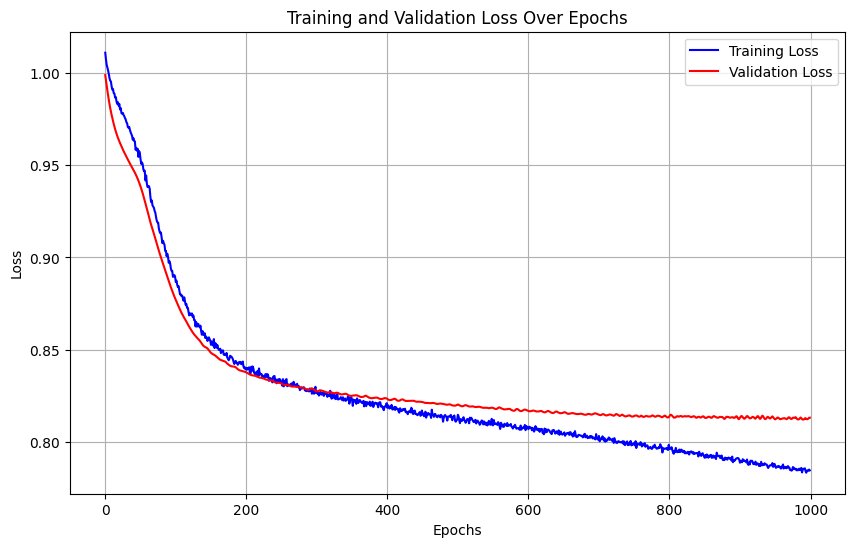

Training run 2/50 for 1% of the data...
Sample size for 1%: 1997


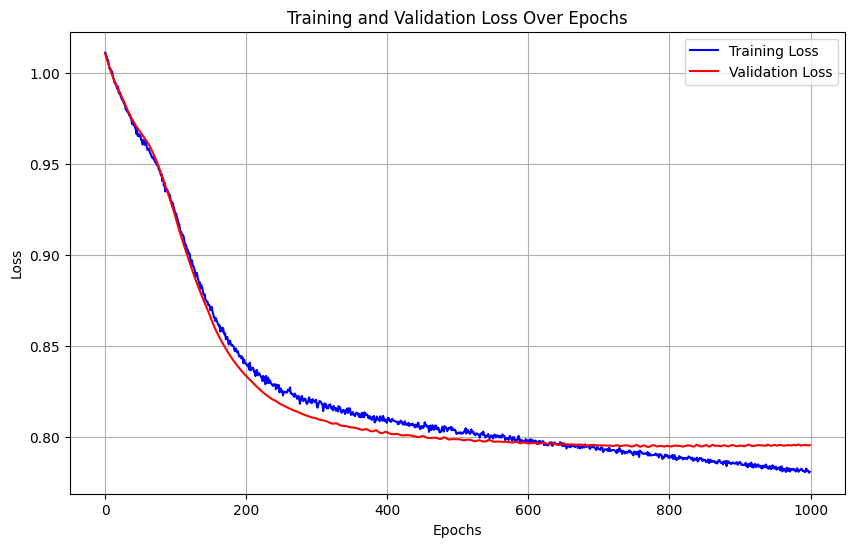

Training run 3/50 for 1% of the data...
Sample size for 1%: 1997


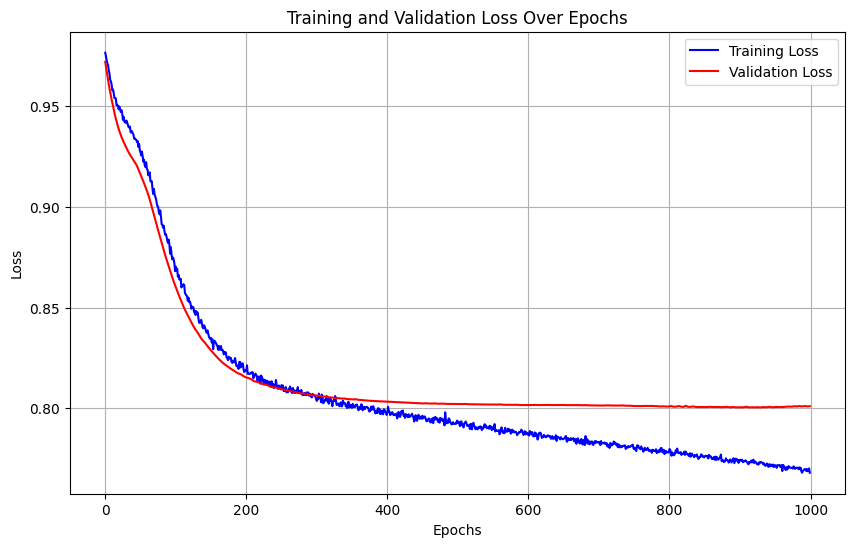

Training run 4/50 for 1% of the data...
Sample size for 1%: 1997


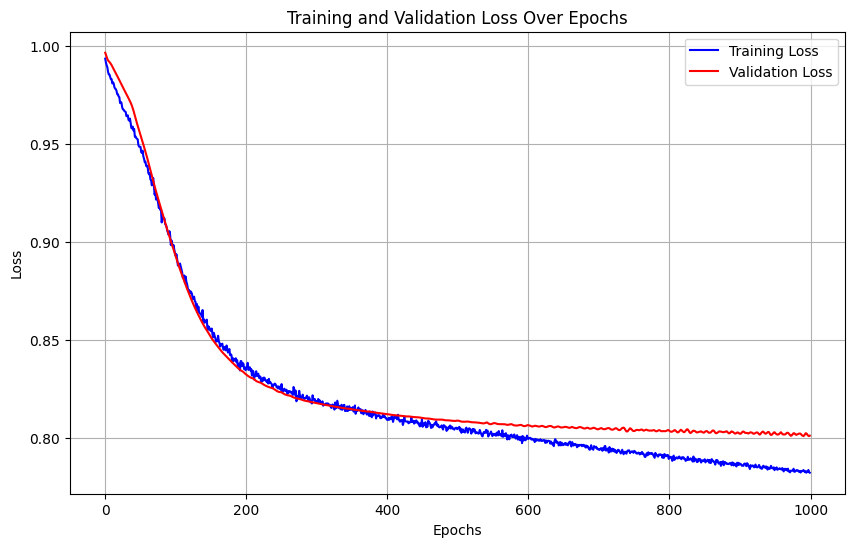

Training run 5/50 for 1% of the data...
Sample size for 1%: 1997


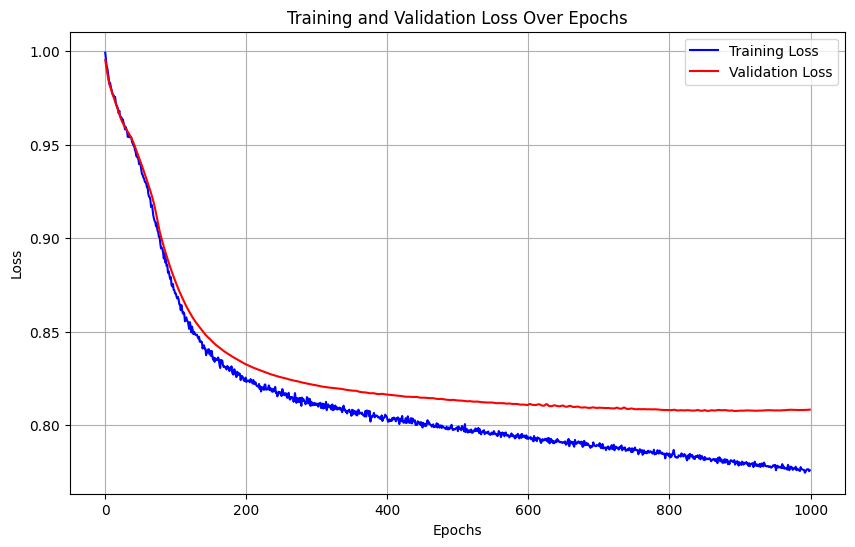

Training run 6/50 for 1% of the data...
Sample size for 1%: 1997


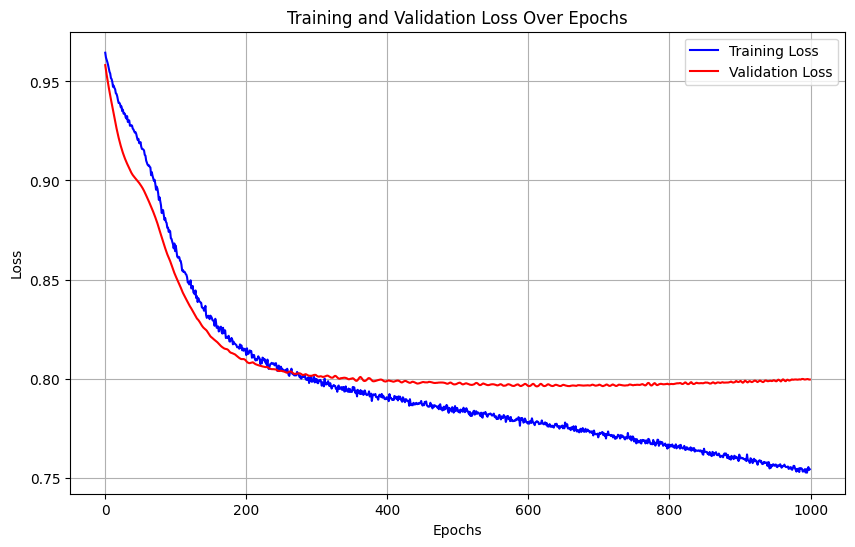

Training run 7/50 for 1% of the data...
Sample size for 1%: 1997


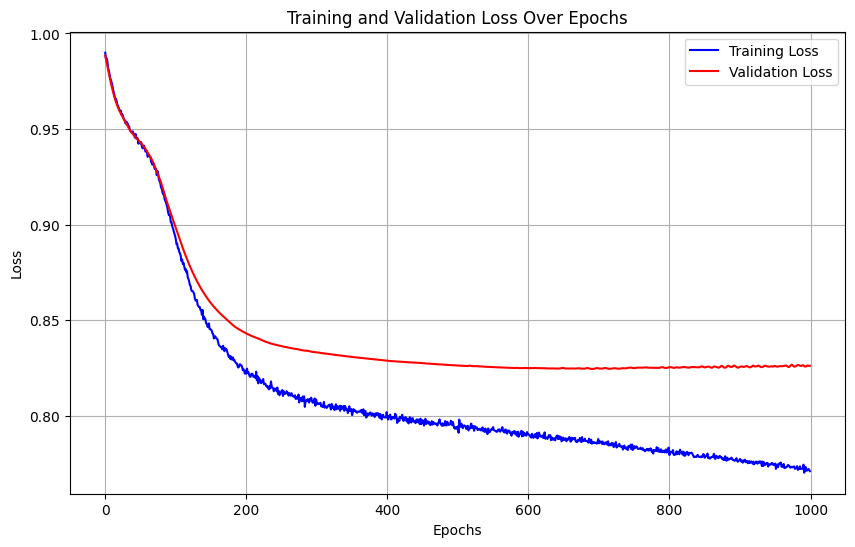

Training run 8/50 for 1% of the data...
Sample size for 1%: 1997


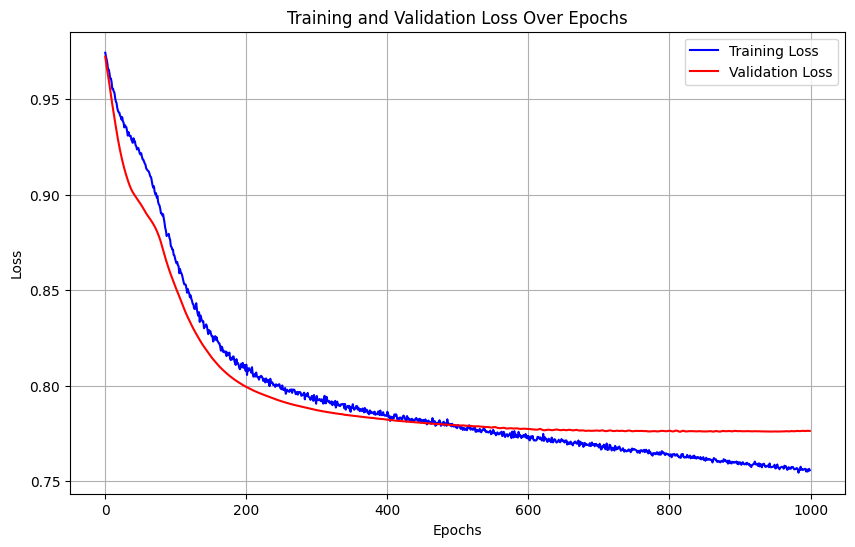

Training run 9/50 for 1% of the data...
Sample size for 1%: 1997


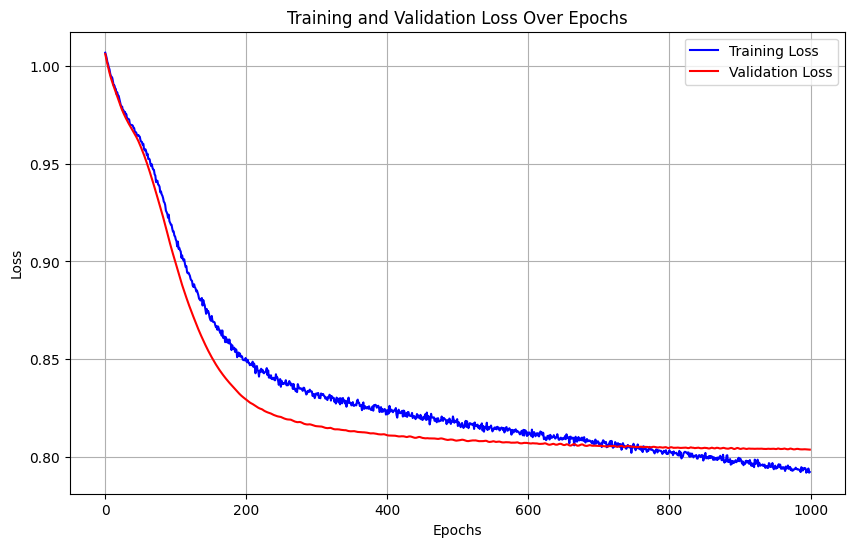

Training run 10/50 for 1% of the data...
Sample size for 1%: 1997


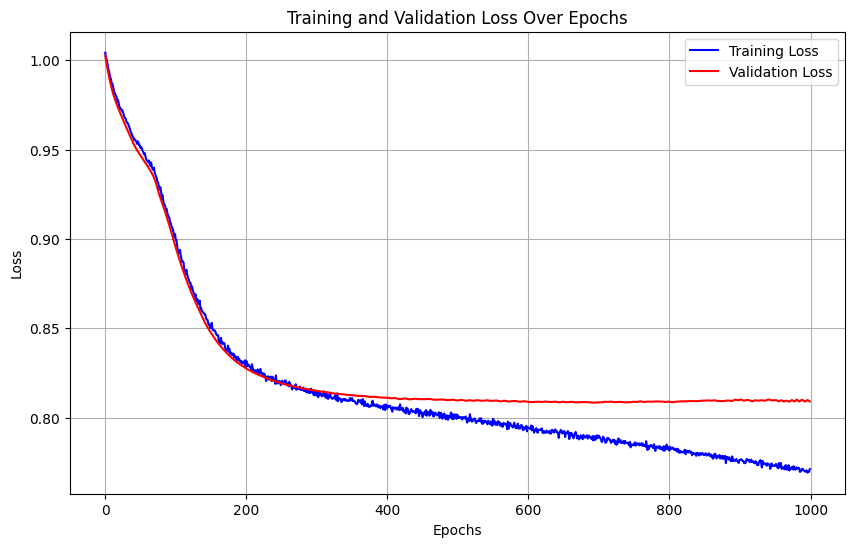

Training run 11/50 for 1% of the data...
Sample size for 1%: 1997


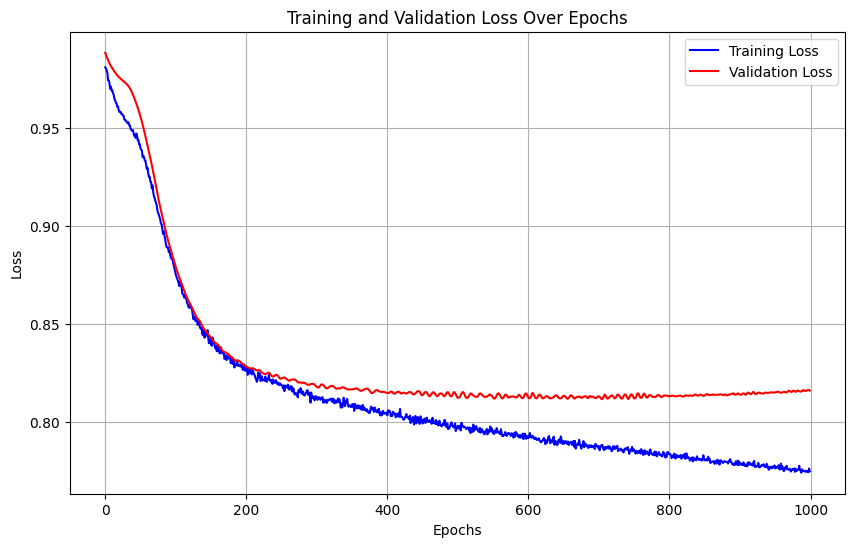

Training run 12/50 for 1% of the data...
Sample size for 1%: 1997


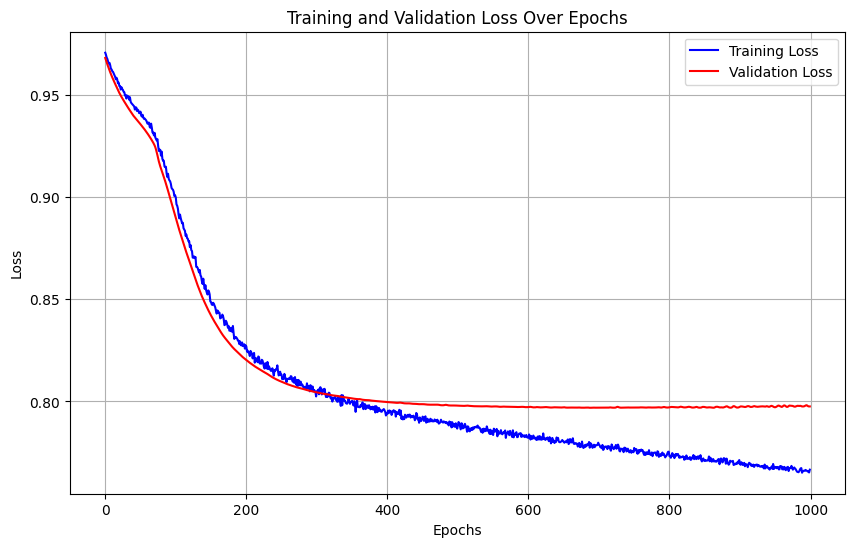

Training run 13/50 for 1% of the data...
Sample size for 1%: 1997


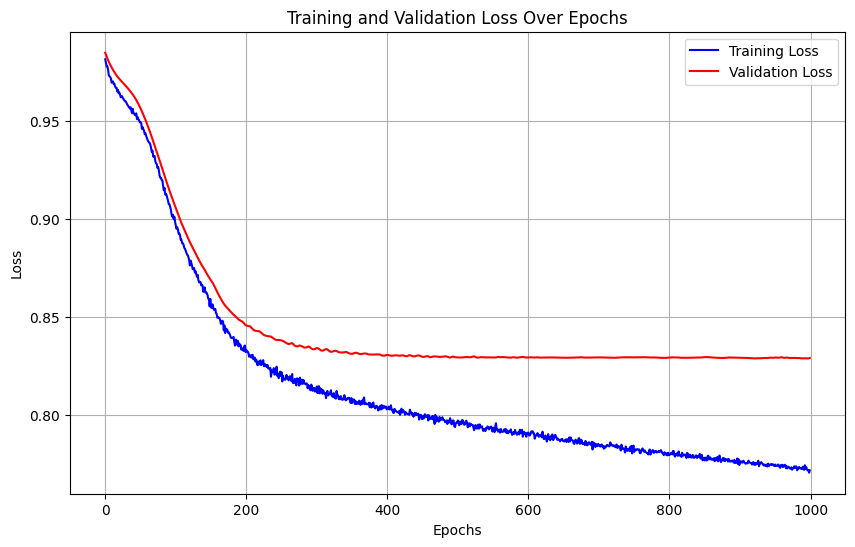

Training run 14/50 for 1% of the data...
Sample size for 1%: 1997


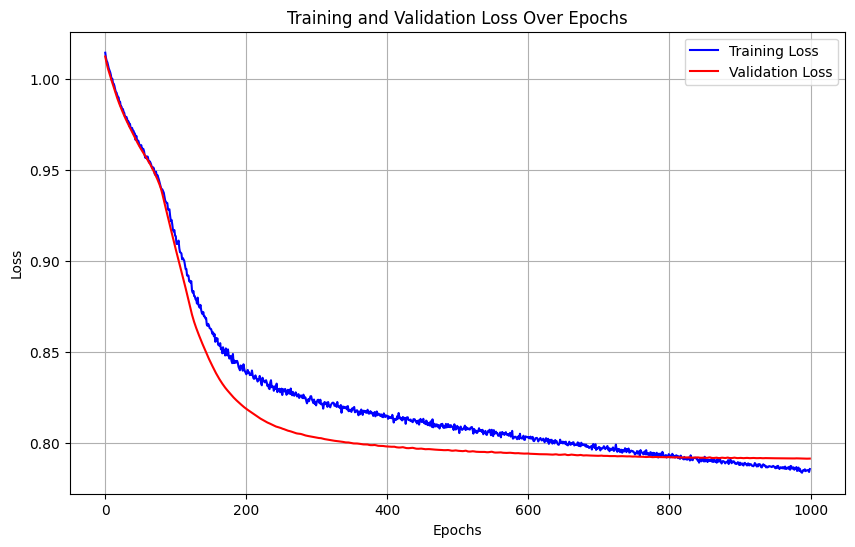

Training run 15/50 for 1% of the data...
Sample size for 1%: 1997


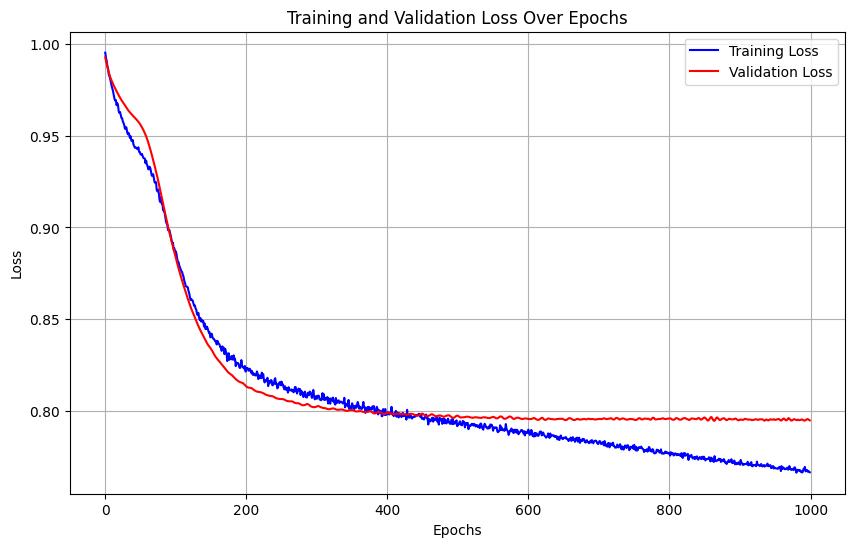

Training run 16/50 for 1% of the data...
Sample size for 1%: 1997


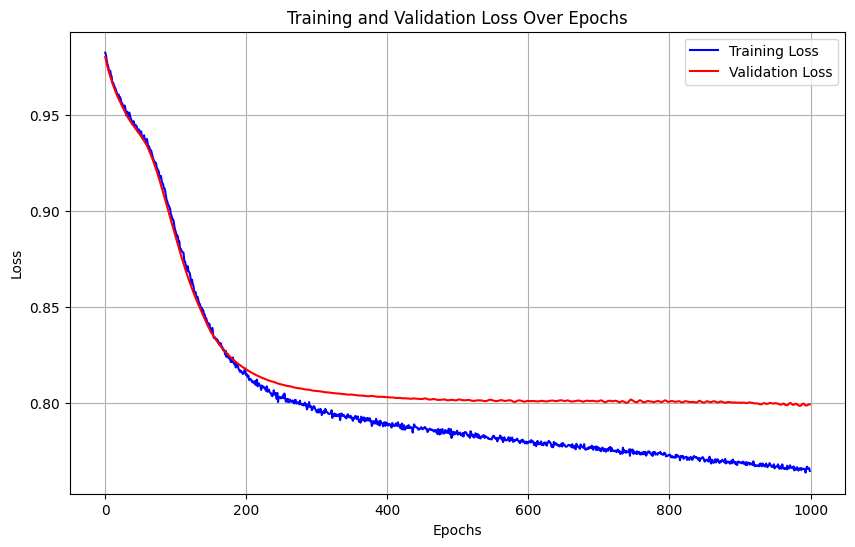

Training run 17/50 for 1% of the data...
Sample size for 1%: 1997


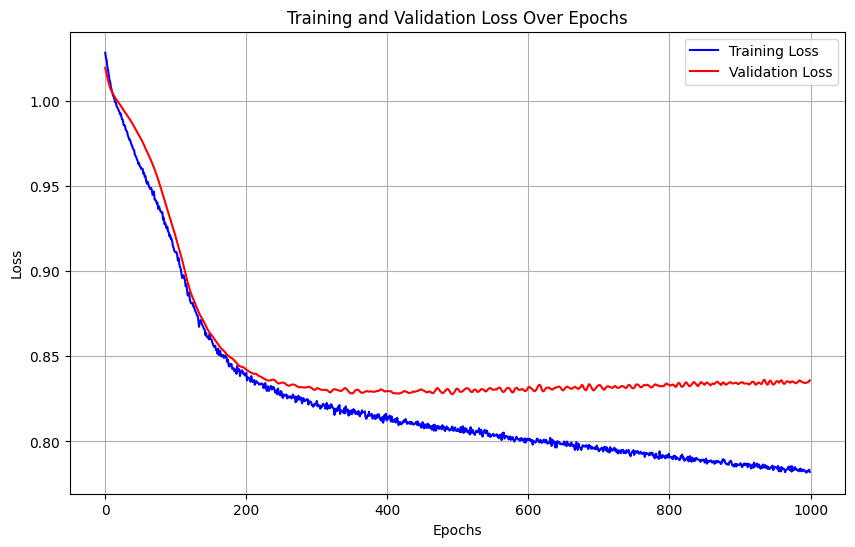

Training run 18/50 for 1% of the data...
Sample size for 1%: 1997


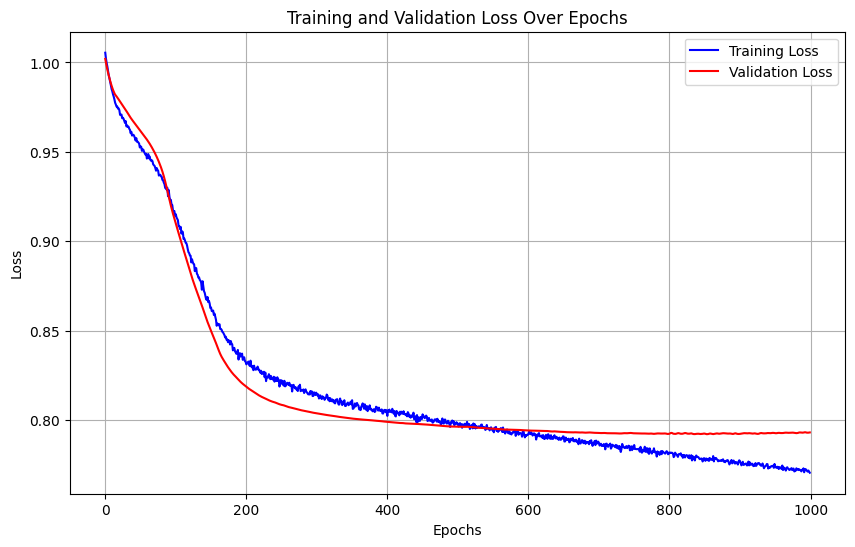

Training run 19/50 for 1% of the data...
Sample size for 1%: 1997


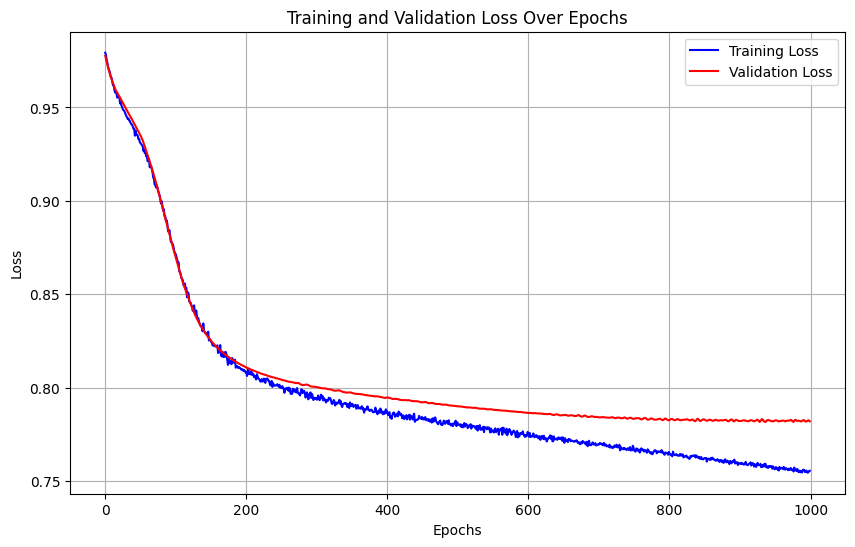

Training run 20/50 for 1% of the data...
Sample size for 1%: 1997


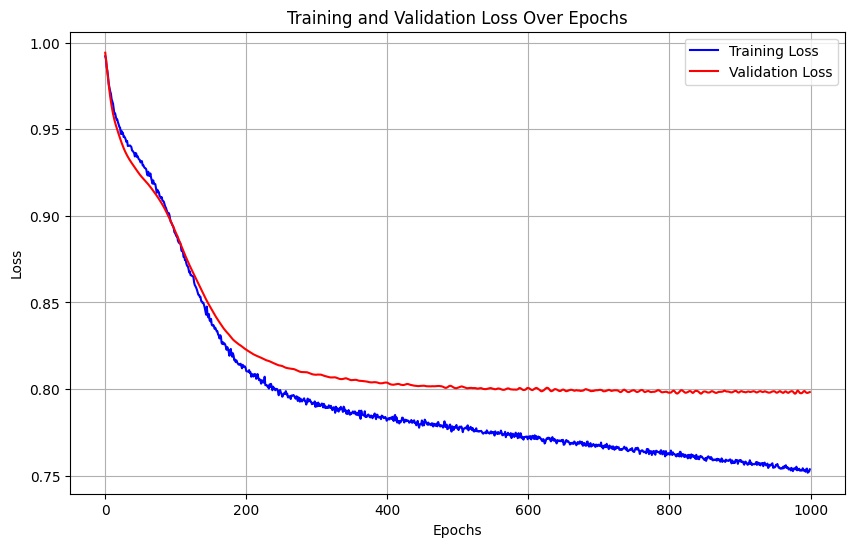

Training run 21/50 for 1% of the data...
Sample size for 1%: 1997


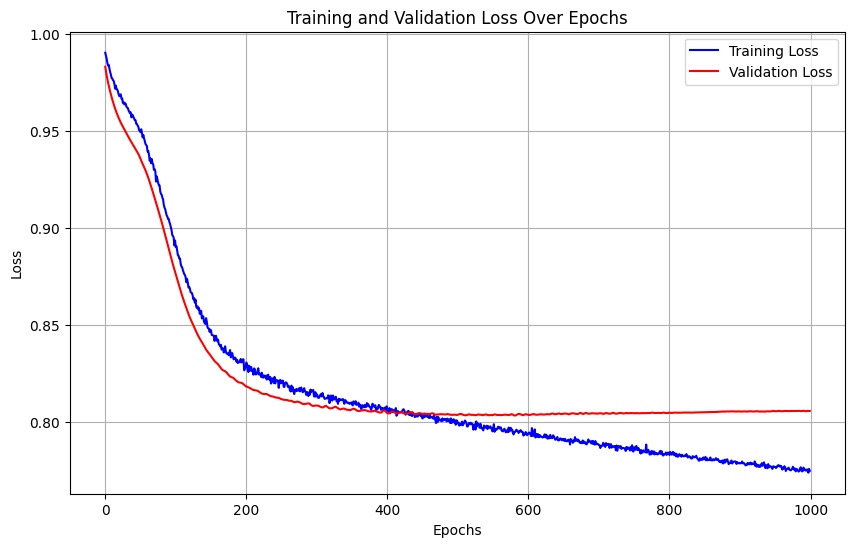

Training run 22/50 for 1% of the data...
Sample size for 1%: 1997


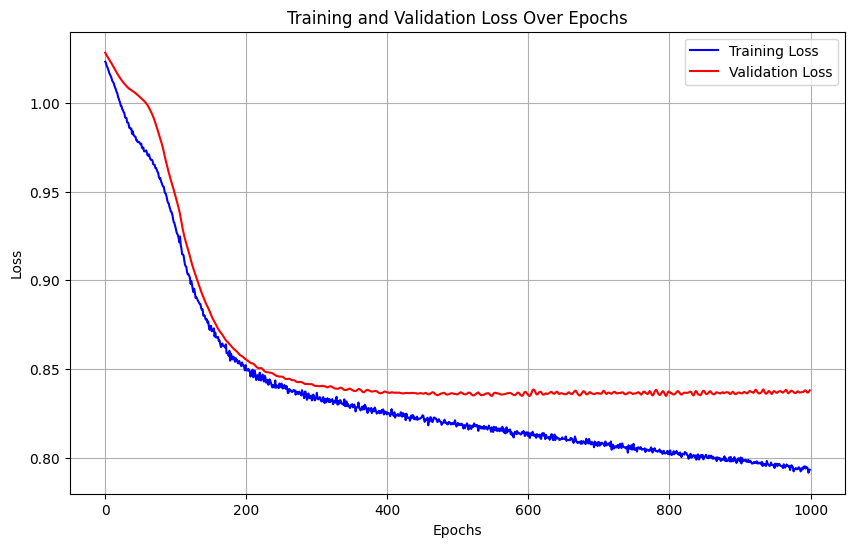

Training run 23/50 for 1% of the data...
Sample size for 1%: 1997


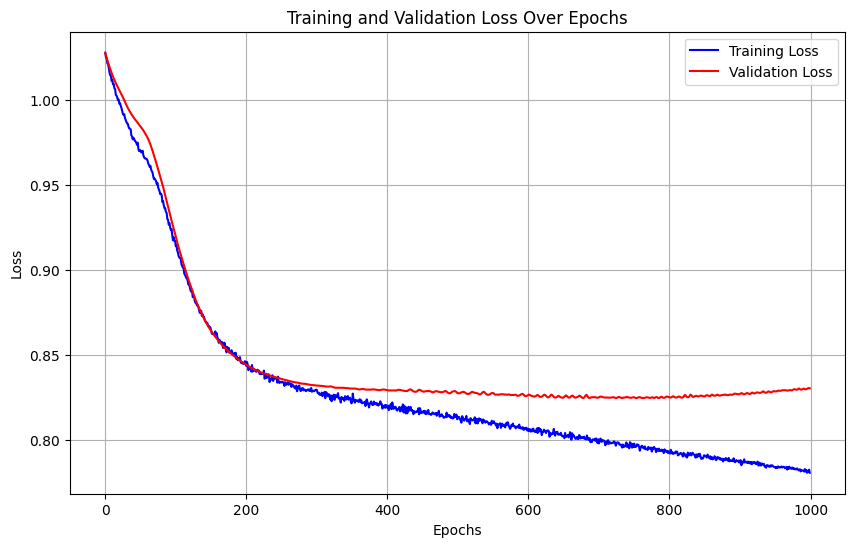

Training run 24/50 for 1% of the data...
Sample size for 1%: 1997


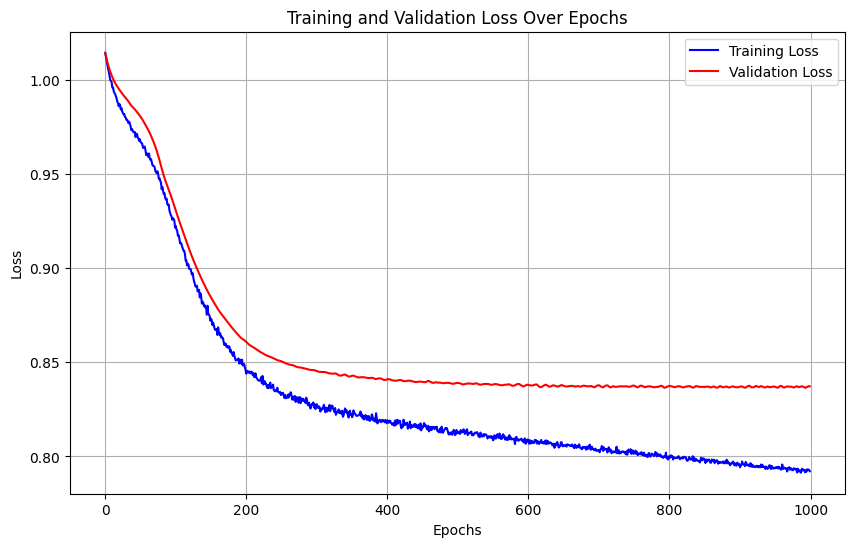

Training run 25/50 for 1% of the data...
Sample size for 1%: 1997


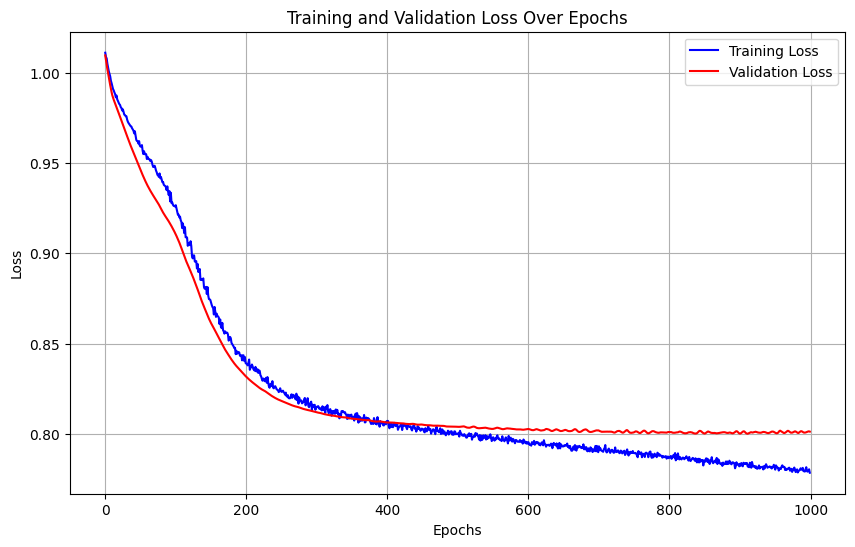

Training run 26/50 for 1% of the data...
Sample size for 1%: 1997


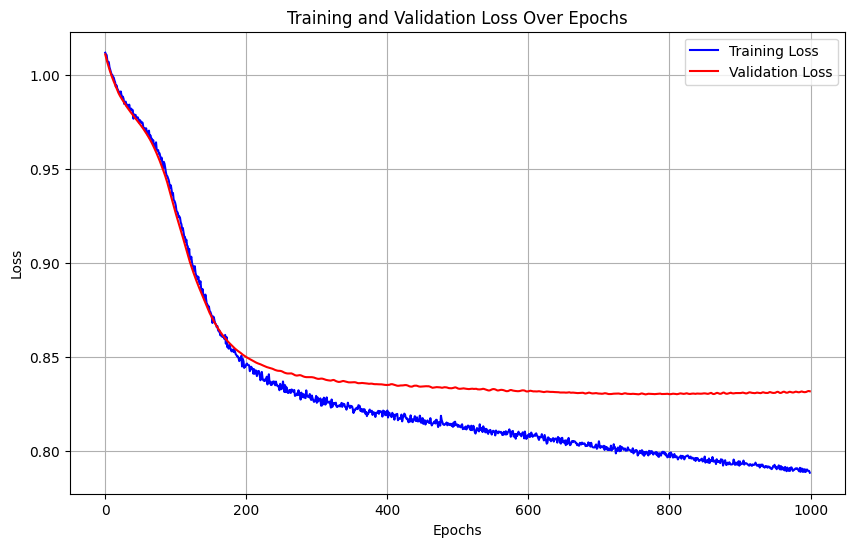

Training run 27/50 for 1% of the data...
Sample size for 1%: 1997


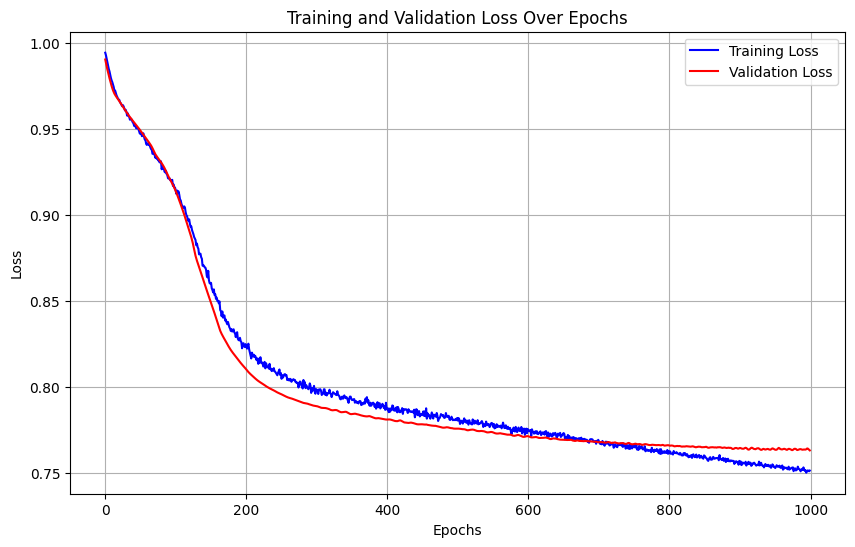

Training run 28/50 for 1% of the data...
Sample size for 1%: 1997


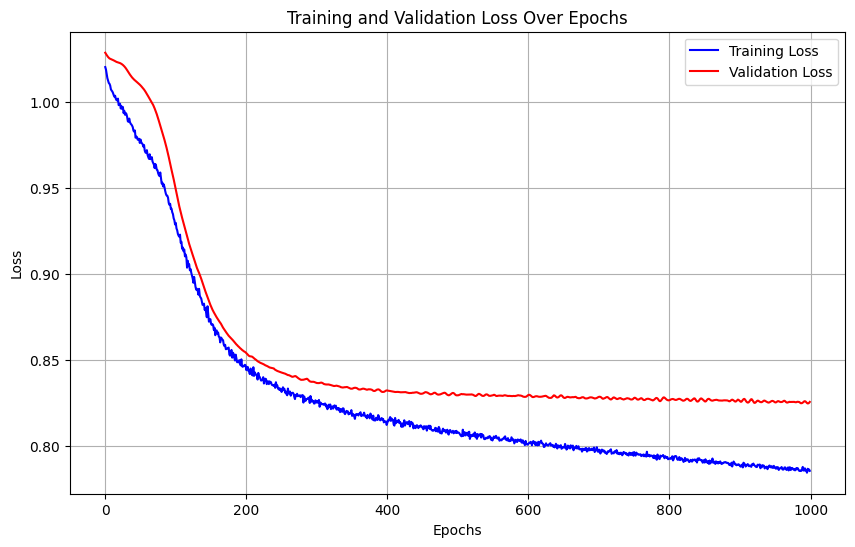

Training run 29/50 for 1% of the data...
Sample size for 1%: 1997


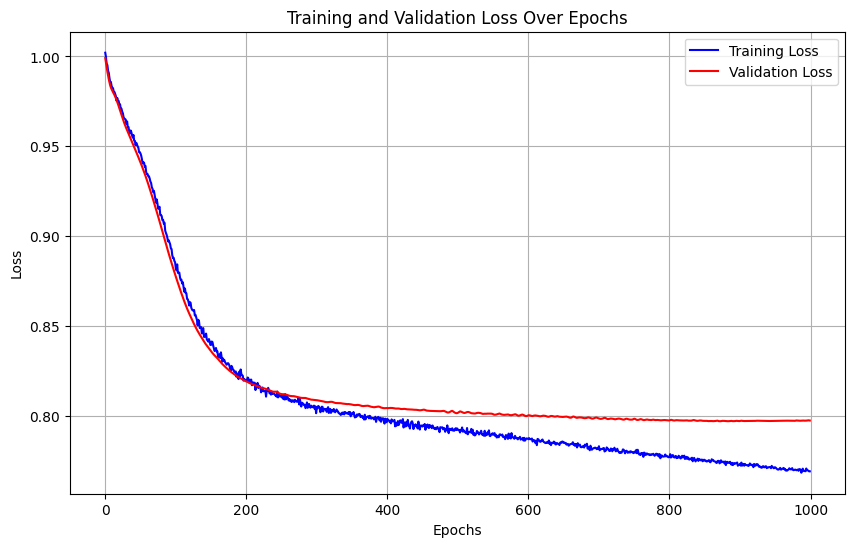

Training run 30/50 for 1% of the data...
Sample size for 1%: 1997


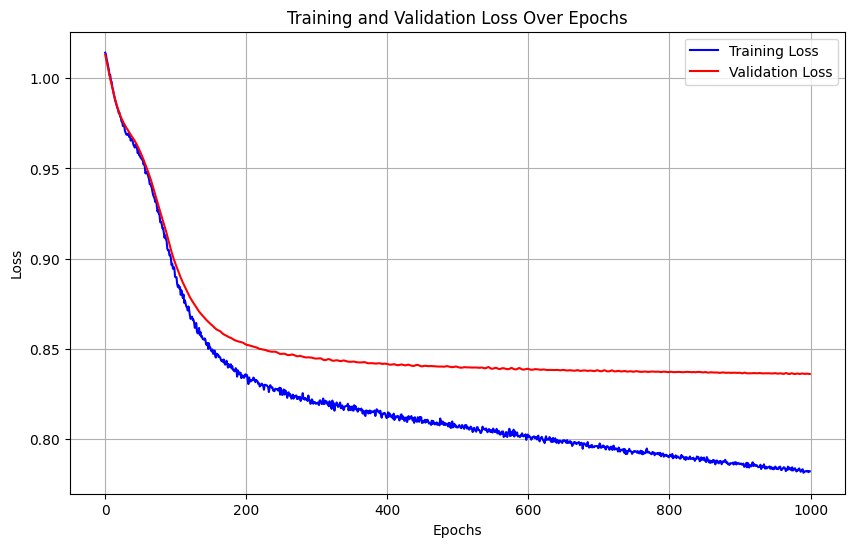

Training run 31/50 for 1% of the data...
Sample size for 1%: 1997


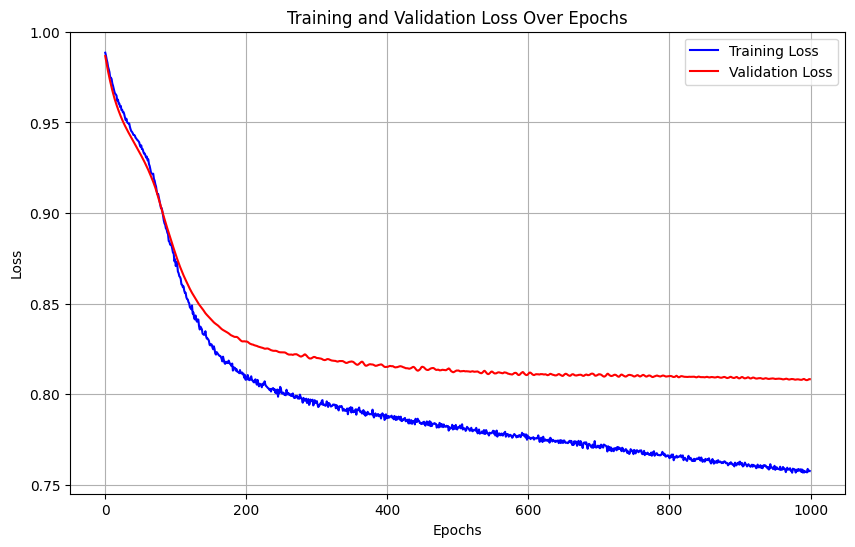

Training run 32/50 for 1% of the data...
Sample size for 1%: 1997


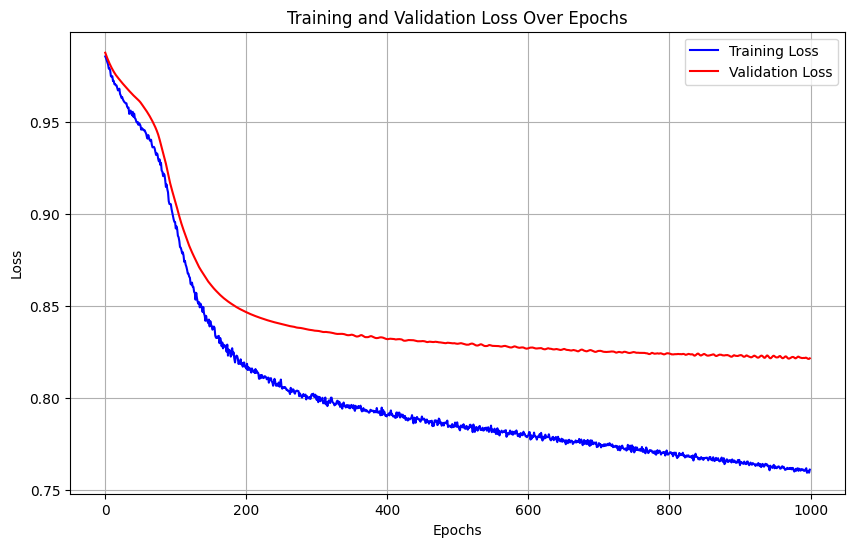

Training run 33/50 for 1% of the data...
Sample size for 1%: 1997


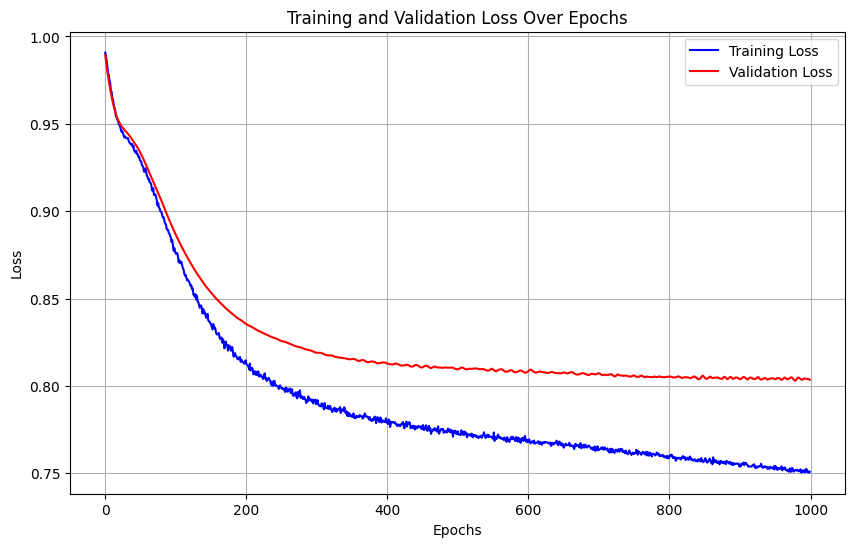

Training run 34/50 for 1% of the data...
Sample size for 1%: 1997


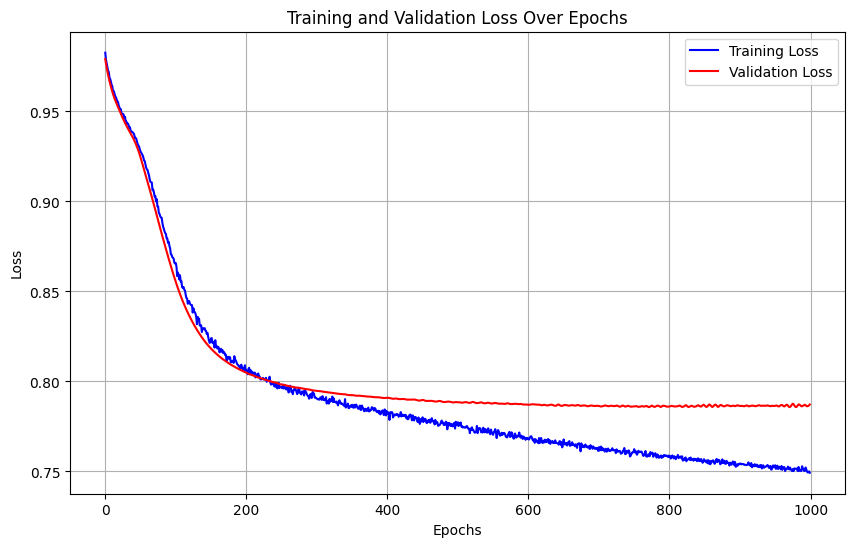

Training run 35/50 for 1% of the data...
Sample size for 1%: 1997


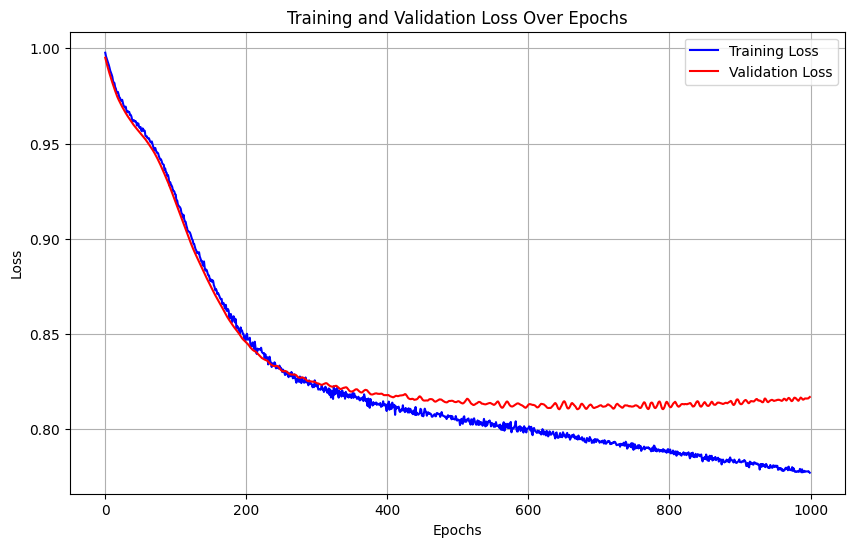

Training run 36/50 for 1% of the data...
Sample size for 1%: 1997


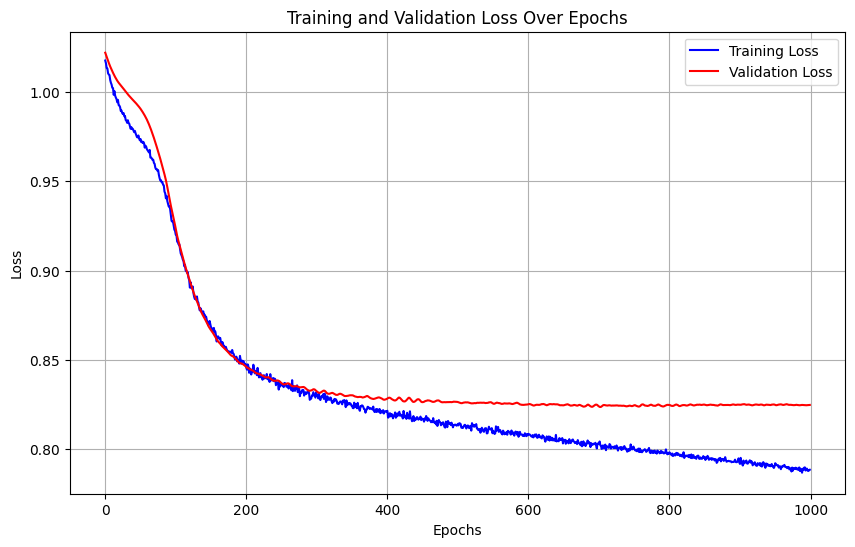

Training run 37/50 for 1% of the data...
Sample size for 1%: 1997


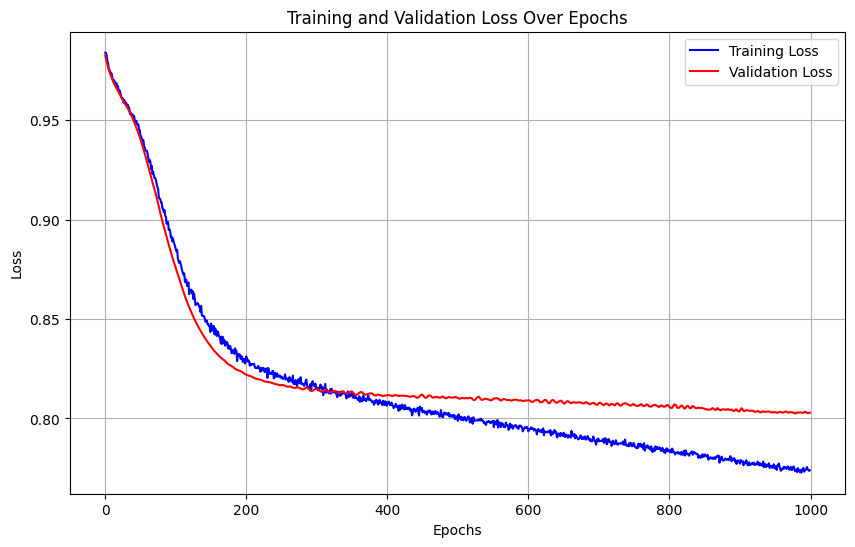

Training run 38/50 for 1% of the data...
Sample size for 1%: 1997


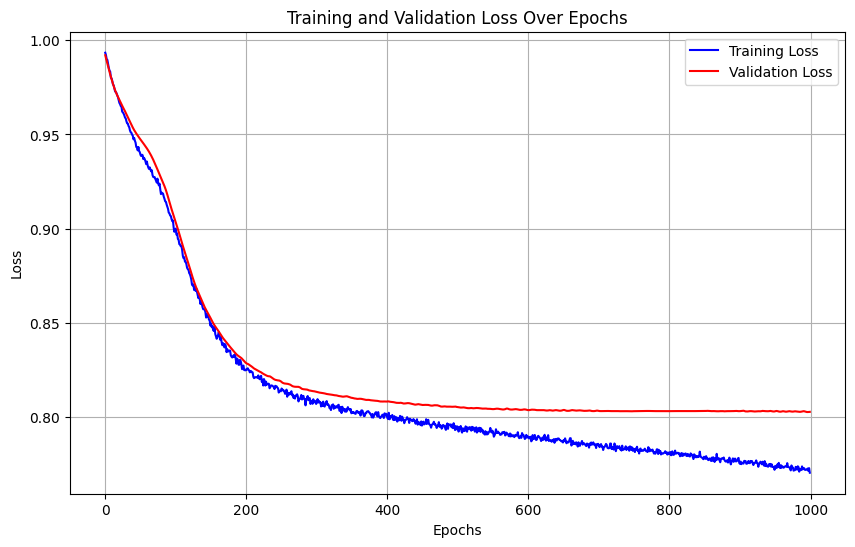

Training run 39/50 for 1% of the data...
Sample size for 1%: 1997


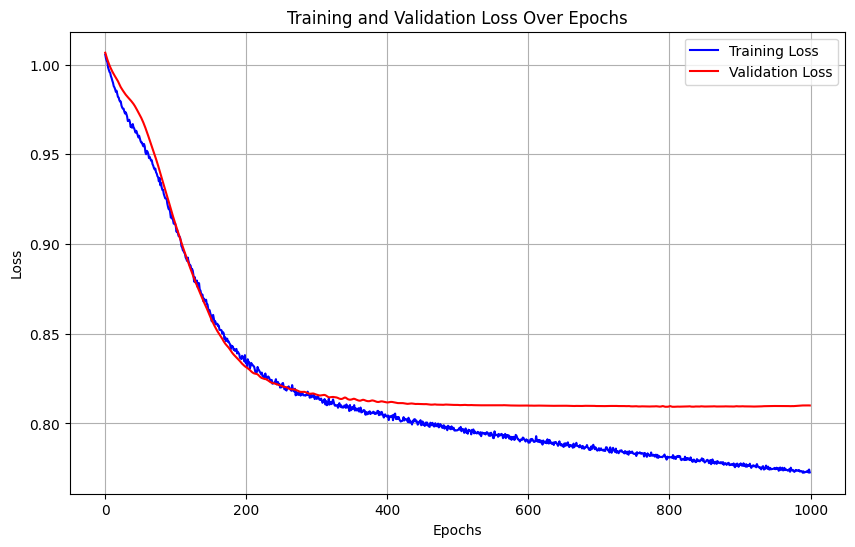

Training run 40/50 for 1% of the data...
Sample size for 1%: 1997


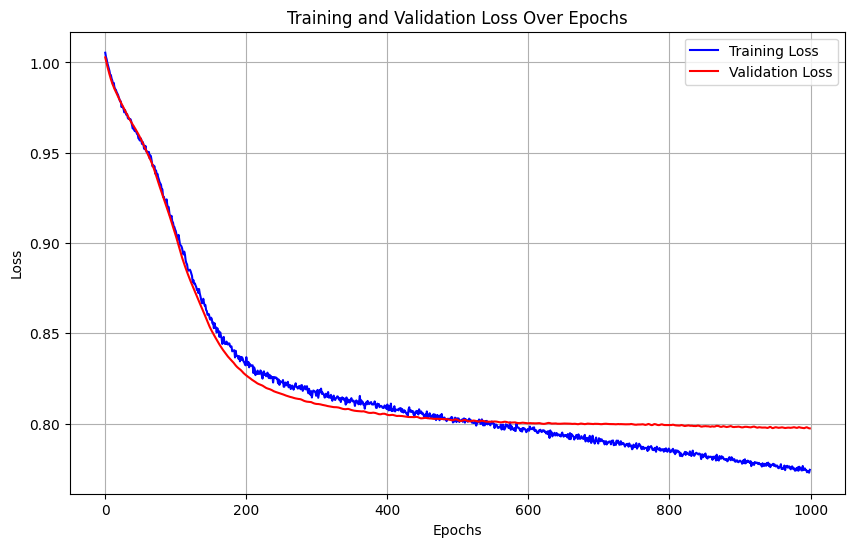

Training run 41/50 for 1% of the data...
Sample size for 1%: 1997


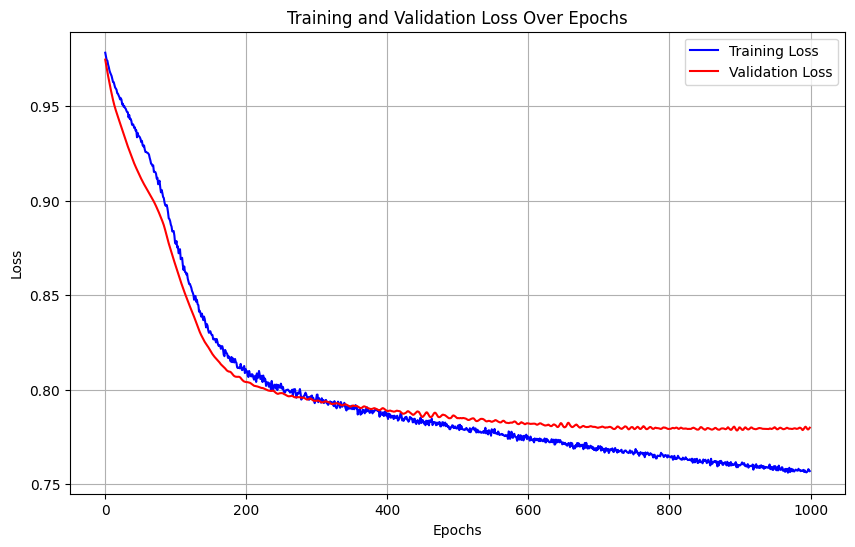

Training run 42/50 for 1% of the data...
Sample size for 1%: 1997


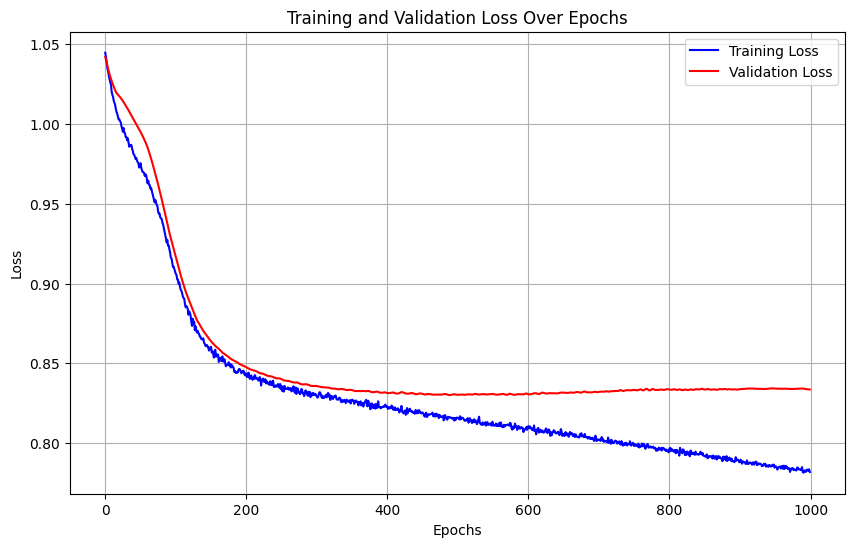

Training run 43/50 for 1% of the data...
Sample size for 1%: 1997


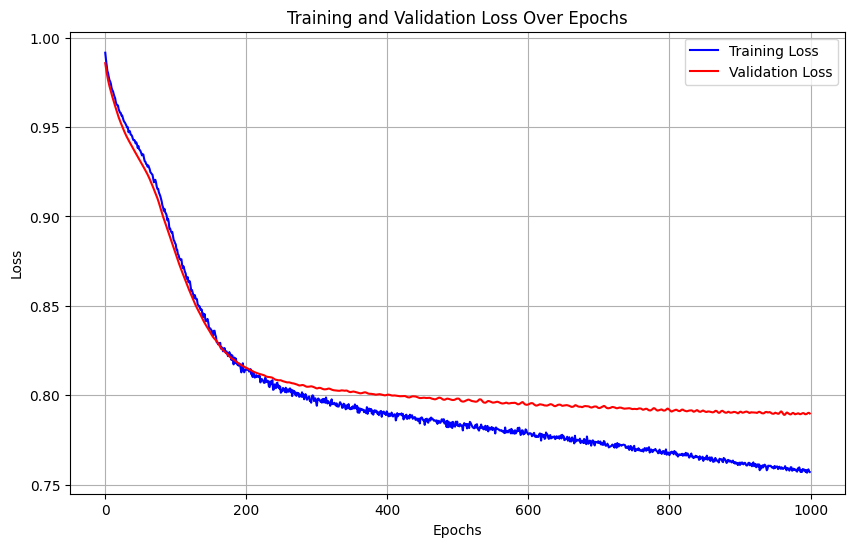

Training run 44/50 for 1% of the data...
Sample size for 1%: 1997


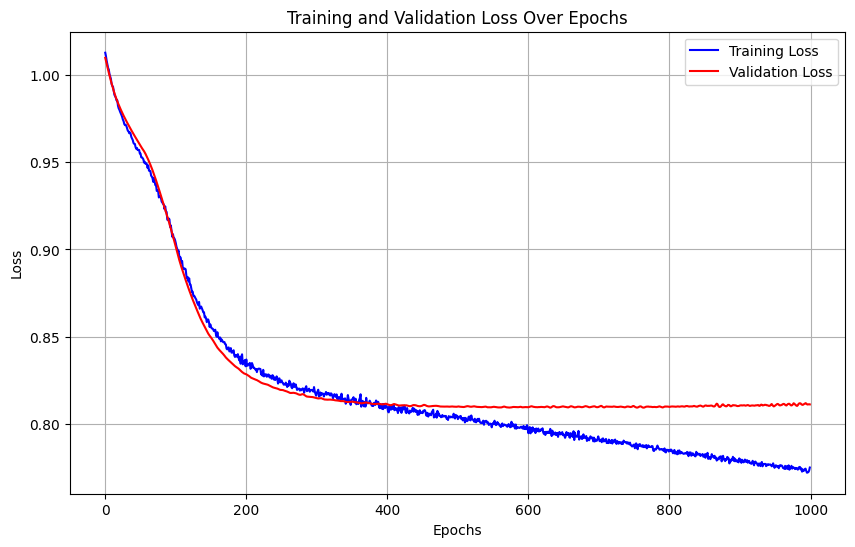

Training run 45/50 for 1% of the data...
Sample size for 1%: 1997


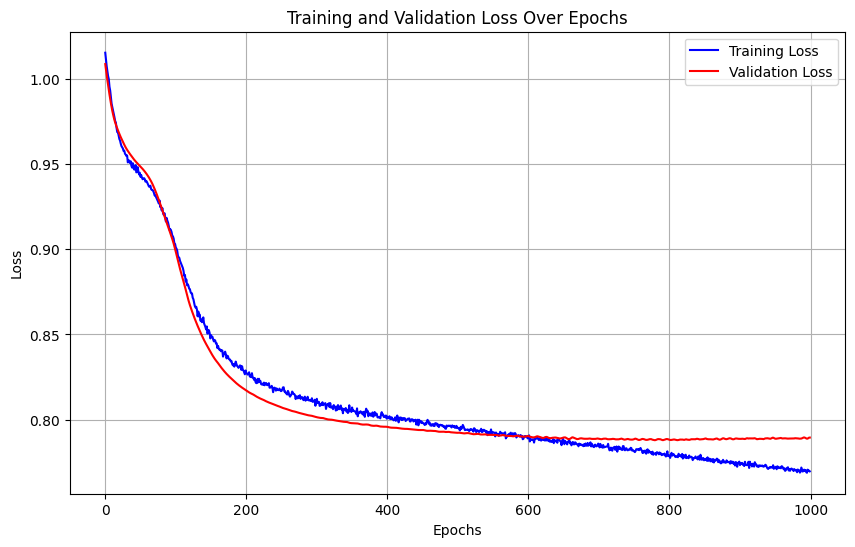

Training run 46/50 for 1% of the data...
Sample size for 1%: 1997


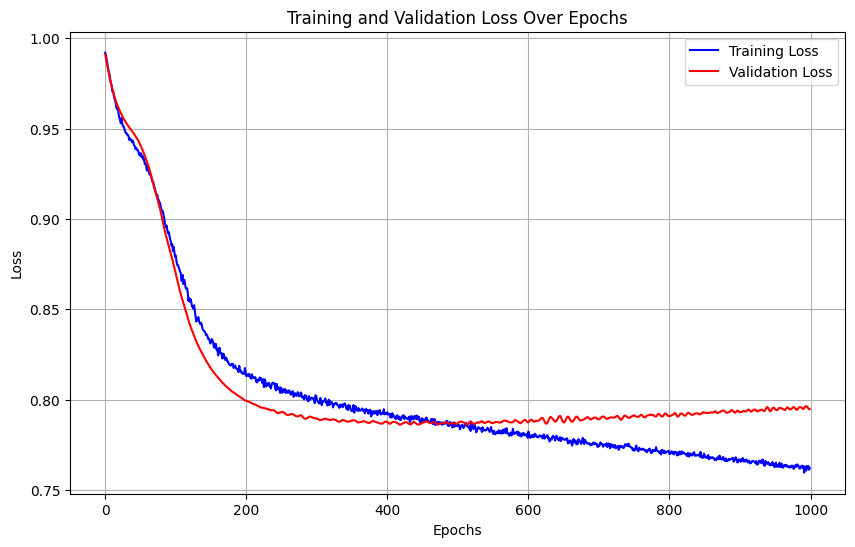

Training run 47/50 for 1% of the data...
Sample size for 1%: 1997


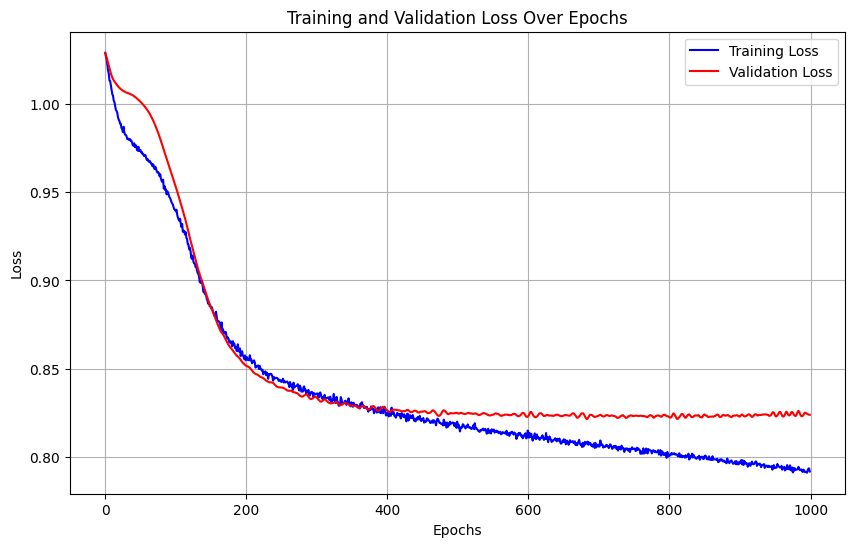

Training run 48/50 for 1% of the data...
Sample size for 1%: 1997


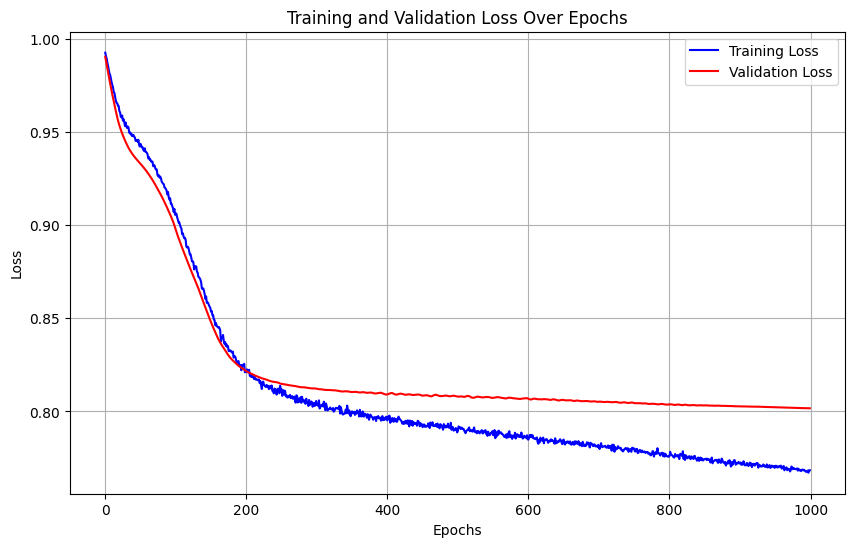

Training run 49/50 for 1% of the data...
Sample size for 1%: 1997


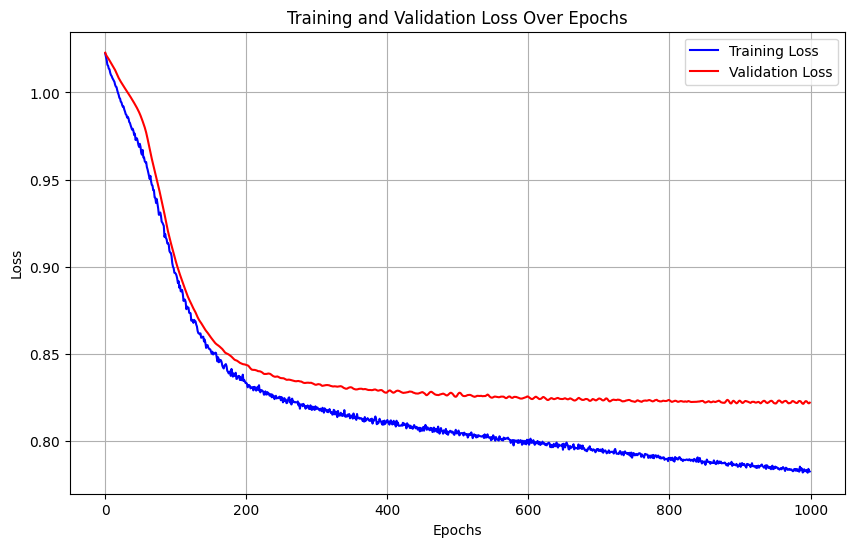

Training run 50/50 for 1% of the data...
Sample size for 1%: 1997


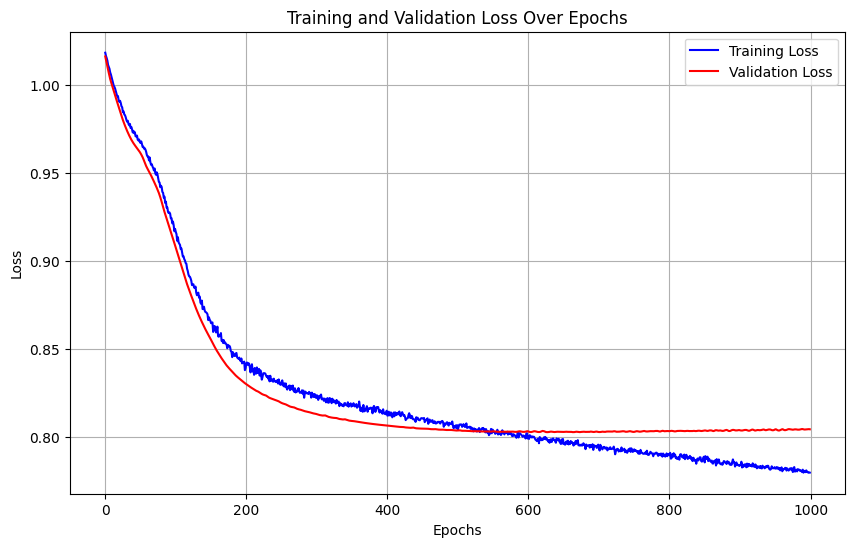

Metrics for 1% of data:
Final Metrics (Aggregated Predictions): {'accuracy': np.float64(0.8458500000000001), 'precision': np.float64(0.7701437657890244), 'recall': np.float64(0.7346276694945557), 'f1': np.float64(0.7508446160738045), 'fpr': np.float64(0.1025594972788632)}
Metrics Across Runs:
accuracy: 0.8459 ± 0.0165
precision: 0.7701 ± 0.0408
recall: 0.7346 ± 0.0403
f1: 0.7508 ± 0.0286
fpr: 0.1026 ± 0.0220
Training model for 5% of the data...
Training run 1/50 for 5% of the data...
Sample size for 5%: 9987


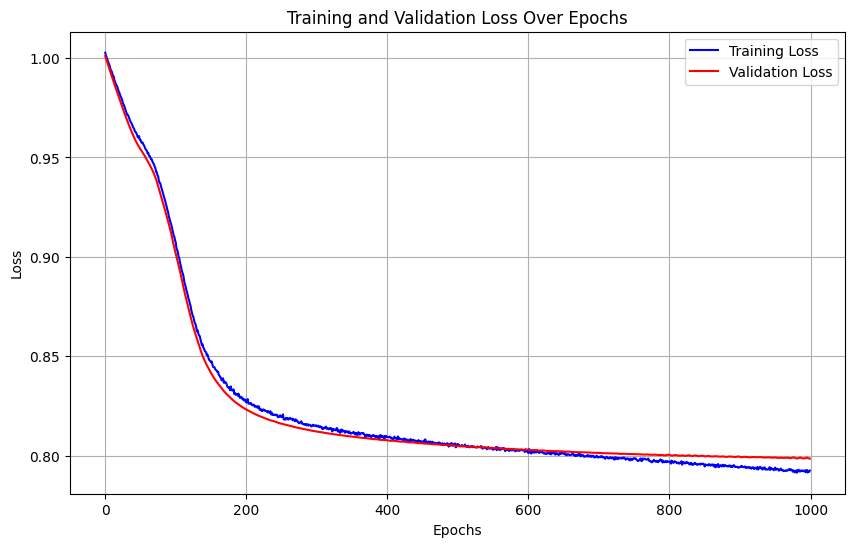

Training run 2/50 for 5% of the data...
Sample size for 5%: 9987


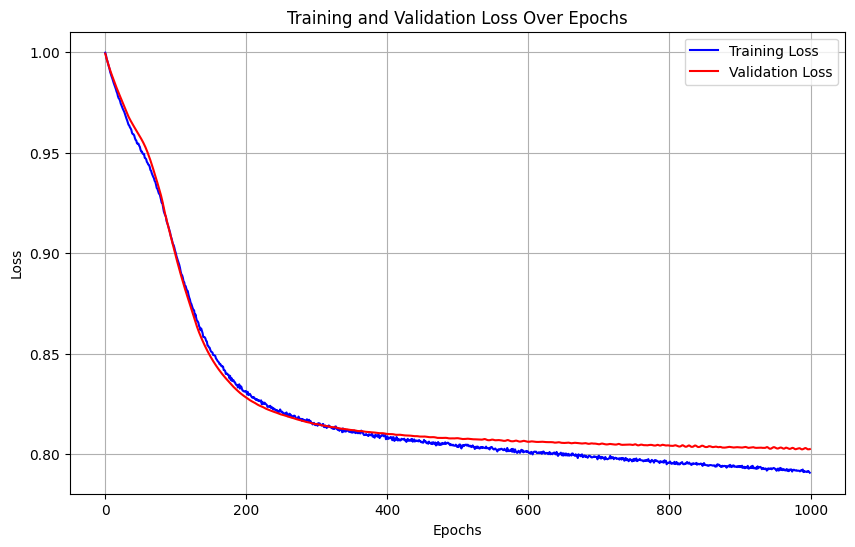

Training run 3/50 for 5% of the data...
Sample size for 5%: 9987


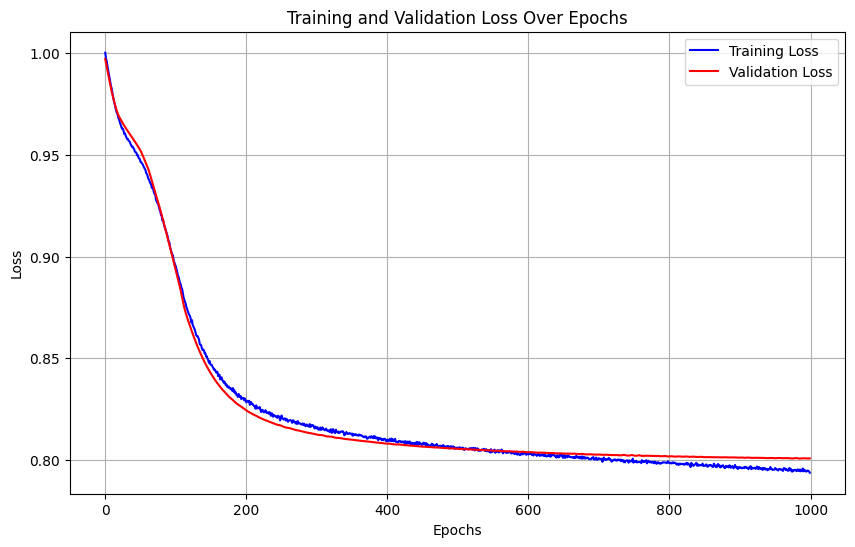

Training run 4/50 for 5% of the data...
Sample size for 5%: 9987


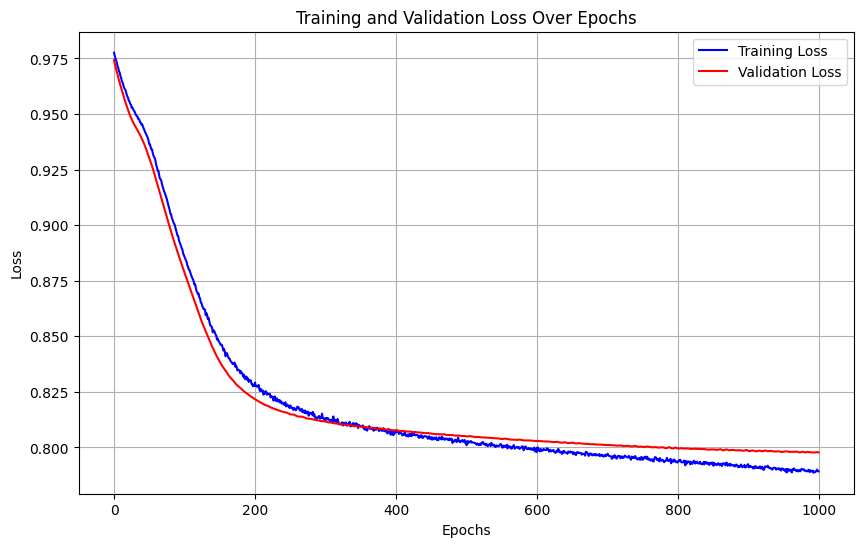

Training run 5/50 for 5% of the data...
Sample size for 5%: 9987


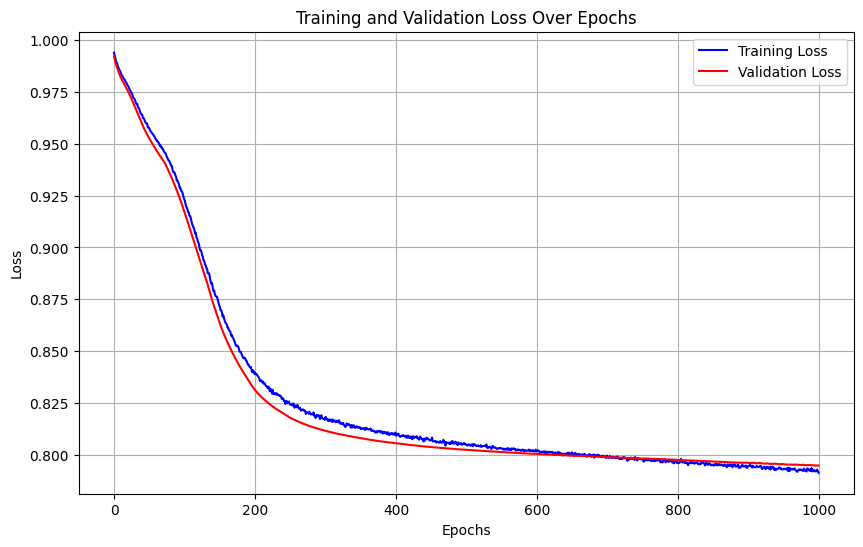

Training run 6/50 for 5% of the data...
Sample size for 5%: 9987


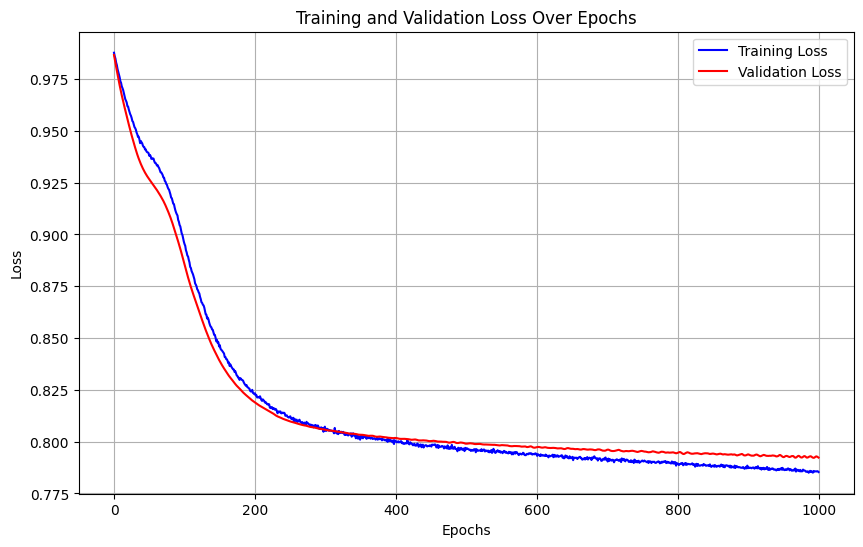

Training run 7/50 for 5% of the data...
Sample size for 5%: 9987


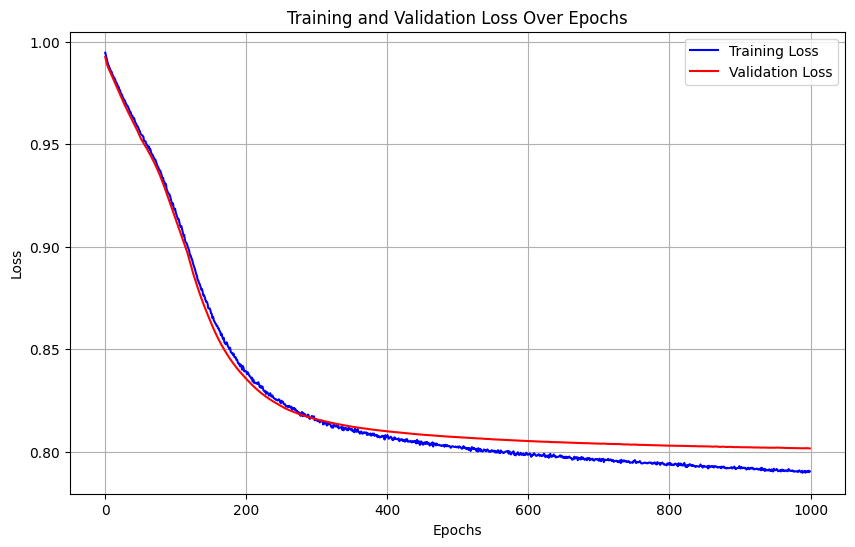

Training run 8/50 for 5% of the data...
Sample size for 5%: 9987


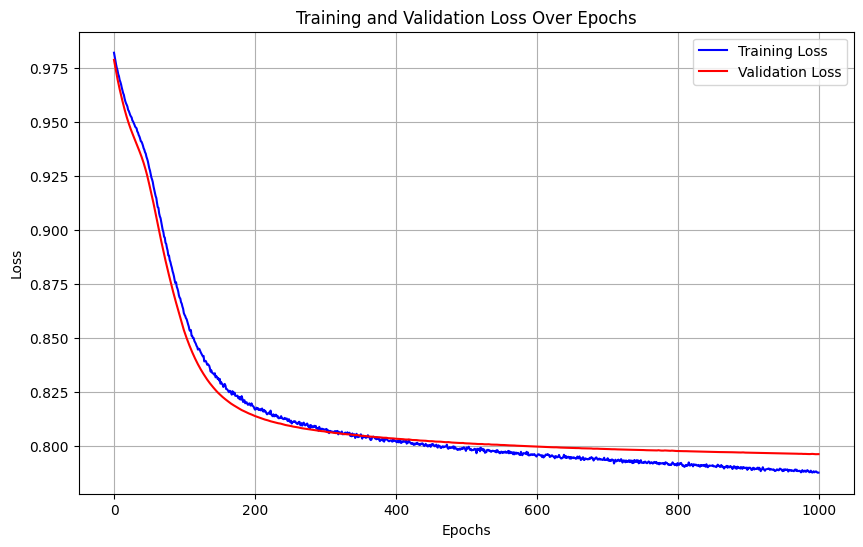

Training run 9/50 for 5% of the data...
Sample size for 5%: 9987


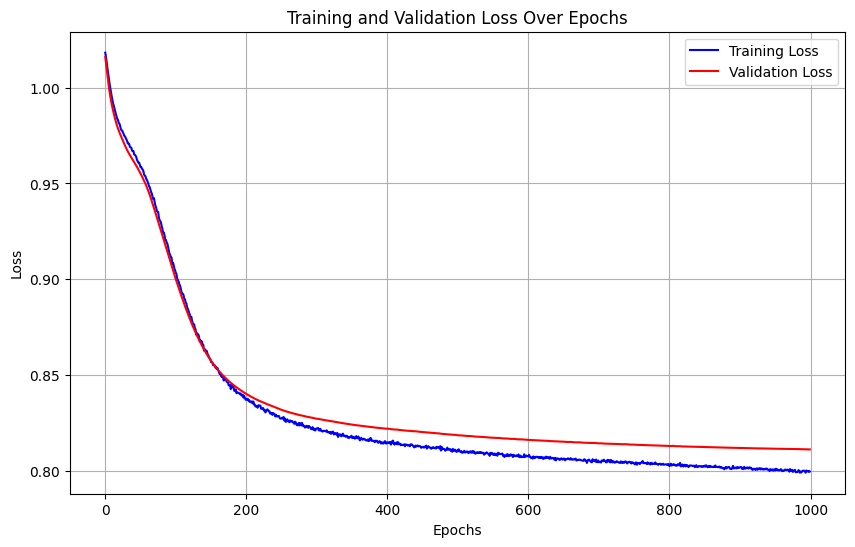

Training run 10/50 for 5% of the data...
Sample size for 5%: 9987


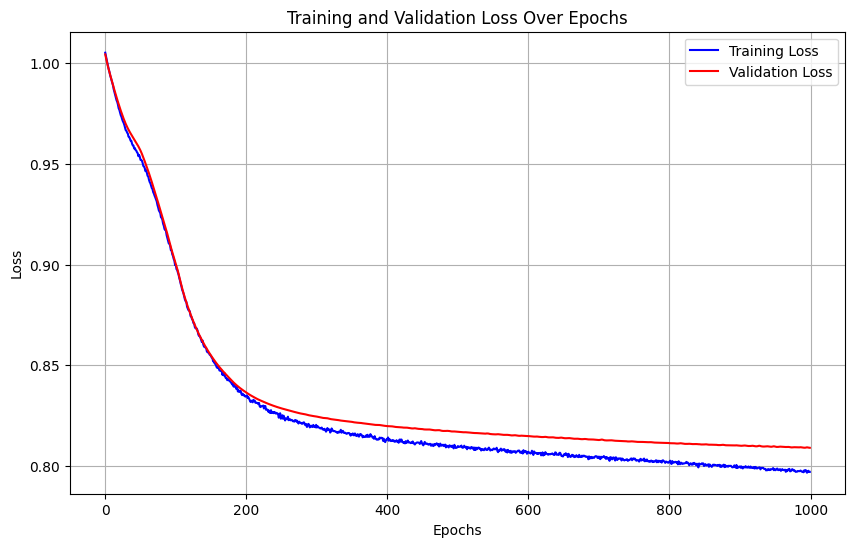

Training run 11/50 for 5% of the data...
Sample size for 5%: 9987


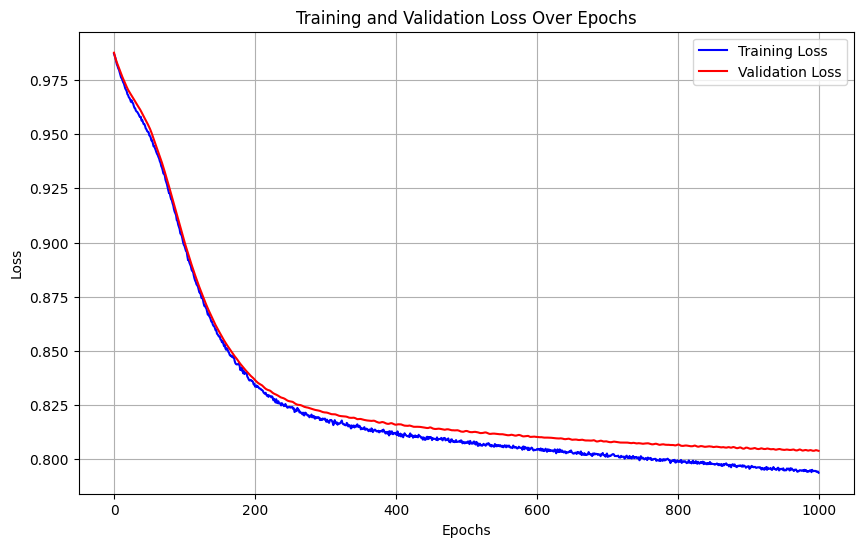

Training run 12/50 for 5% of the data...
Sample size for 5%: 9987


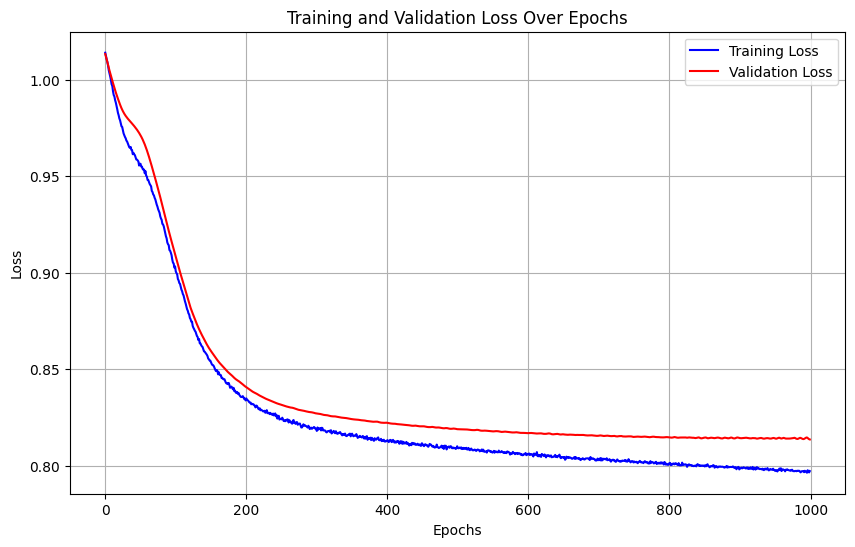

Training run 13/50 for 5% of the data...
Sample size for 5%: 9987


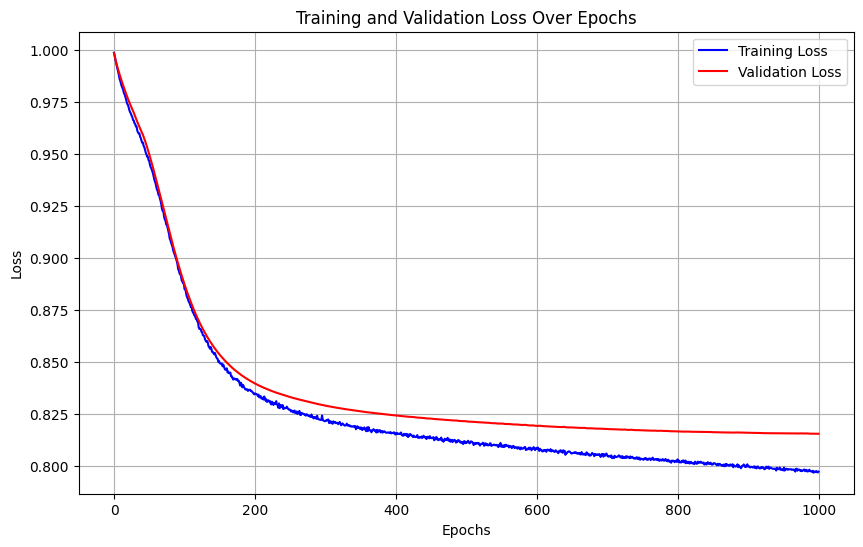

Training run 14/50 for 5% of the data...
Sample size for 5%: 9987


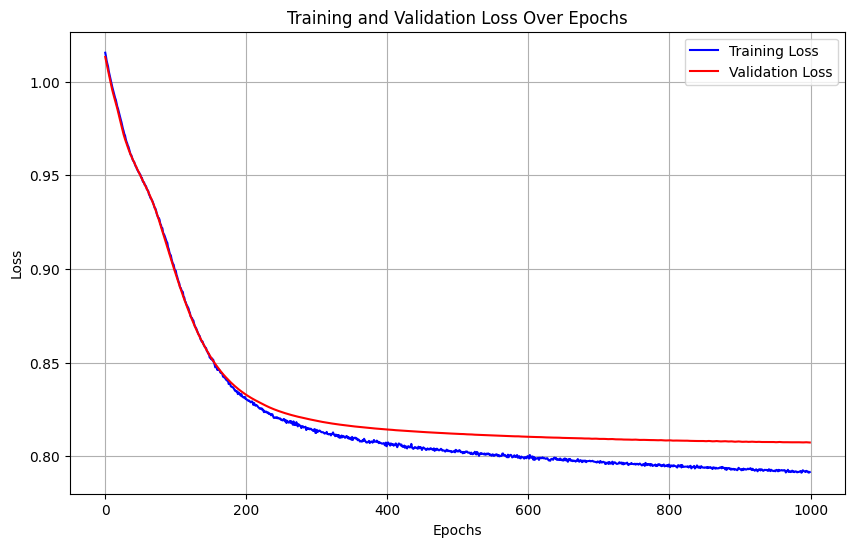

Training run 15/50 for 5% of the data...
Sample size for 5%: 9987


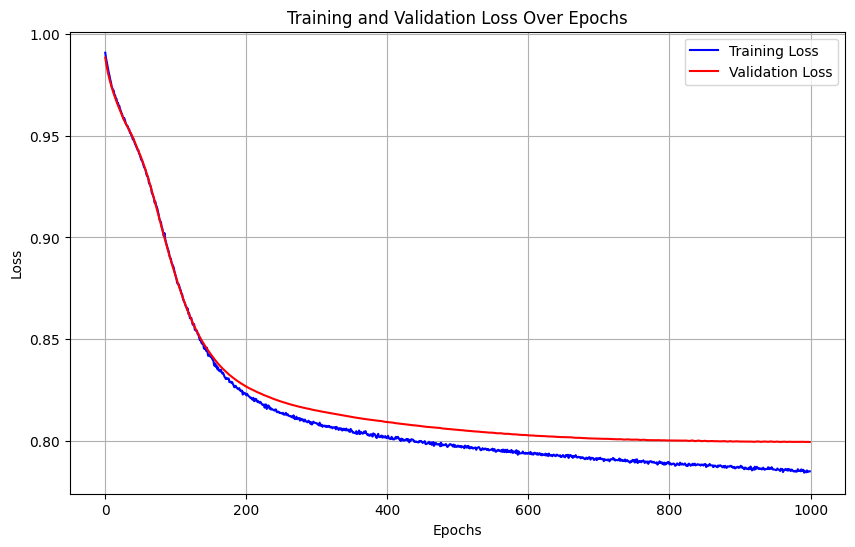

Training run 16/50 for 5% of the data...
Sample size for 5%: 9987


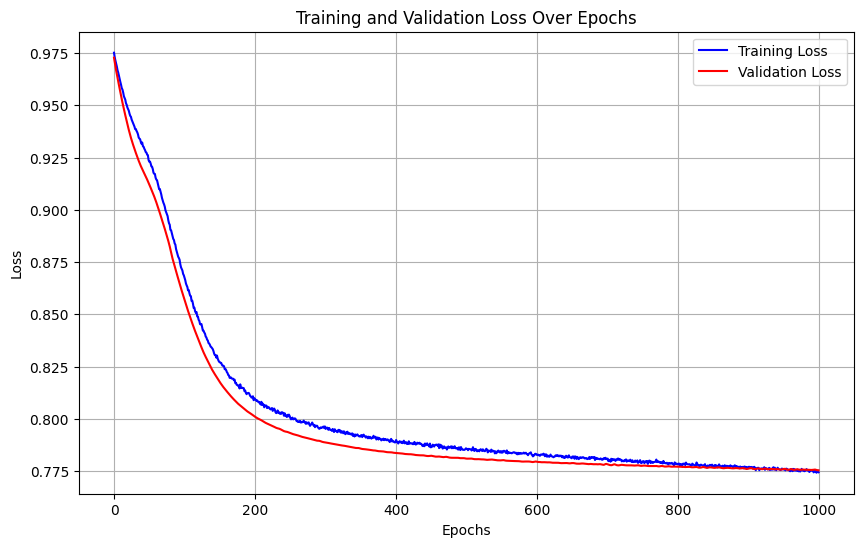

Training run 17/50 for 5% of the data...
Sample size for 5%: 9987


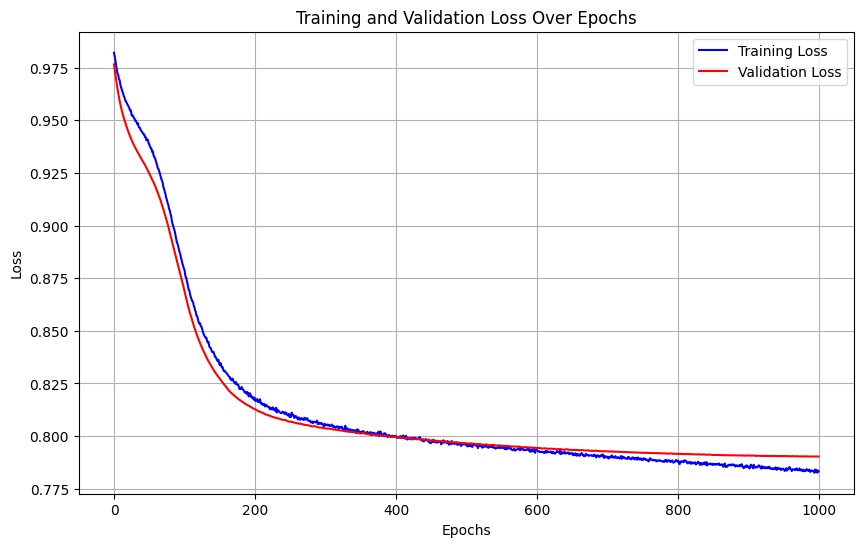

Training run 18/50 for 5% of the data...
Sample size for 5%: 9987


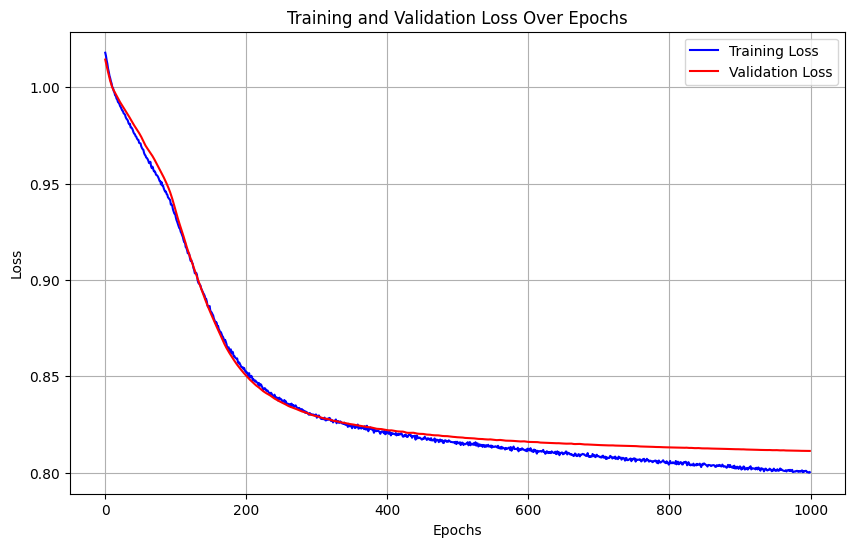

Training run 19/50 for 5% of the data...
Sample size for 5%: 9987


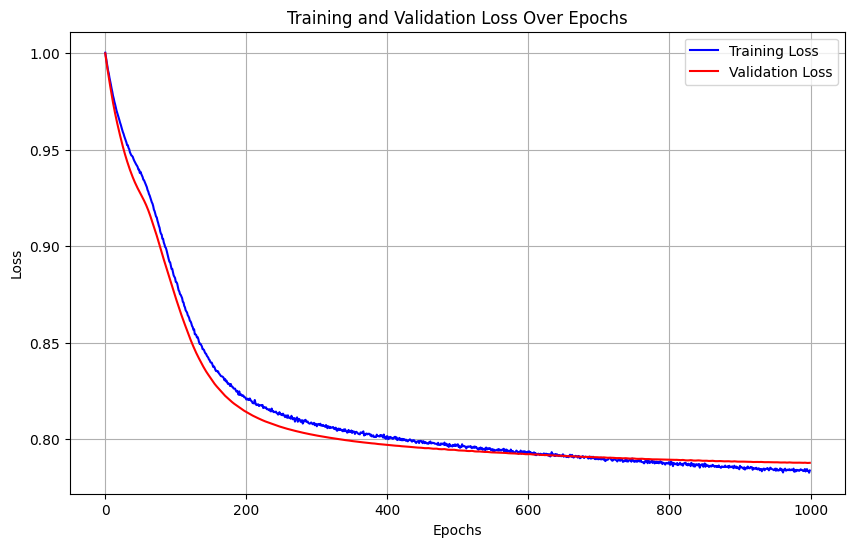

Training run 20/50 for 5% of the data...
Sample size for 5%: 9987


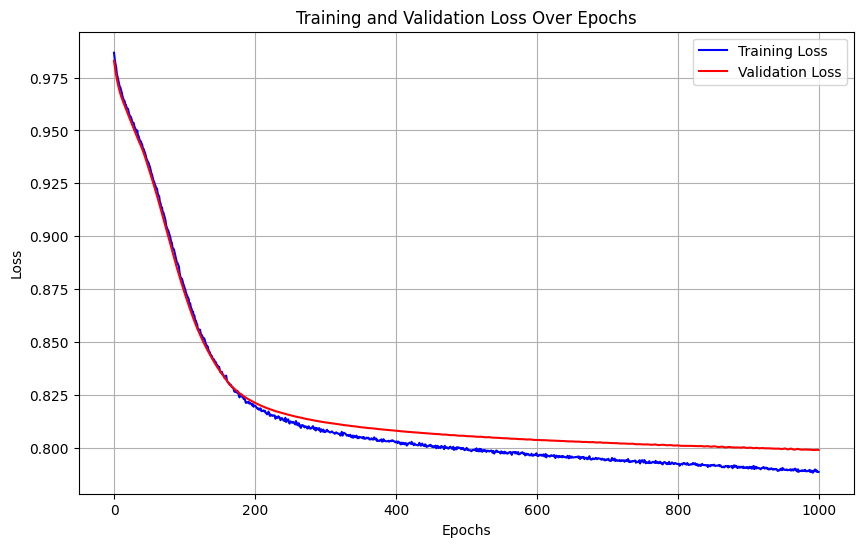

Training run 21/50 for 5% of the data...
Sample size for 5%: 9987


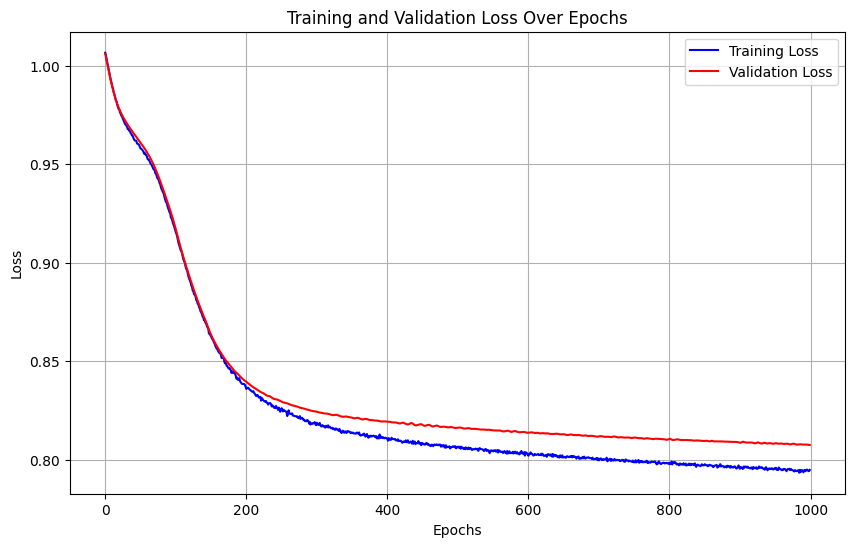

Training run 22/50 for 5% of the data...
Sample size for 5%: 9987


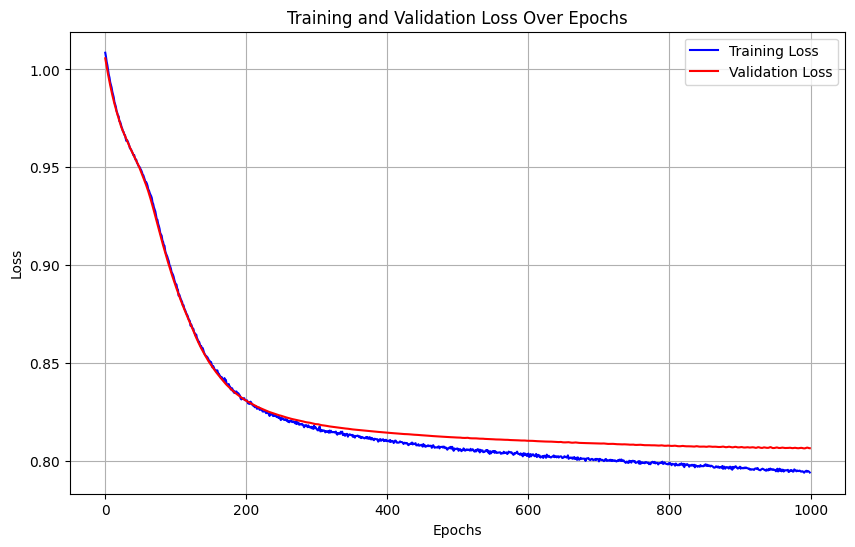

Training run 23/50 for 5% of the data...
Sample size for 5%: 9987


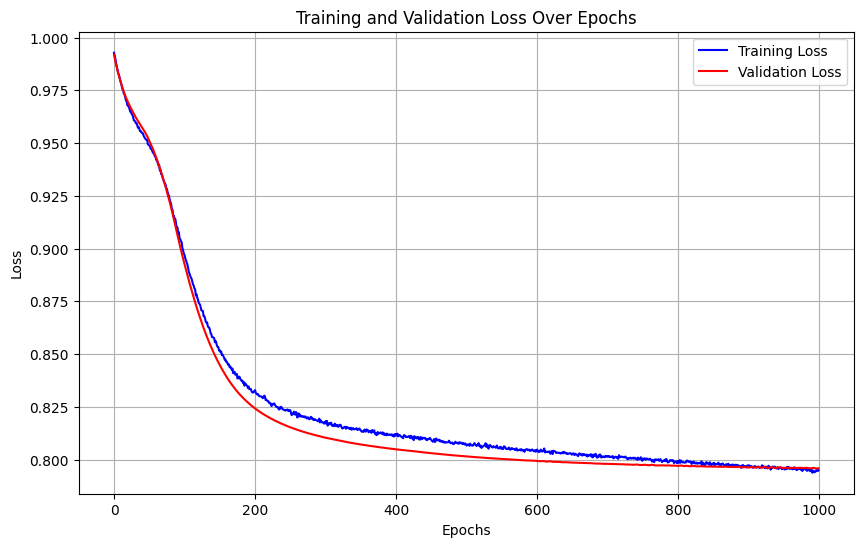

Training run 24/50 for 5% of the data...
Sample size for 5%: 9987


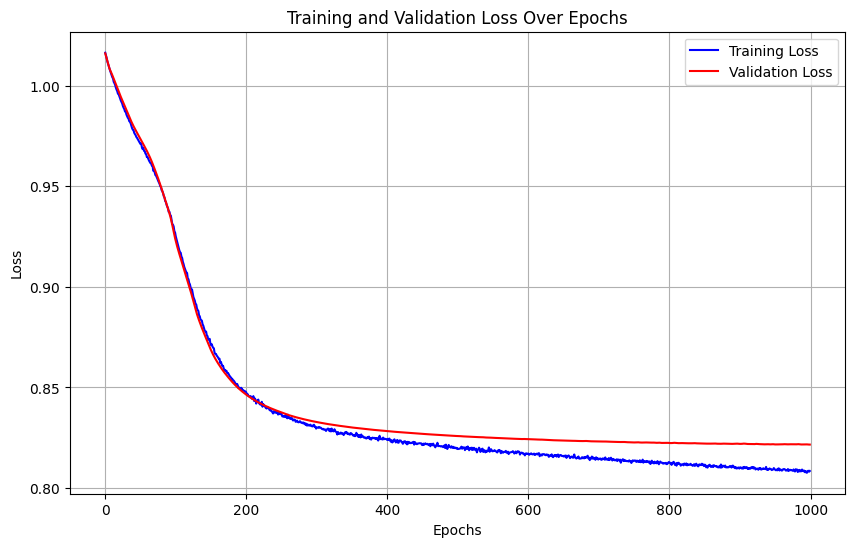

Training run 25/50 for 5% of the data...
Sample size for 5%: 9987


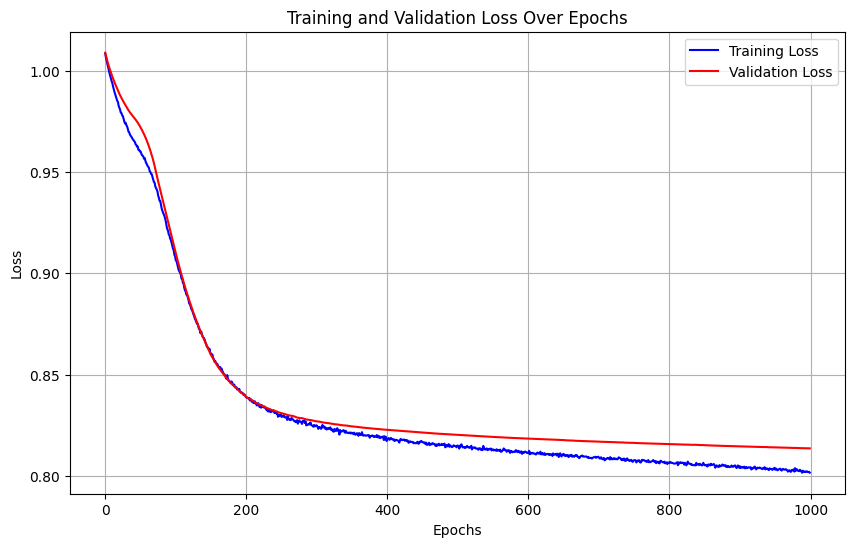

Training run 26/50 for 5% of the data...
Sample size for 5%: 9987


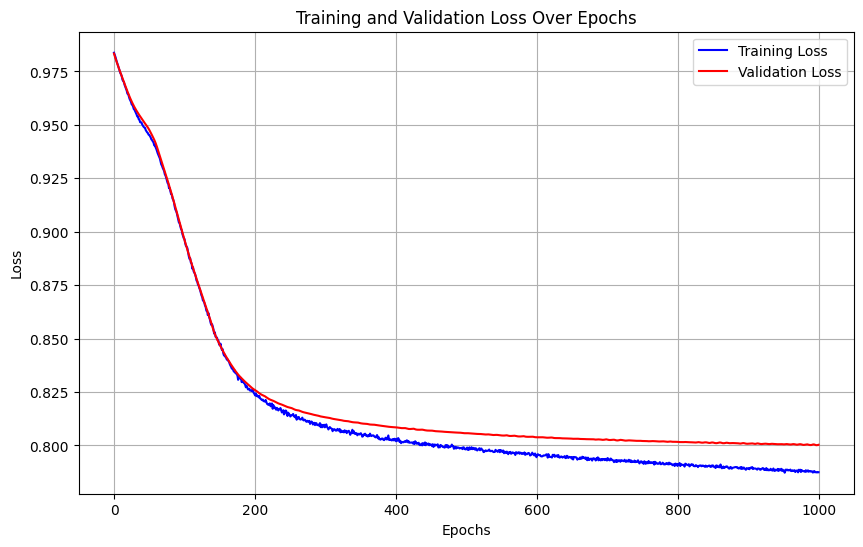

Training run 27/50 for 5% of the data...
Sample size for 5%: 9987


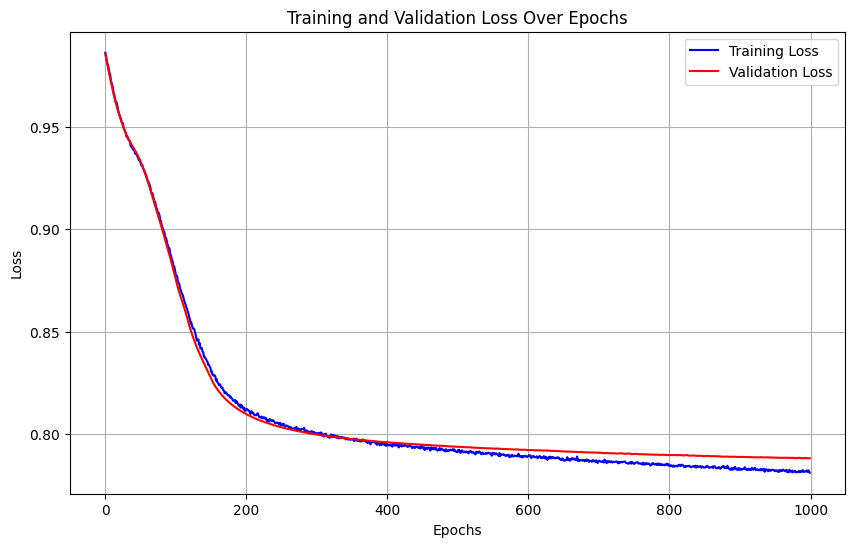

Training run 28/50 for 5% of the data...
Sample size for 5%: 9987


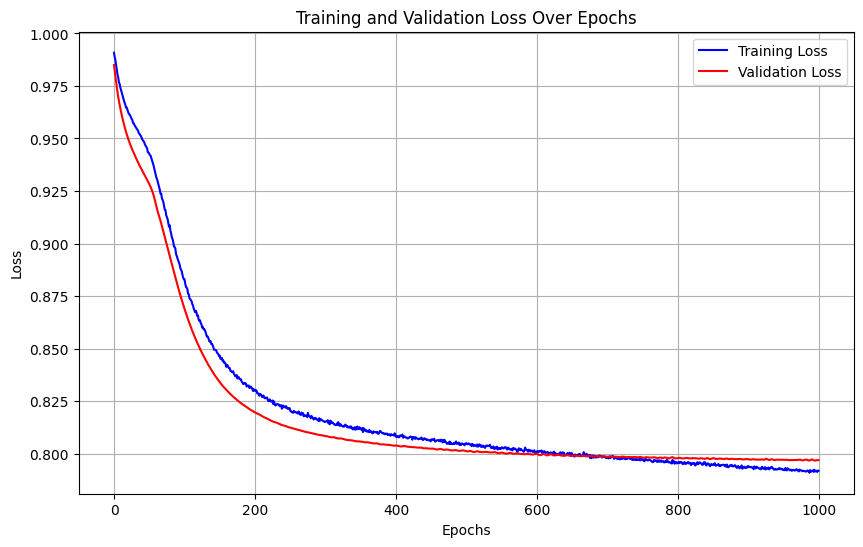

Training run 29/50 for 5% of the data...
Sample size for 5%: 9987


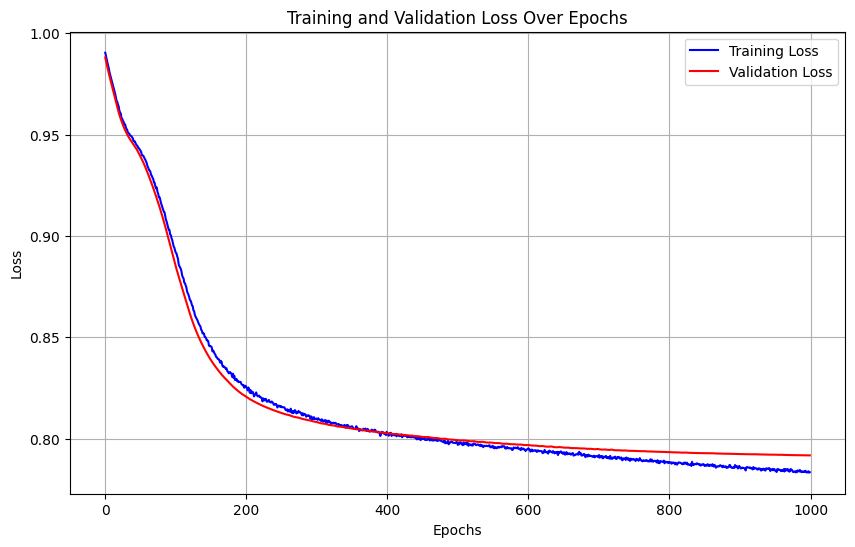

Training run 30/50 for 5% of the data...
Sample size for 5%: 9987


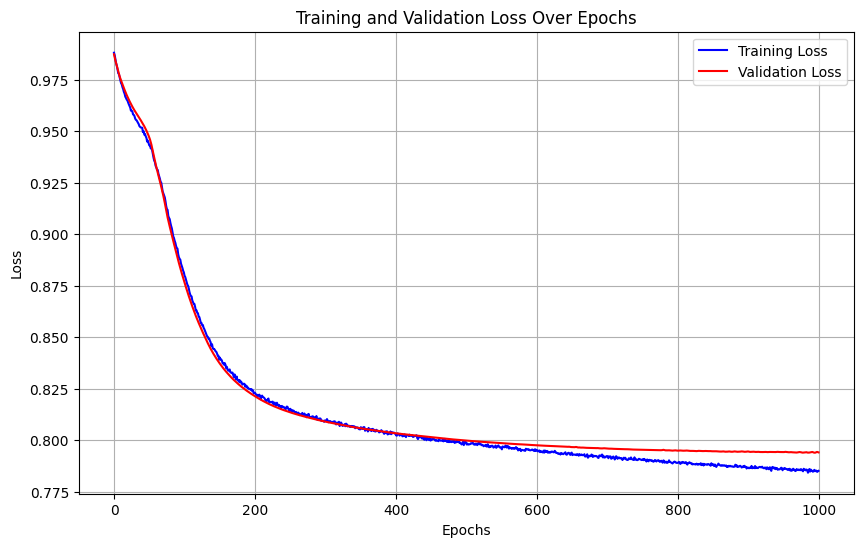

Training run 31/50 for 5% of the data...
Sample size for 5%: 9987


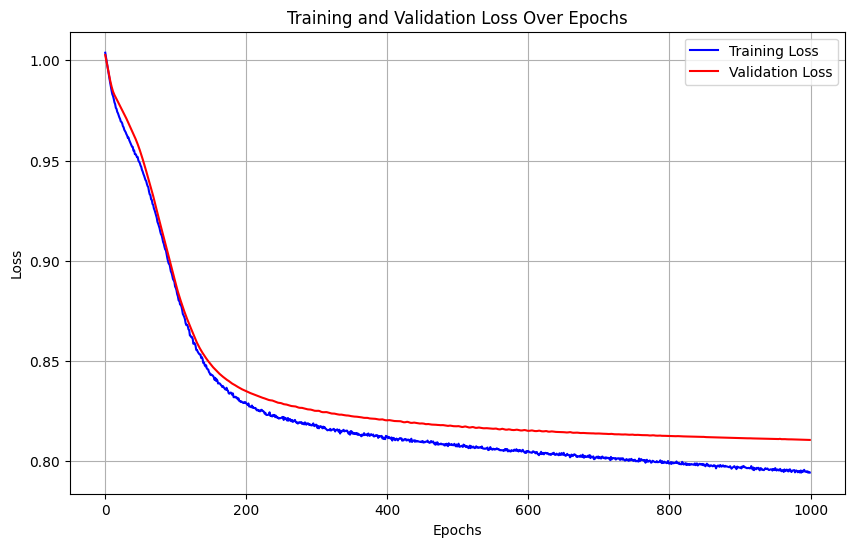

Training run 32/50 for 5% of the data...
Sample size for 5%: 9987


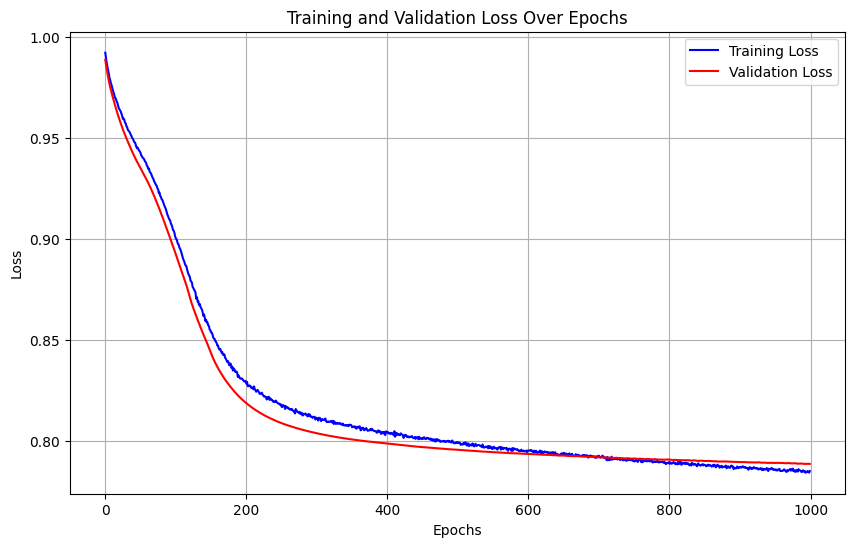

Training run 33/50 for 5% of the data...
Sample size for 5%: 9987


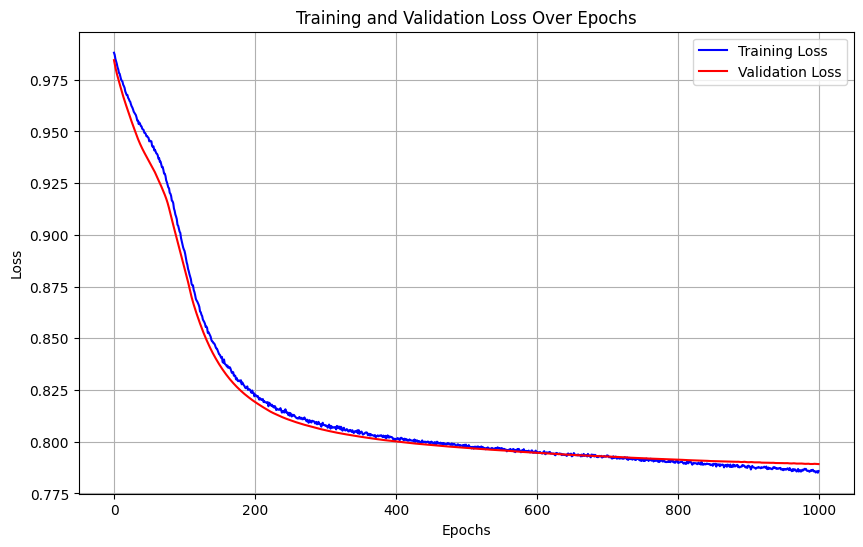

Training run 34/50 for 5% of the data...
Sample size for 5%: 9987


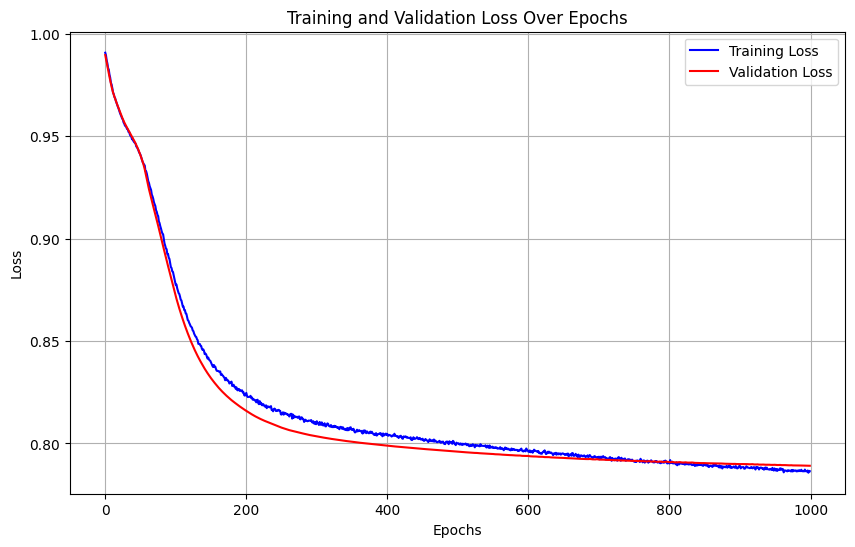

Training run 35/50 for 5% of the data...
Sample size for 5%: 9987


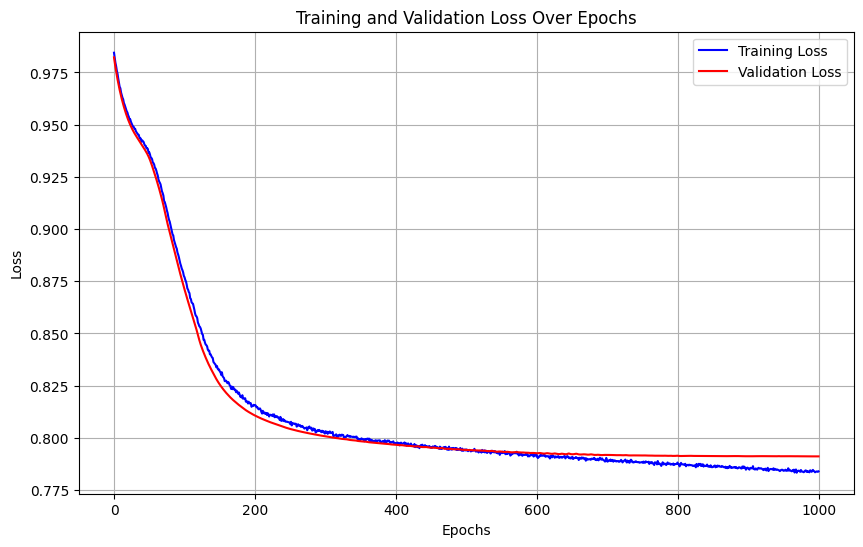

Training run 36/50 for 5% of the data...
Sample size for 5%: 9987


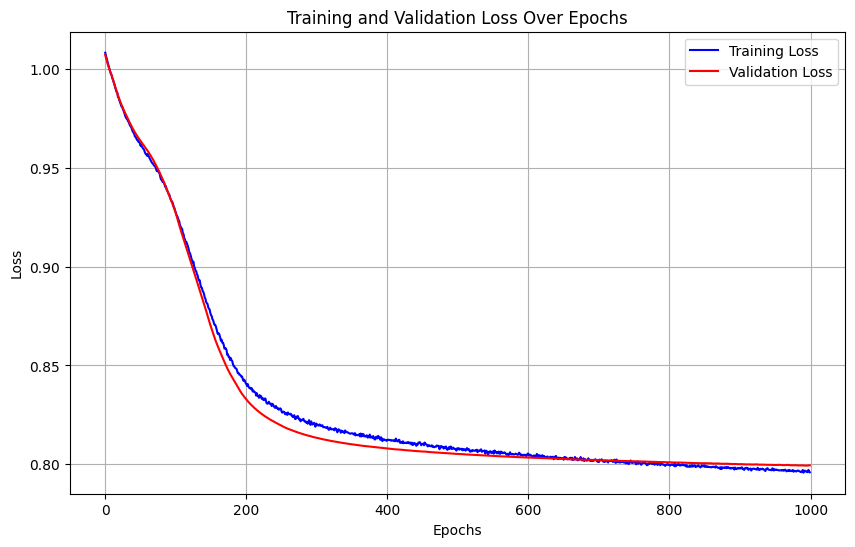

Training run 37/50 for 5% of the data...
Sample size for 5%: 9987


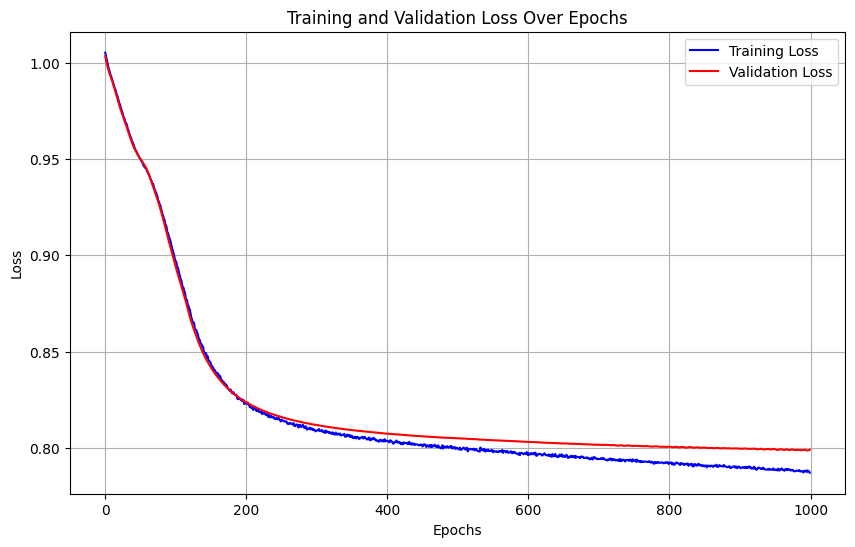

Training run 38/50 for 5% of the data...
Sample size for 5%: 9987


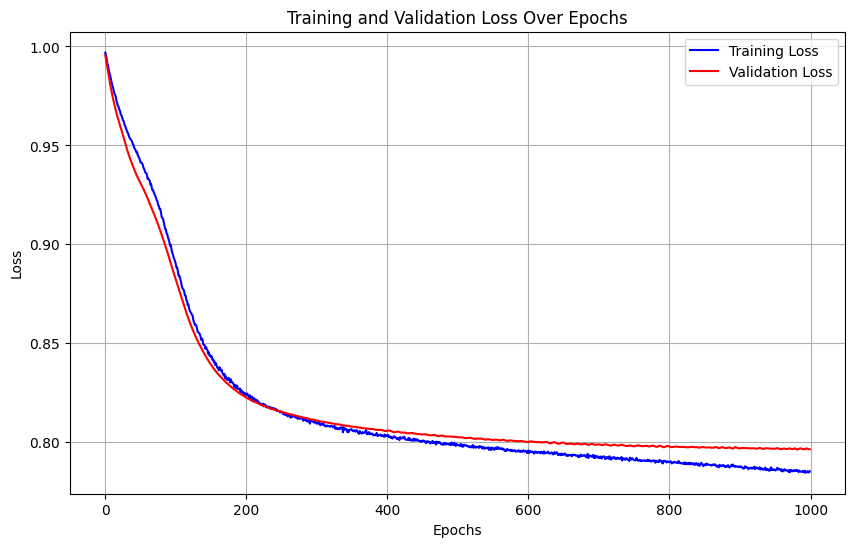

Training run 39/50 for 5% of the data...
Sample size for 5%: 9987


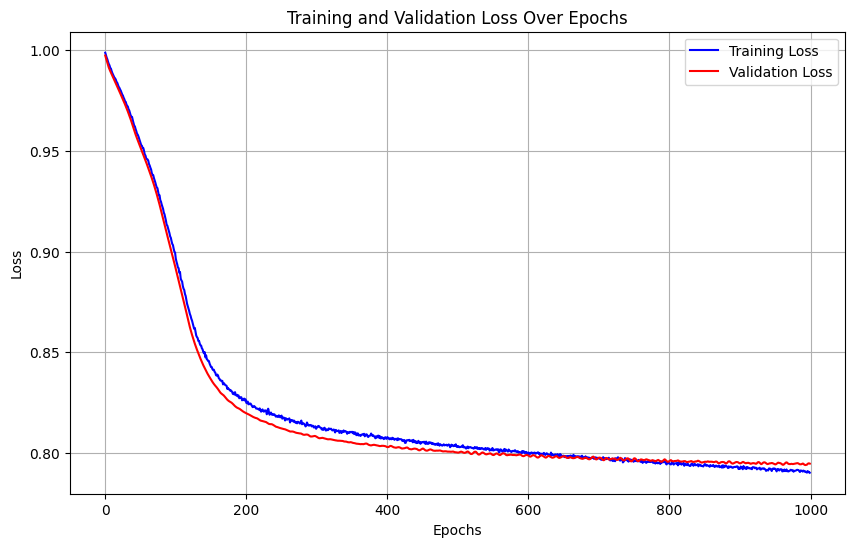

Training run 40/50 for 5% of the data...
Sample size for 5%: 9987


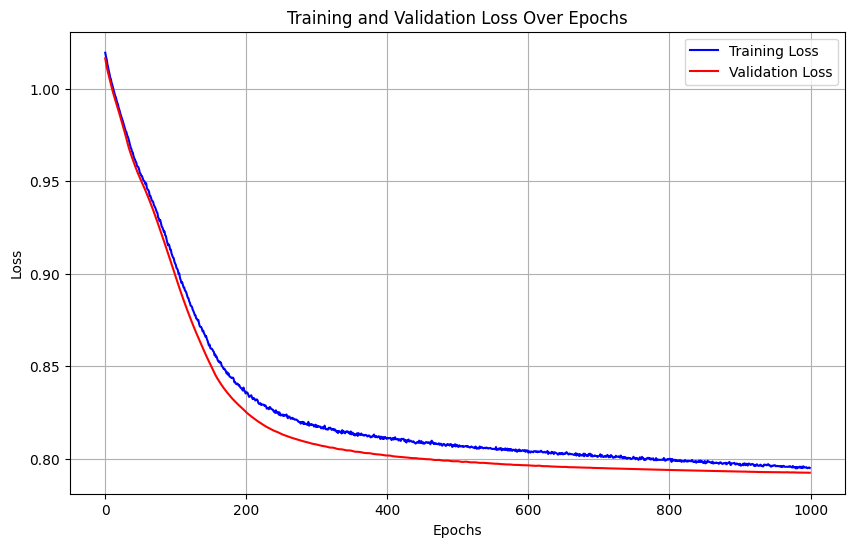

Training run 41/50 for 5% of the data...
Sample size for 5%: 9987


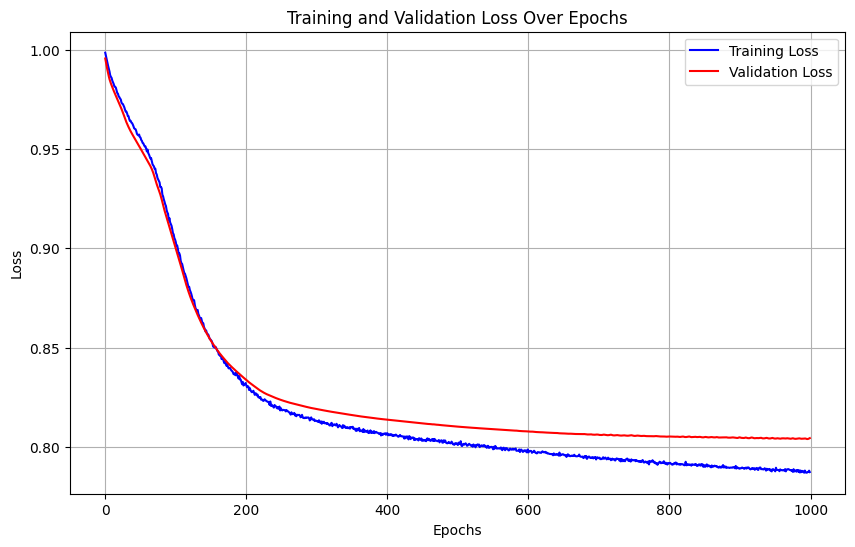

Training run 42/50 for 5% of the data...
Sample size for 5%: 9987


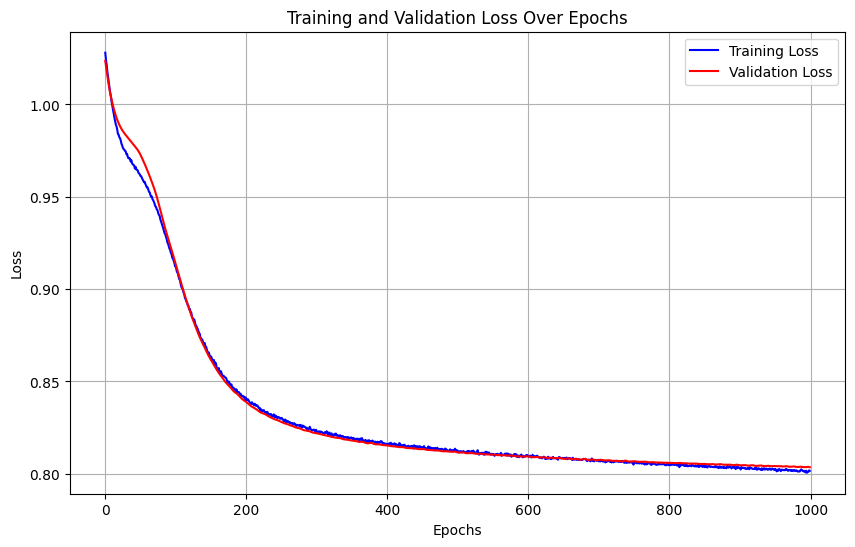

Training run 43/50 for 5% of the data...
Sample size for 5%: 9987


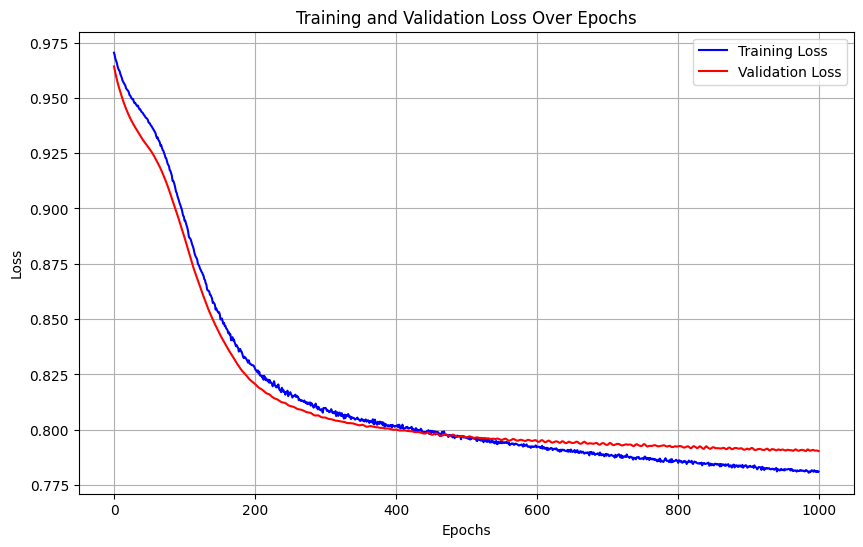

Training run 44/50 for 5% of the data...
Sample size for 5%: 9987


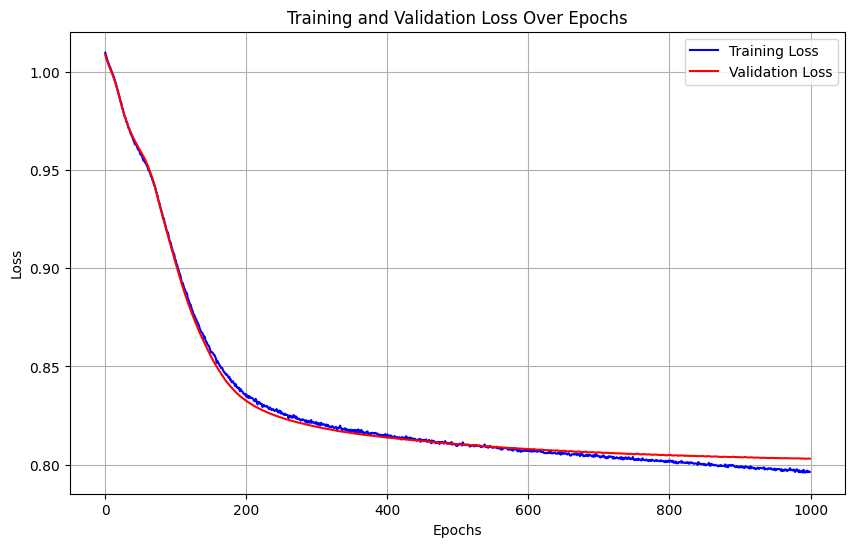

Training run 45/50 for 5% of the data...
Sample size for 5%: 9987


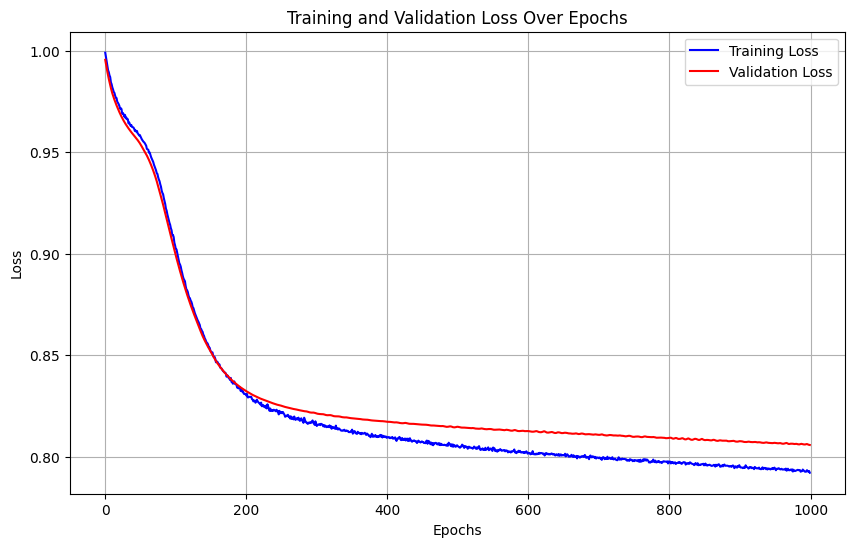

Training run 46/50 for 5% of the data...
Sample size for 5%: 9987


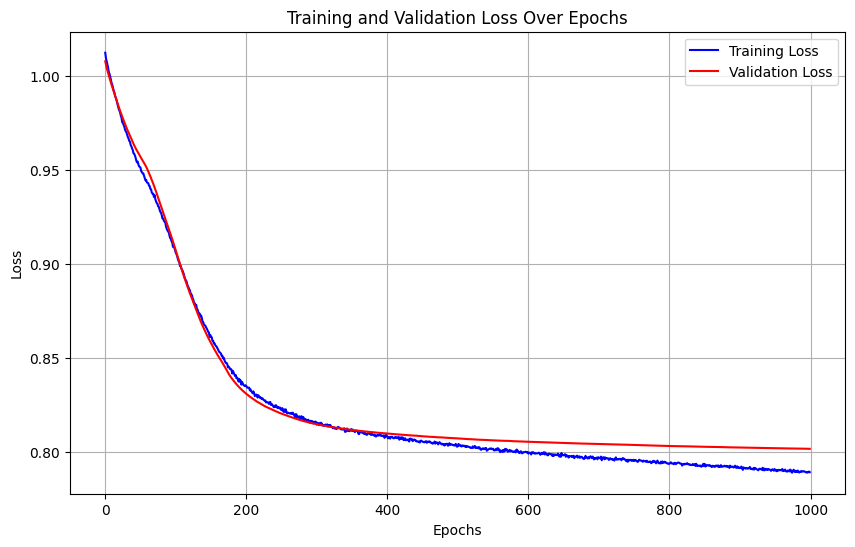

Training run 47/50 for 5% of the data...
Sample size for 5%: 9987


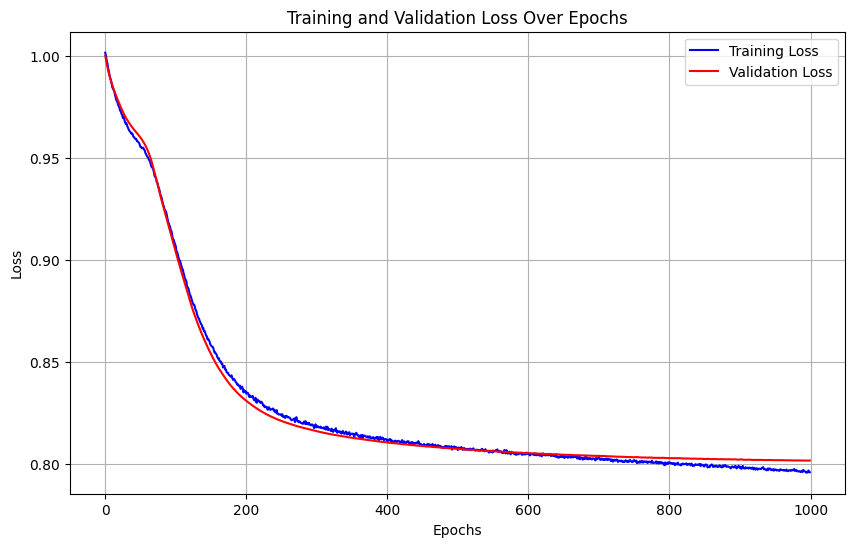

Training run 48/50 for 5% of the data...
Sample size for 5%: 9987


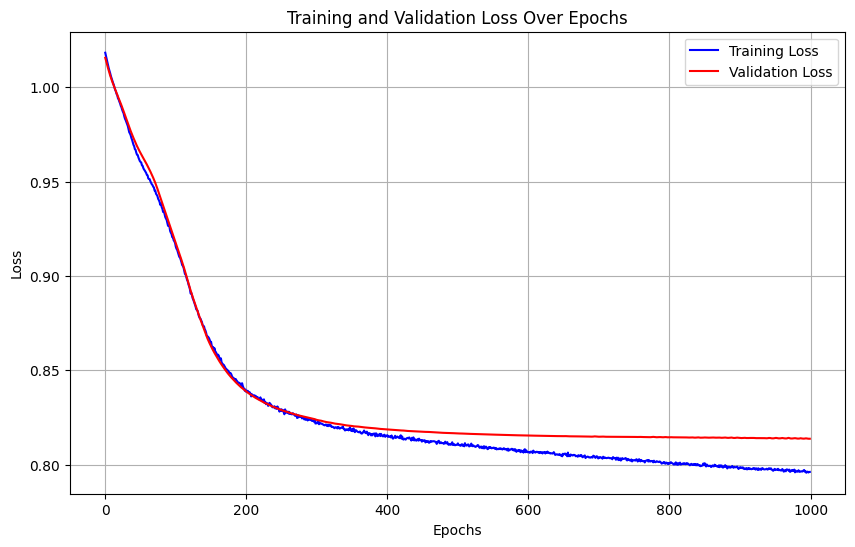

Training run 49/50 for 5% of the data...
Sample size for 5%: 9987


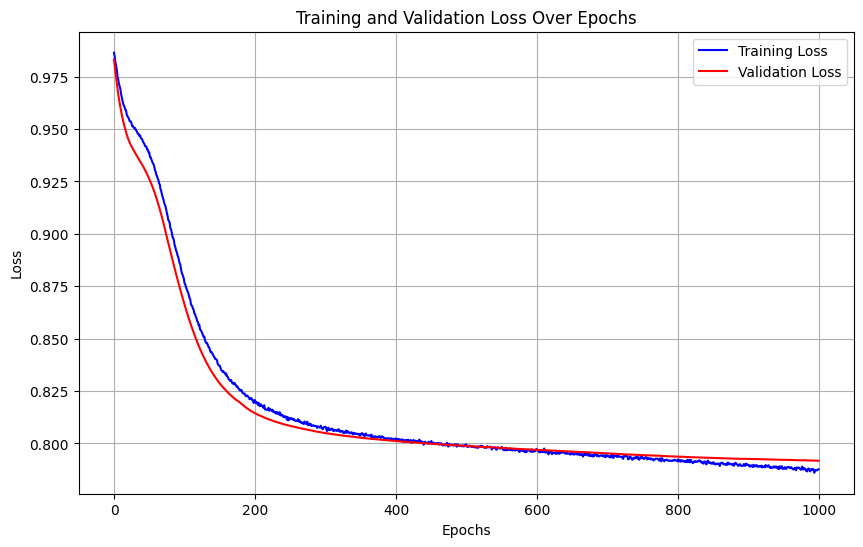

Training run 50/50 for 5% of the data...
Sample size for 5%: 9987


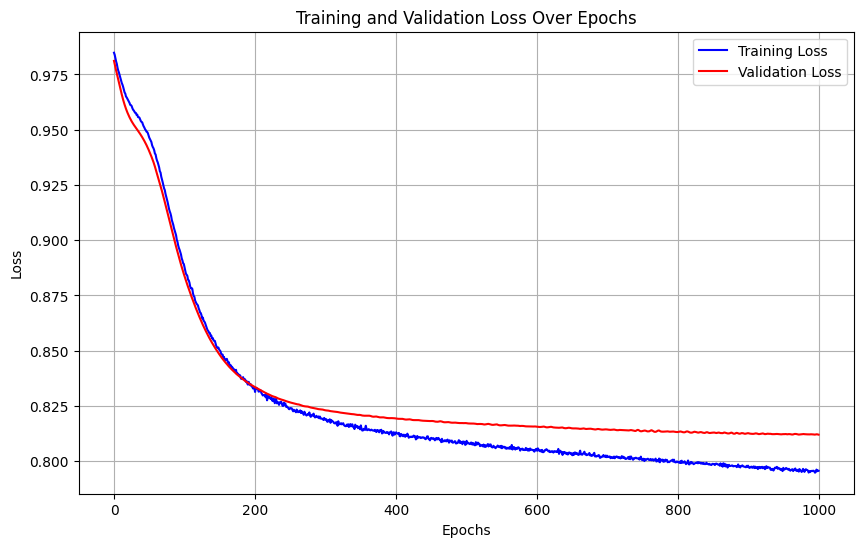

Metrics for 5% of data:
Final Metrics (Aggregated Predictions): {'accuracy': np.float64(0.8534834834834836), 'precision': np.float64(0.7742699173641754), 'recall': np.float64(0.7498622292934785), 'f1': np.float64(0.7616074113757507), 'fpr': np.float64(0.09948638441882471)}
Metrics Across Runs:
accuracy: 0.8535 ± 0.0074
precision: 0.7743 ± 0.0191
recall: 0.7499 ± 0.0191
f1: 0.7616 ± 0.0130
fpr: 0.0995 ± 0.0103
Training model for 10% of the data...
Training run 1/50 for 10% of the data...
Sample size for 10%: 19975


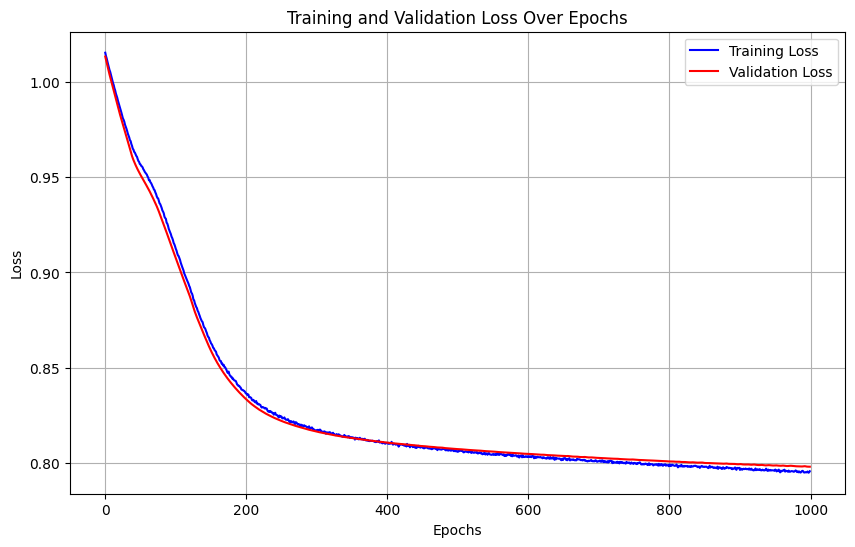

Training run 2/50 for 10% of the data...
Sample size for 10%: 19975


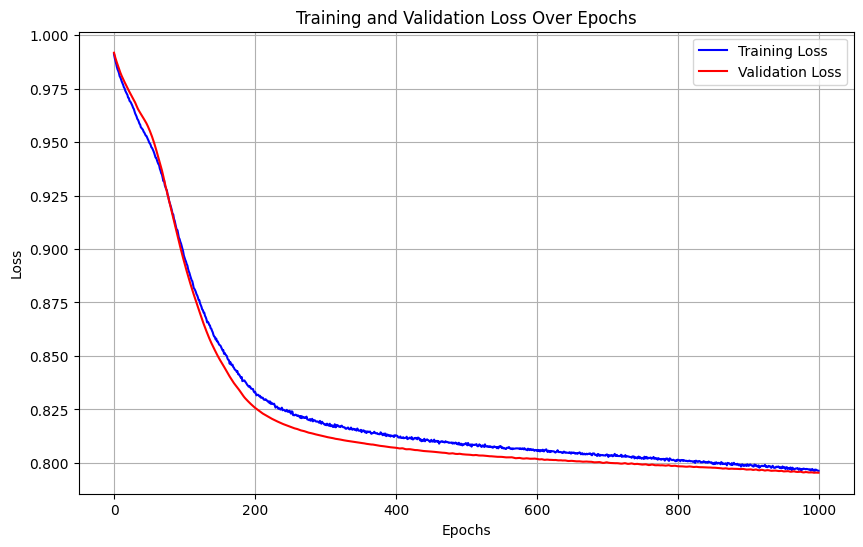

Training run 3/50 for 10% of the data...
Sample size for 10%: 19975


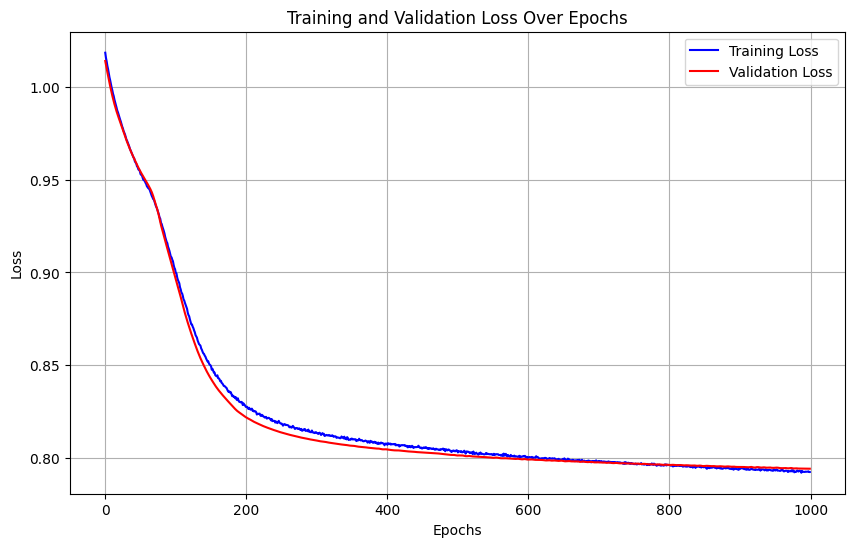

Training run 4/50 for 10% of the data...
Sample size for 10%: 19975


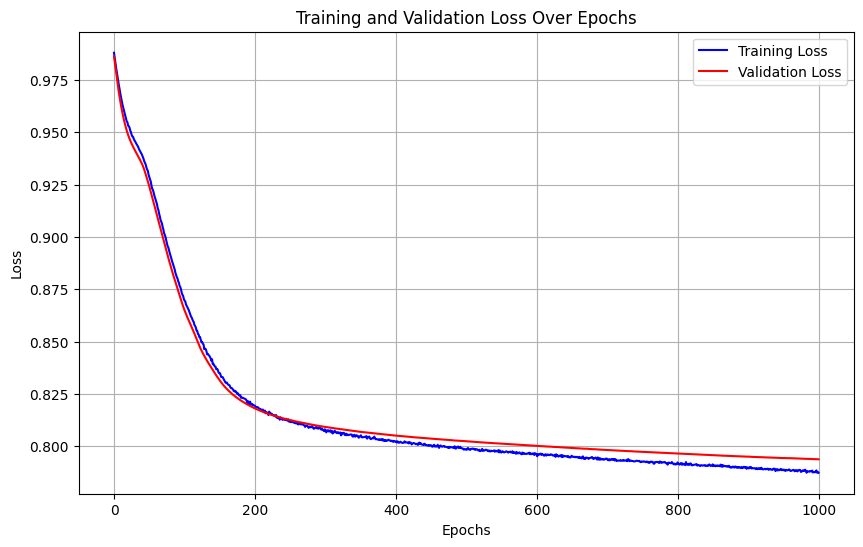

Training run 5/50 for 10% of the data...
Sample size for 10%: 19975


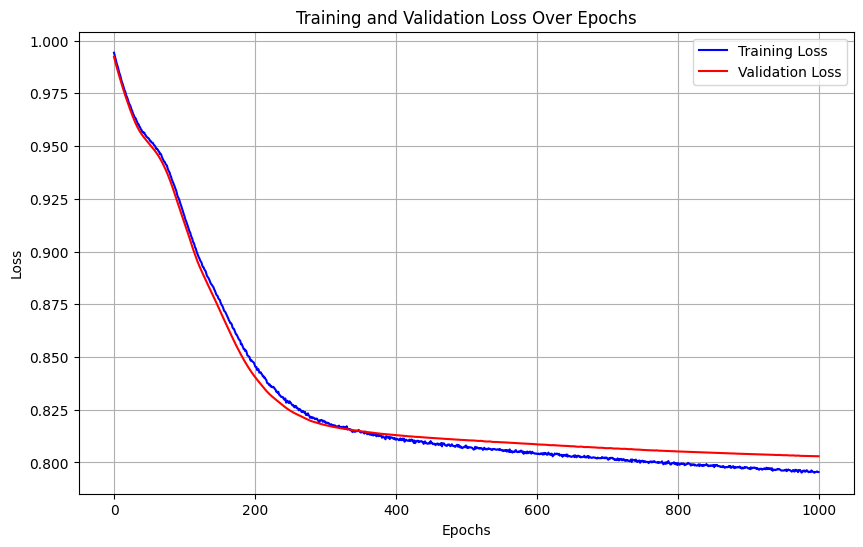

Training run 6/50 for 10% of the data...
Sample size for 10%: 19975


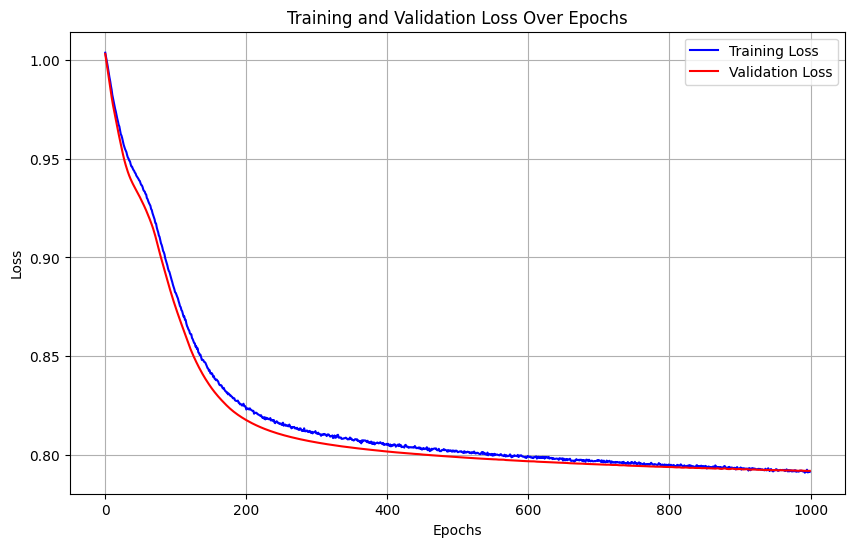

Training run 7/50 for 10% of the data...
Sample size for 10%: 19975


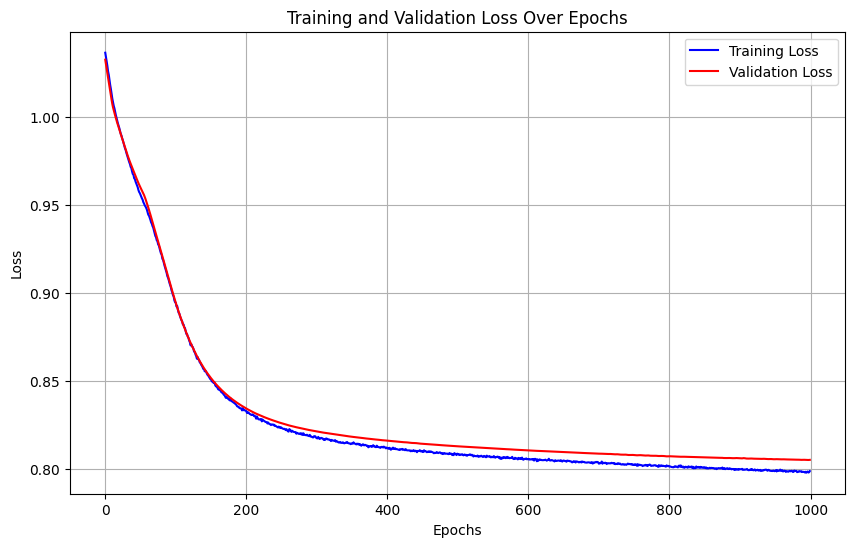

Training run 8/50 for 10% of the data...
Sample size for 10%: 19975


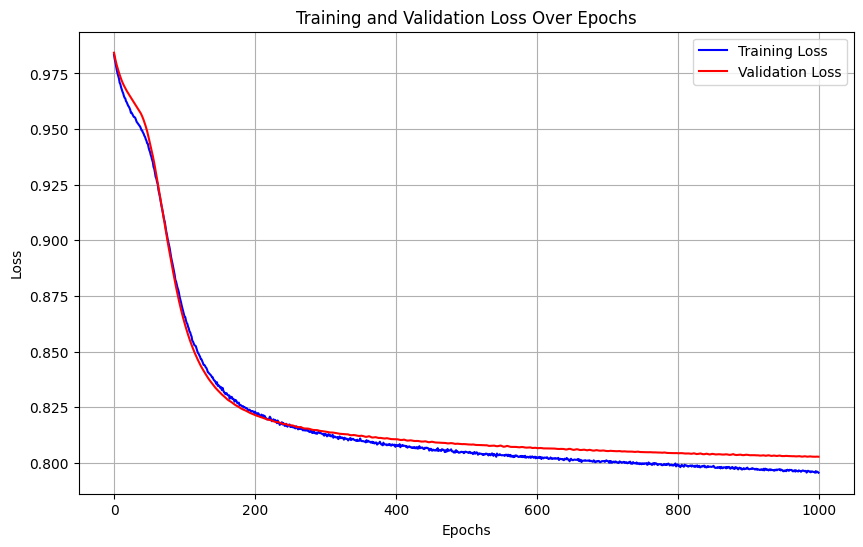

Training run 9/50 for 10% of the data...
Sample size for 10%: 19975


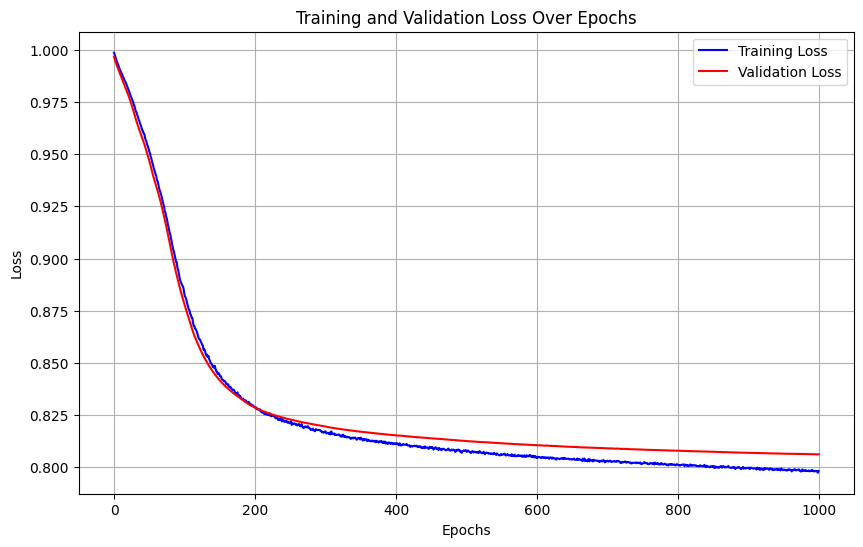

Training run 10/50 for 10% of the data...
Sample size for 10%: 19975


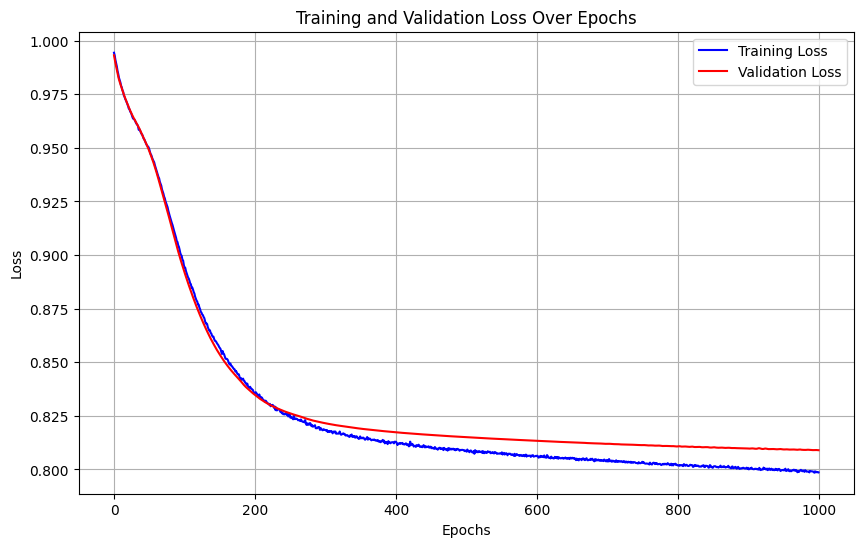

Training run 11/50 for 10% of the data...
Sample size for 10%: 19975


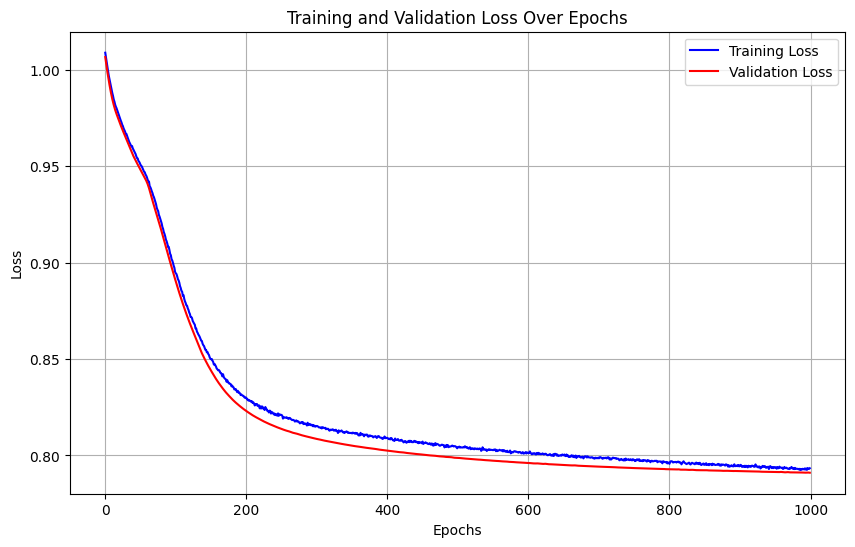

Training run 12/50 for 10% of the data...
Sample size for 10%: 19975


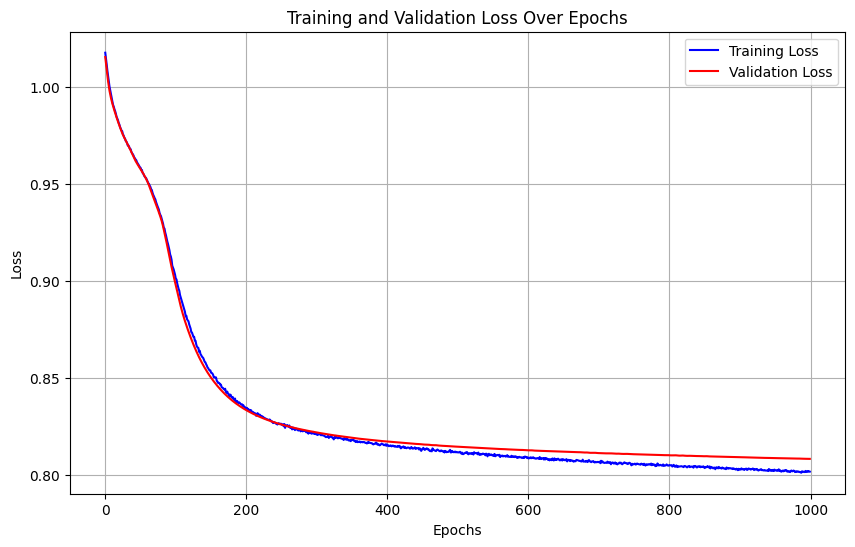

Training run 13/50 for 10% of the data...
Sample size for 10%: 19975


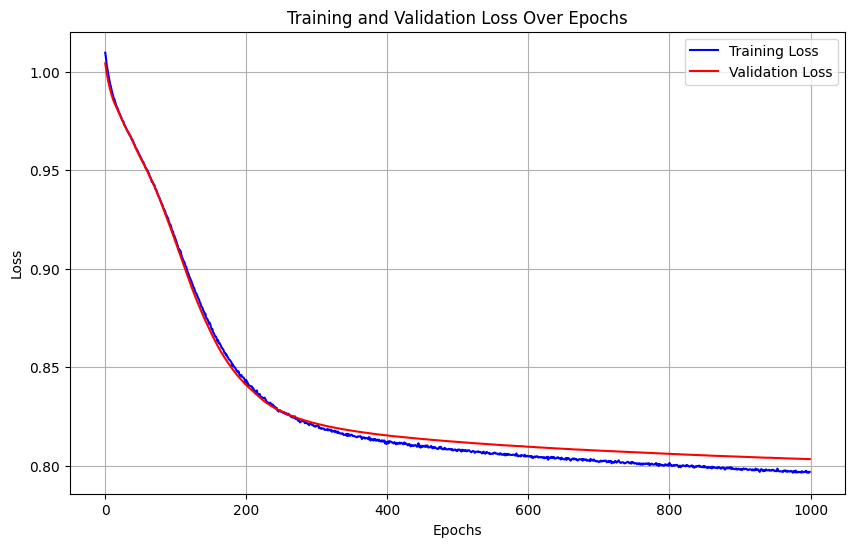

Training run 14/50 for 10% of the data...
Sample size for 10%: 19975


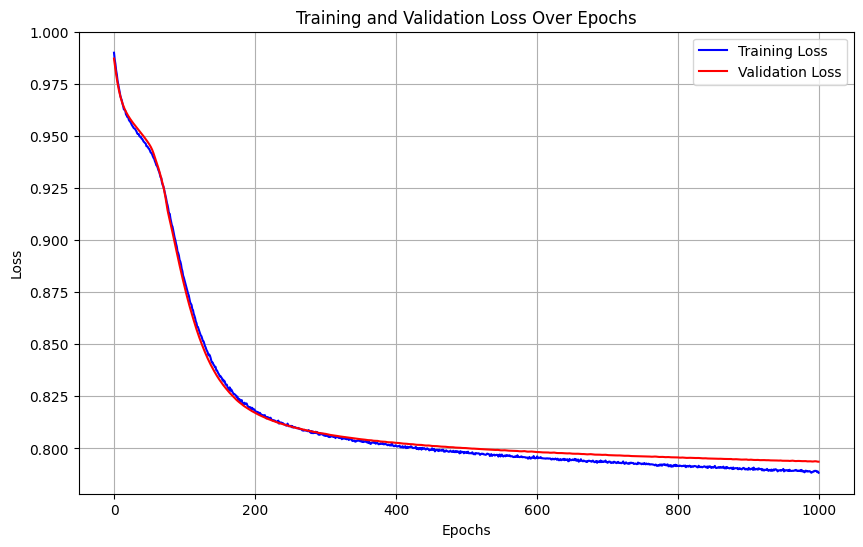

Training run 15/50 for 10% of the data...
Sample size for 10%: 19975


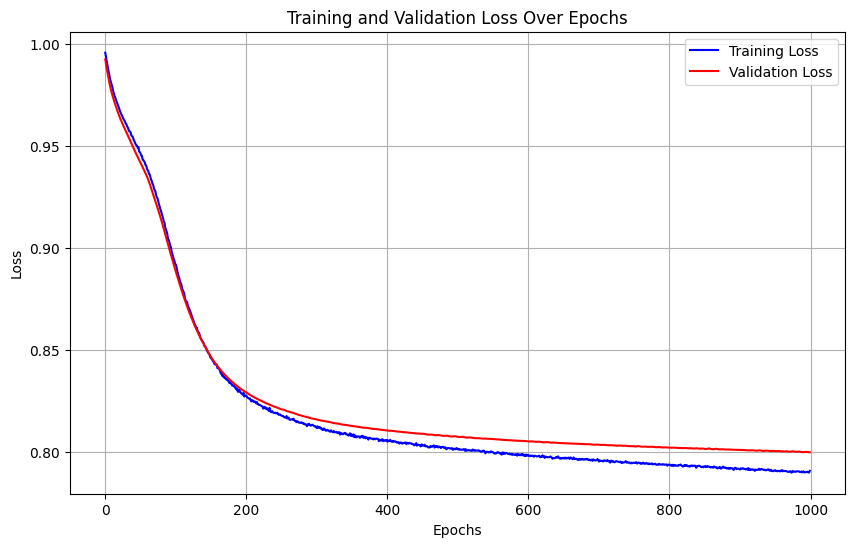

Training run 16/50 for 10% of the data...
Sample size for 10%: 19975


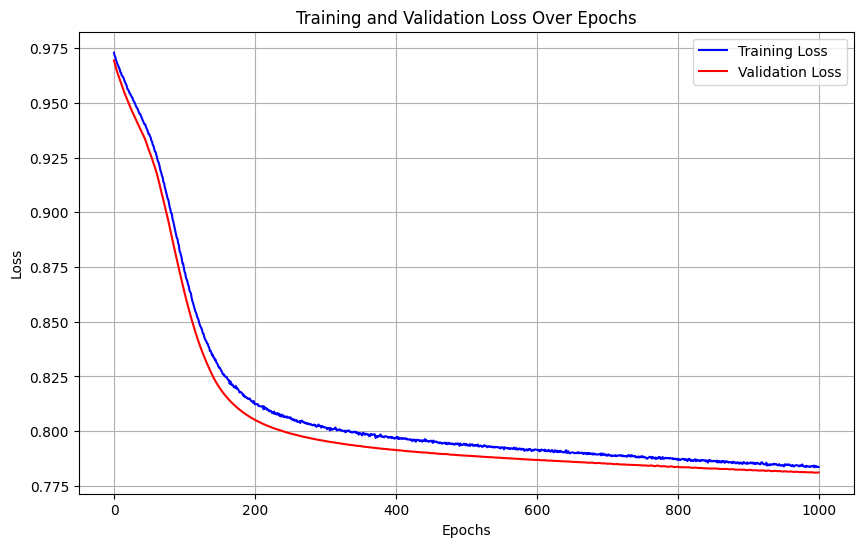

Training run 17/50 for 10% of the data...
Sample size for 10%: 19975


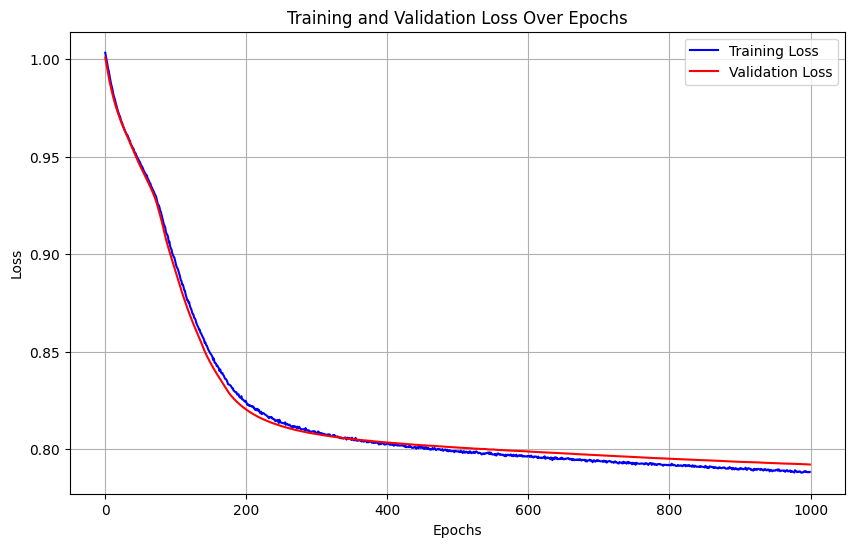

Training run 18/50 for 10% of the data...
Sample size for 10%: 19975


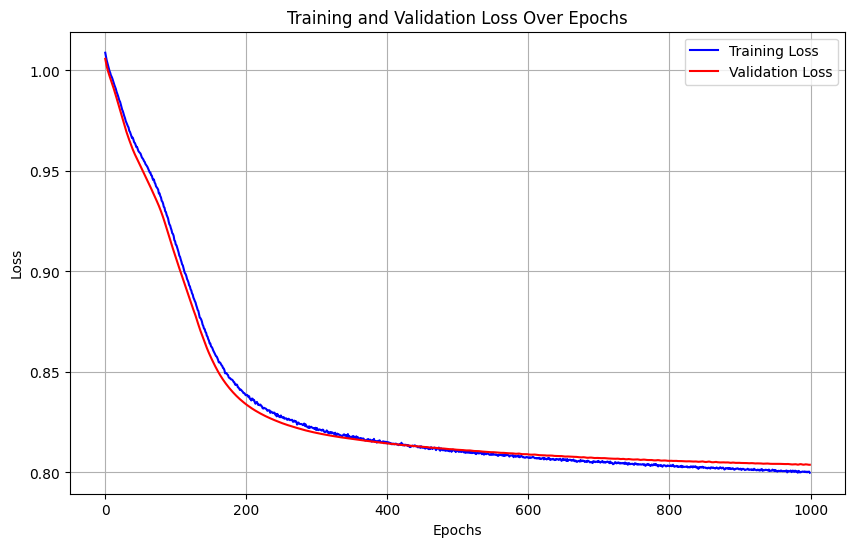

Training run 19/50 for 10% of the data...
Sample size for 10%: 19975


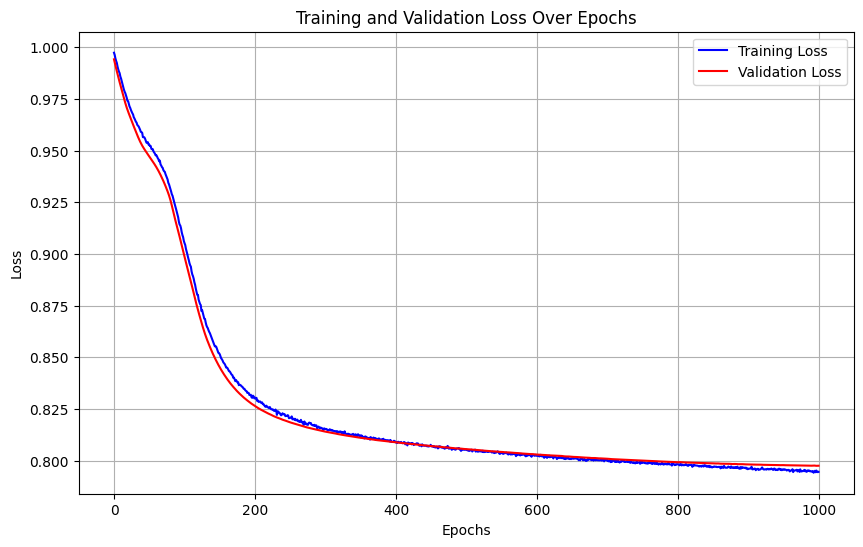

Training run 20/50 for 10% of the data...
Sample size for 10%: 19975


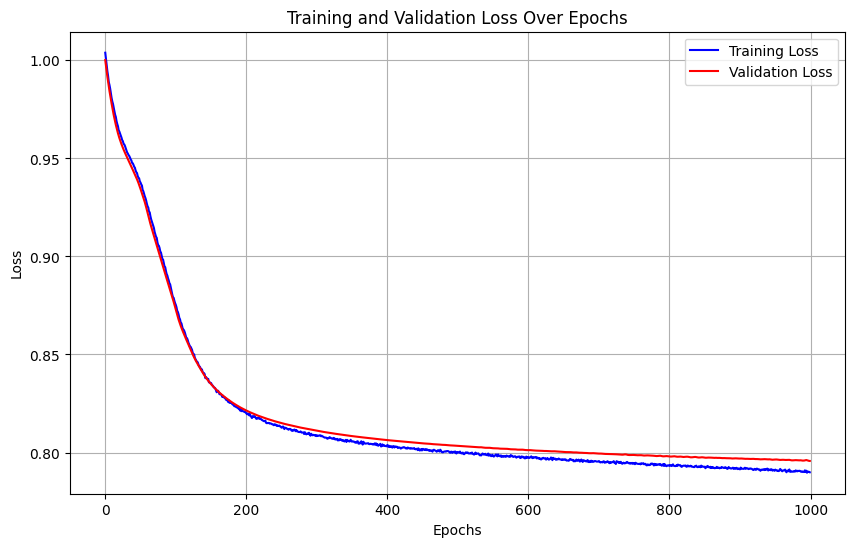

Training run 21/50 for 10% of the data...
Sample size for 10%: 19975


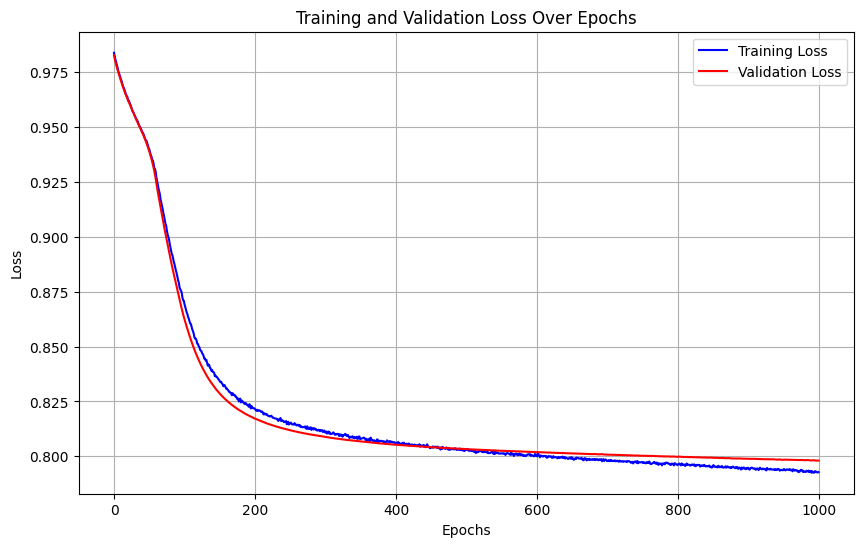

Training run 22/50 for 10% of the data...
Sample size for 10%: 19975


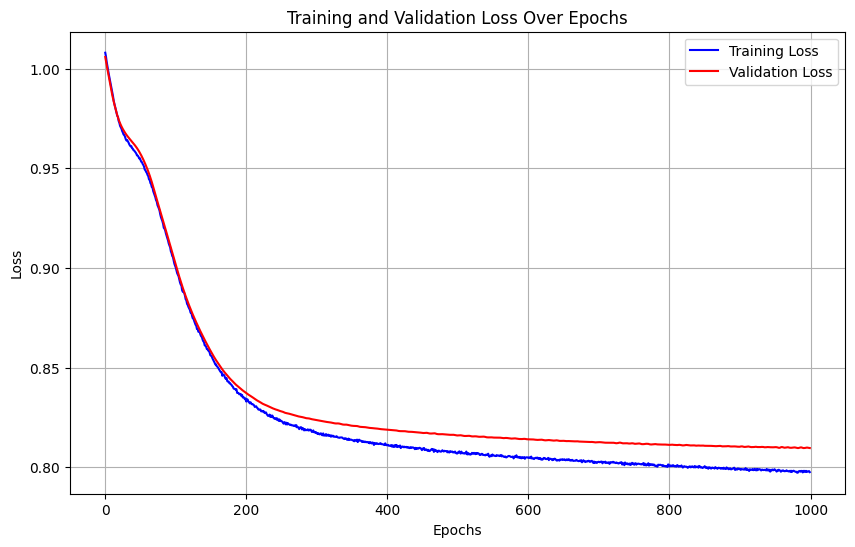

Training run 23/50 for 10% of the data...
Sample size for 10%: 19975


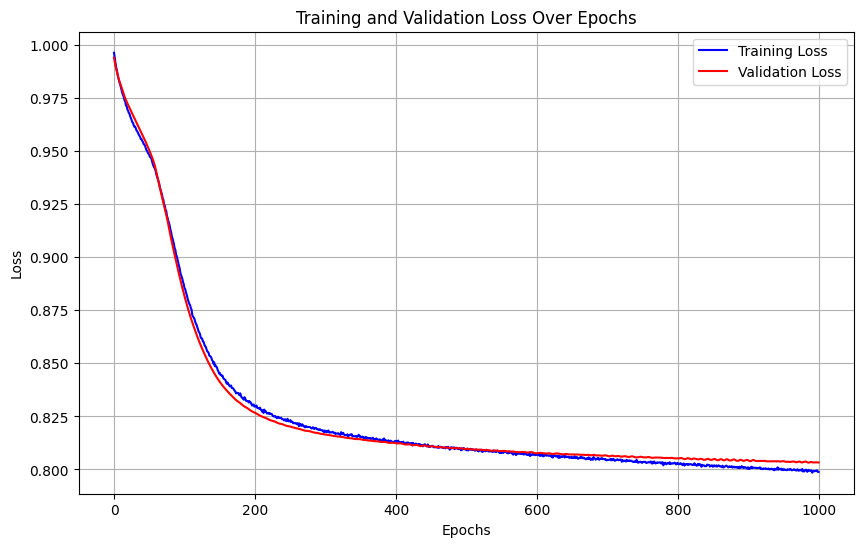

Training run 24/50 for 10% of the data...
Sample size for 10%: 19975


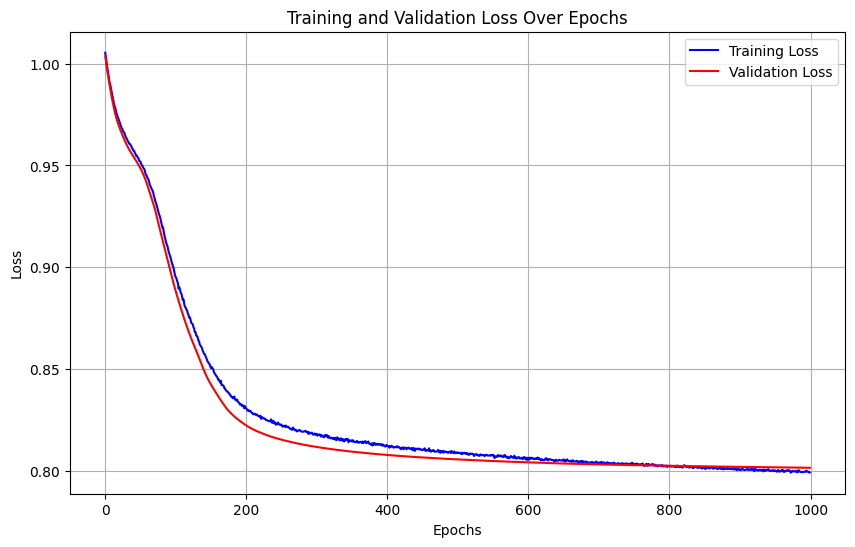

Training run 25/50 for 10% of the data...
Sample size for 10%: 19975


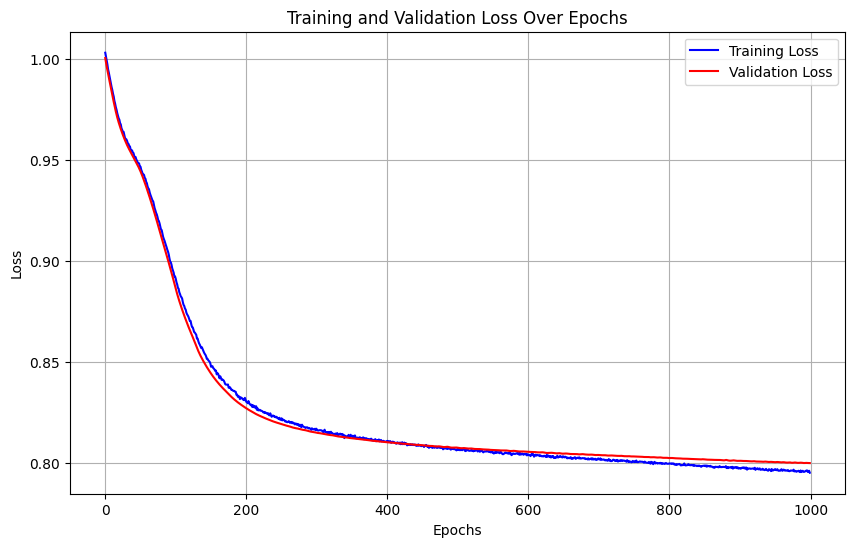

Training run 26/50 for 10% of the data...
Sample size for 10%: 19975


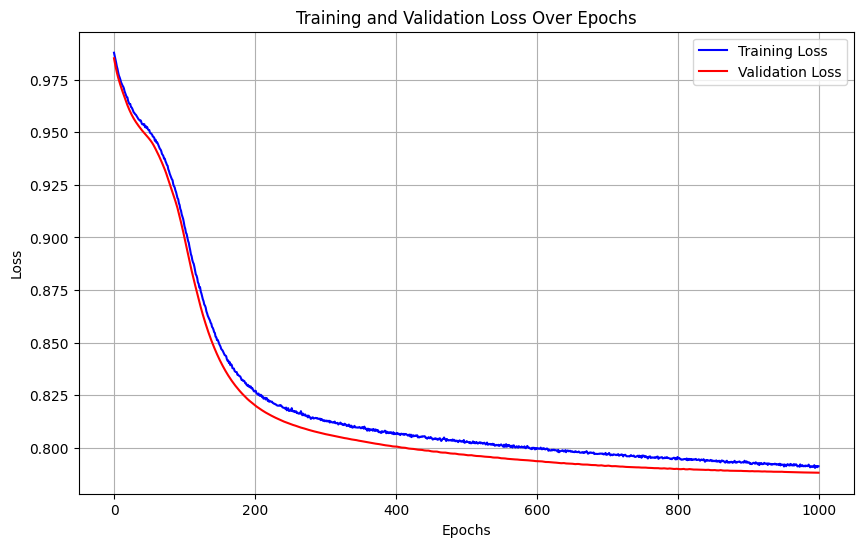

Training run 27/50 for 10% of the data...
Sample size for 10%: 19975


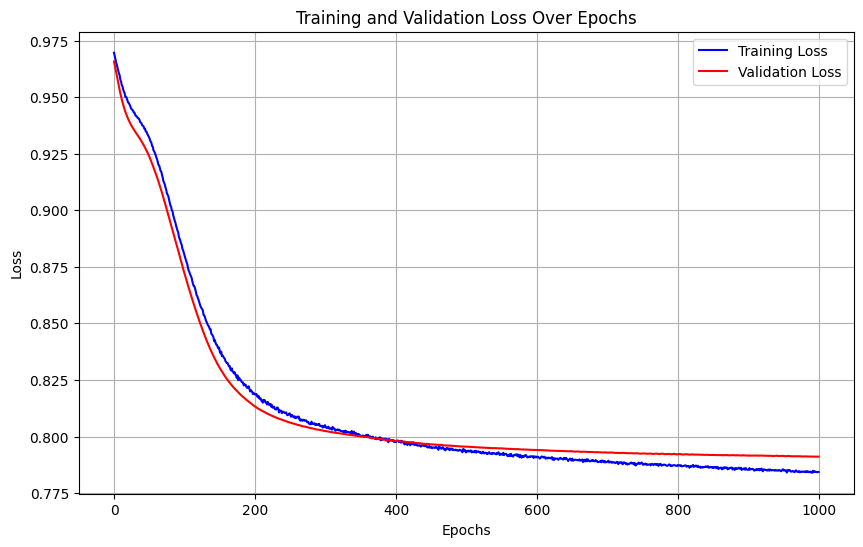

Training run 28/50 for 10% of the data...
Sample size for 10%: 19975


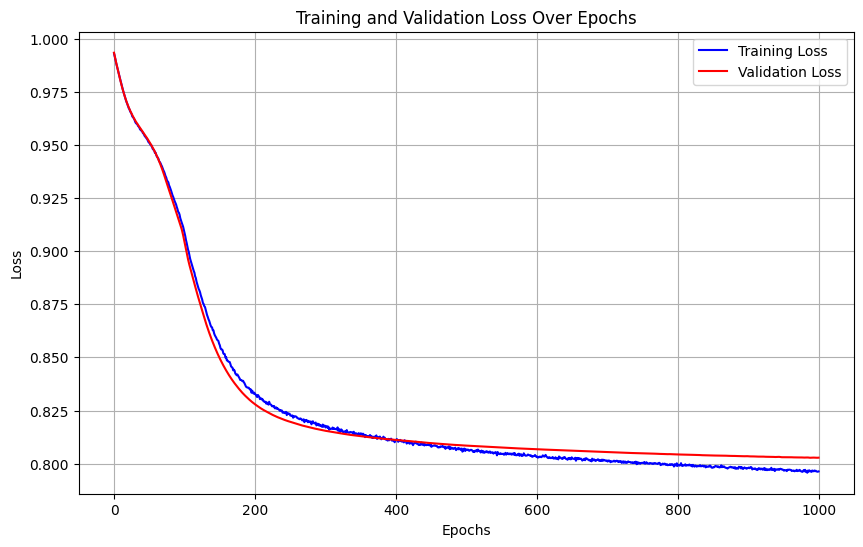

Training run 29/50 for 10% of the data...
Sample size for 10%: 19975


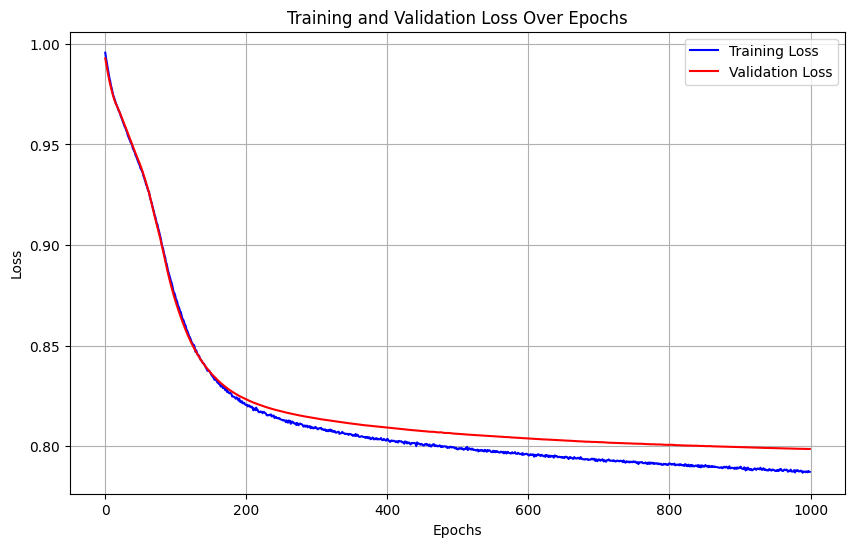

Training run 30/50 for 10% of the data...
Sample size for 10%: 19975


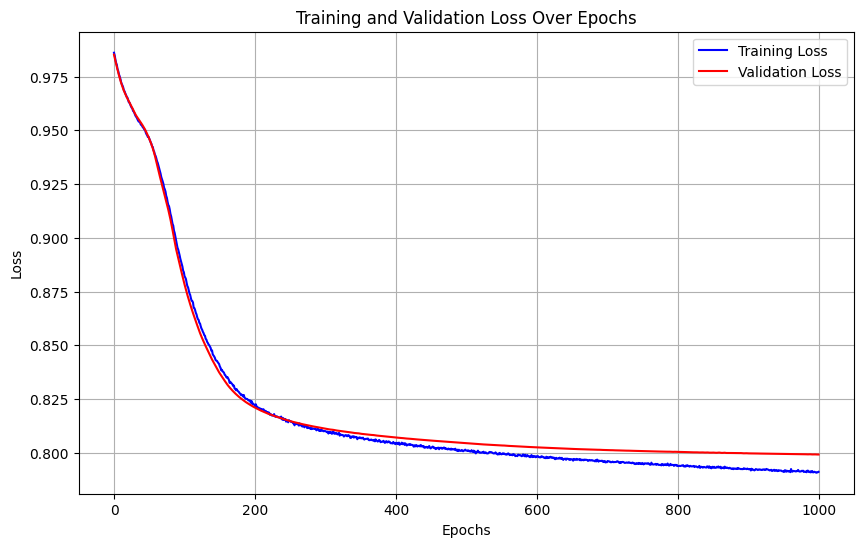

Training run 31/50 for 10% of the data...
Sample size for 10%: 19975


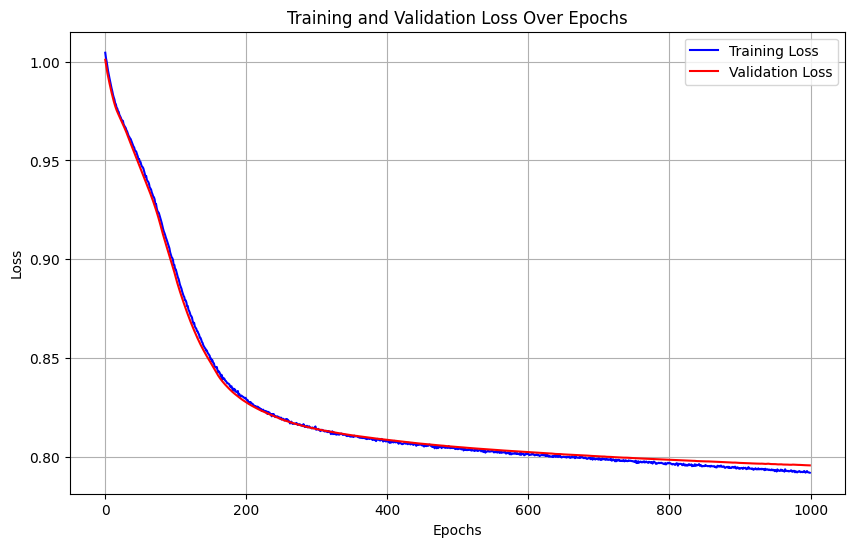

Training run 32/50 for 10% of the data...
Sample size for 10%: 19975


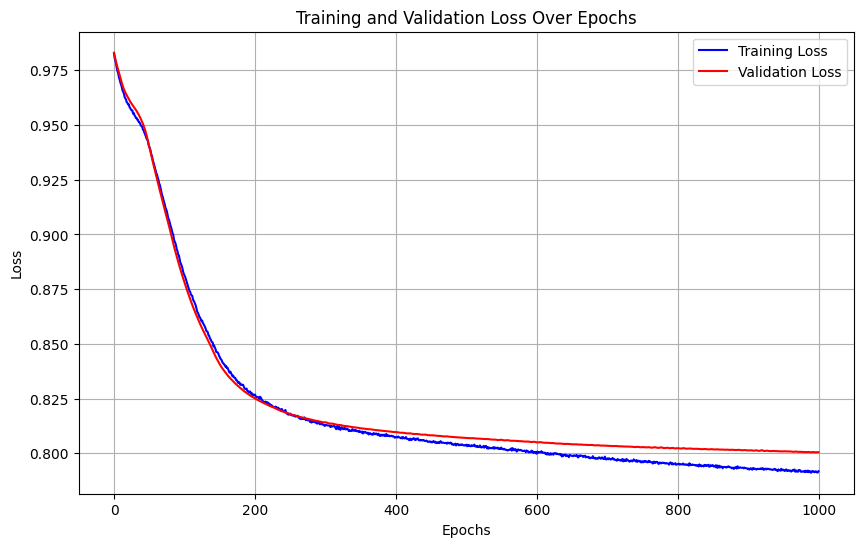

Training run 33/50 for 10% of the data...
Sample size for 10%: 19975


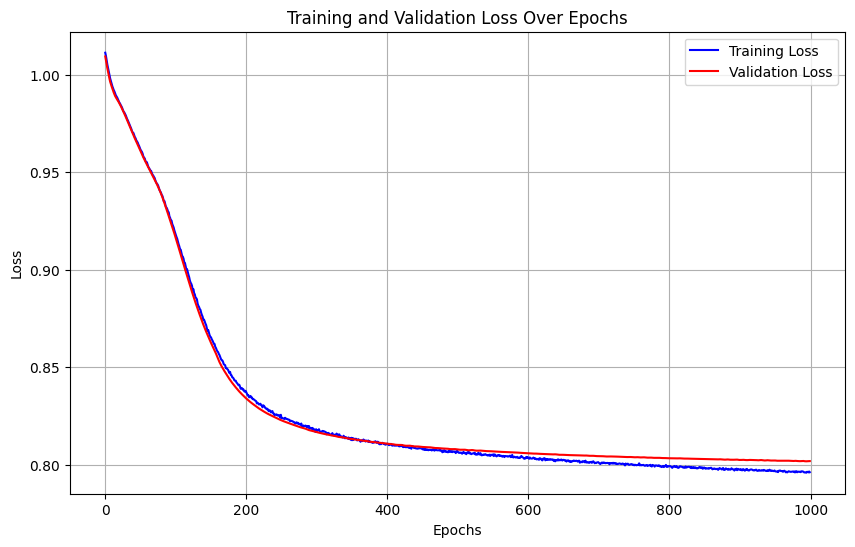

Training run 34/50 for 10% of the data...
Sample size for 10%: 19975


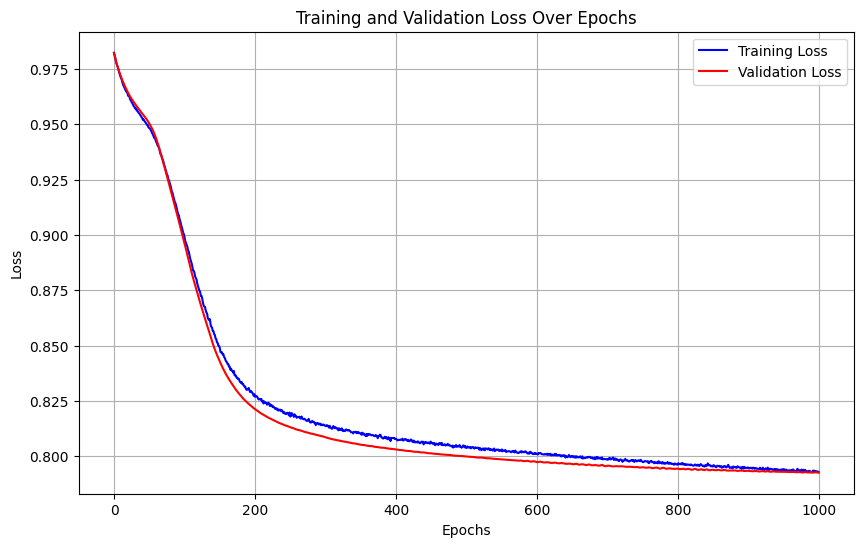

Training run 35/50 for 10% of the data...
Sample size for 10%: 19975


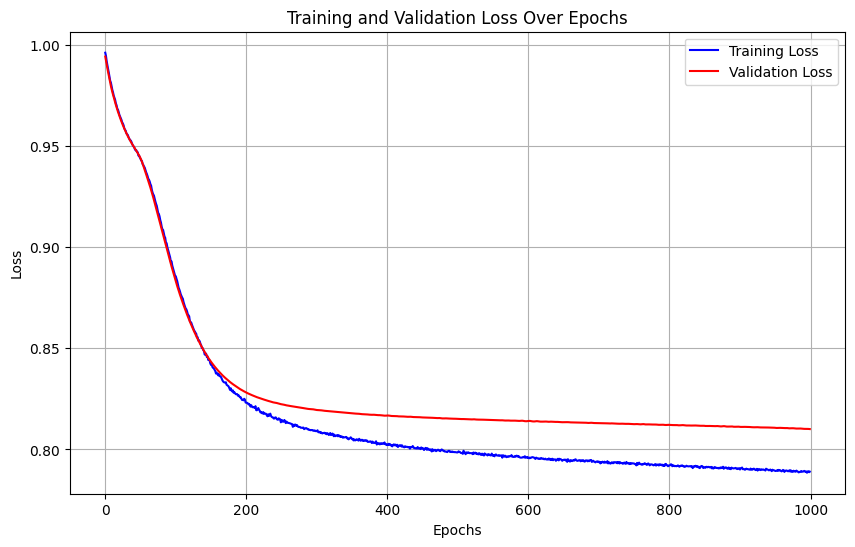

Training run 36/50 for 10% of the data...
Sample size for 10%: 19975


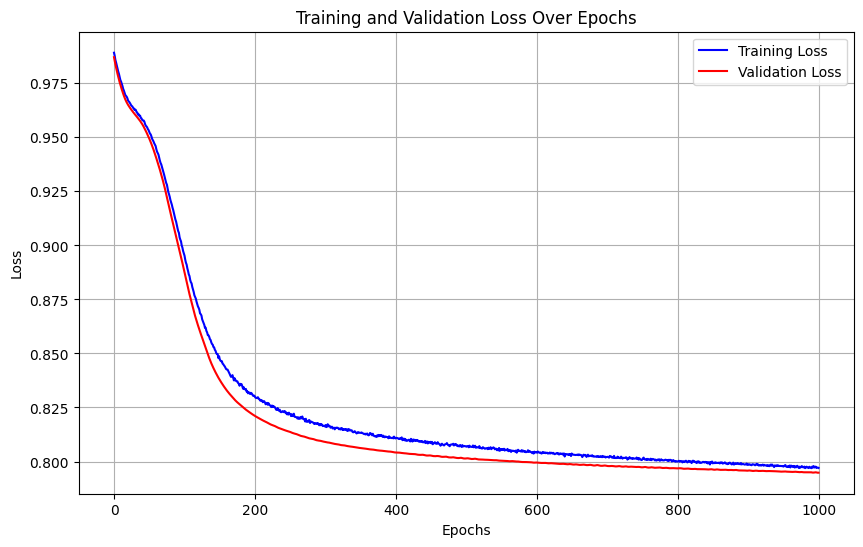

Training run 37/50 for 10% of the data...
Sample size for 10%: 19975


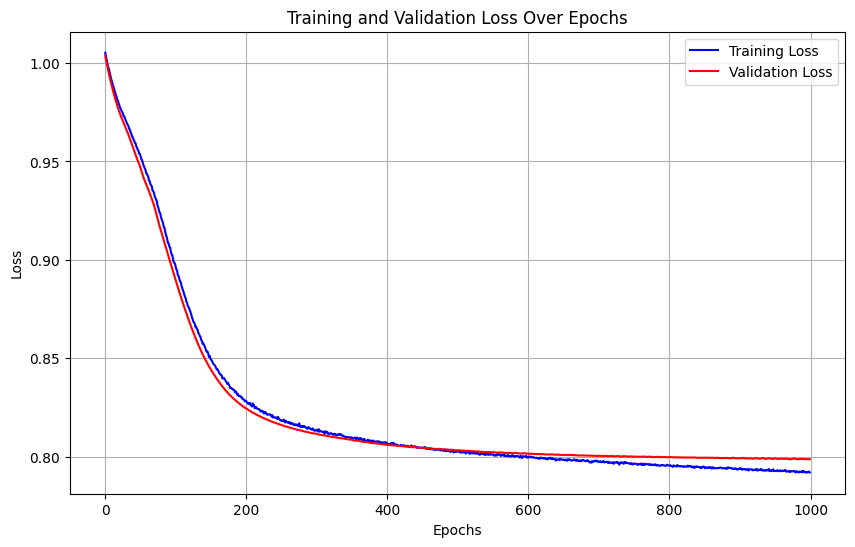

Training run 38/50 for 10% of the data...
Sample size for 10%: 19975


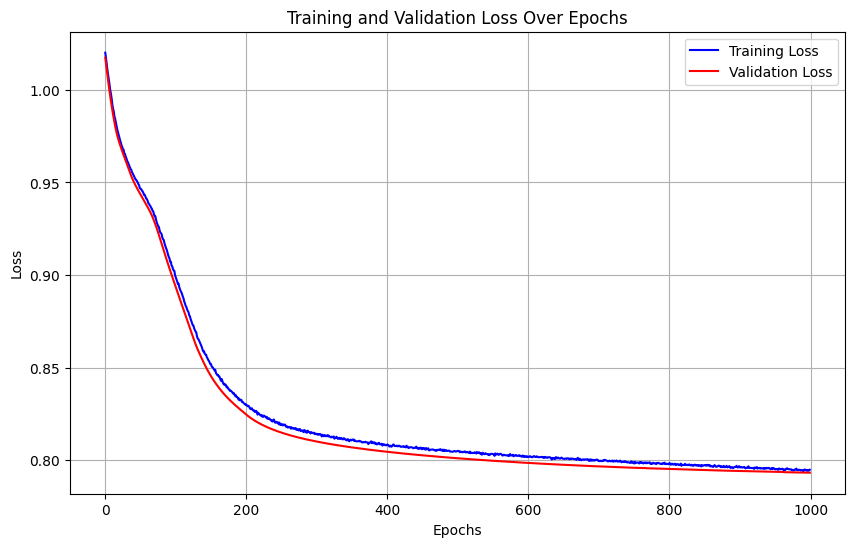

Training run 39/50 for 10% of the data...
Sample size for 10%: 19975


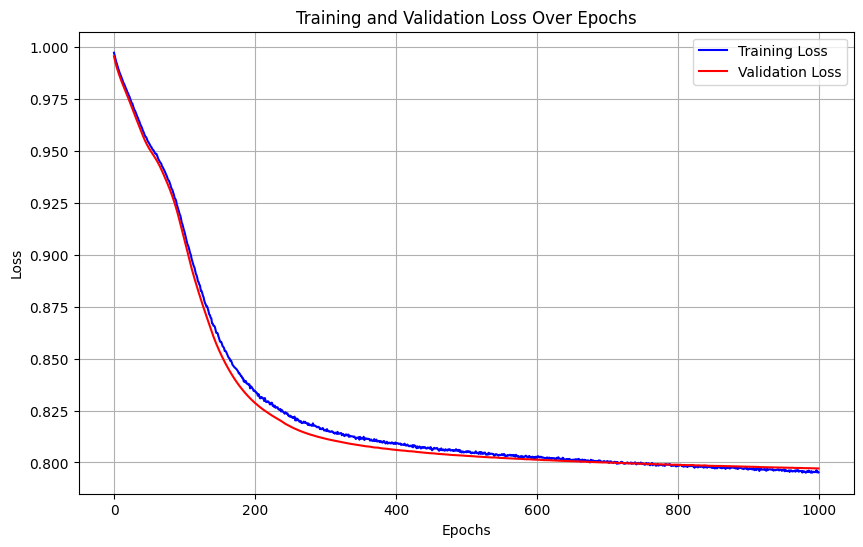

Training run 40/50 for 10% of the data...
Sample size for 10%: 19975


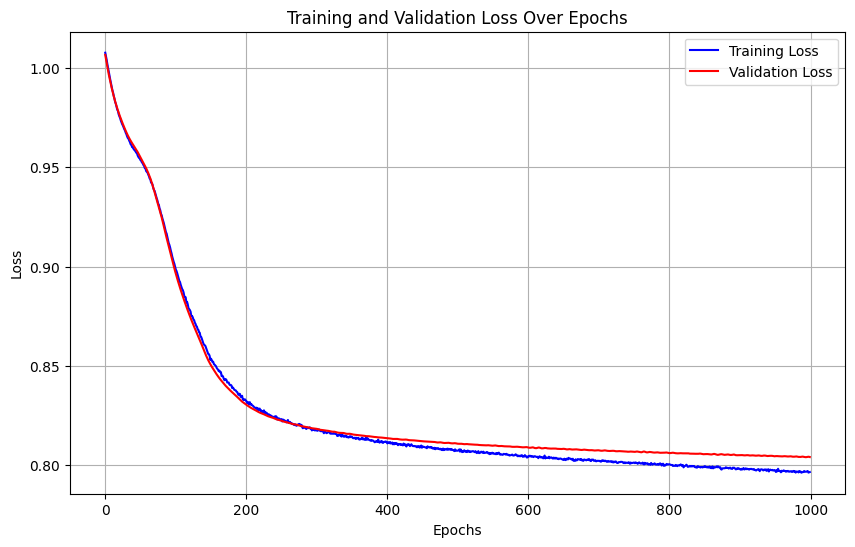

Training run 41/50 for 10% of the data...
Sample size for 10%: 19975


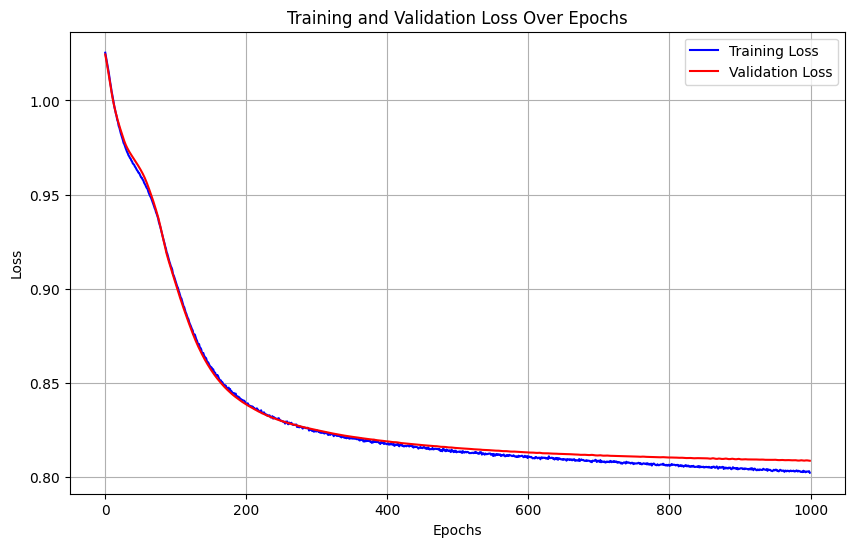

Training run 42/50 for 10% of the data...
Sample size for 10%: 19975


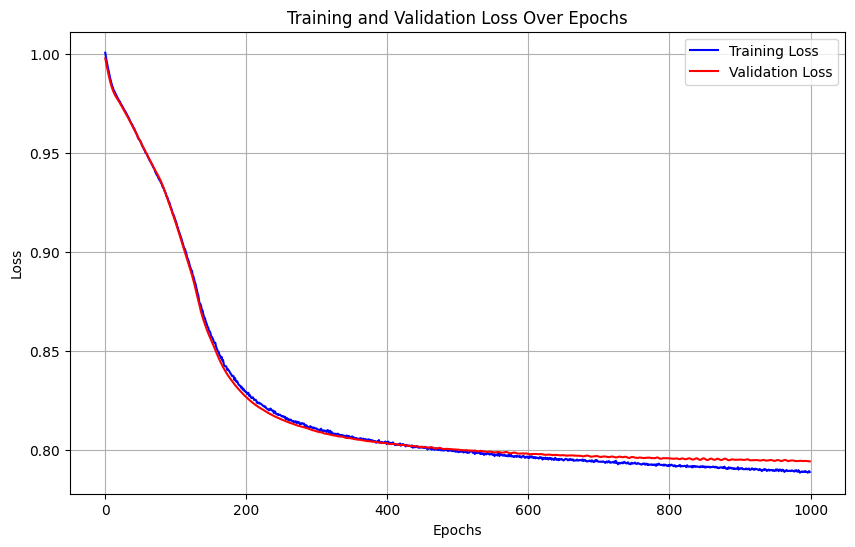

Training run 43/50 for 10% of the data...
Sample size for 10%: 19975


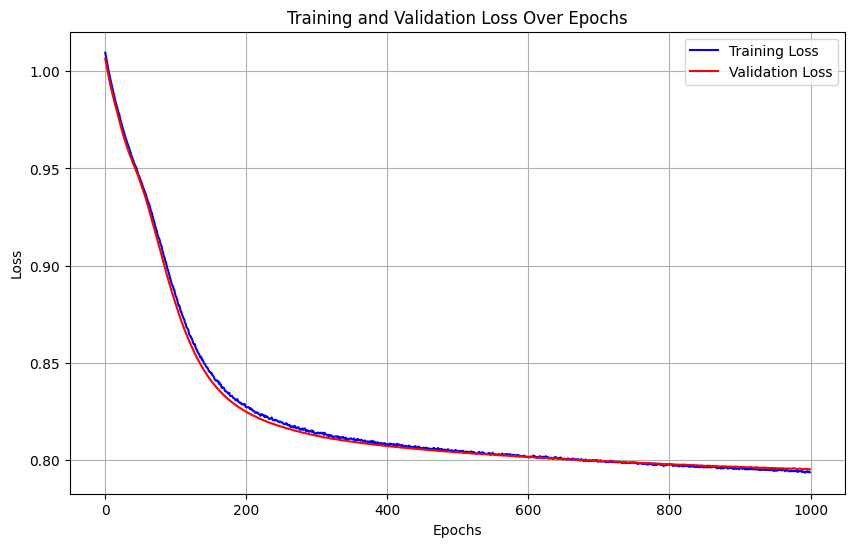

Training run 44/50 for 10% of the data...
Sample size for 10%: 19975


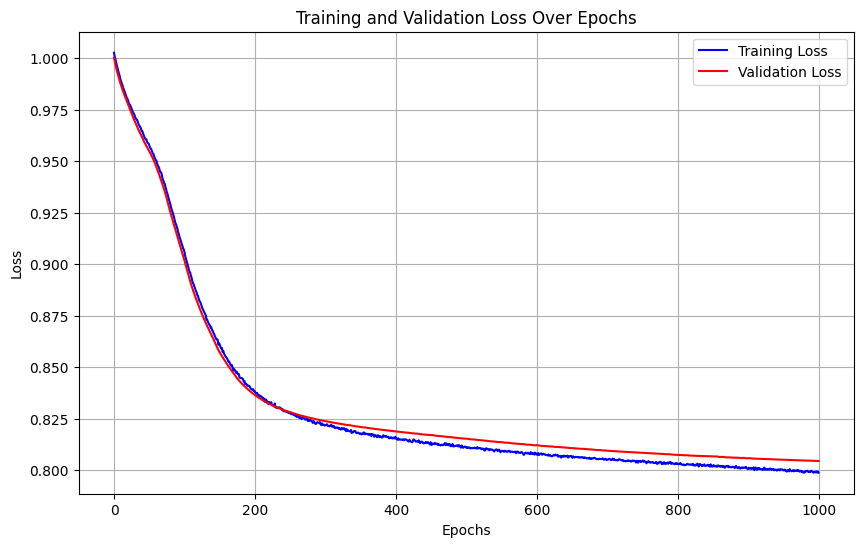

Training run 45/50 for 10% of the data...
Sample size for 10%: 19975


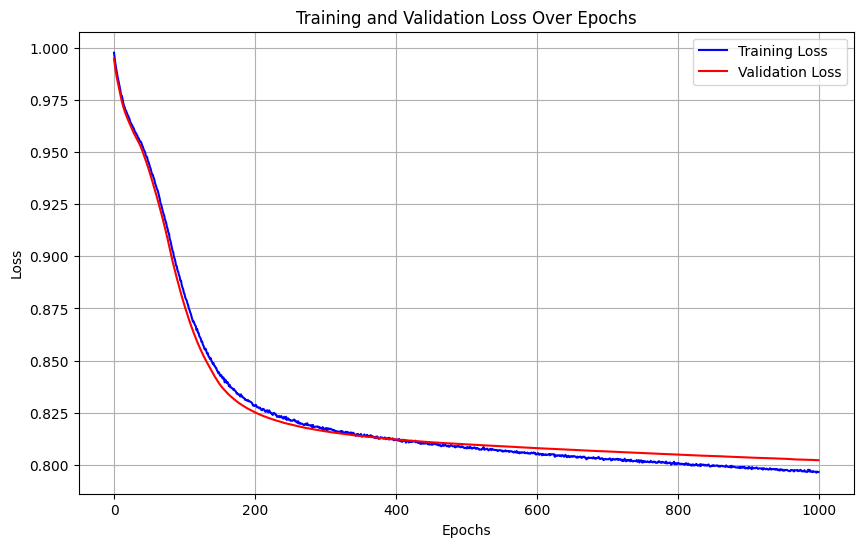

Training run 46/50 for 10% of the data...
Sample size for 10%: 19975


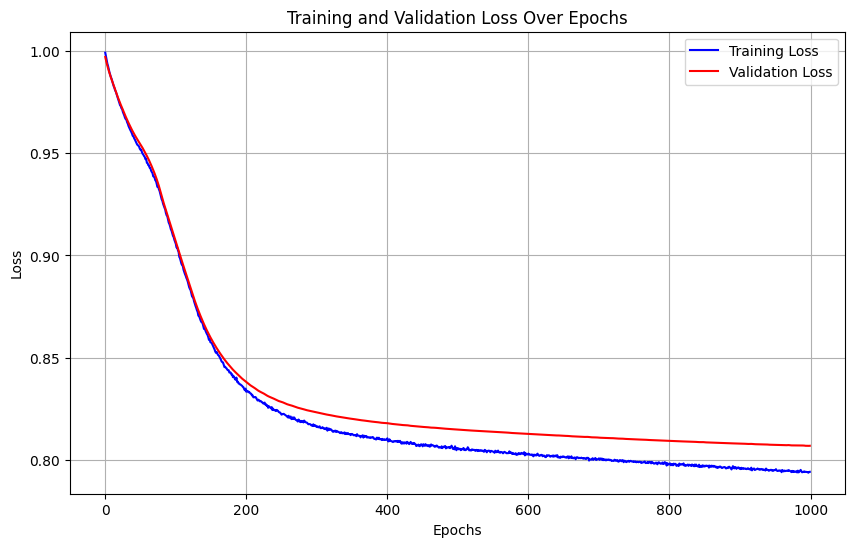

Training run 47/50 for 10% of the data...
Sample size for 10%: 19975


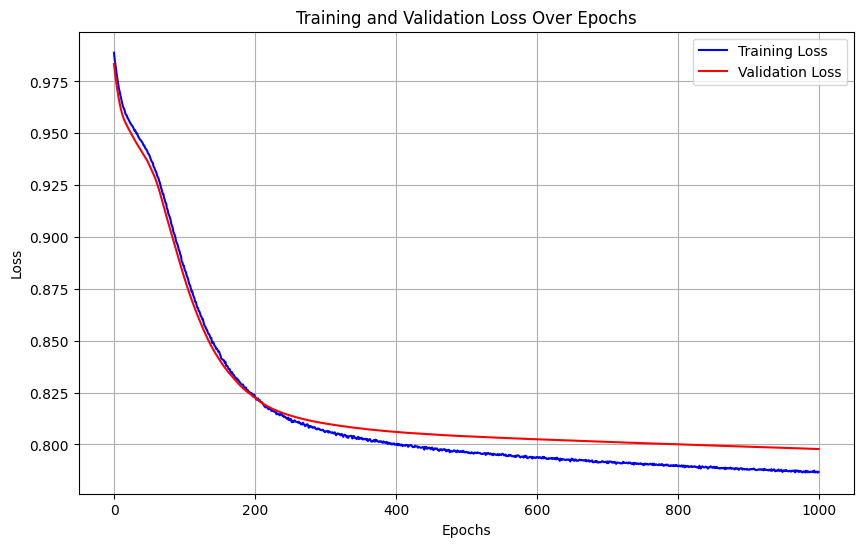

Training run 48/50 for 10% of the data...
Sample size for 10%: 19975


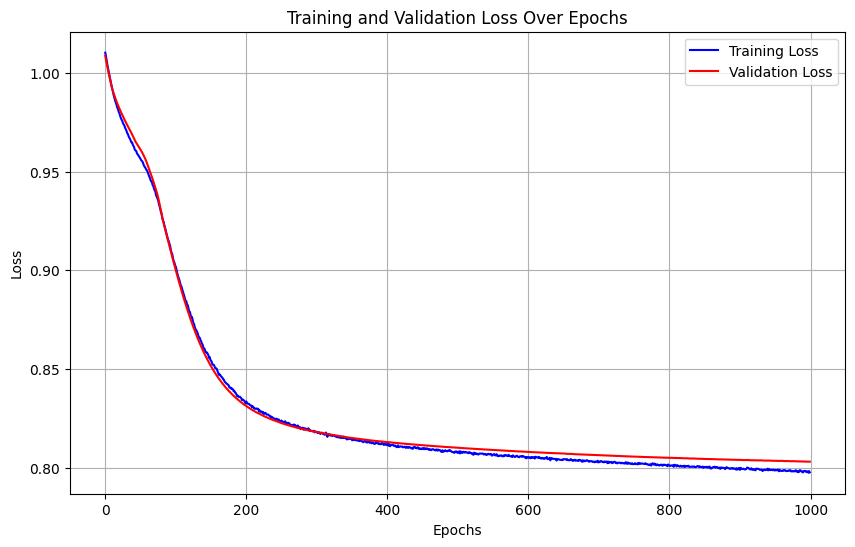

Training run 49/50 for 10% of the data...
Sample size for 10%: 19975


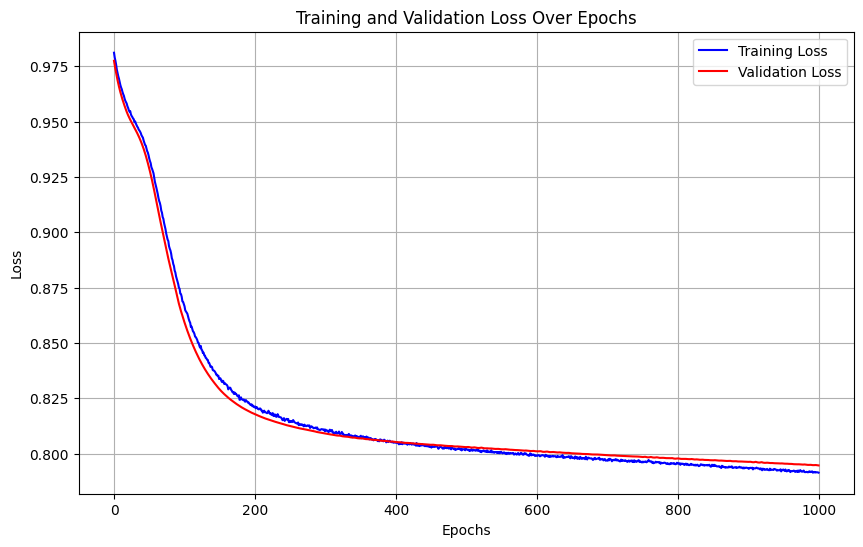

Training run 50/50 for 10% of the data...
Sample size for 10%: 19975


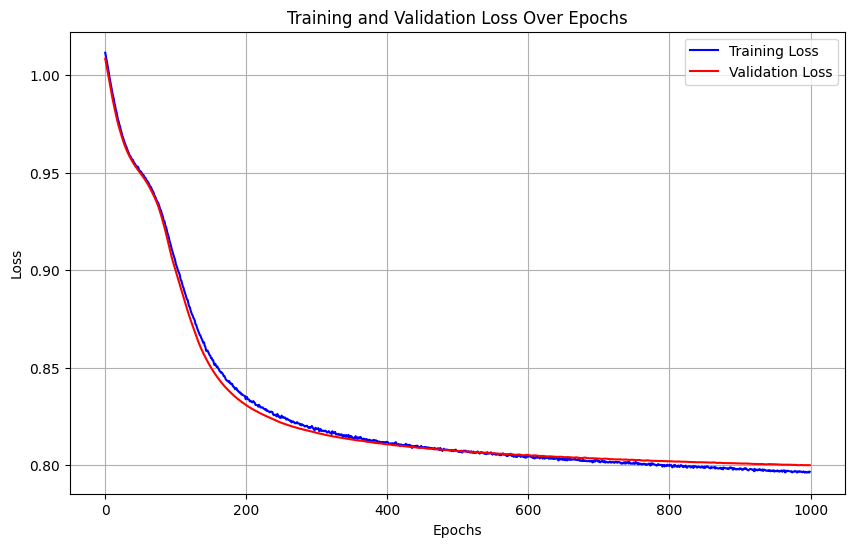

Metrics for 10% of data:
Final Metrics (Aggregated Predictions): {'accuracy': np.float64(0.854723404255319), 'precision': np.float64(0.7800485862429838), 'recall': np.float64(0.7464717649880732), 'f1': np.float64(0.7627896383201628), 'fpr': np.float64(0.09594344944791054)}
Metrics Across Runs:
accuracy: 0.8547 ± 0.0068
precision: 0.7800 ± 0.0145
recall: 0.7465 ± 0.0135
f1: 0.7628 ± 0.0108
fpr: 0.0959 ± 0.0072
Training model for 20% of the data...
Training run 1/50 for 20% of the data...
Sample size for 20%: 39951


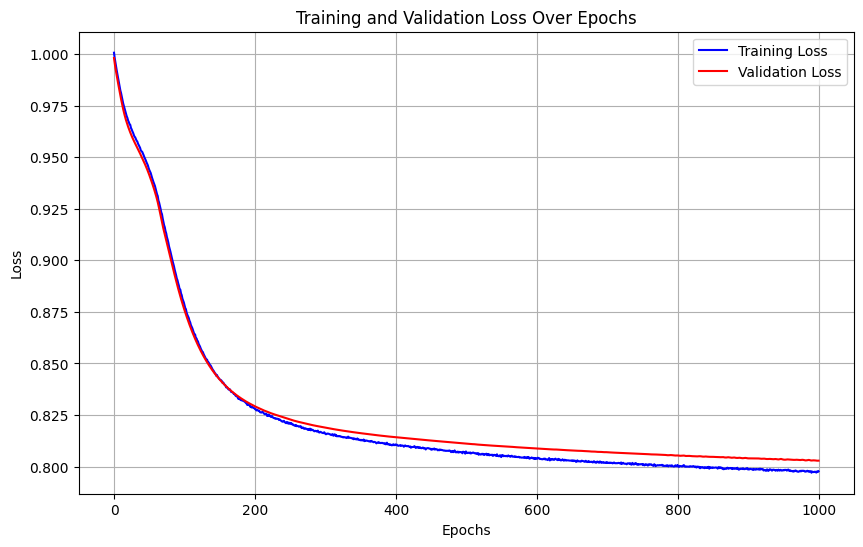

Training run 2/50 for 20% of the data...
Sample size for 20%: 39951


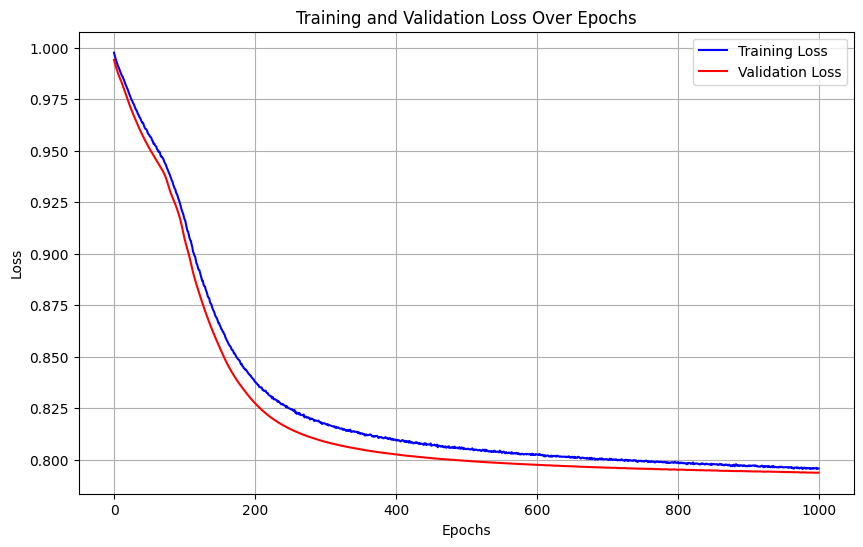

Training run 3/50 for 20% of the data...
Sample size for 20%: 39951


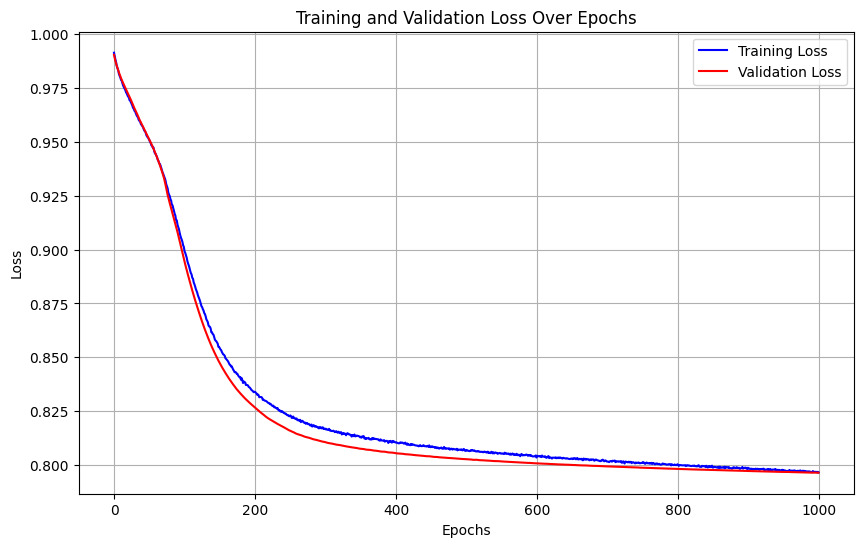

Training run 4/50 for 20% of the data...
Sample size for 20%: 39951


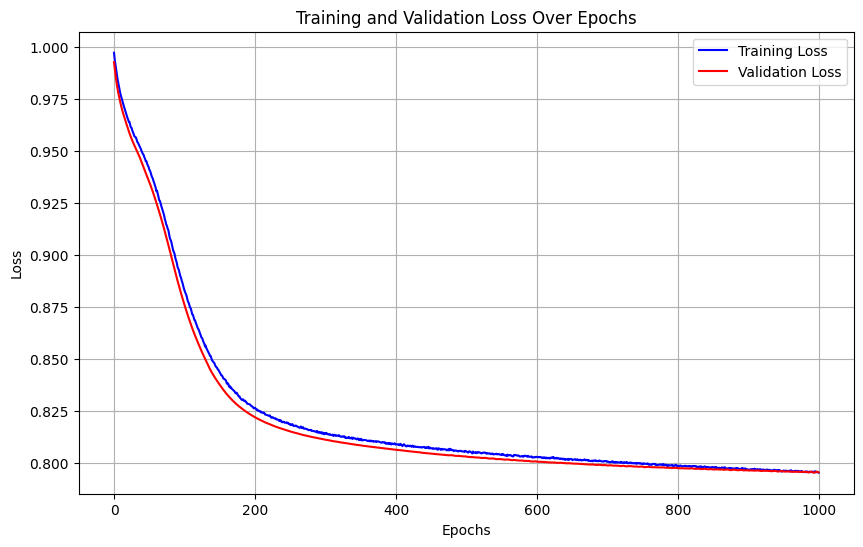

Training run 5/50 for 20% of the data...
Sample size for 20%: 39951


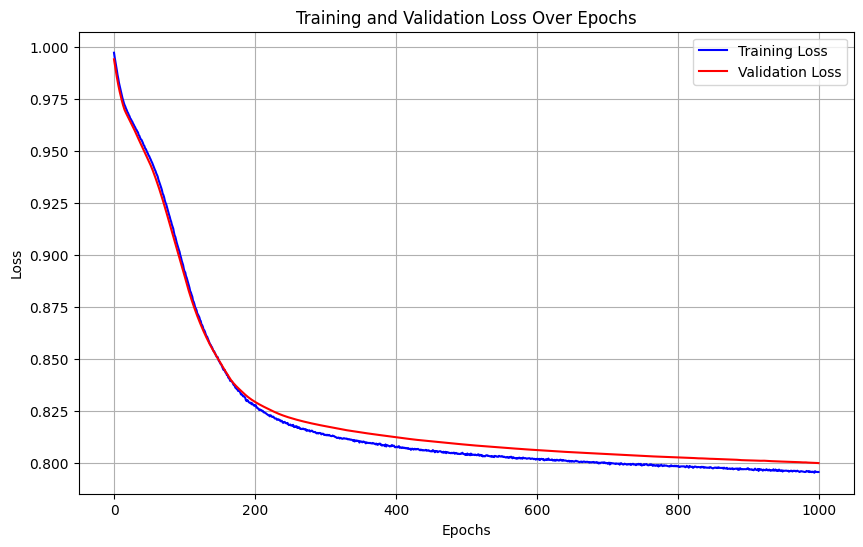

Training run 6/50 for 20% of the data...
Sample size for 20%: 39951


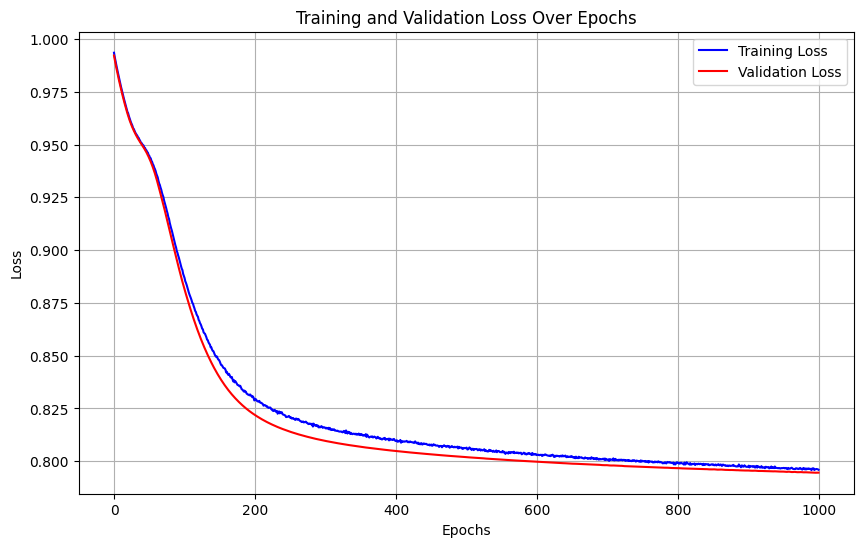

Training run 7/50 for 20% of the data...
Sample size for 20%: 39951


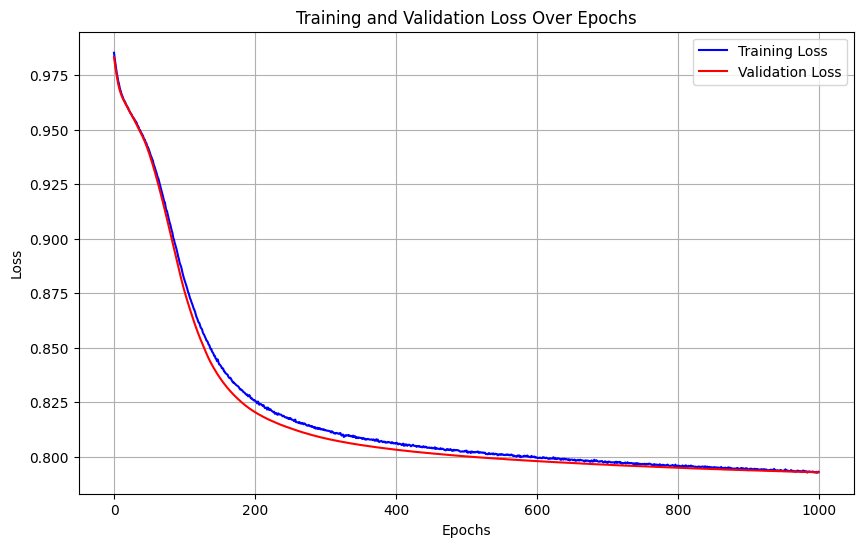

Training run 8/50 for 20% of the data...
Sample size for 20%: 39951


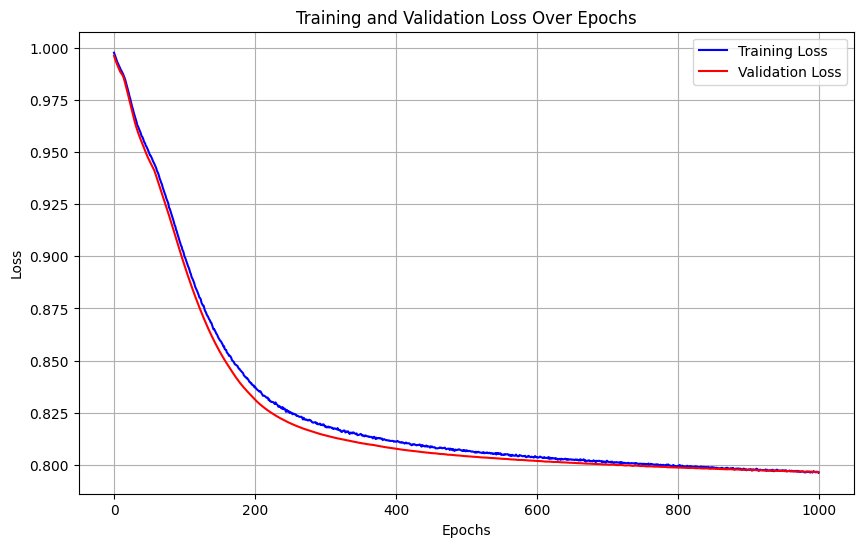

Training run 9/50 for 20% of the data...
Sample size for 20%: 39951


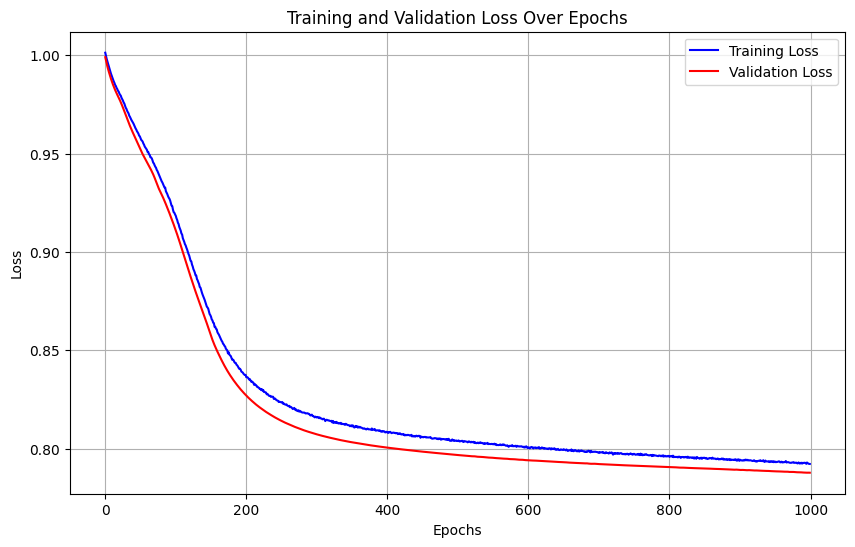

Training run 10/50 for 20% of the data...
Sample size for 20%: 39951


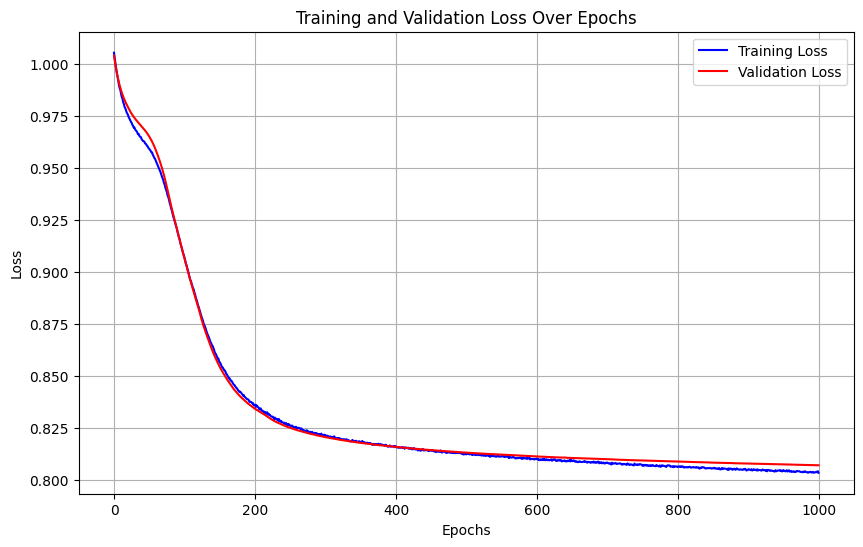

Training run 11/50 for 20% of the data...
Sample size for 20%: 39951


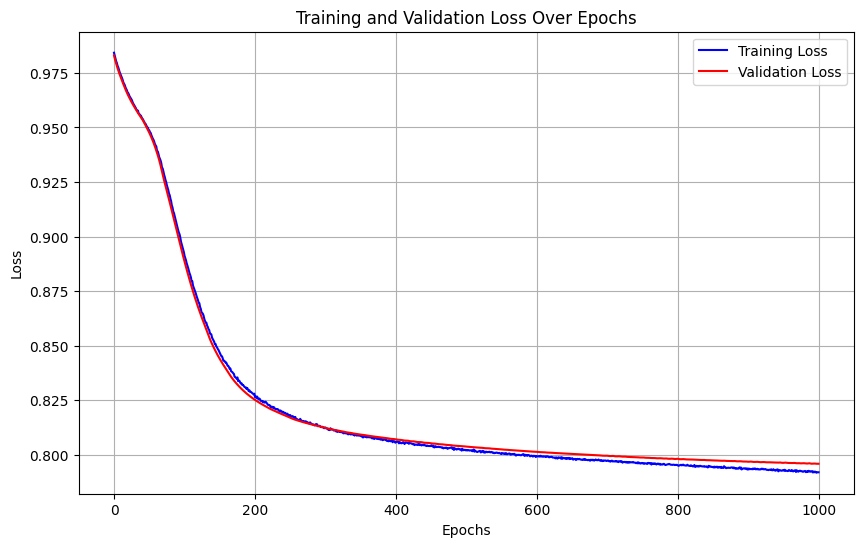

Training run 12/50 for 20% of the data...
Sample size for 20%: 39951


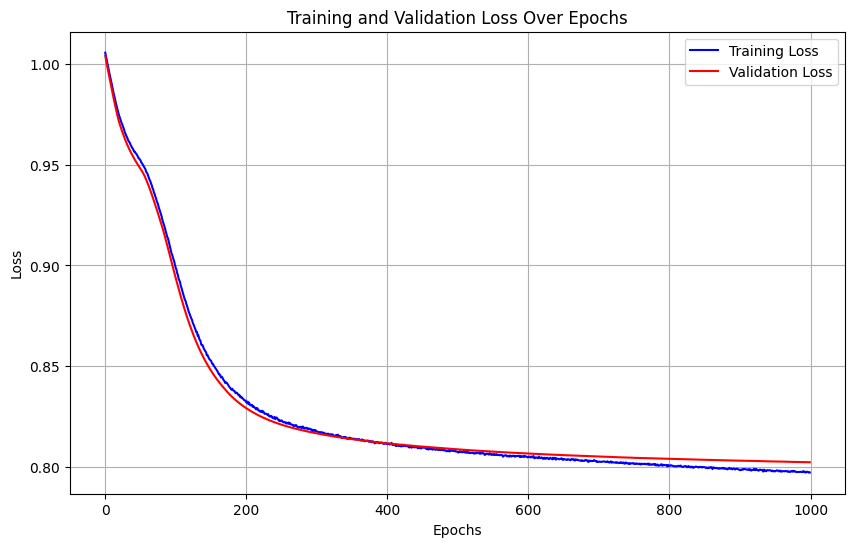

Training run 13/50 for 20% of the data...
Sample size for 20%: 39951


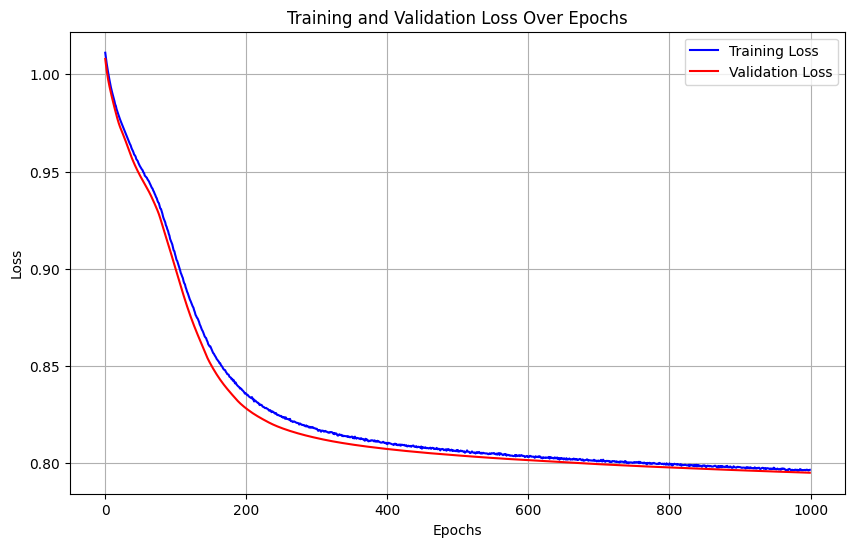

Training run 14/50 for 20% of the data...
Sample size for 20%: 39951


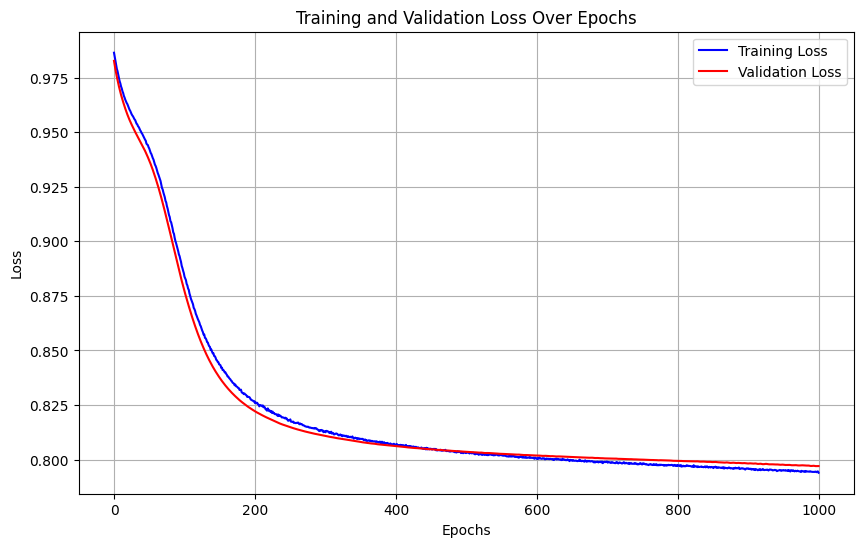

Training run 15/50 for 20% of the data...
Sample size for 20%: 39951


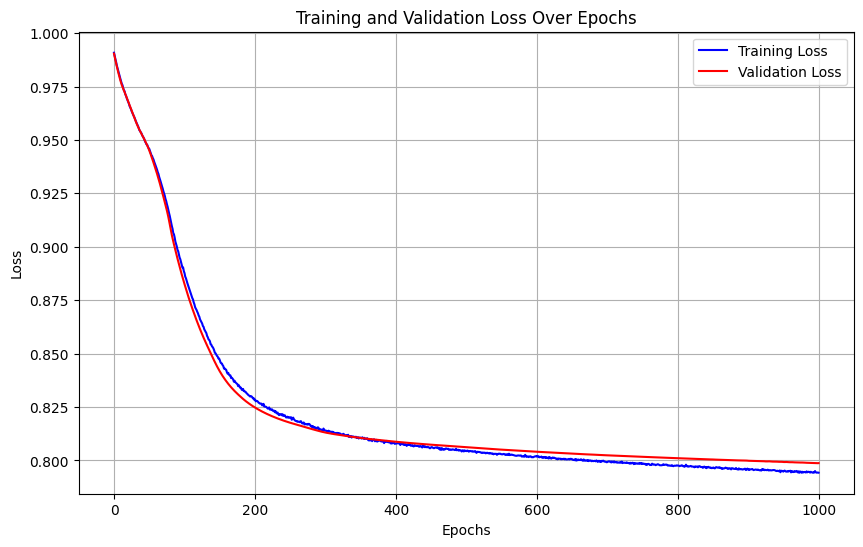

Training run 16/50 for 20% of the data...
Sample size for 20%: 39951


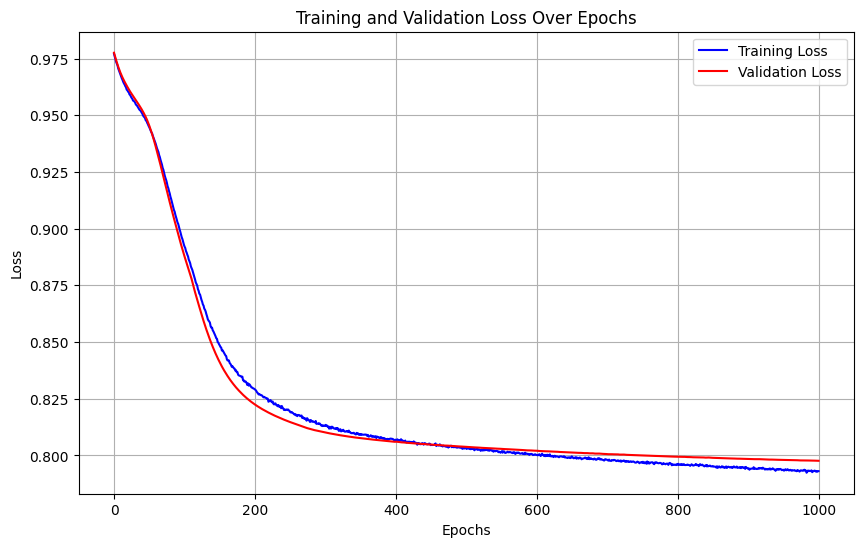

Training run 17/50 for 20% of the data...
Sample size for 20%: 39951


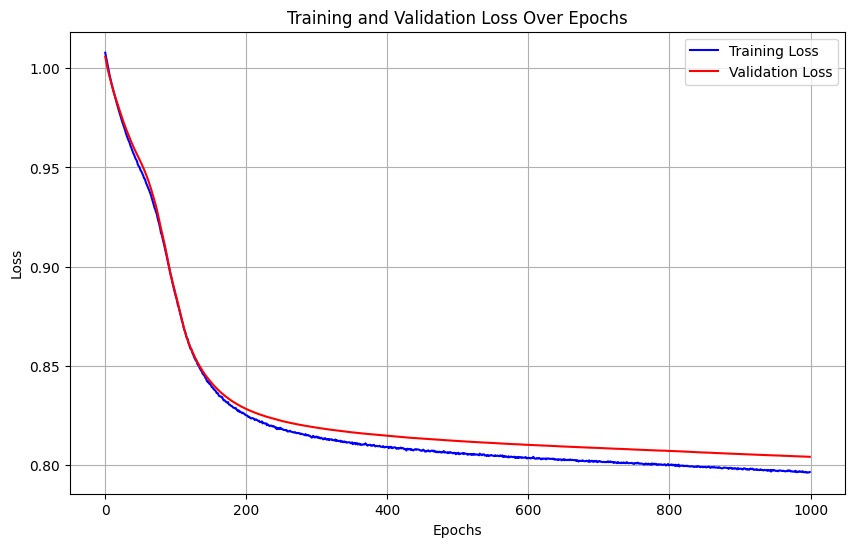

Training run 18/50 for 20% of the data...
Sample size for 20%: 39951


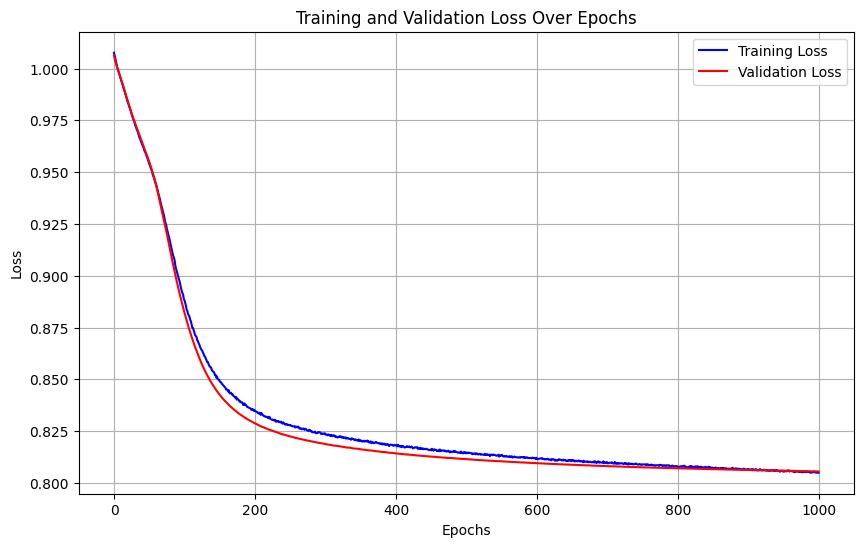

Training run 19/50 for 20% of the data...
Sample size for 20%: 39951


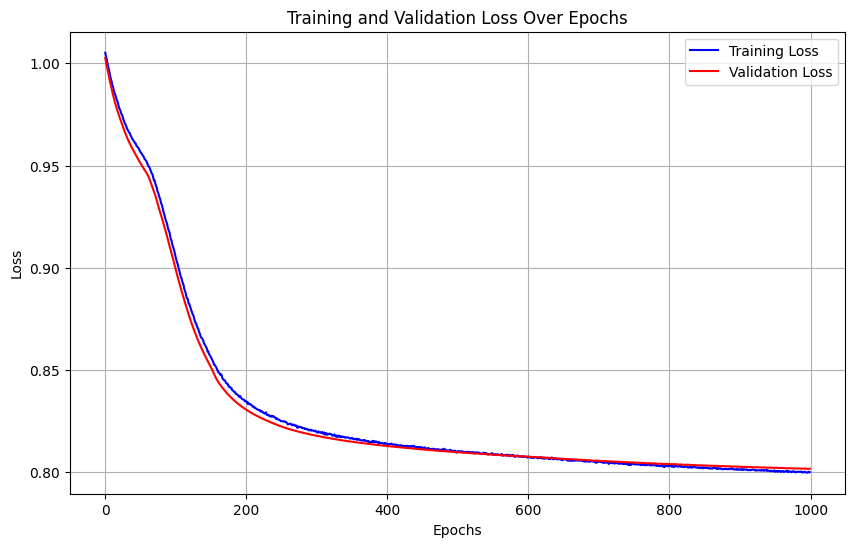

Training run 20/50 for 20% of the data...
Sample size for 20%: 39951


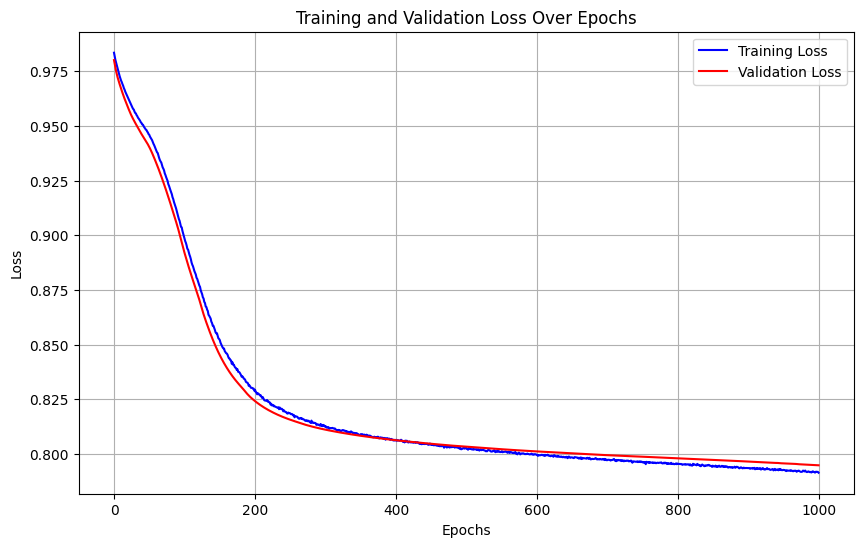

Training run 21/50 for 20% of the data...
Sample size for 20%: 39951


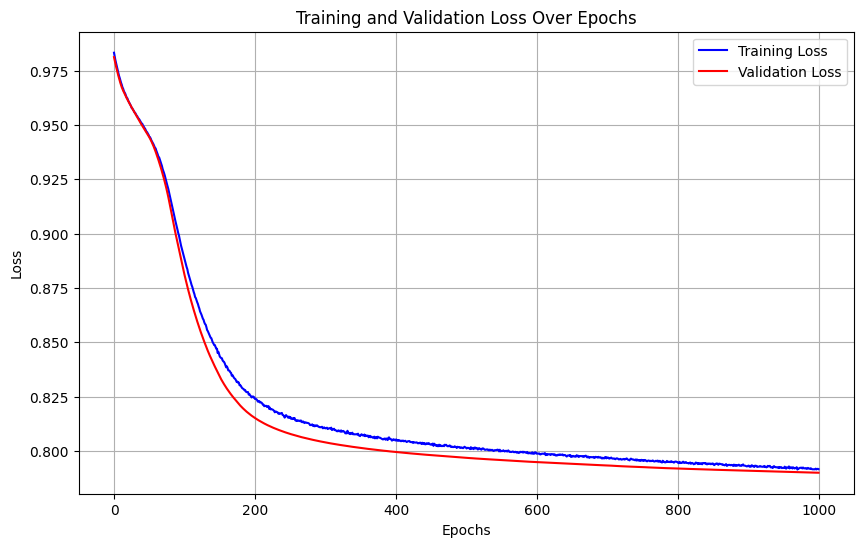

Training run 22/50 for 20% of the data...
Sample size for 20%: 39951


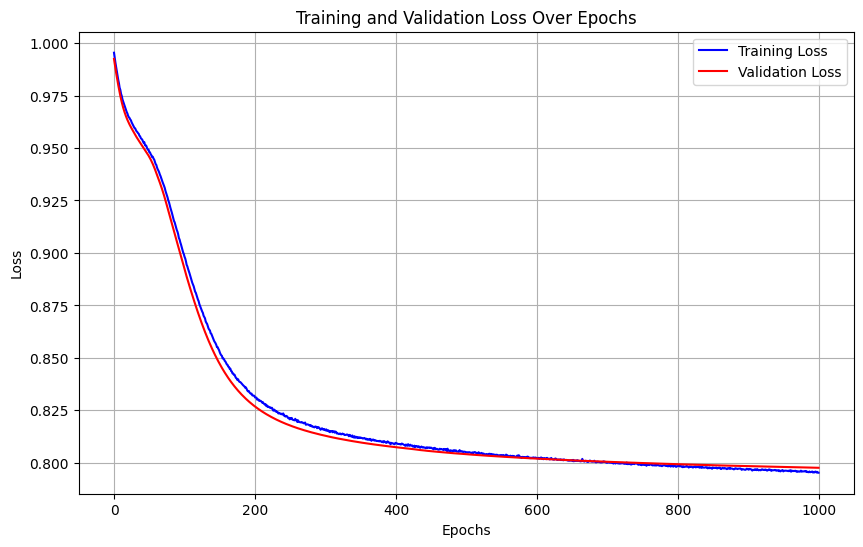

Training run 23/50 for 20% of the data...
Sample size for 20%: 39951


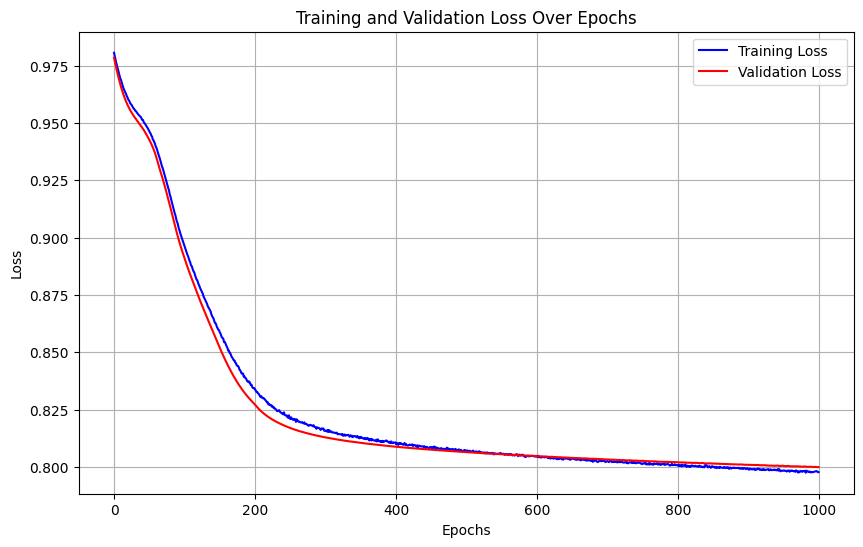

Training run 24/50 for 20% of the data...
Sample size for 20%: 39951


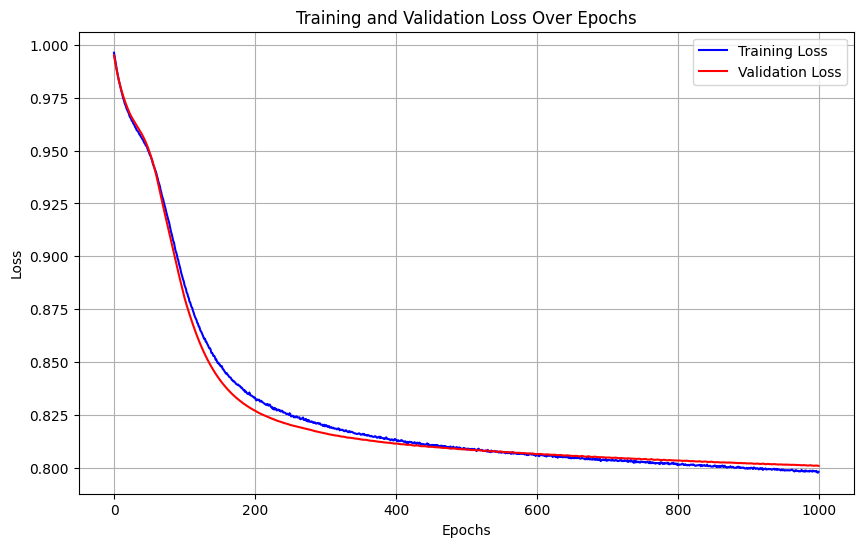

Training run 25/50 for 20% of the data...
Sample size for 20%: 39951


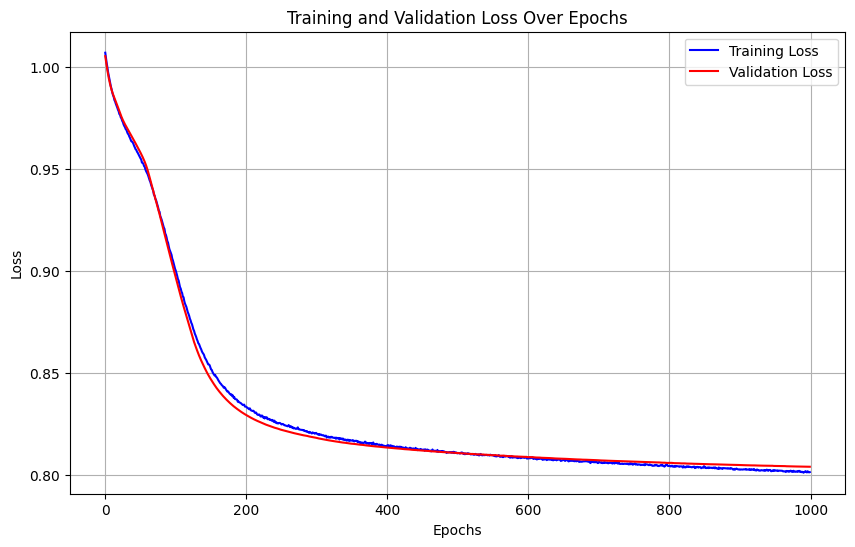

Training run 26/50 for 20% of the data...
Sample size for 20%: 39951


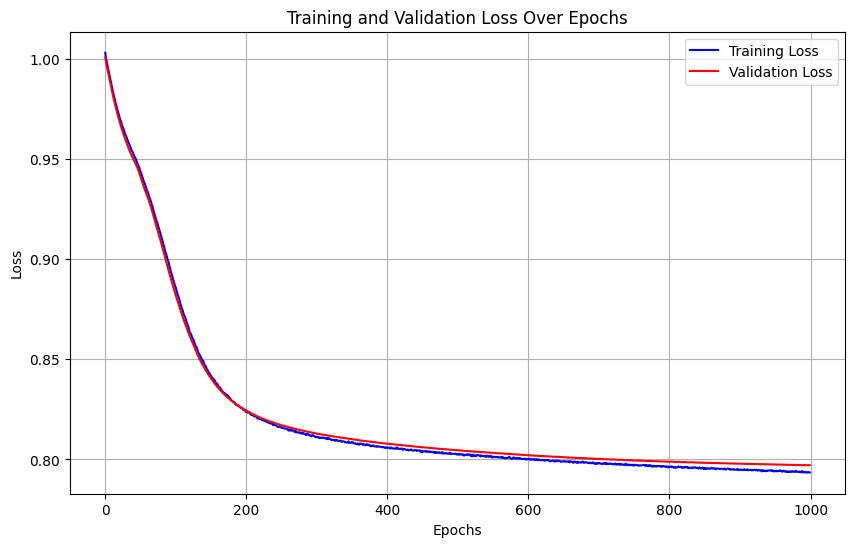

Training run 27/50 for 20% of the data...
Sample size for 20%: 39951


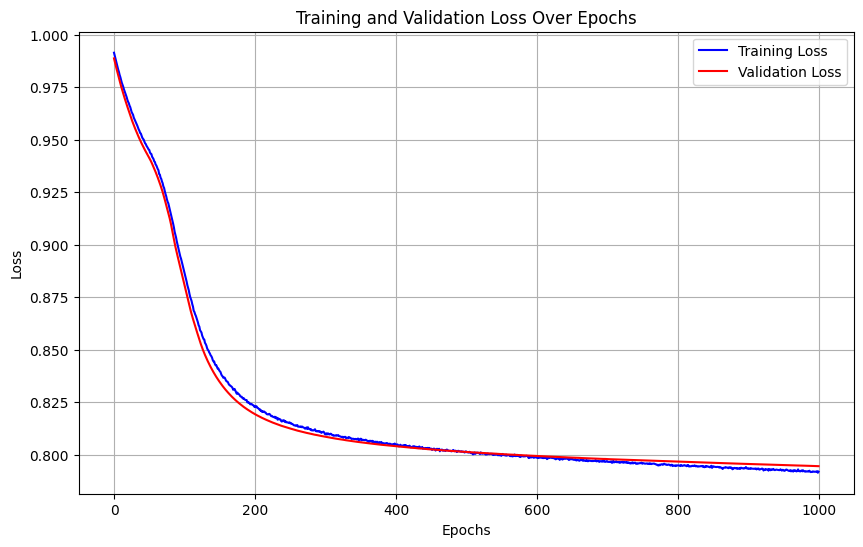

Training run 28/50 for 20% of the data...
Sample size for 20%: 39951


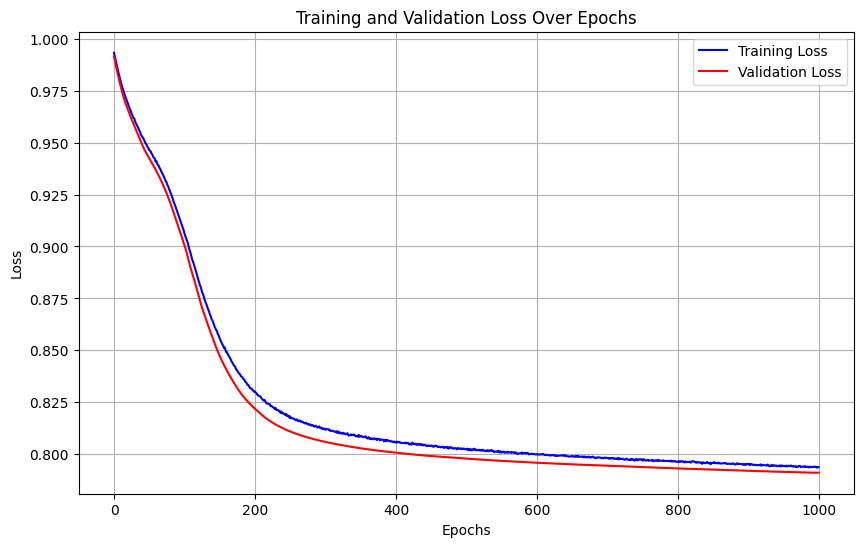

Training run 29/50 for 20% of the data...
Sample size for 20%: 39951


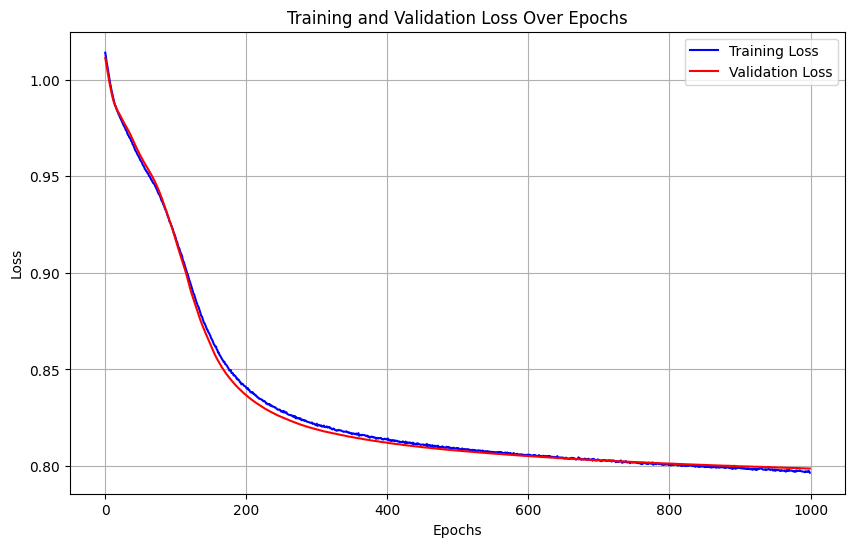

Training run 30/50 for 20% of the data...
Sample size for 20%: 39951


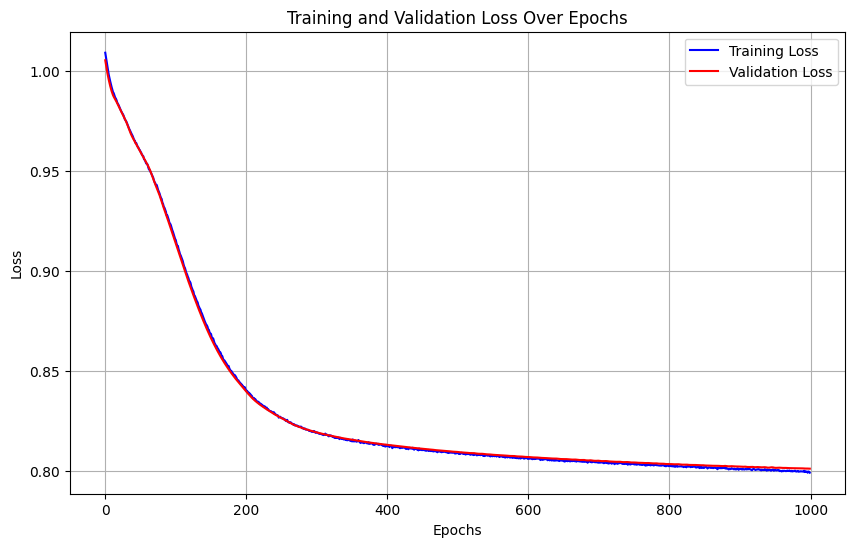

Training run 31/50 for 20% of the data...
Sample size for 20%: 39951


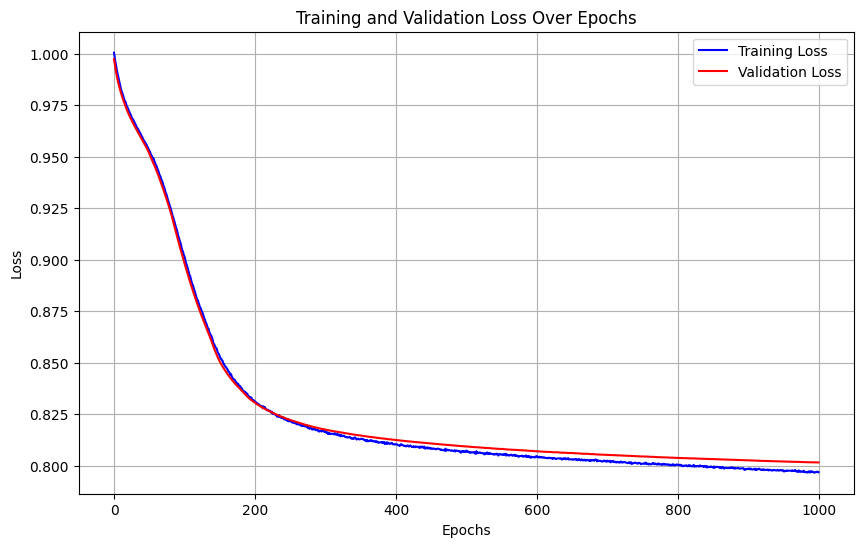

Training run 32/50 for 20% of the data...
Sample size for 20%: 39951


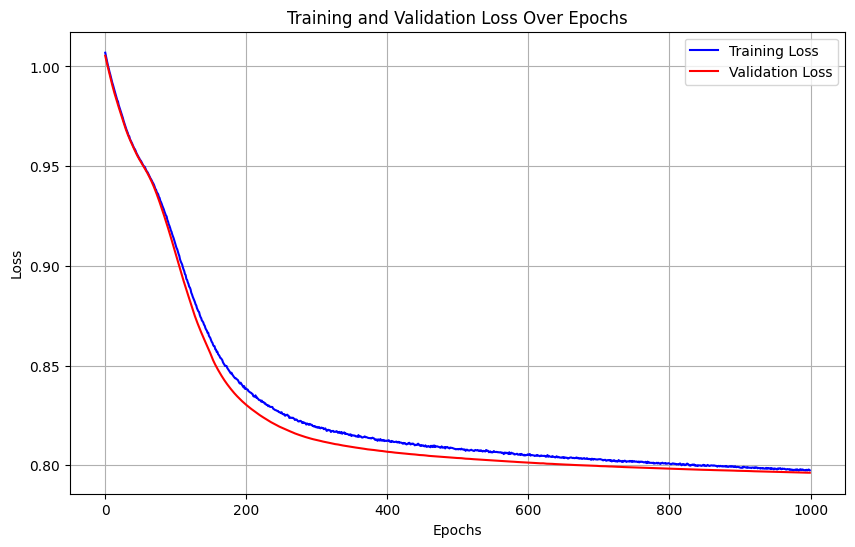

Training run 33/50 for 20% of the data...
Sample size for 20%: 39951


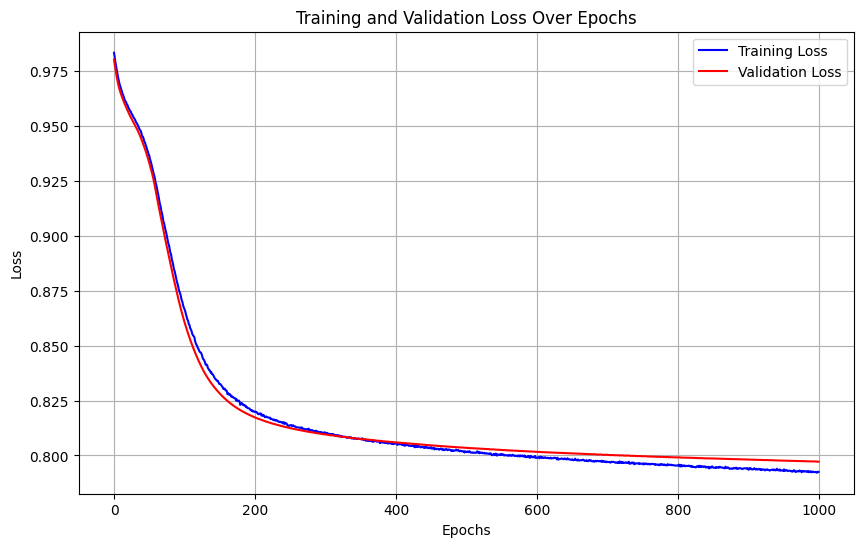

Training run 34/50 for 20% of the data...
Sample size for 20%: 39951


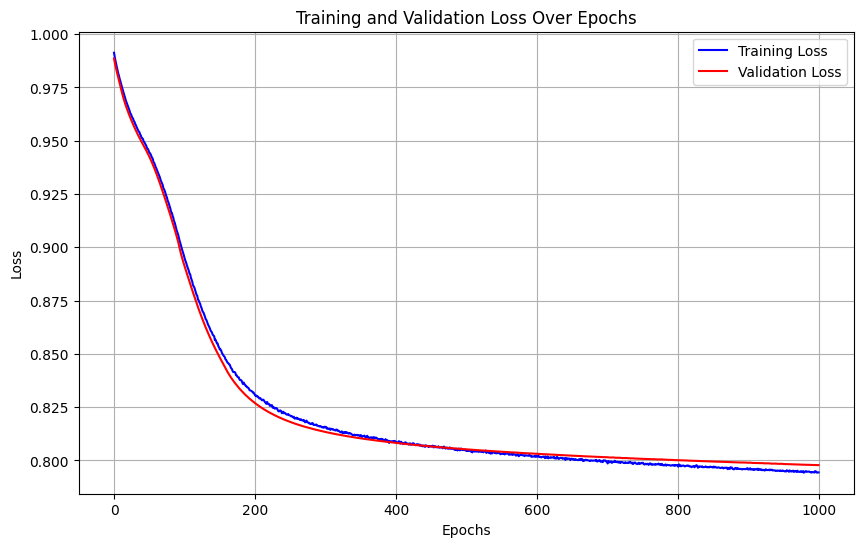

Training run 35/50 for 20% of the data...
Sample size for 20%: 39951


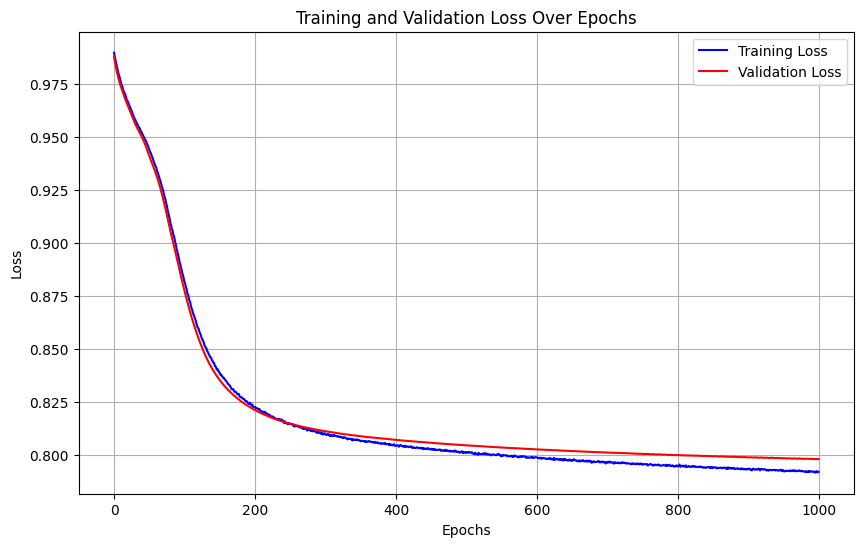

Training run 36/50 for 20% of the data...
Sample size for 20%: 39951


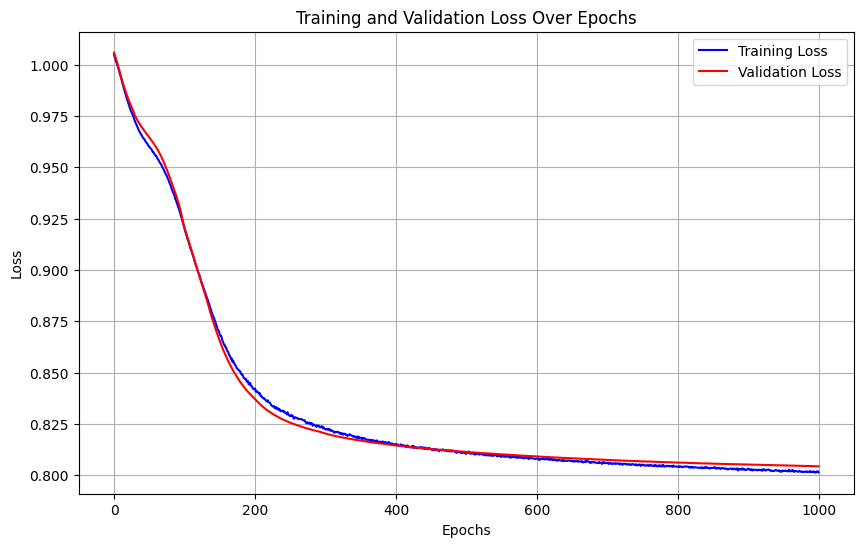

Training run 37/50 for 20% of the data...
Sample size for 20%: 39951


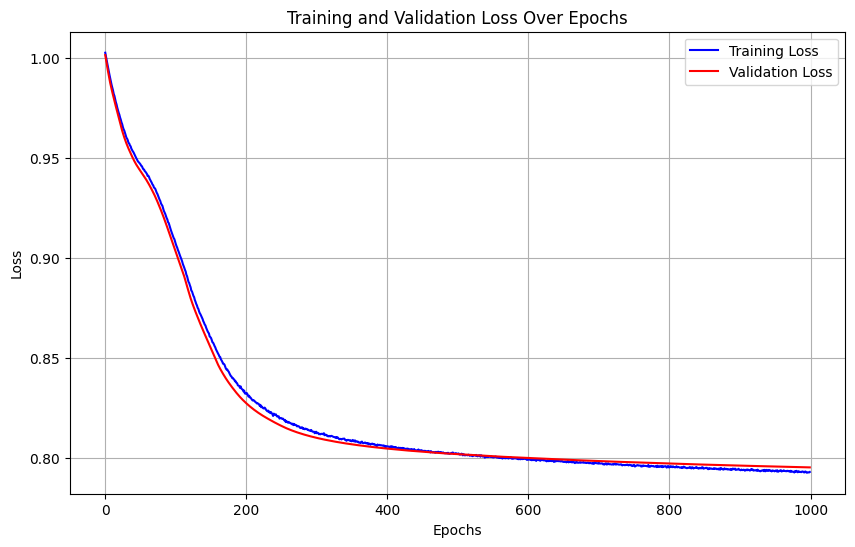

Training run 38/50 for 20% of the data...
Sample size for 20%: 39951


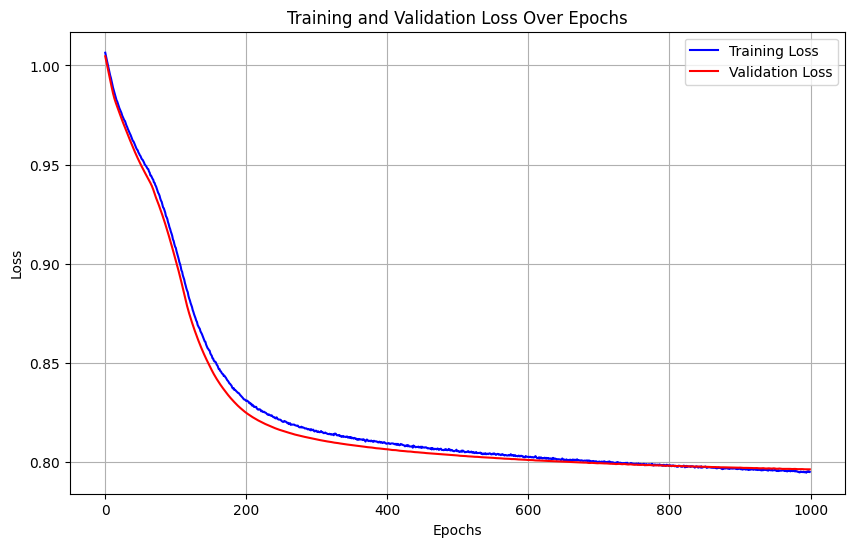

Training run 39/50 for 20% of the data...
Sample size for 20%: 39951


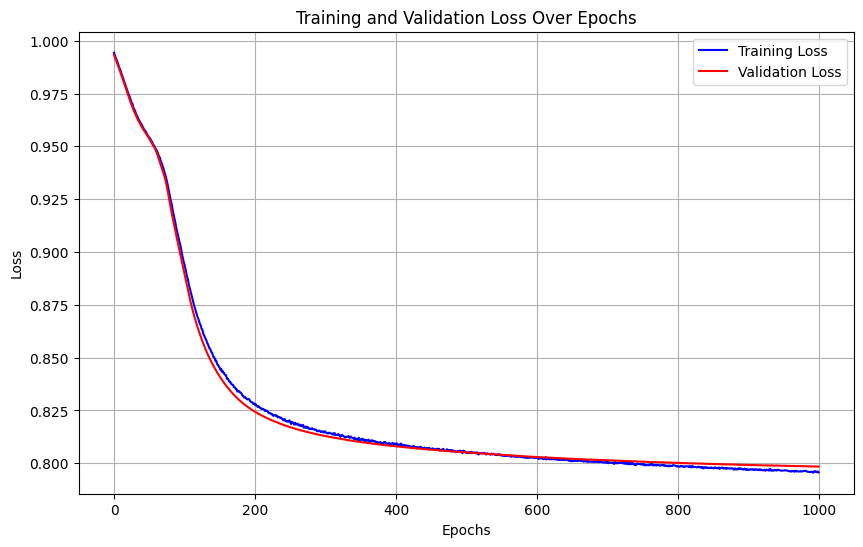

Training run 40/50 for 20% of the data...
Sample size for 20%: 39951


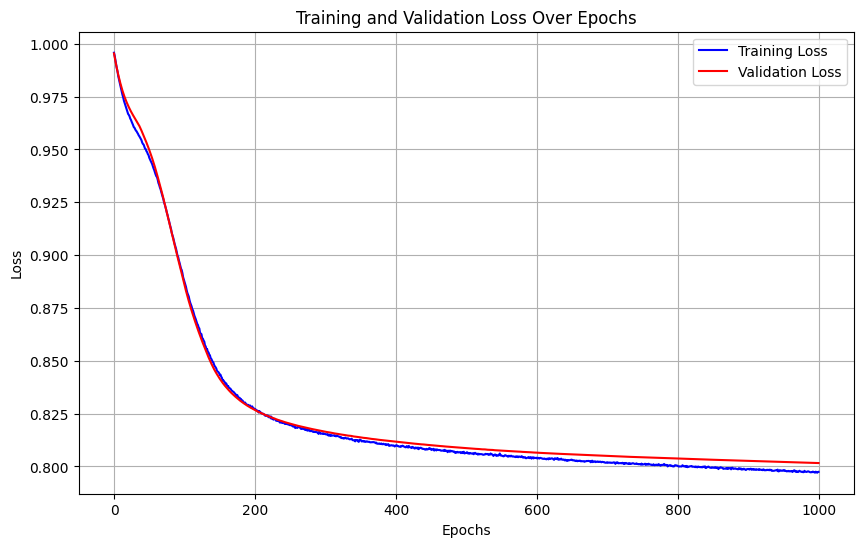

Training run 41/50 for 20% of the data...
Sample size for 20%: 39951


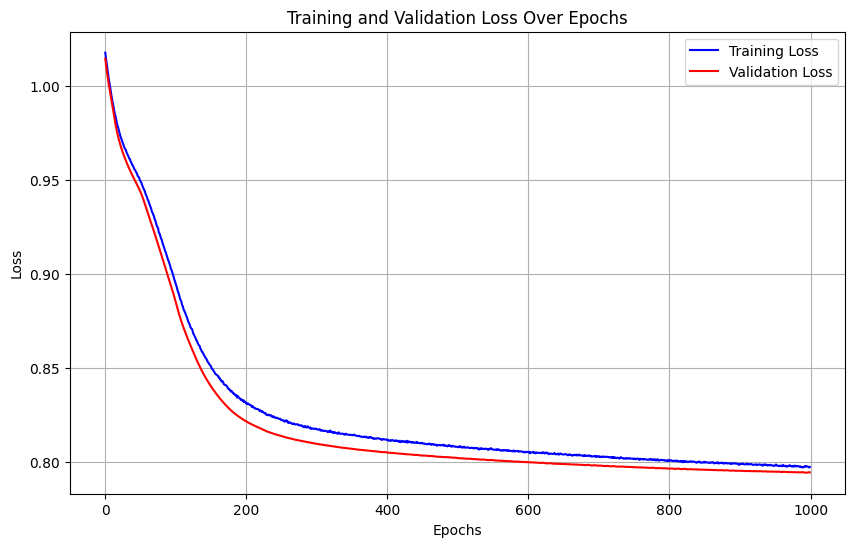

Training run 42/50 for 20% of the data...
Sample size for 20%: 39951


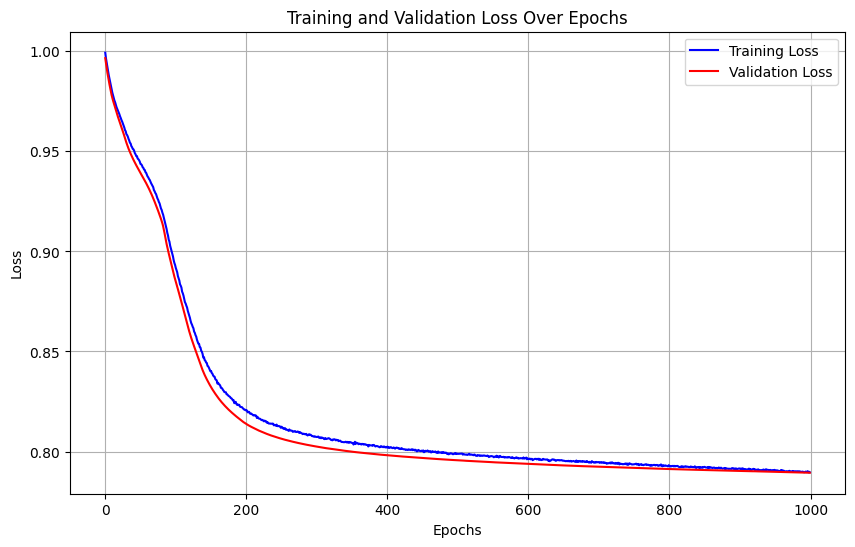

Training run 43/50 for 20% of the data...
Sample size for 20%: 39951


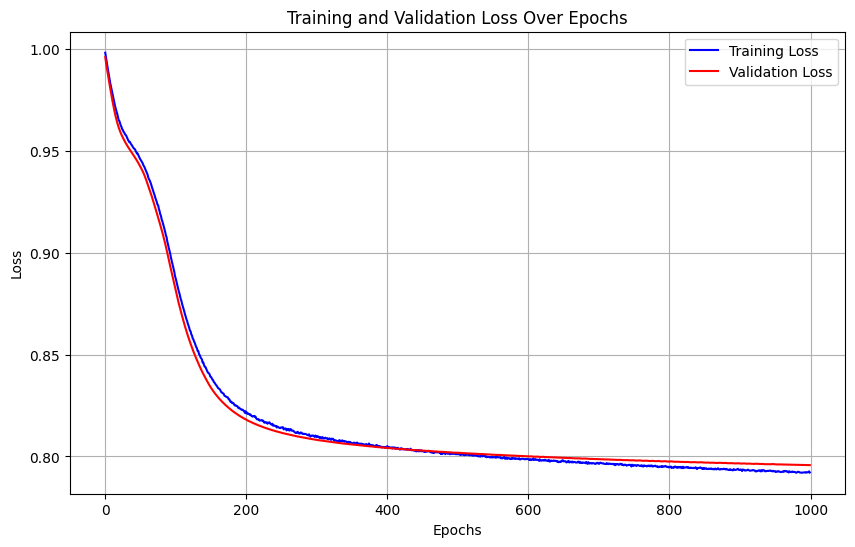

Training run 44/50 for 20% of the data...
Sample size for 20%: 39951


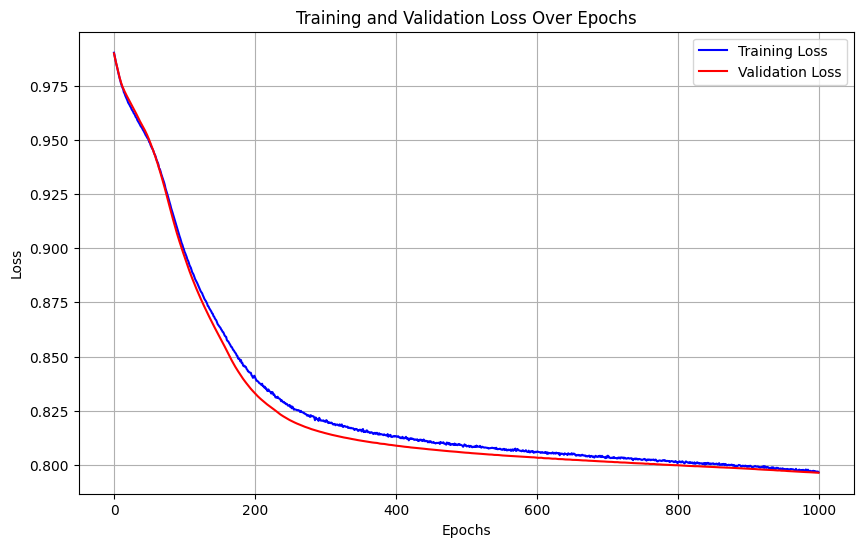

Training run 45/50 for 20% of the data...
Sample size for 20%: 39951


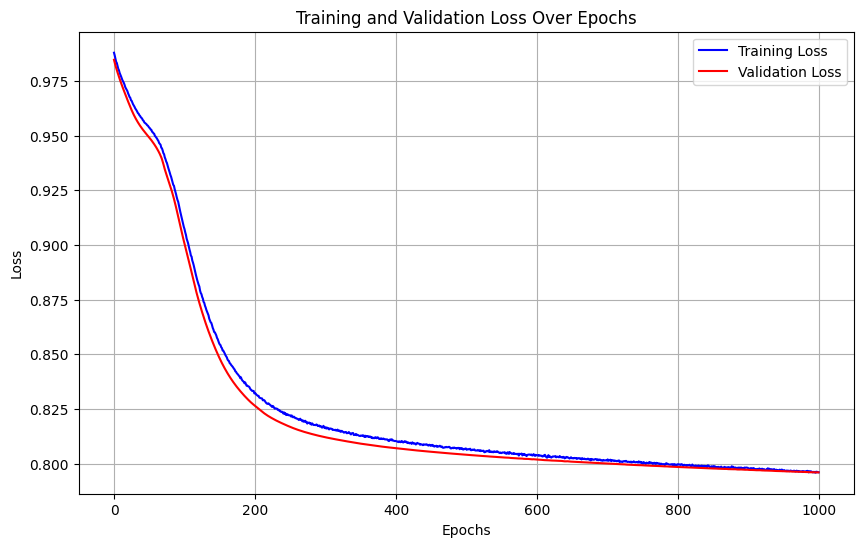

Training run 46/50 for 20% of the data...
Sample size for 20%: 39951


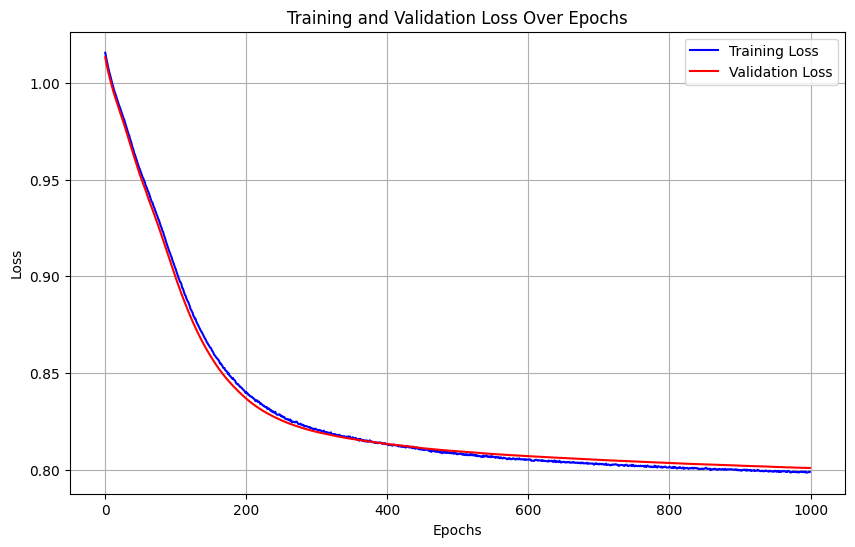

Training run 47/50 for 20% of the data...
Sample size for 20%: 39951


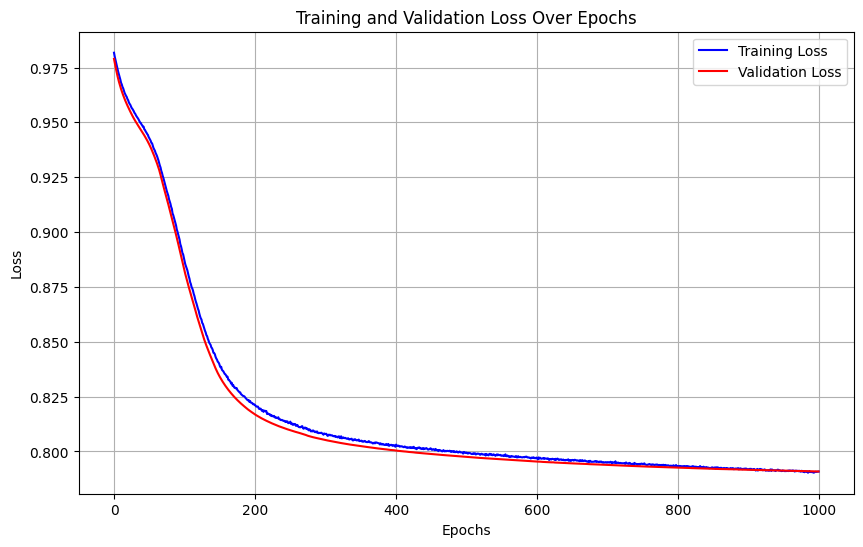

Training run 48/50 for 20% of the data...
Sample size for 20%: 39951


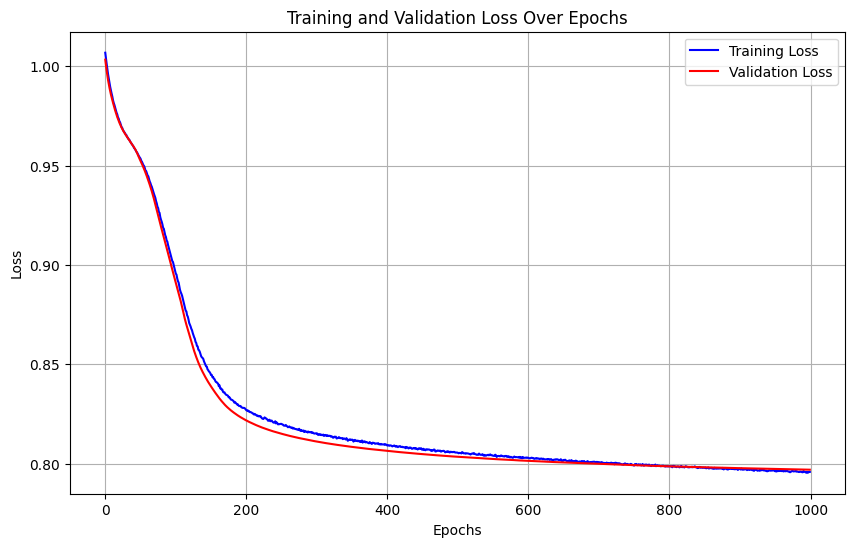

Training run 49/50 for 20% of the data...
Sample size for 20%: 39951


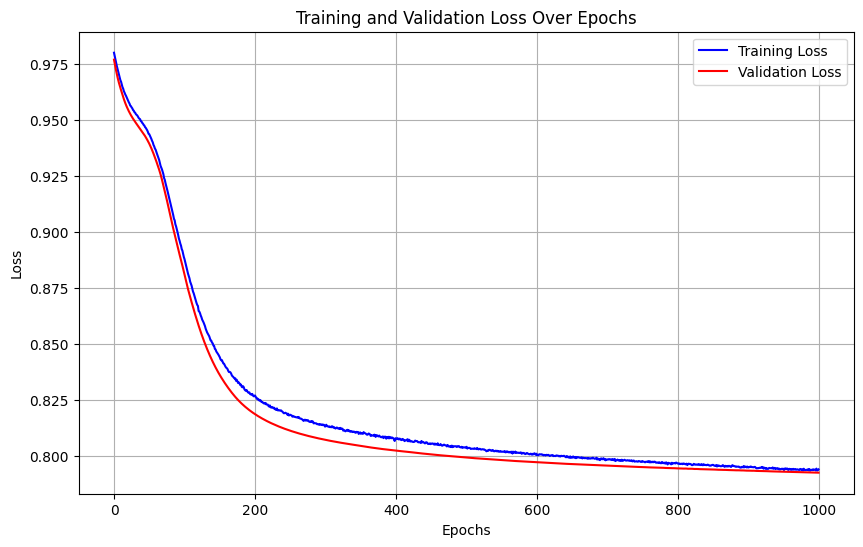

Training run 50/50 for 20% of the data...
Sample size for 20%: 39951


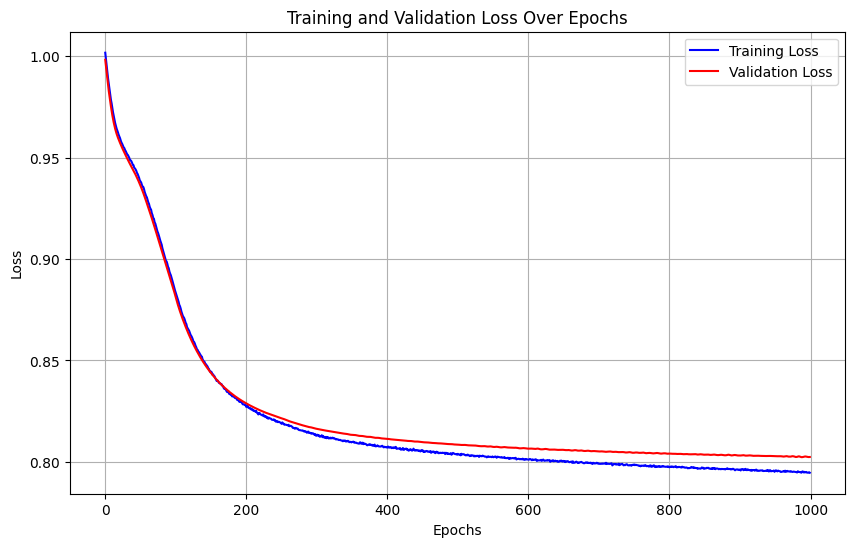

Metrics for 20% of data:
Final Metrics (Aggregated Predictions): {'accuracy': np.float64(0.8569916155675134), 'precision': np.float64(0.777742488996456), 'recall': np.float64(0.7574144278058992), 'f1': np.float64(0.7674012374650739), 'fpr': np.float64(0.09795785472807576)}
Metrics Across Runs:
accuracy: 0.8570 ± 0.0041
precision: 0.7777 ± 0.0085
recall: 0.7574 ± 0.0088
f1: 0.7674 ± 0.0065
fpr: 0.0980 ± 0.0046
Training model for 50% of the data...
Training run 1/50 for 50% of the data...
Sample size for 50%: 99877


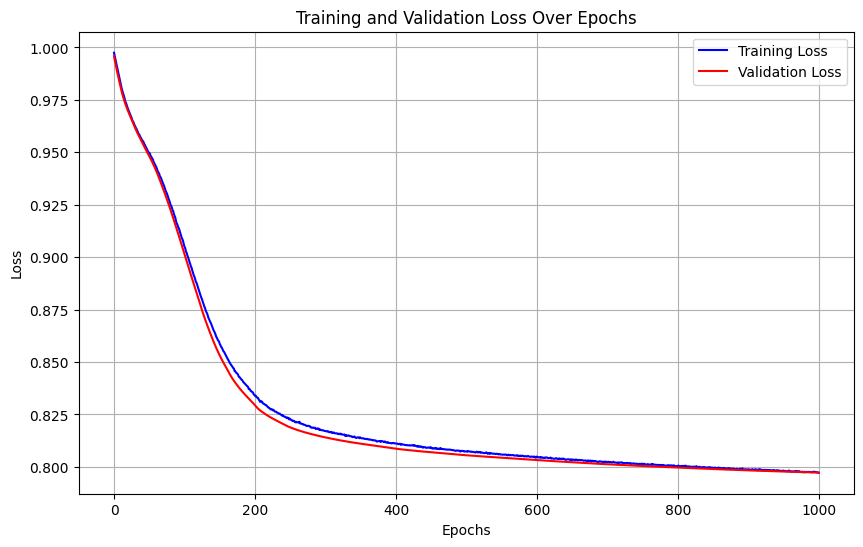

Training run 2/50 for 50% of the data...
Sample size for 50%: 99877


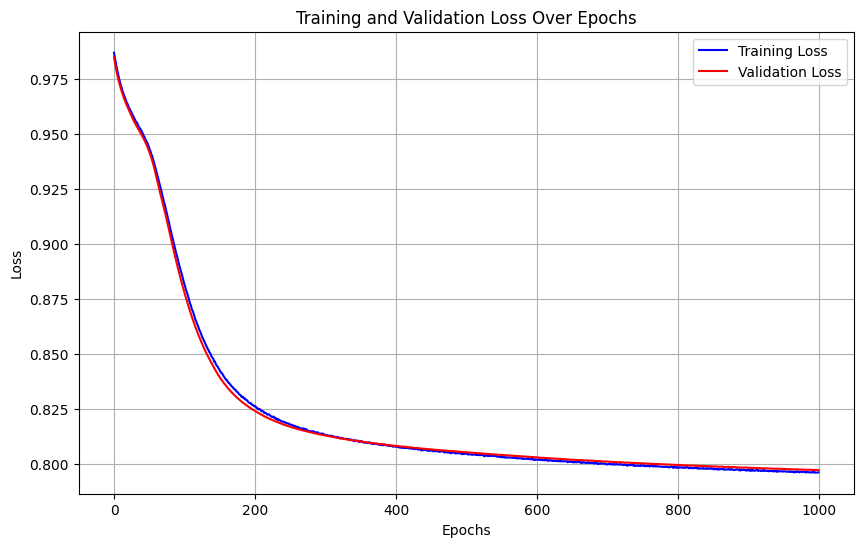

Training run 3/50 for 50% of the data...
Sample size for 50%: 99877


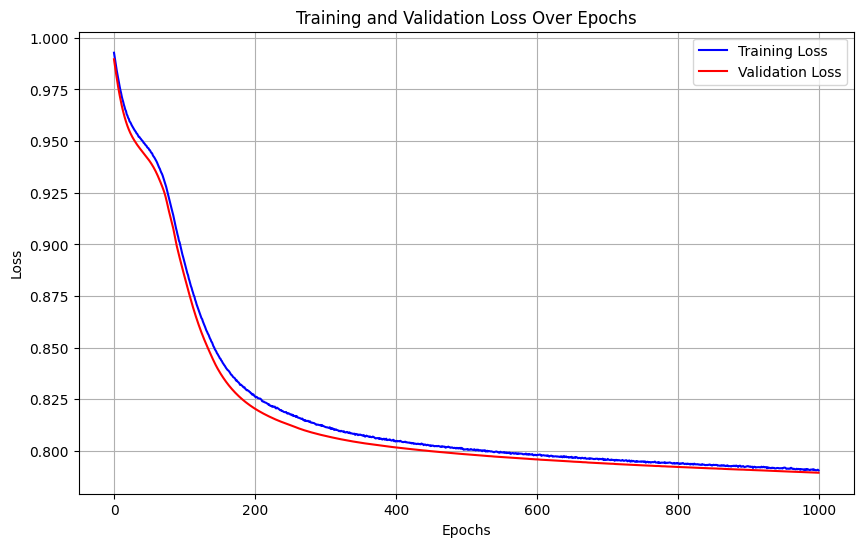

Training run 4/50 for 50% of the data...
Sample size for 50%: 99877


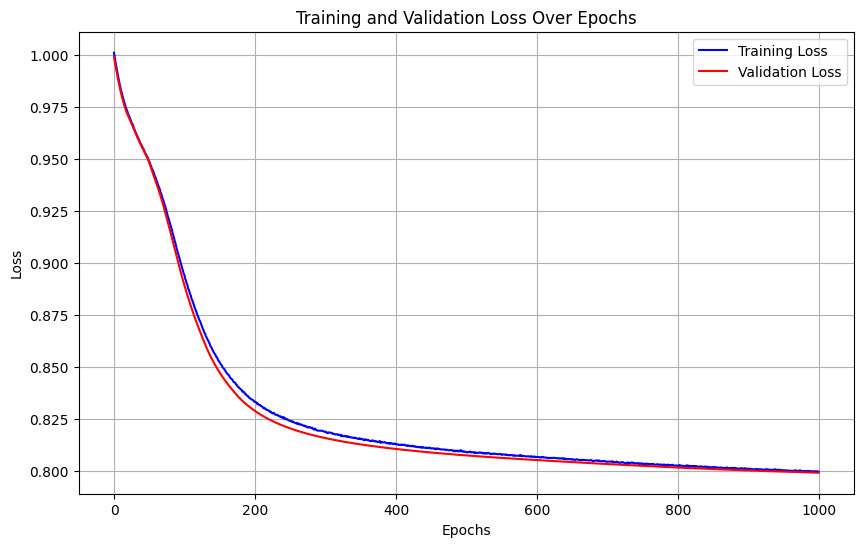

Training run 5/50 for 50% of the data...
Sample size for 50%: 99877


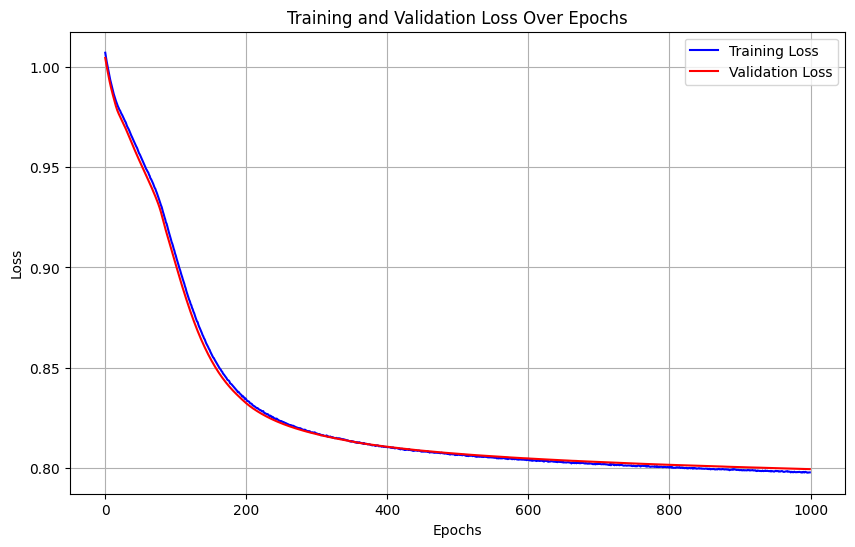

Training run 6/50 for 50% of the data...
Sample size for 50%: 99877


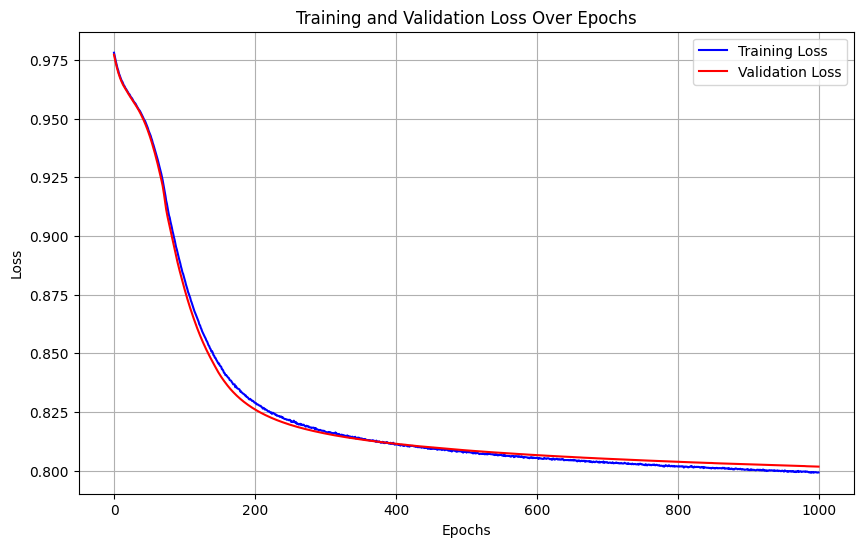

Training run 7/50 for 50% of the data...
Sample size for 50%: 99877


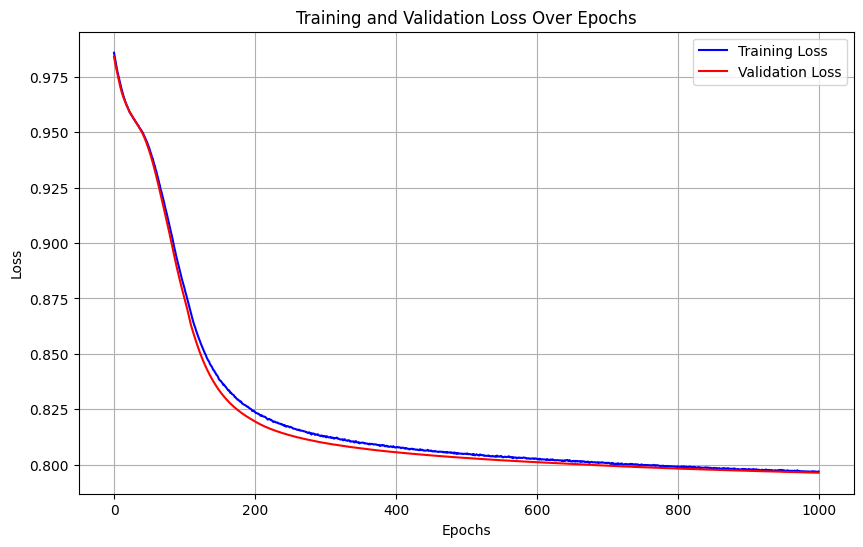

Training run 8/50 for 50% of the data...
Sample size for 50%: 99877


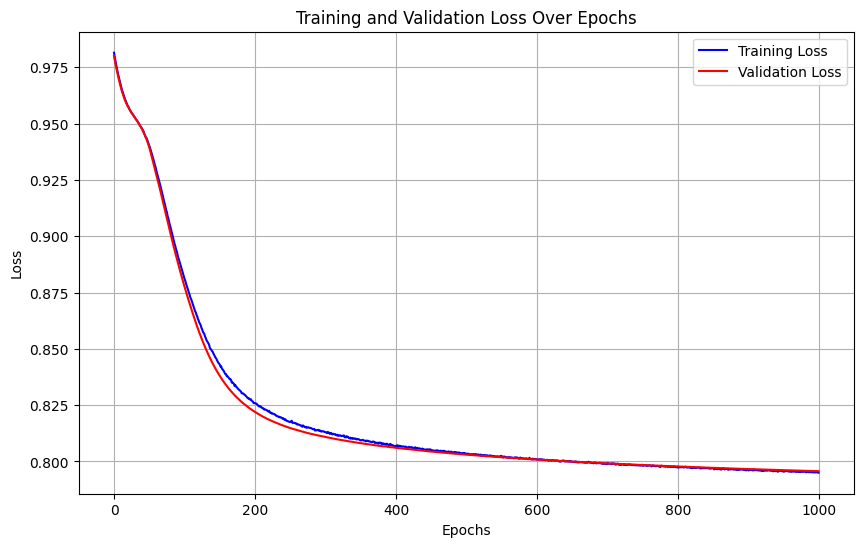

Training run 9/50 for 50% of the data...
Sample size for 50%: 99877


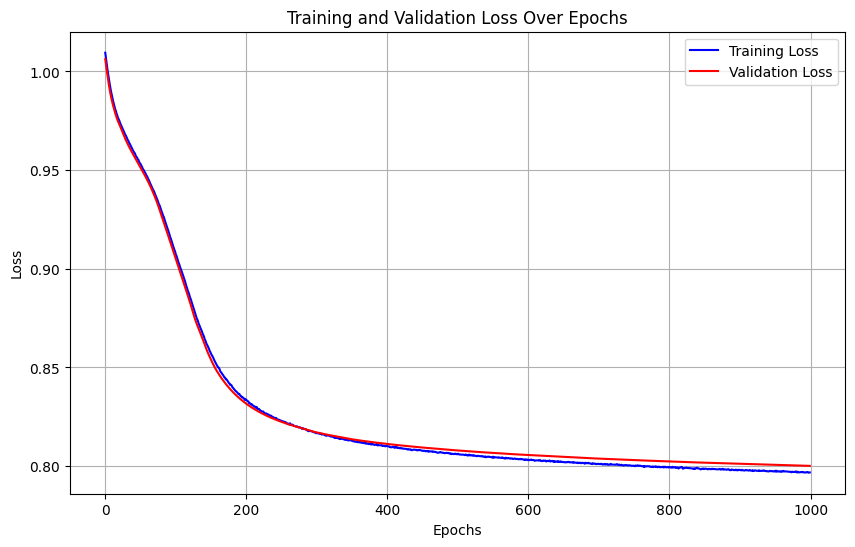

Training run 10/50 for 50% of the data...
Sample size for 50%: 99877


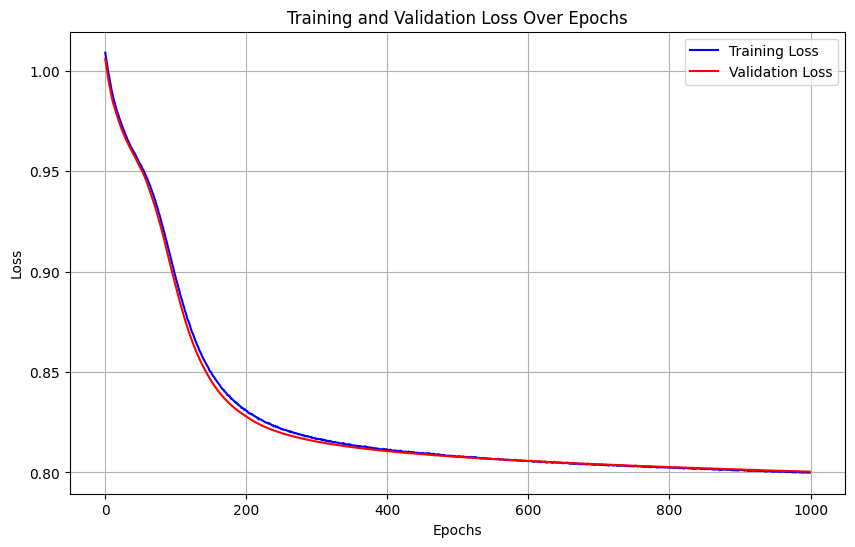

Training run 11/50 for 50% of the data...
Sample size for 50%: 99877


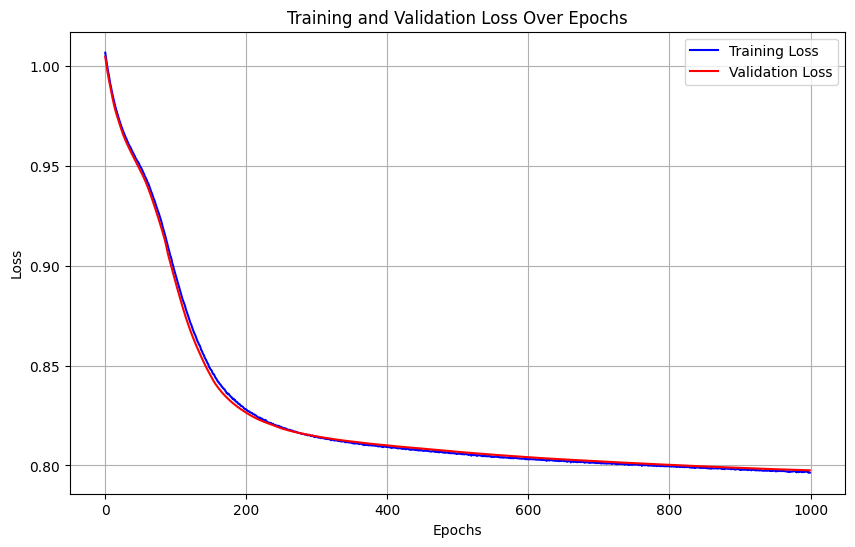

Training run 12/50 for 50% of the data...
Sample size for 50%: 99877


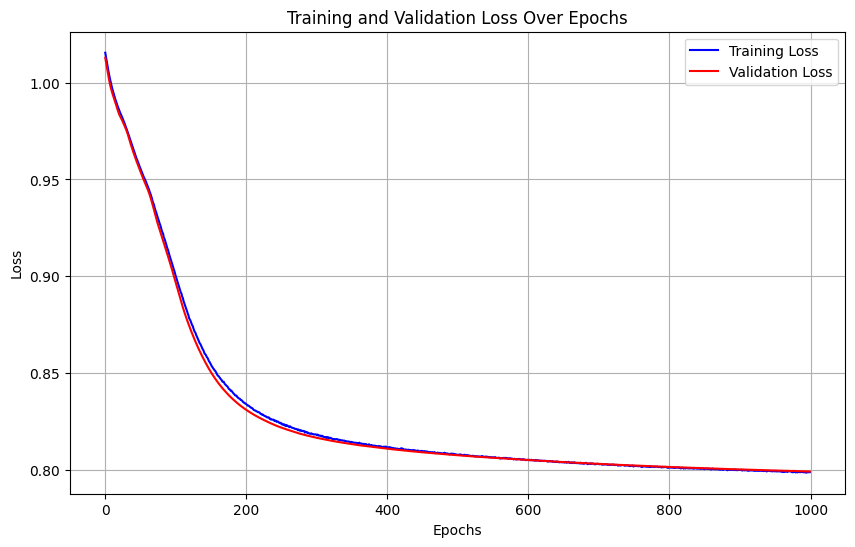

Training run 13/50 for 50% of the data...
Sample size for 50%: 99877


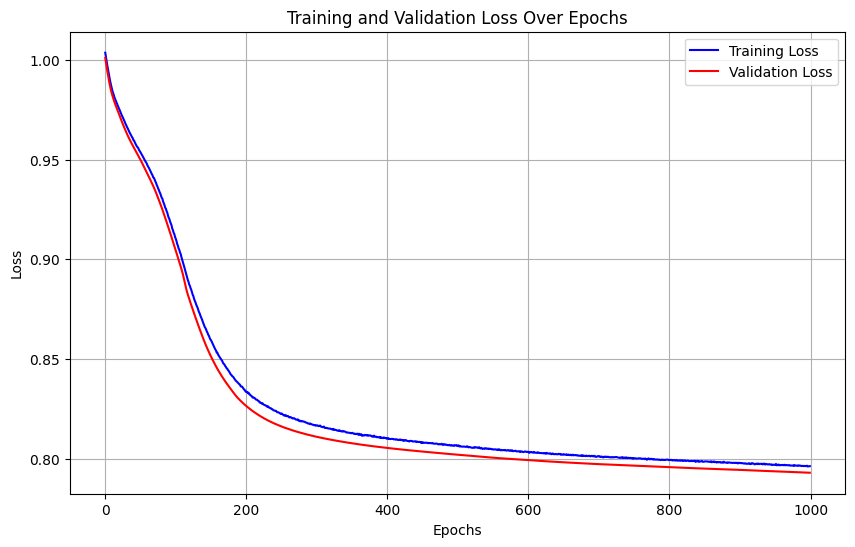

Training run 14/50 for 50% of the data...
Sample size for 50%: 99877


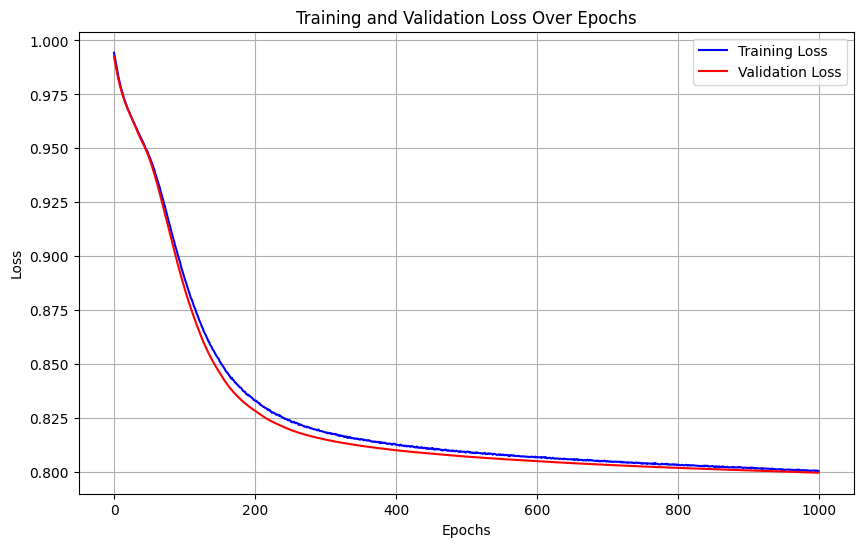

Training run 15/50 for 50% of the data...
Sample size for 50%: 99877


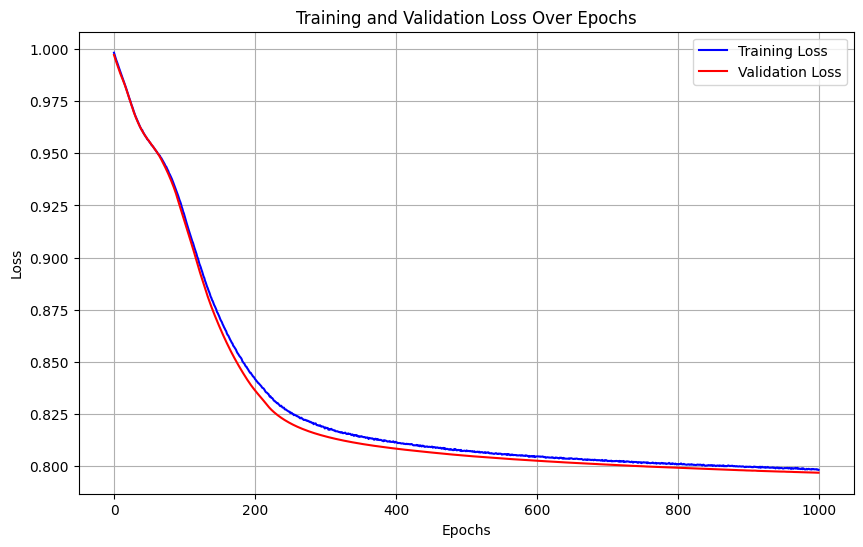

Training run 16/50 for 50% of the data...
Sample size for 50%: 99877


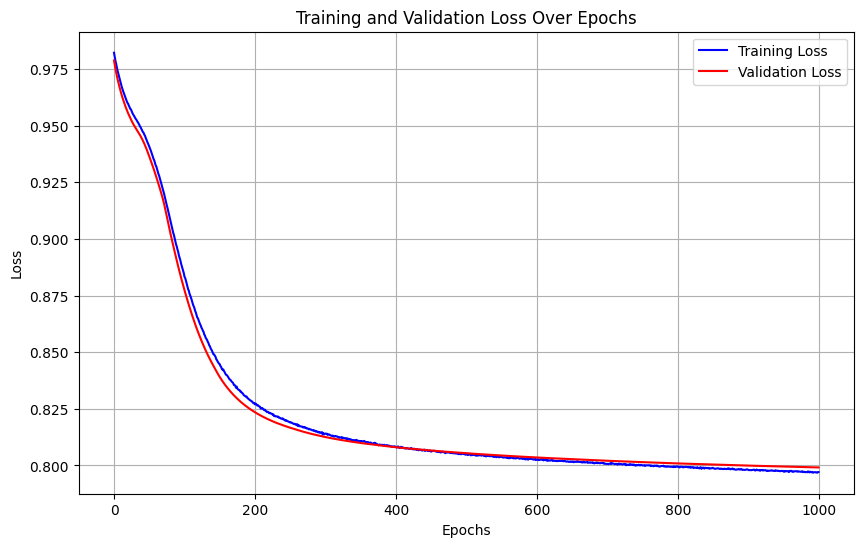

Training run 17/50 for 50% of the data...
Sample size for 50%: 99877


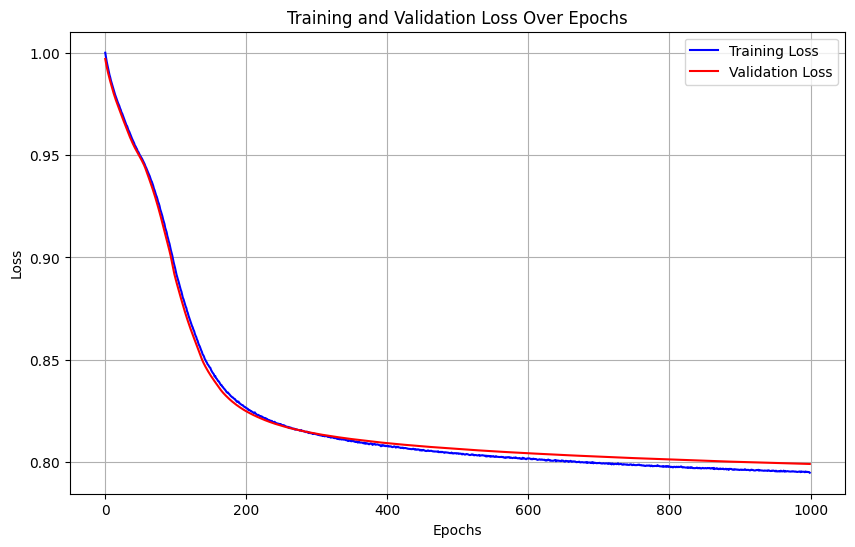

Training run 18/50 for 50% of the data...
Sample size for 50%: 99877


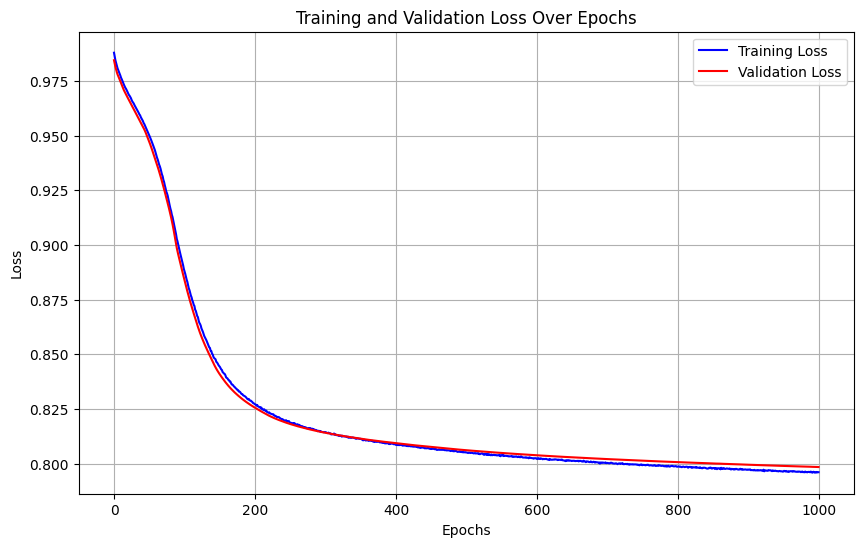

Training run 19/50 for 50% of the data...
Sample size for 50%: 99877


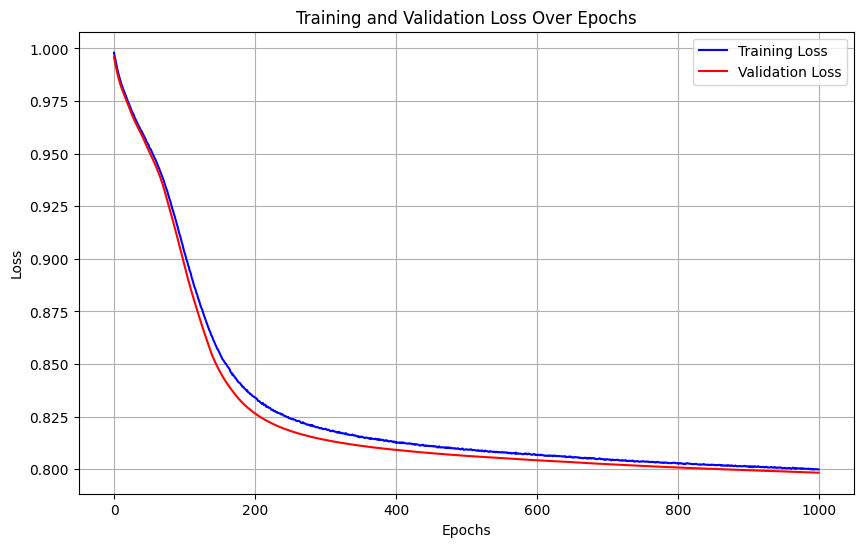

Training run 20/50 for 50% of the data...
Sample size for 50%: 99877


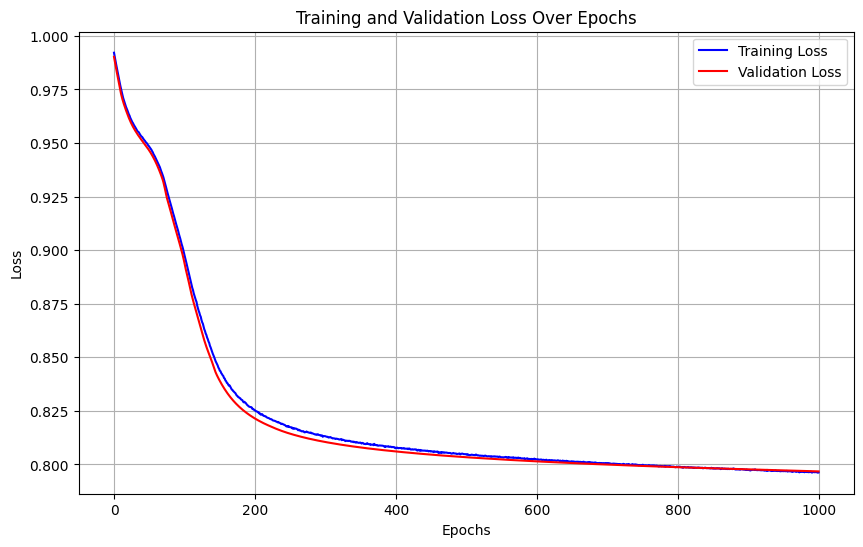

Training run 21/50 for 50% of the data...
Sample size for 50%: 99877


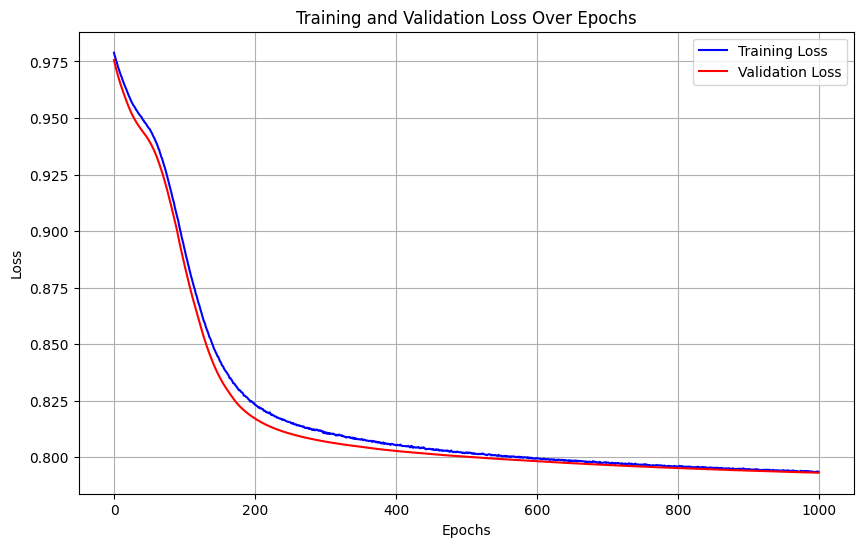

Training run 22/50 for 50% of the data...
Sample size for 50%: 99877


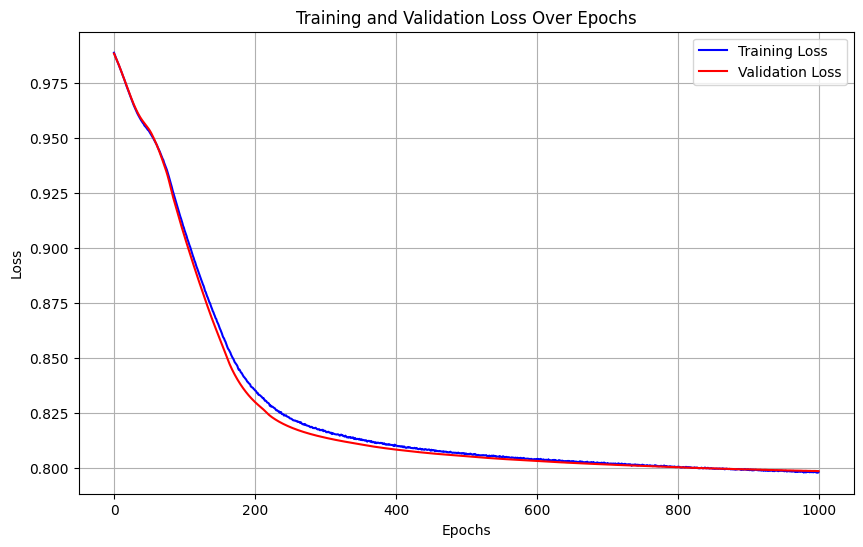

Training run 23/50 for 50% of the data...
Sample size for 50%: 99877


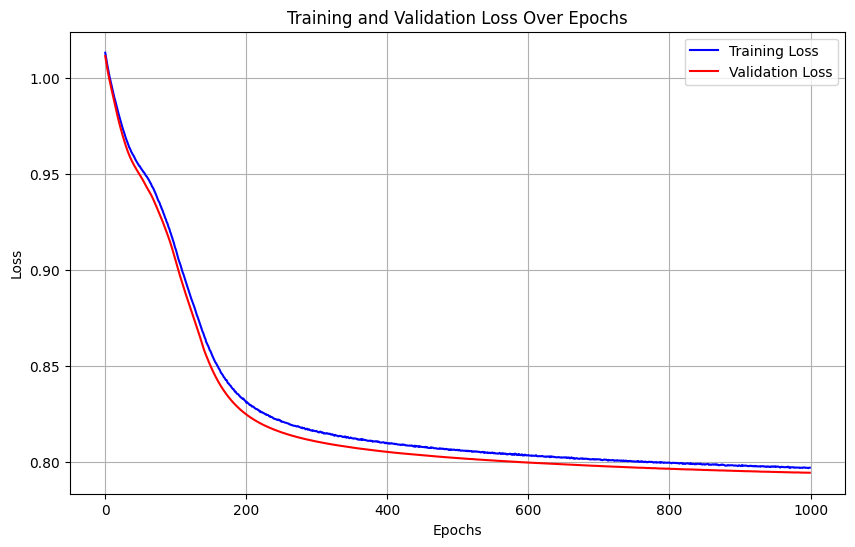

Training run 24/50 for 50% of the data...
Sample size for 50%: 99877


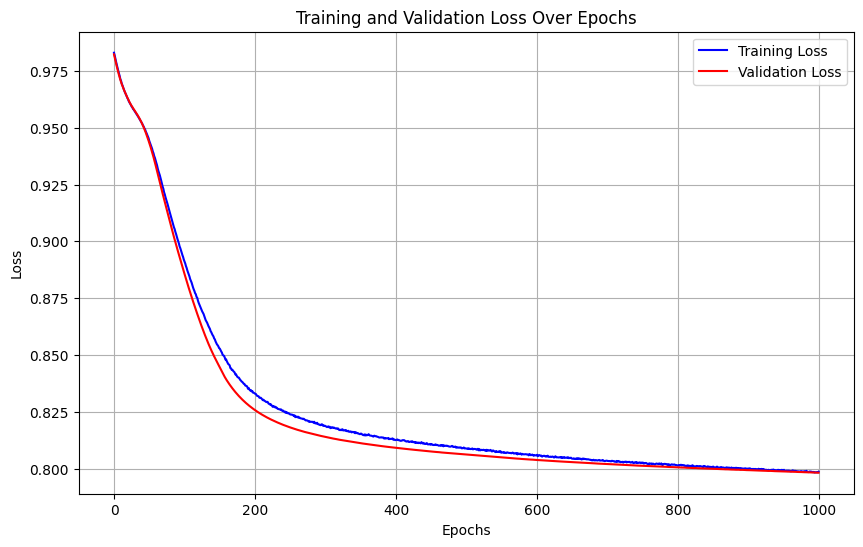

Training run 25/50 for 50% of the data...
Sample size for 50%: 99877


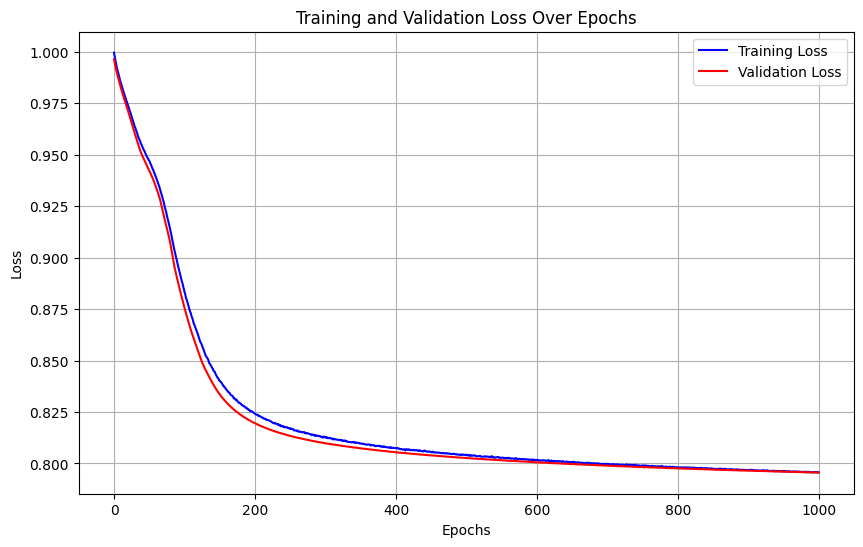

Training run 26/50 for 50% of the data...
Sample size for 50%: 99877


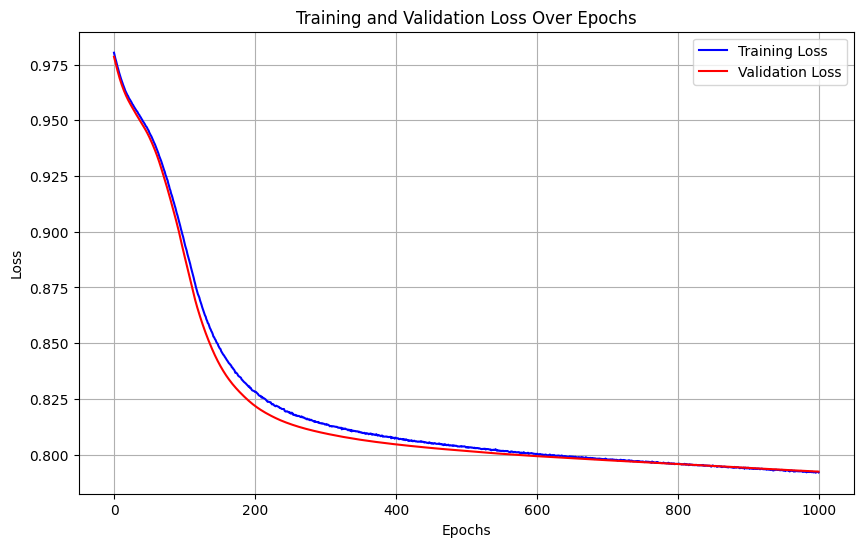

Training run 27/50 for 50% of the data...
Sample size for 50%: 99877


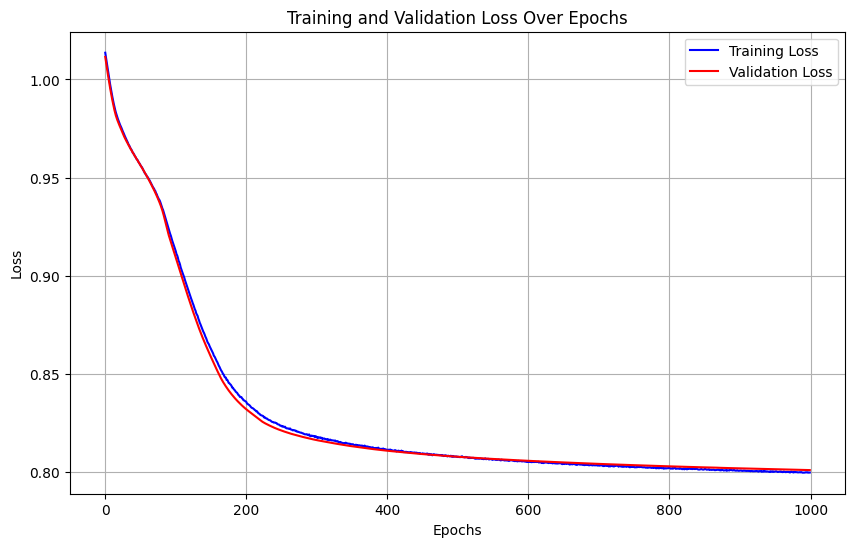

Training run 28/50 for 50% of the data...
Sample size for 50%: 99877


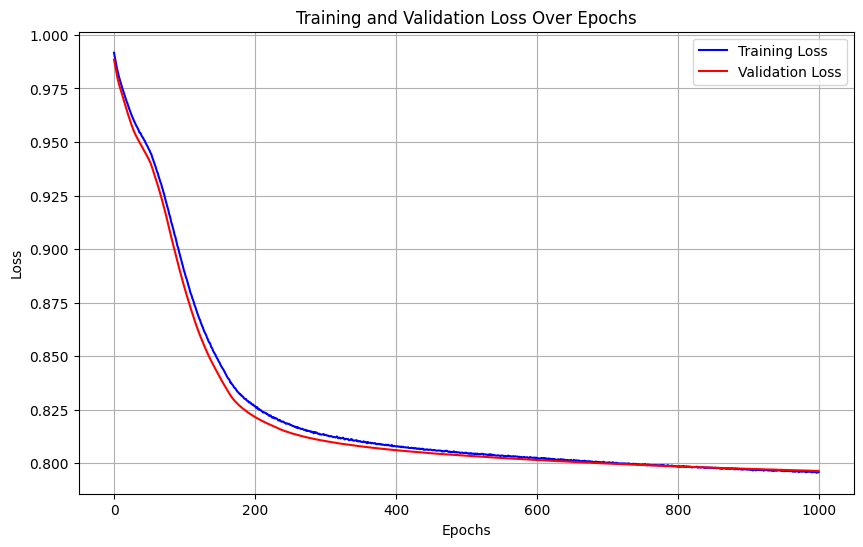

Training run 29/50 for 50% of the data...
Sample size for 50%: 99877


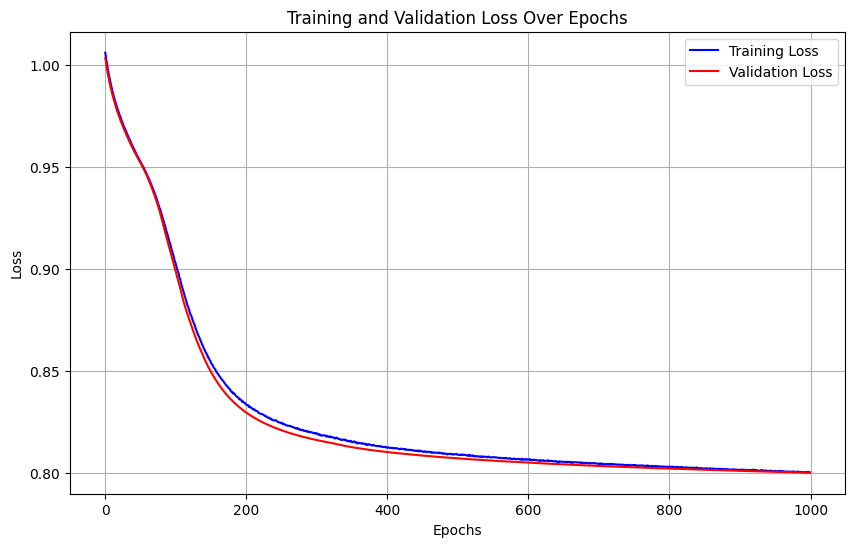

Training run 30/50 for 50% of the data...
Sample size for 50%: 99877


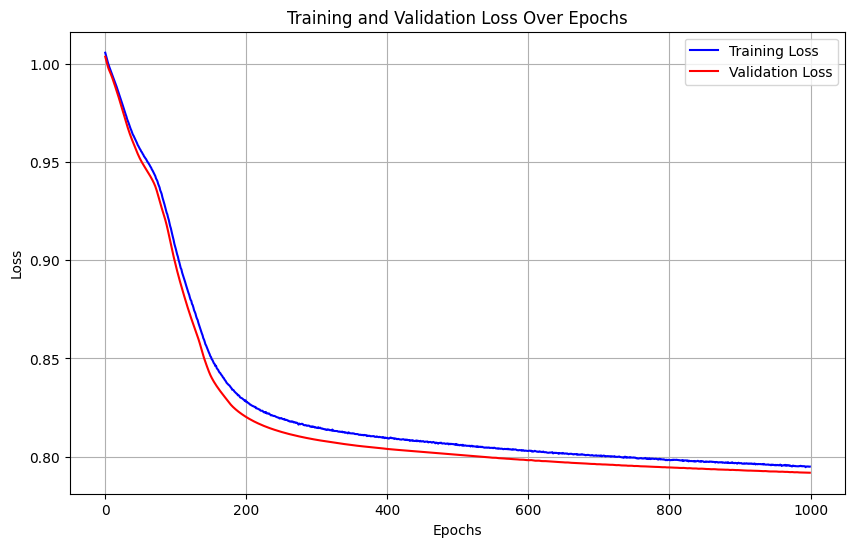

Training run 31/50 for 50% of the data...
Sample size for 50%: 99877


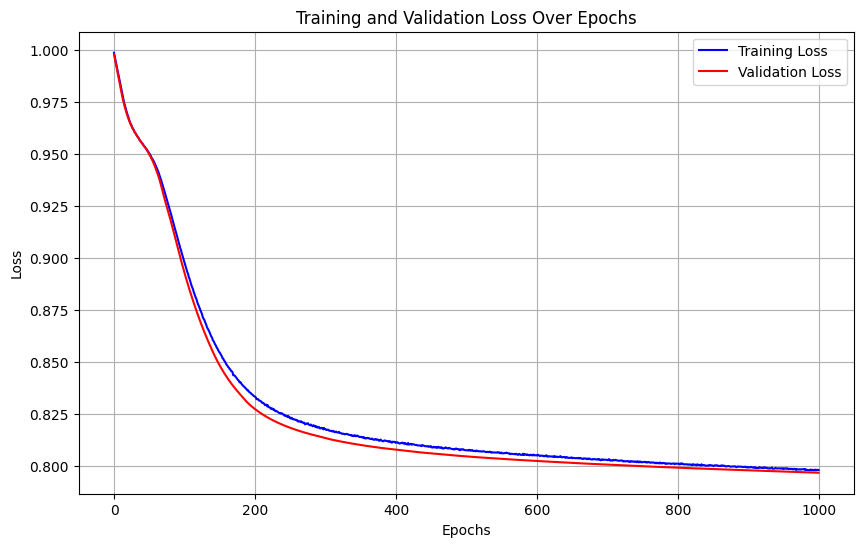

Training run 32/50 for 50% of the data...
Sample size for 50%: 99877


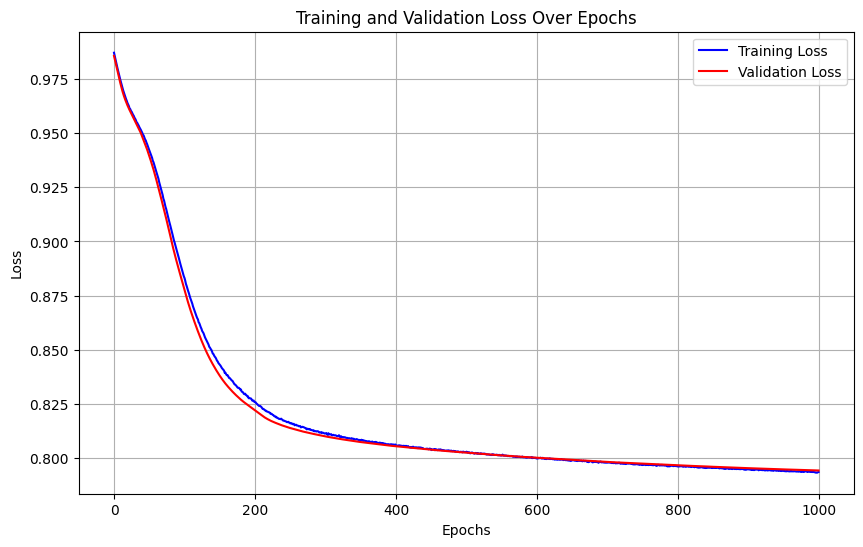

Training run 33/50 for 50% of the data...
Sample size for 50%: 99877


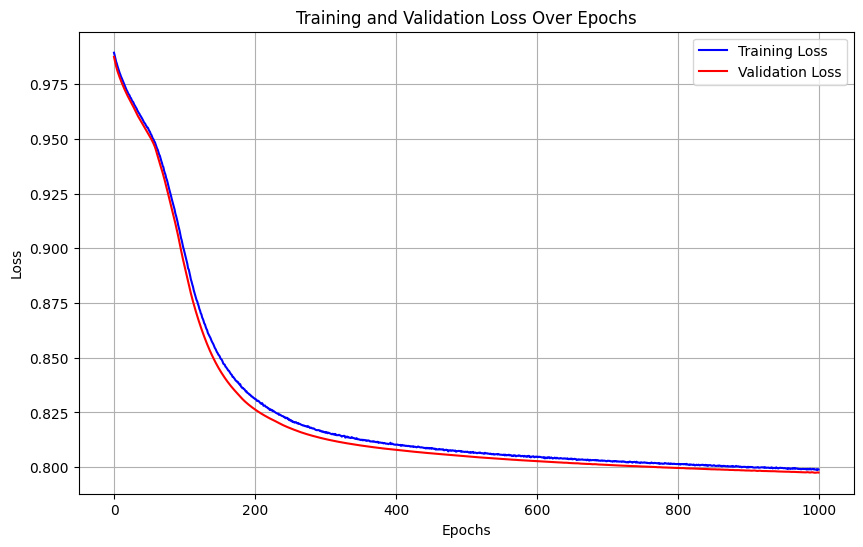

Training run 34/50 for 50% of the data...
Sample size for 50%: 99877


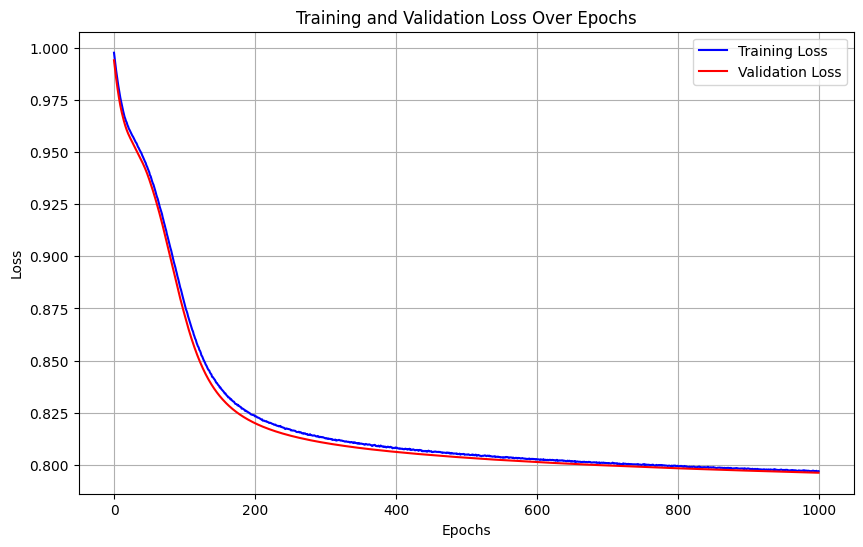

Training run 35/50 for 50% of the data...
Sample size for 50%: 99877


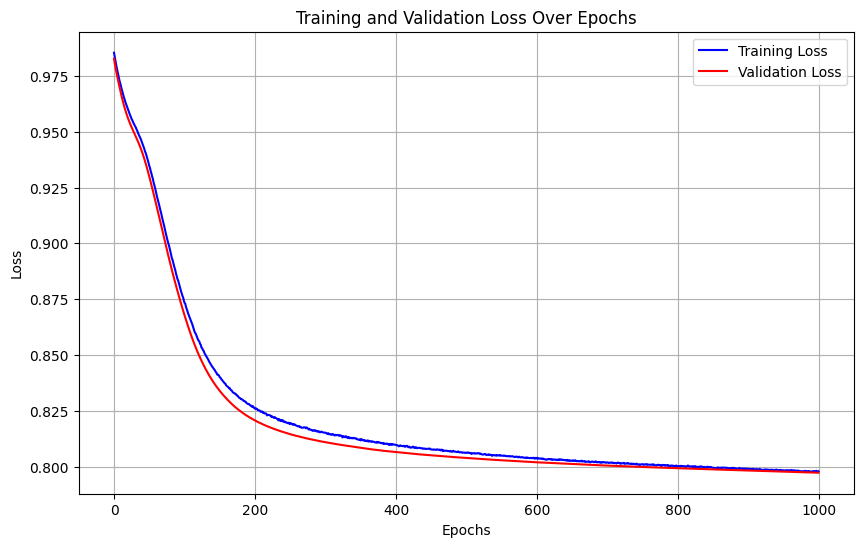

Training run 36/50 for 50% of the data...
Sample size for 50%: 99877


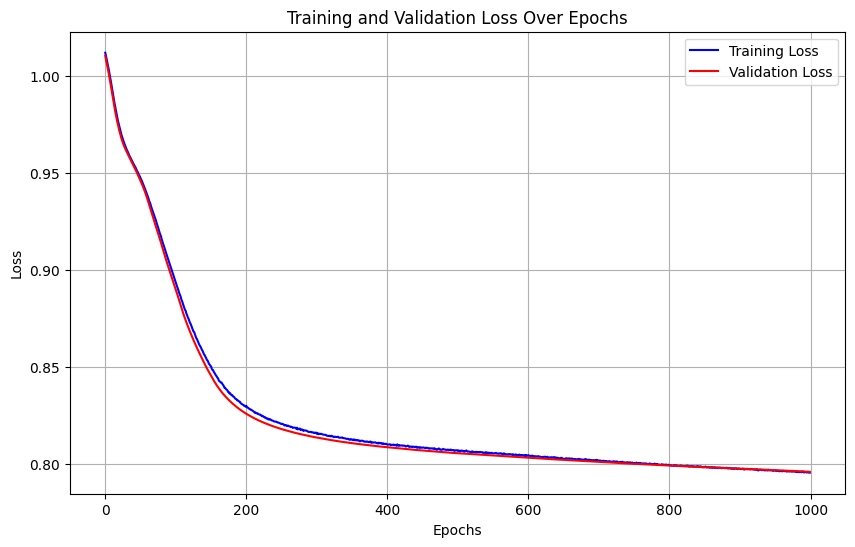

Training run 37/50 for 50% of the data...
Sample size for 50%: 99877


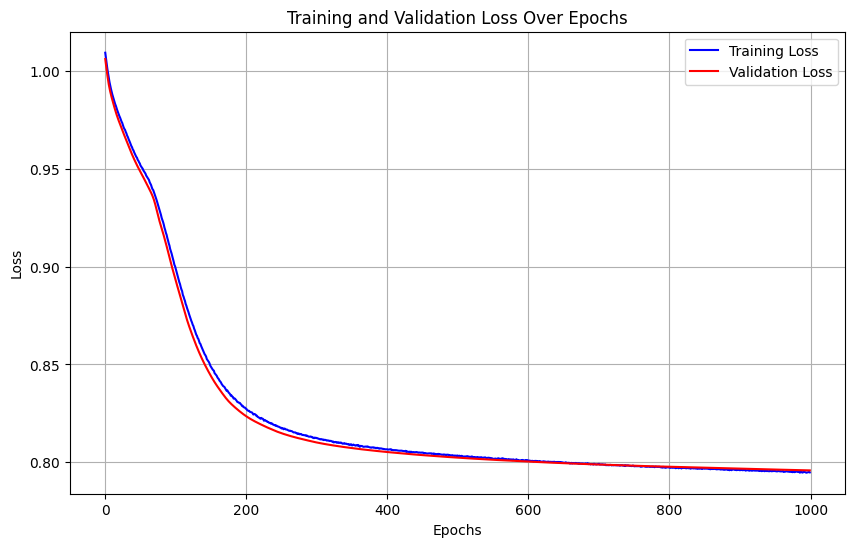

Training run 38/50 for 50% of the data...
Sample size for 50%: 99877


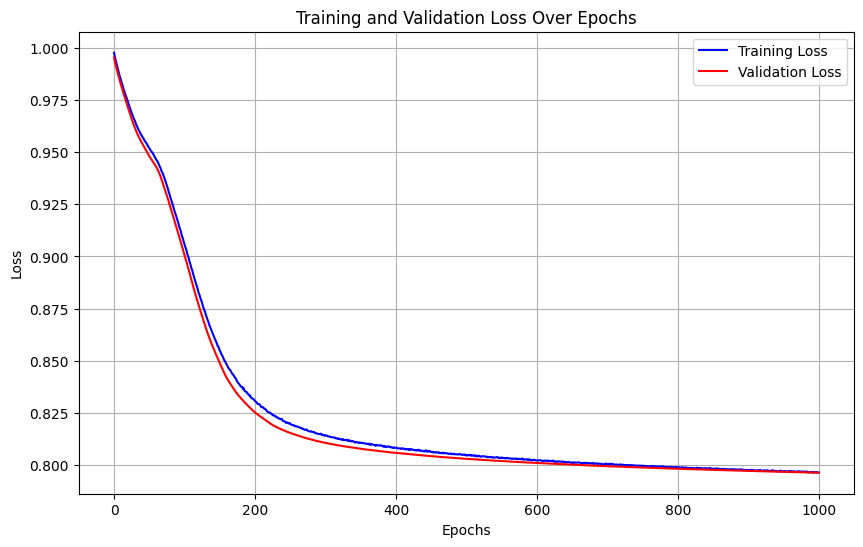

Training run 39/50 for 50% of the data...
Sample size for 50%: 99877


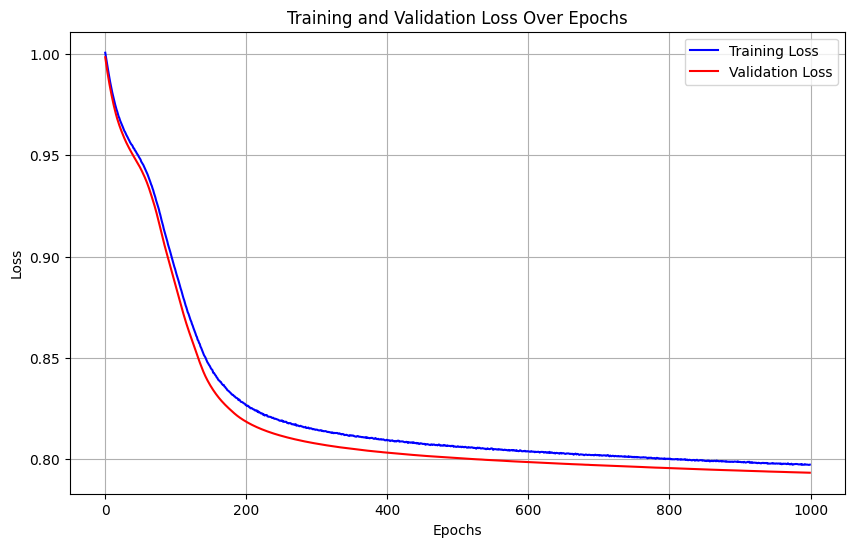

Training run 40/50 for 50% of the data...
Sample size for 50%: 99877


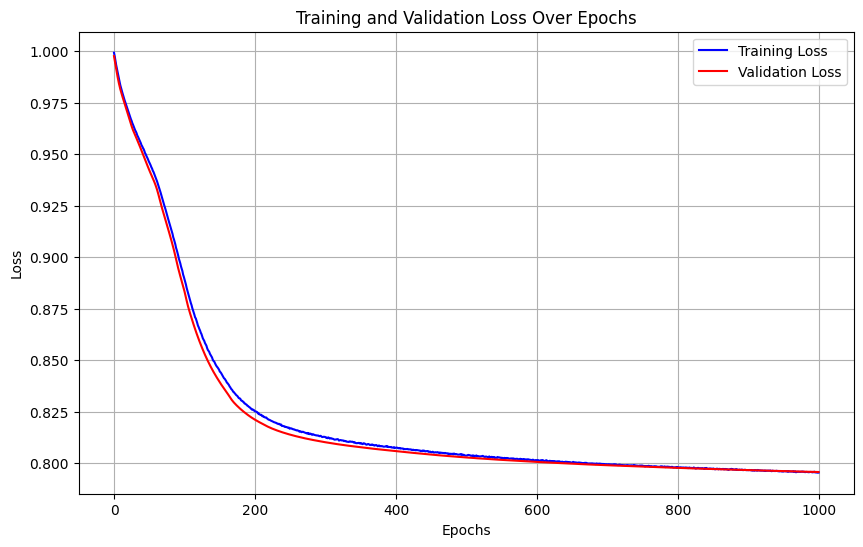

Training run 41/50 for 50% of the data...
Sample size for 50%: 99877


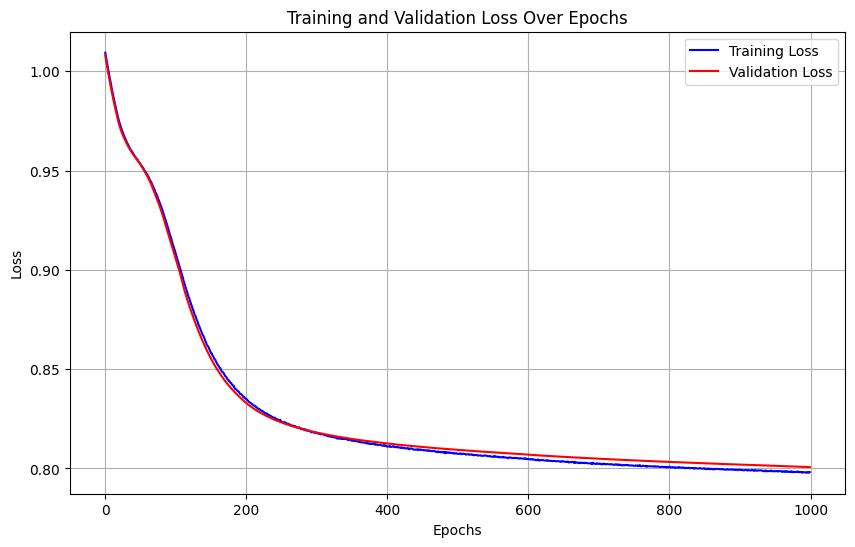

Training run 42/50 for 50% of the data...
Sample size for 50%: 99877


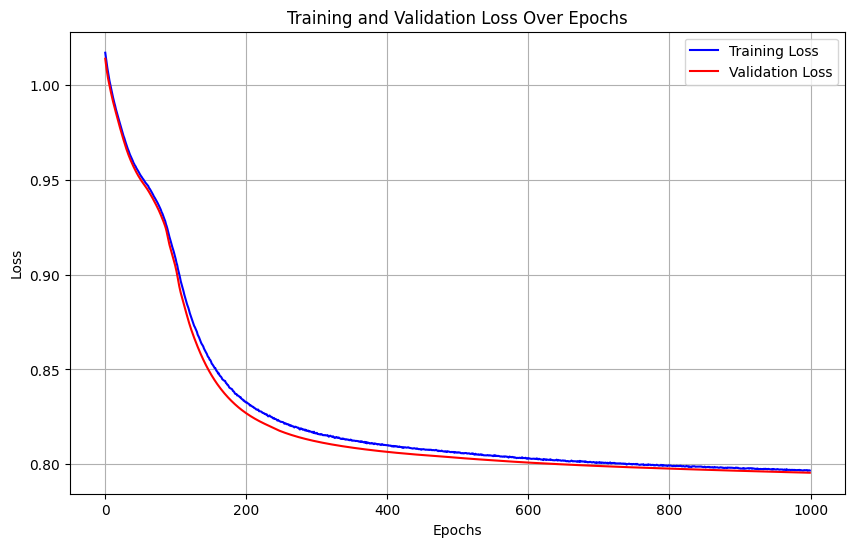

Training run 43/50 for 50% of the data...
Sample size for 50%: 99877


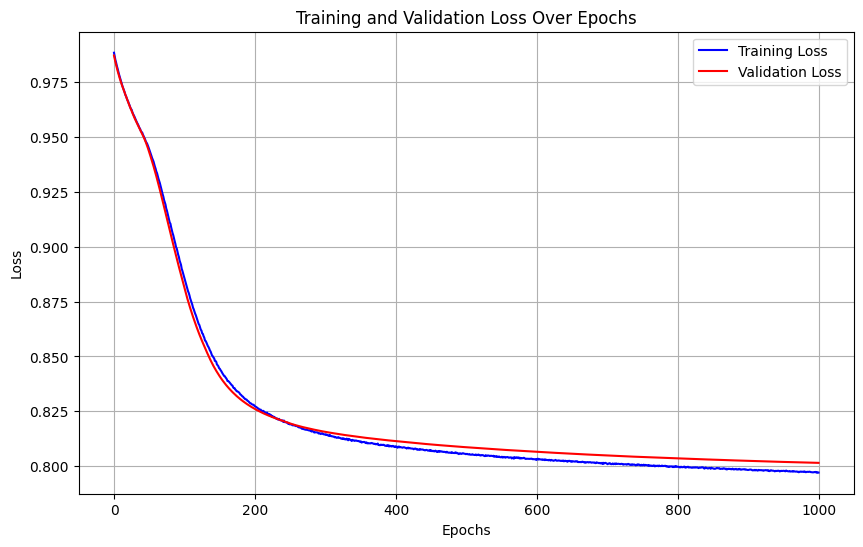

Training run 44/50 for 50% of the data...
Sample size for 50%: 99877


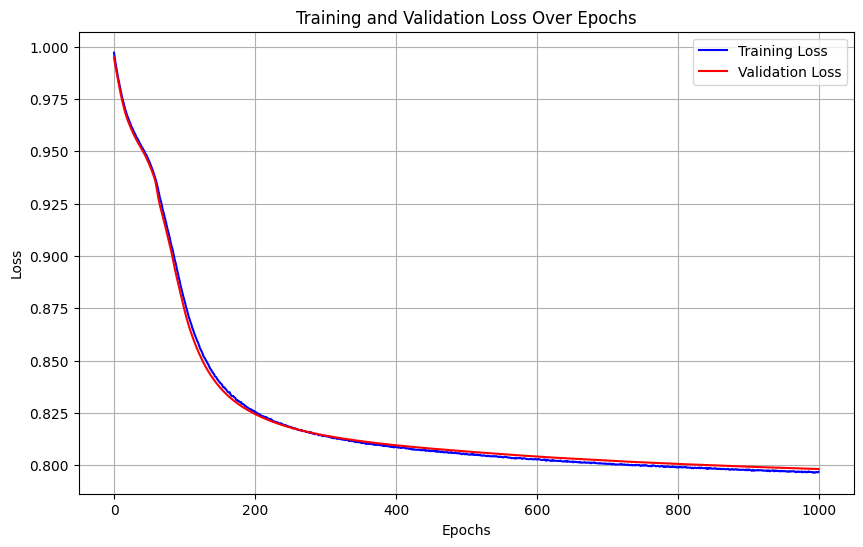

Training run 45/50 for 50% of the data...
Sample size for 50%: 99877


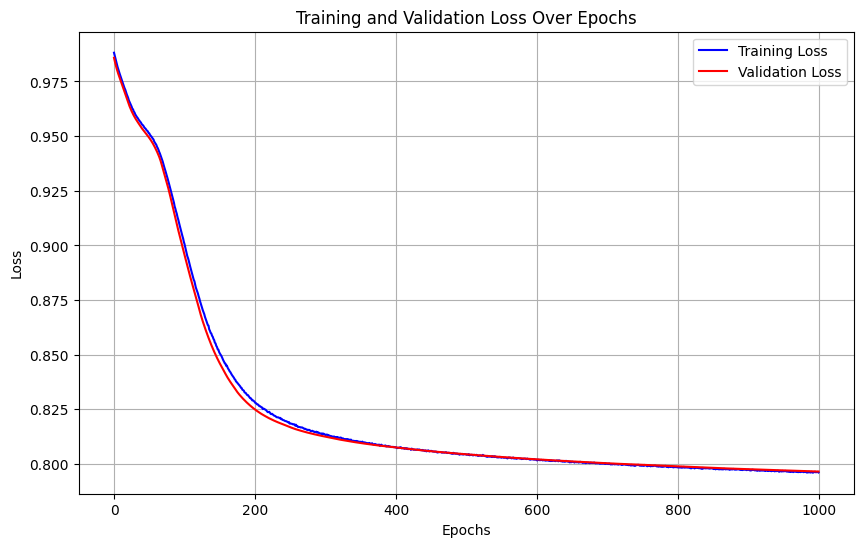

Training run 46/50 for 50% of the data...
Sample size for 50%: 99877


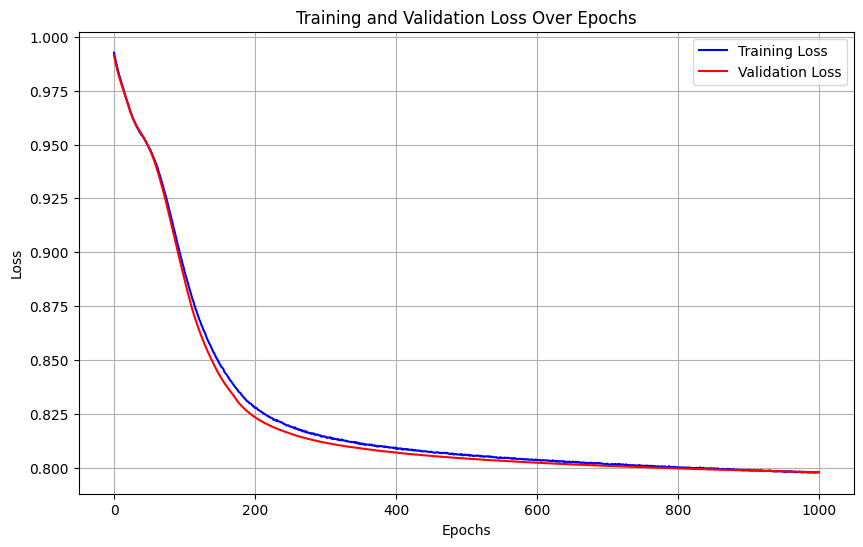

Training run 47/50 for 50% of the data...
Sample size for 50%: 99877


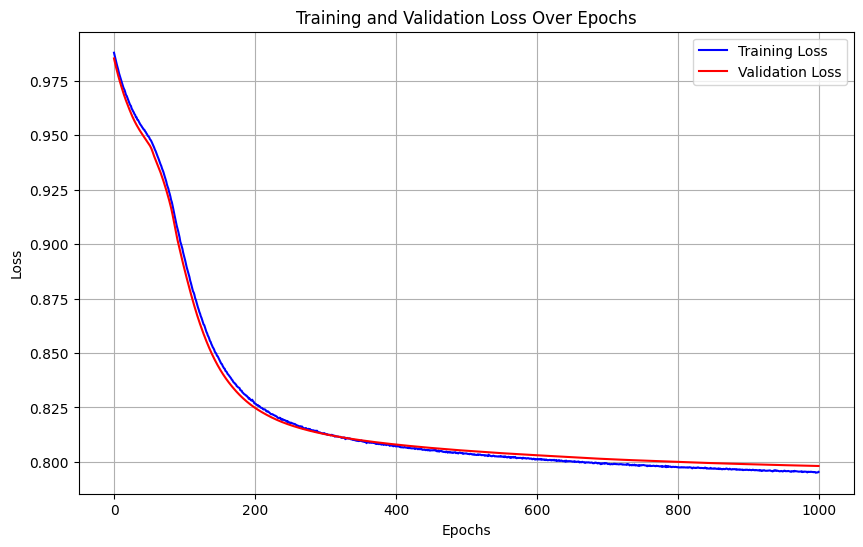

Training run 48/50 for 50% of the data...
Sample size for 50%: 99877


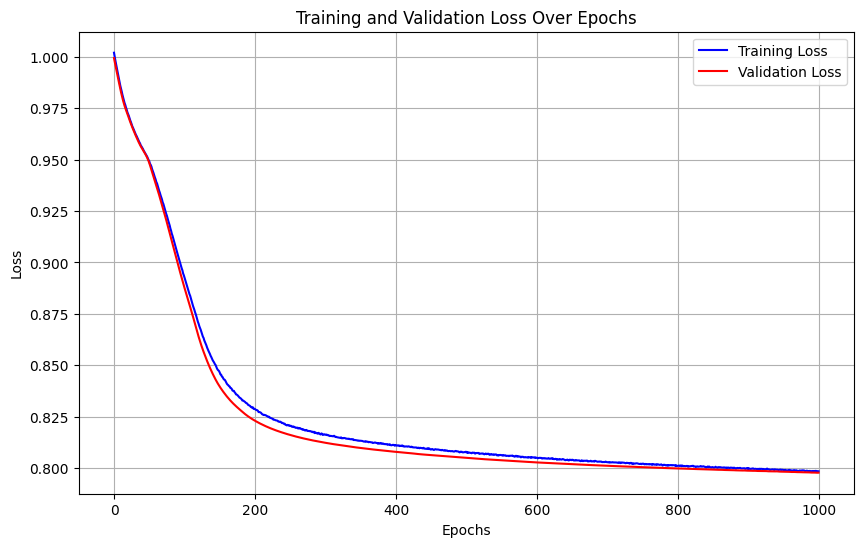

Training run 49/50 for 50% of the data...
Sample size for 50%: 99877


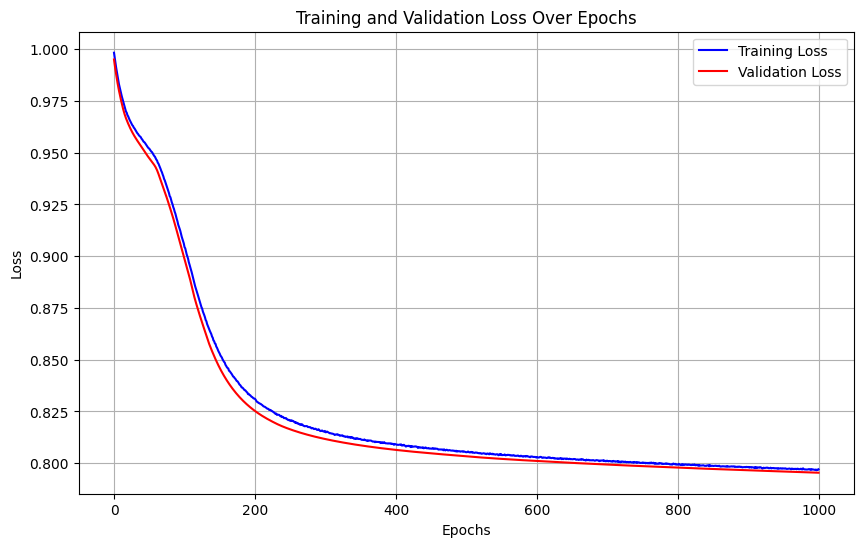

Training run 50/50 for 50% of the data...
Sample size for 50%: 99877


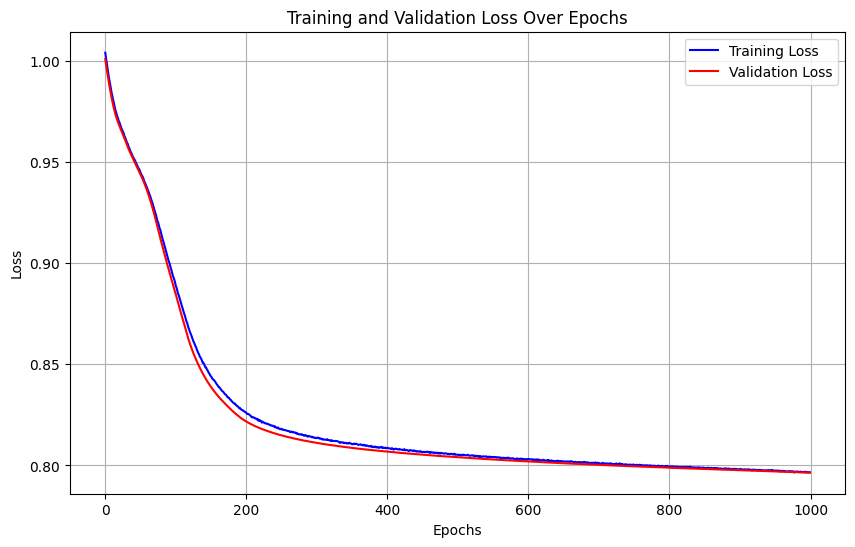

Metrics for 50% of data:
Final Metrics (Aggregated Predictions): {'accuracy': np.float64(0.8578604325190229), 'precision': np.float64(0.7795551729993836), 'recall': np.float64(0.7565607083420103), 'f1': np.float64(0.7678709545900356), 'fpr': np.float64(0.09647045589246118)}
Metrics Across Runs:
accuracy: 0.8579 ± 0.0031
precision: 0.7796 ± 0.0054
recall: 0.7566 ± 0.0064
f1: 0.7679 ± 0.0049
fpr: 0.0965 ± 0.0030
Training model for 80% of the data...
Training run 1/50 for 80% of the data...
Sample size for 80%: 159804


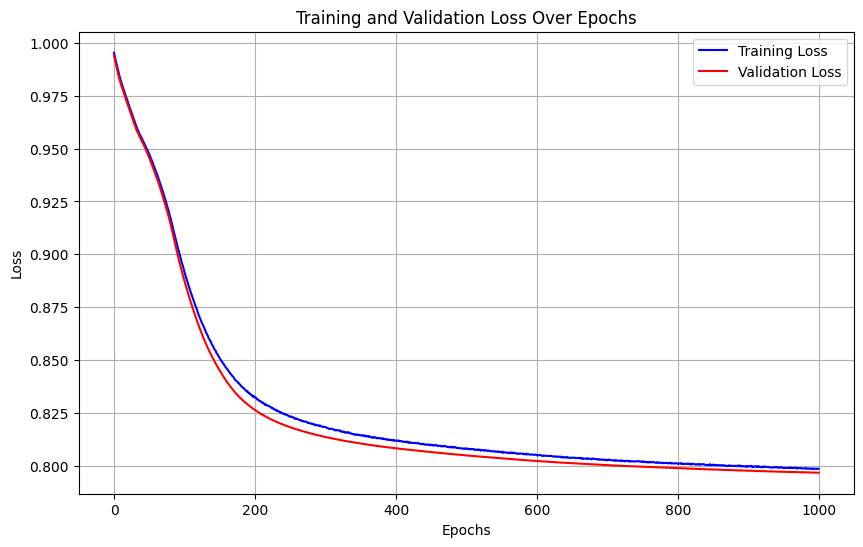

Training run 2/50 for 80% of the data...
Sample size for 80%: 159804


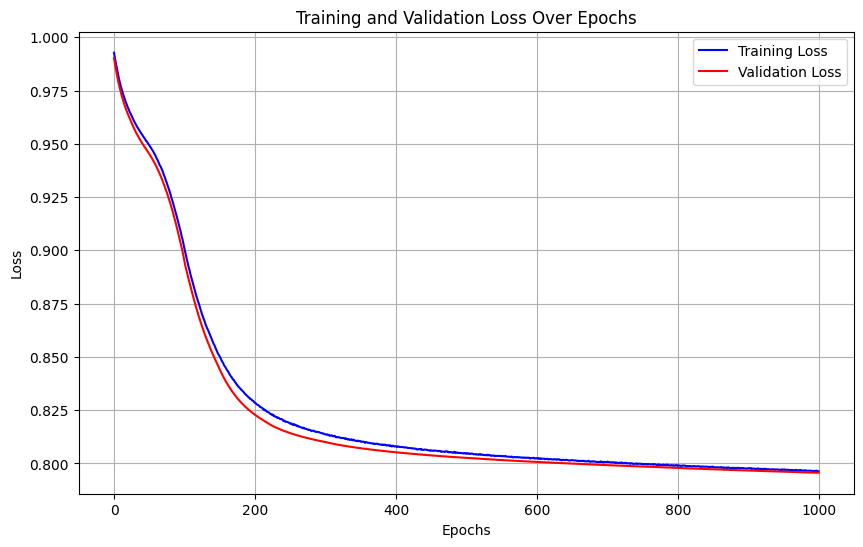

Training run 3/50 for 80% of the data...
Sample size for 80%: 159804


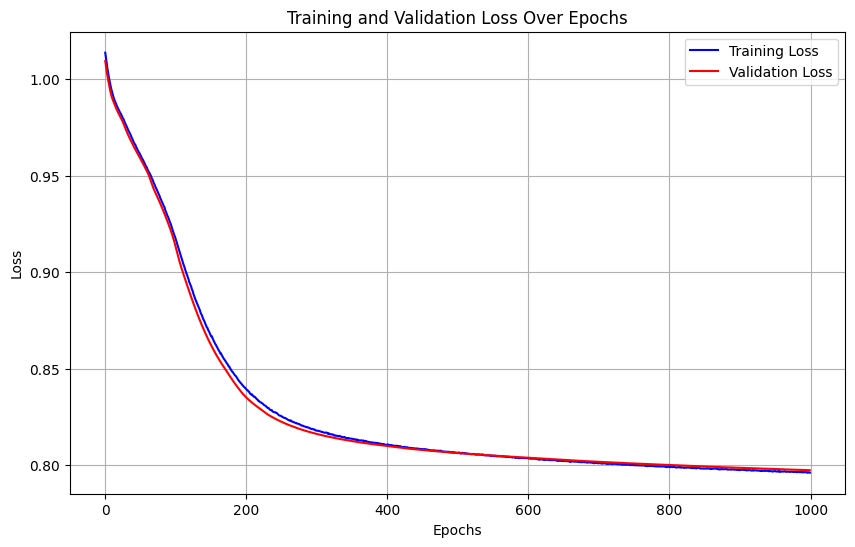

Training run 4/50 for 80% of the data...
Sample size for 80%: 159804


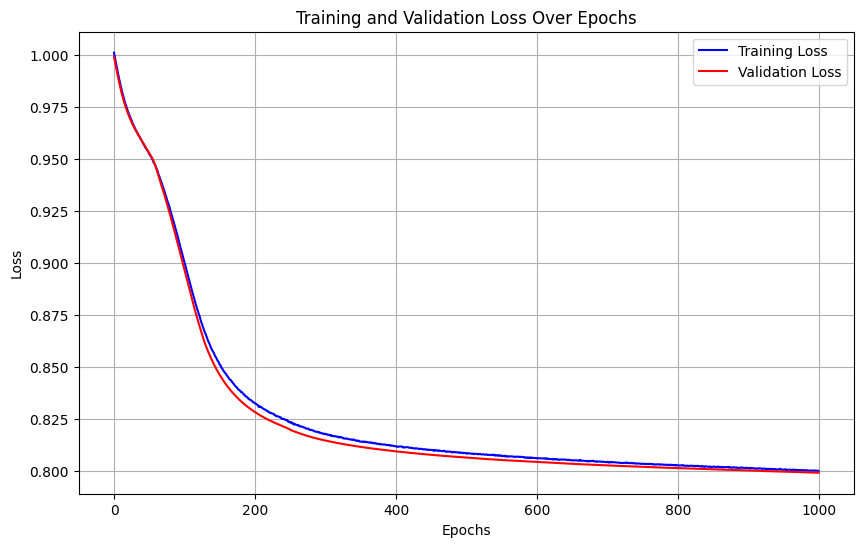

Training run 5/50 for 80% of the data...
Sample size for 80%: 159804


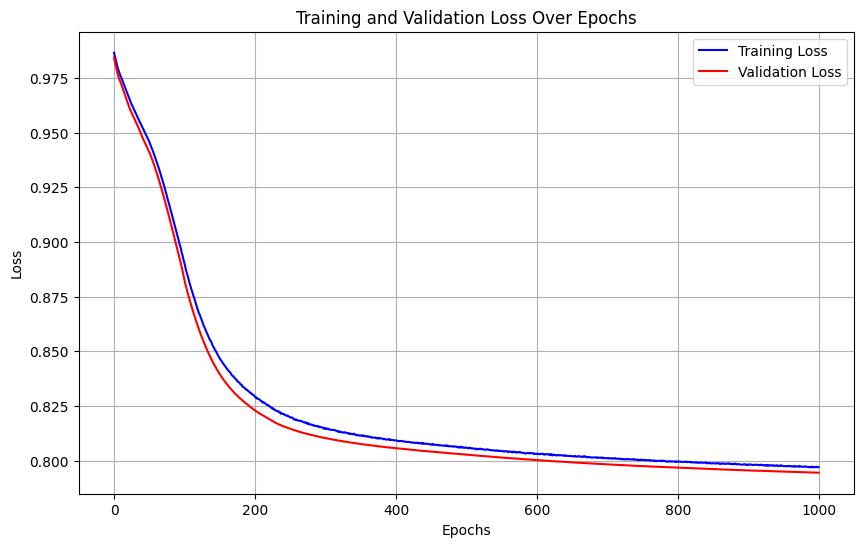

Training run 6/50 for 80% of the data...
Sample size for 80%: 159804


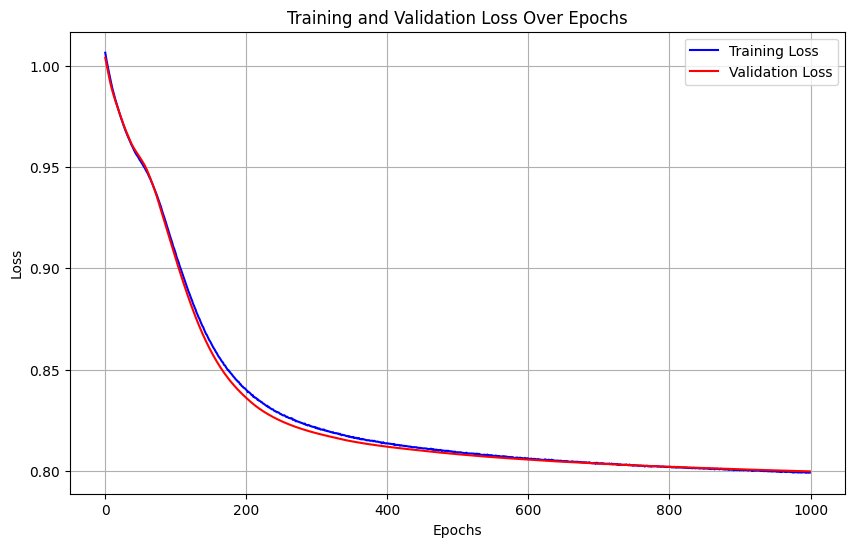

Training run 7/50 for 80% of the data...
Sample size for 80%: 159804


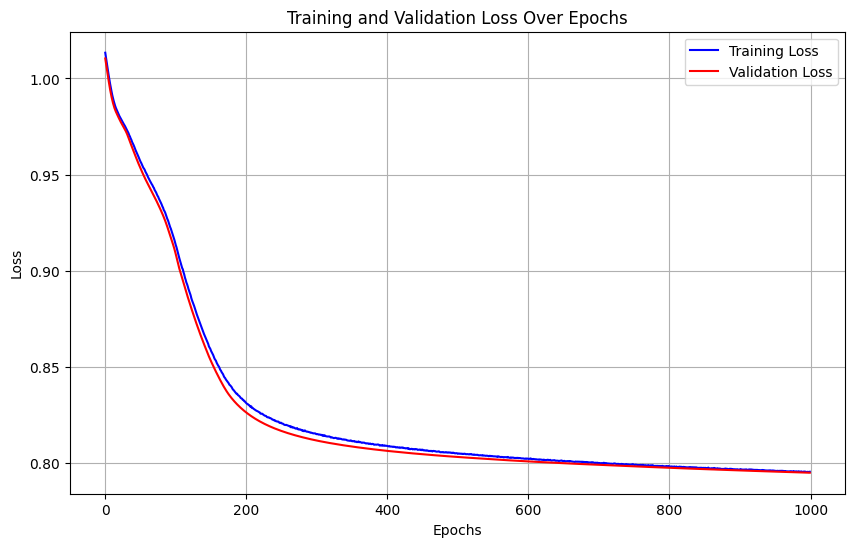

Training run 8/50 for 80% of the data...
Sample size for 80%: 159804


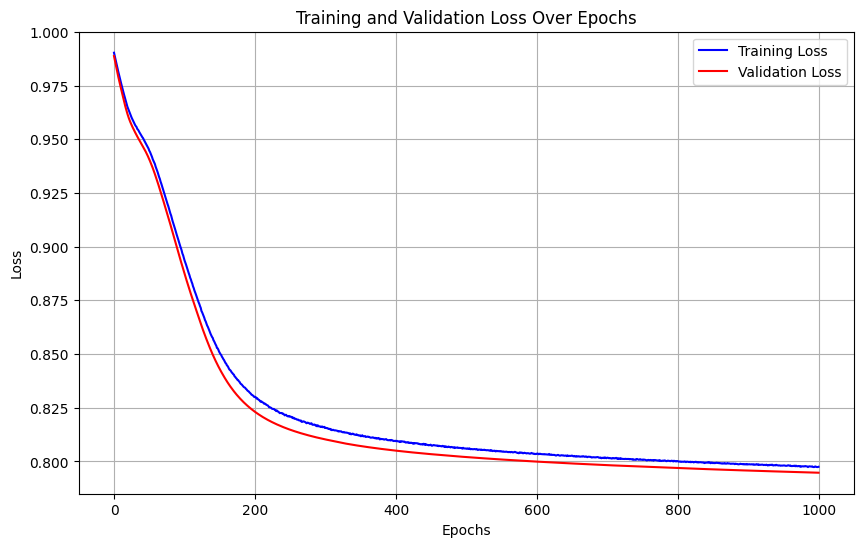

Training run 9/50 for 80% of the data...
Sample size for 80%: 159804


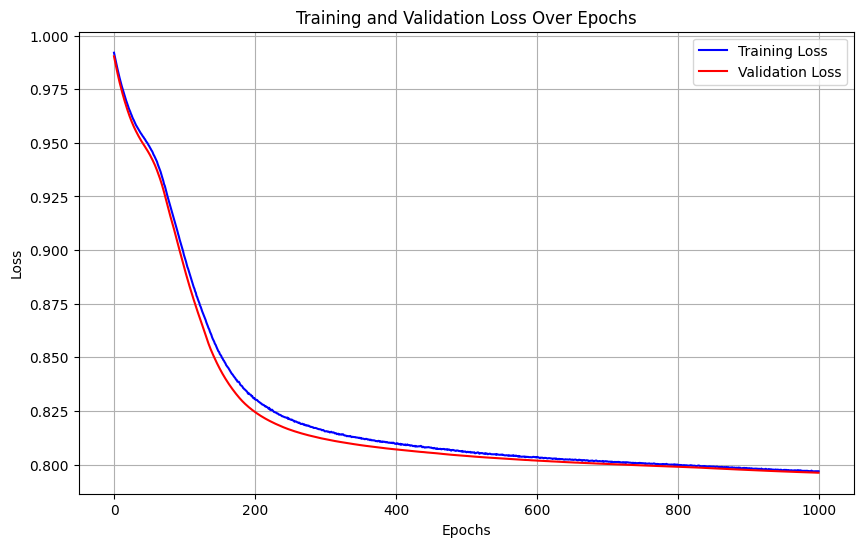

Training run 10/50 for 80% of the data...
Sample size for 80%: 159804


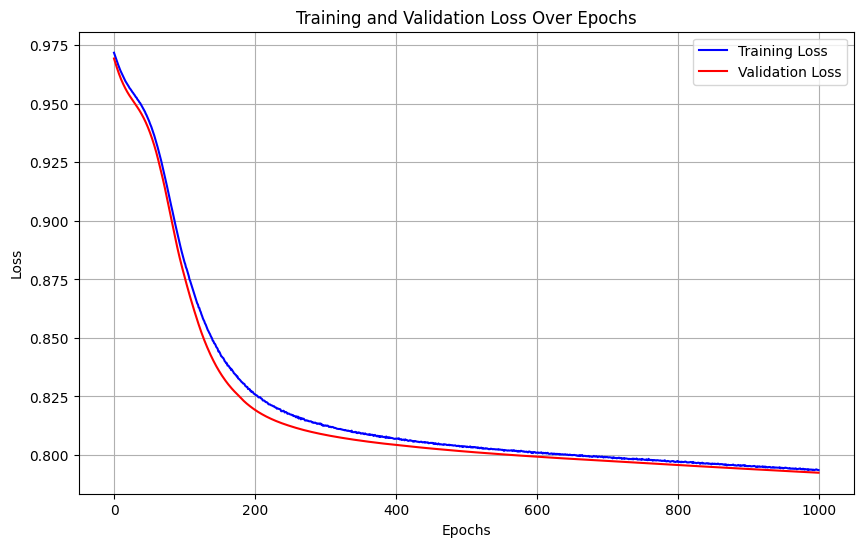

Training run 11/50 for 80% of the data...
Sample size for 80%: 159804


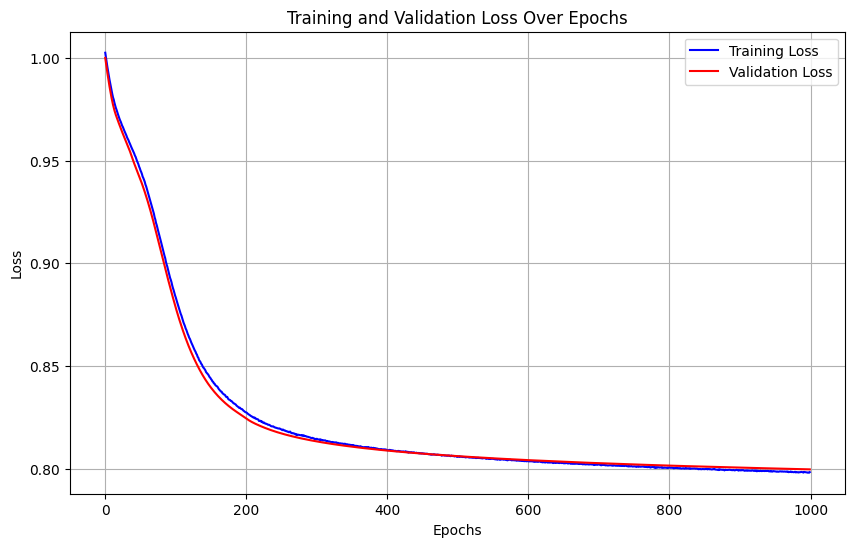

Training run 12/50 for 80% of the data...
Sample size for 80%: 159804


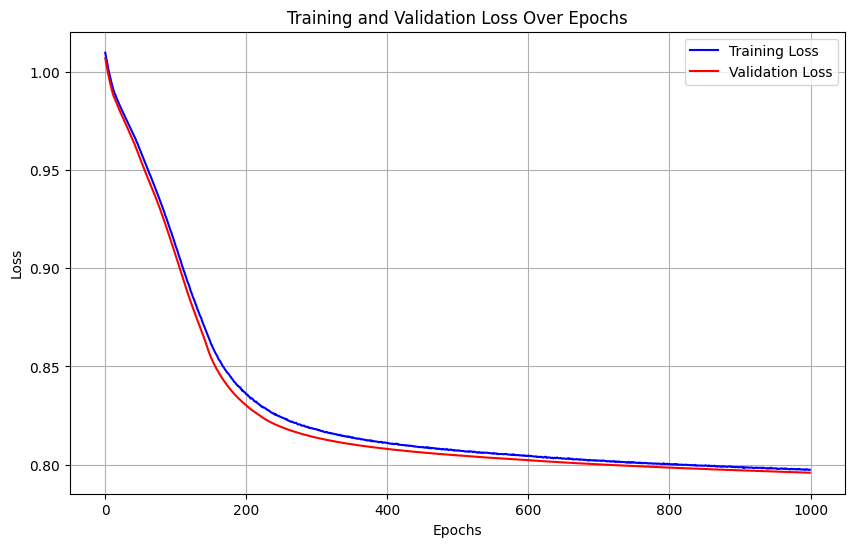

Training run 13/50 for 80% of the data...
Sample size for 80%: 159804


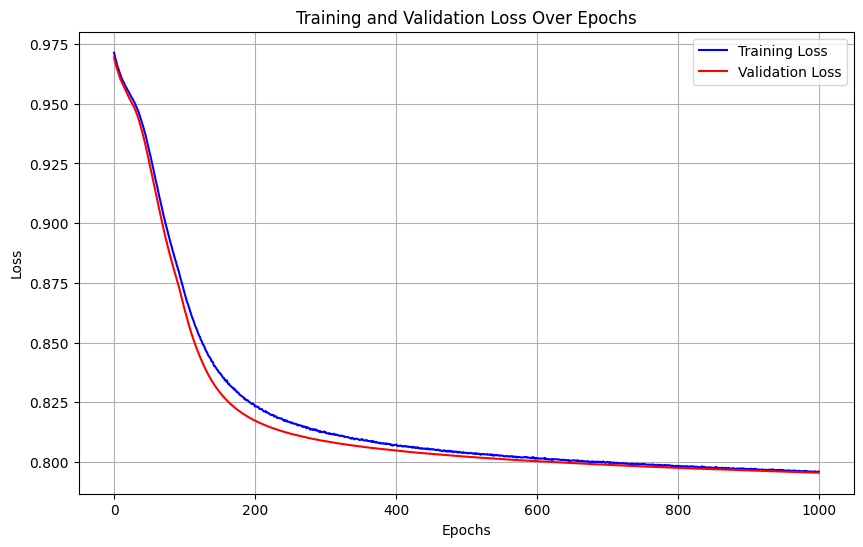

Training run 14/50 for 80% of the data...
Sample size for 80%: 159804


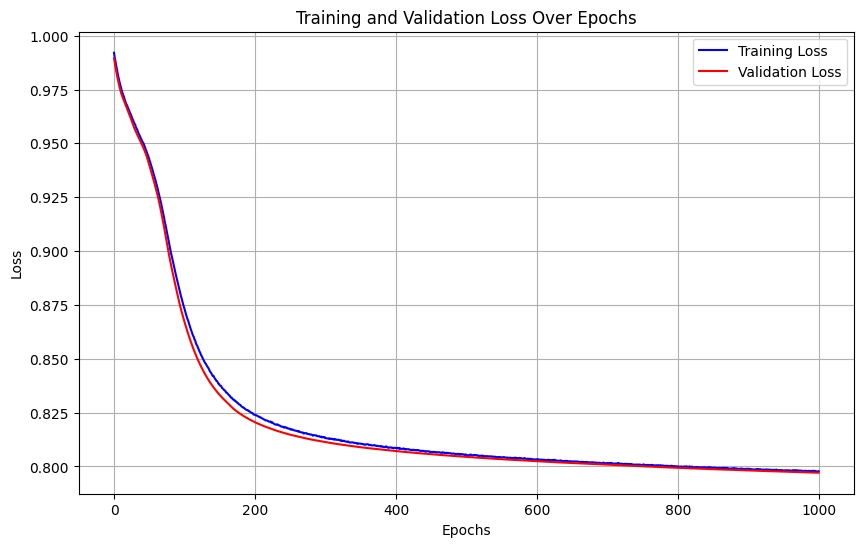

Training run 15/50 for 80% of the data...
Sample size for 80%: 159804


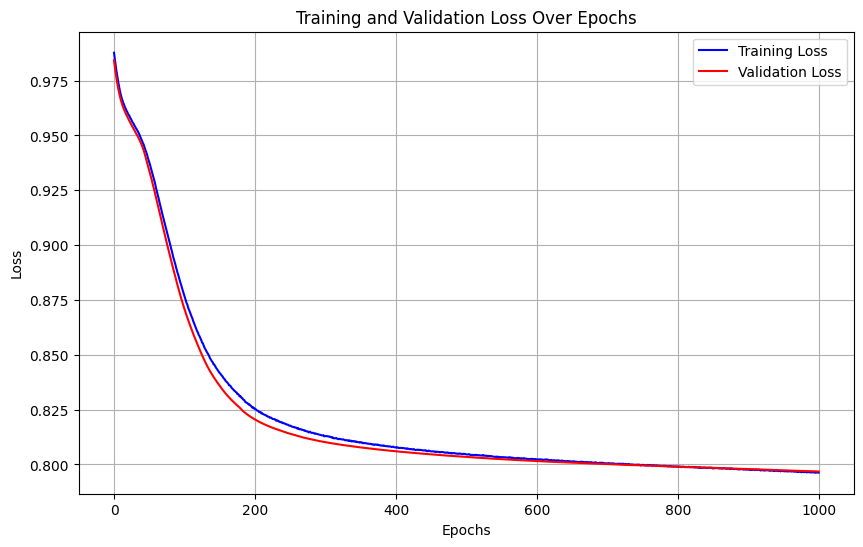

Training run 16/50 for 80% of the data...
Sample size for 80%: 159804


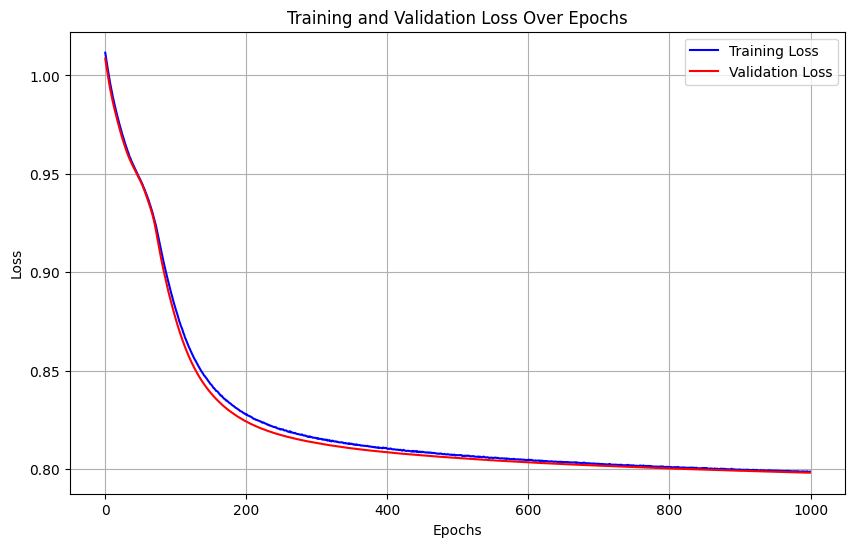

Training run 17/50 for 80% of the data...
Sample size for 80%: 159804


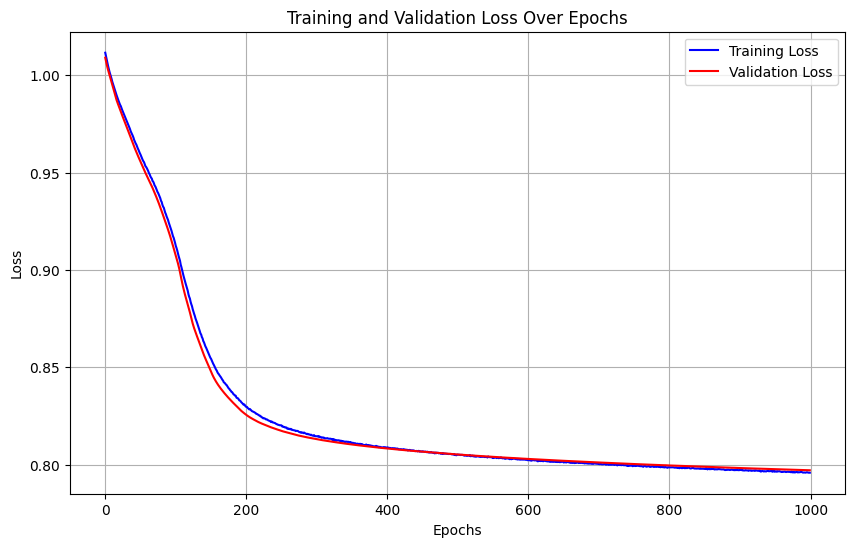

Training run 18/50 for 80% of the data...
Sample size for 80%: 159804


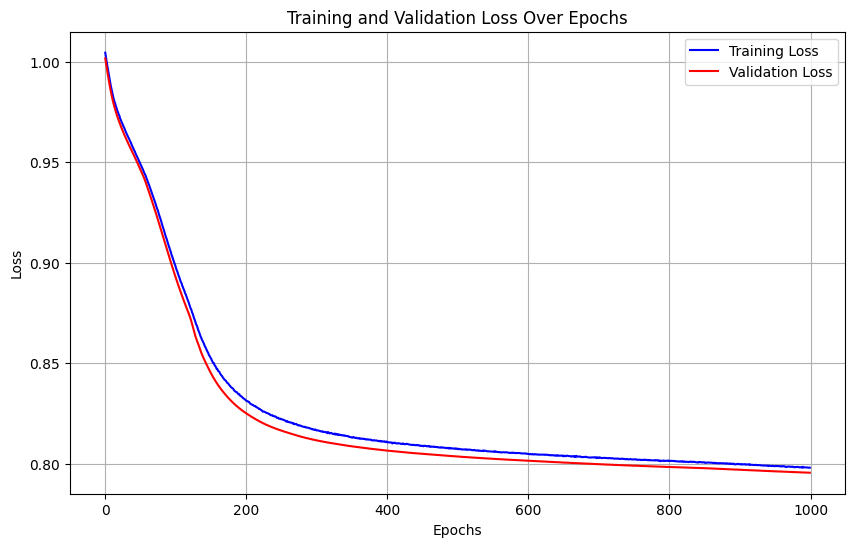

Training run 19/50 for 80% of the data...
Sample size for 80%: 159804


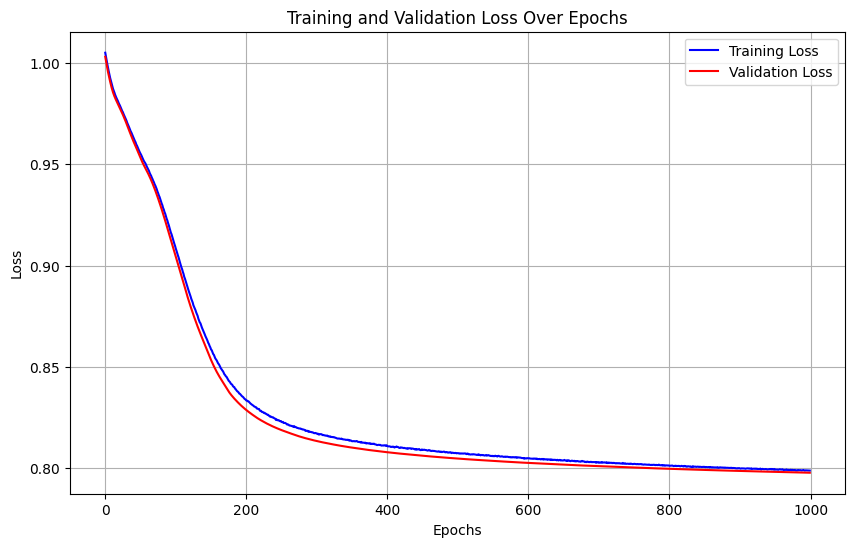

Training run 20/50 for 80% of the data...
Sample size for 80%: 159804


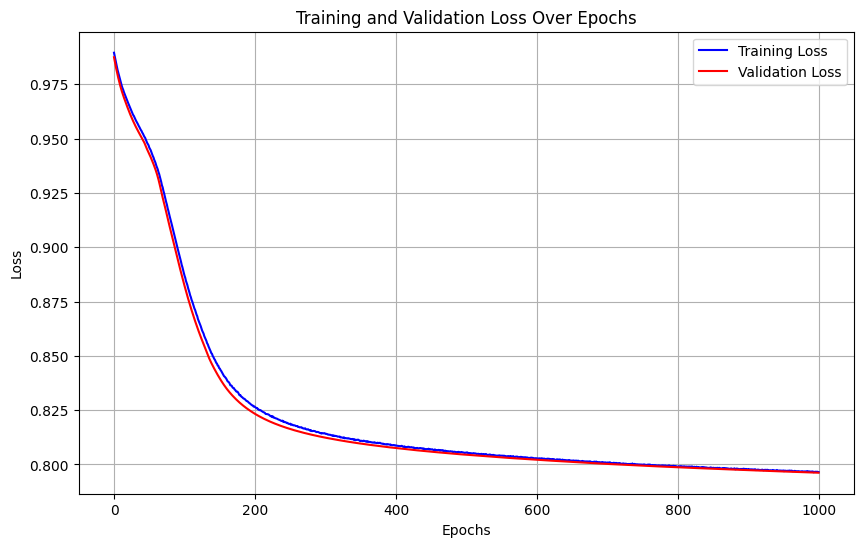

Training run 21/50 for 80% of the data...
Sample size for 80%: 159804


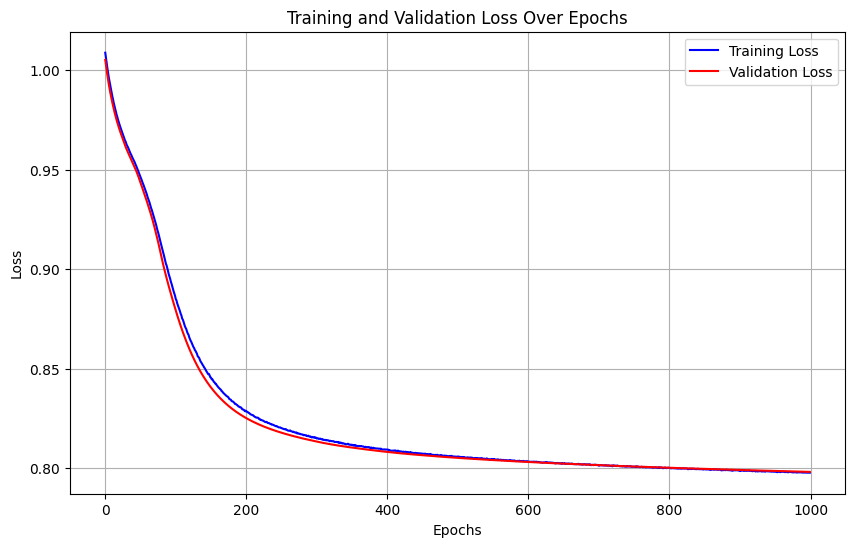

Training run 22/50 for 80% of the data...
Sample size for 80%: 159804


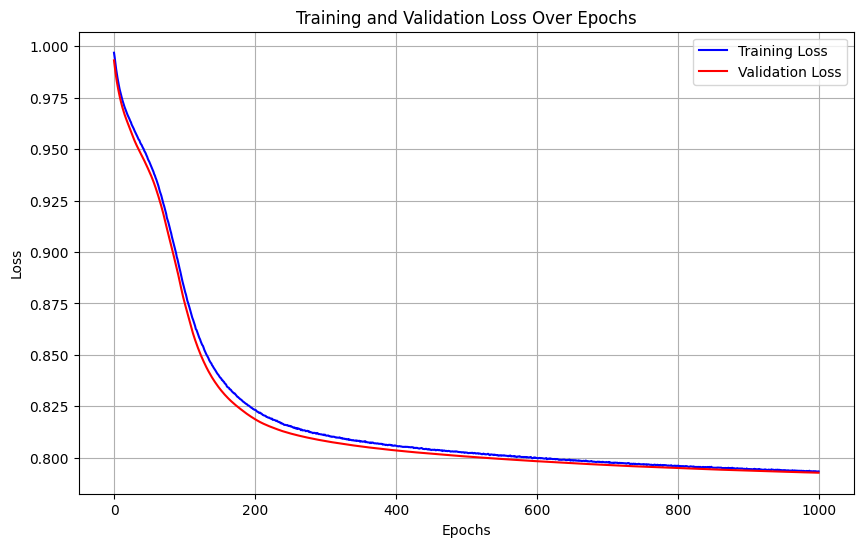

Training run 23/50 for 80% of the data...
Sample size for 80%: 159804


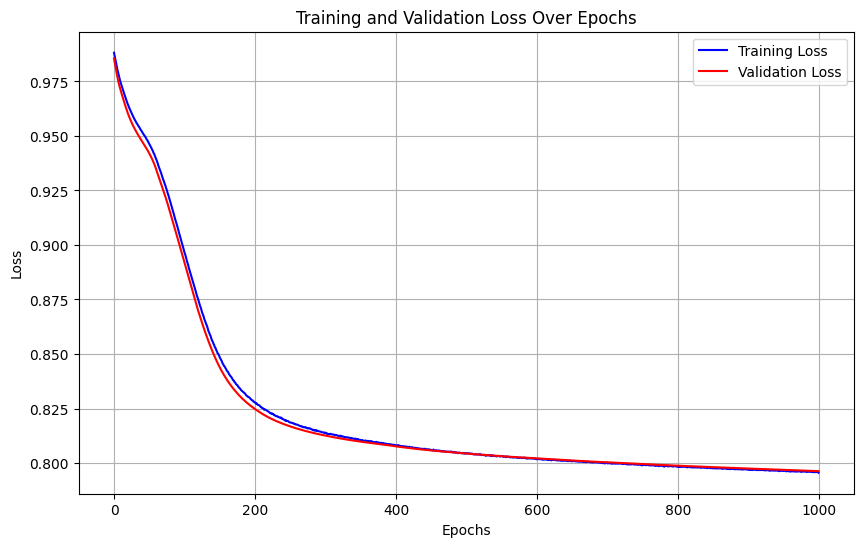

Training run 24/50 for 80% of the data...
Sample size for 80%: 159804


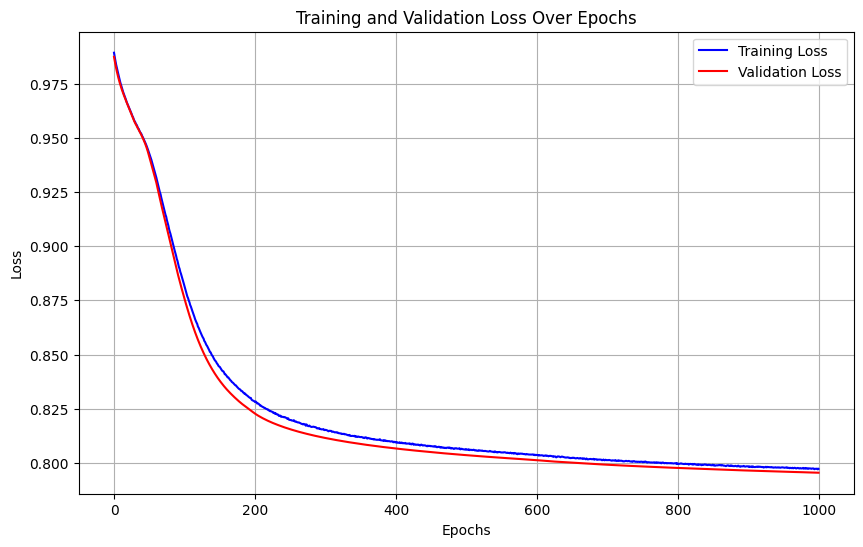

Training run 25/50 for 80% of the data...
Sample size for 80%: 159804


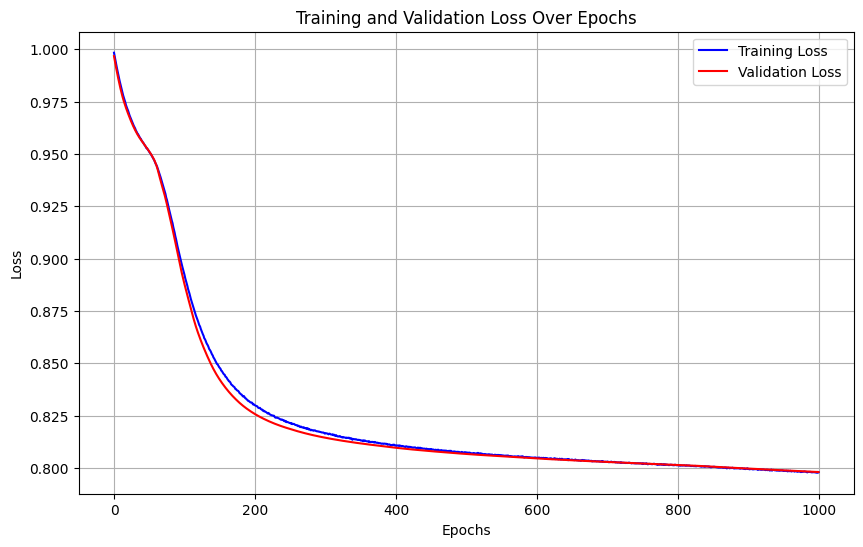

Training run 26/50 for 80% of the data...
Sample size for 80%: 159804


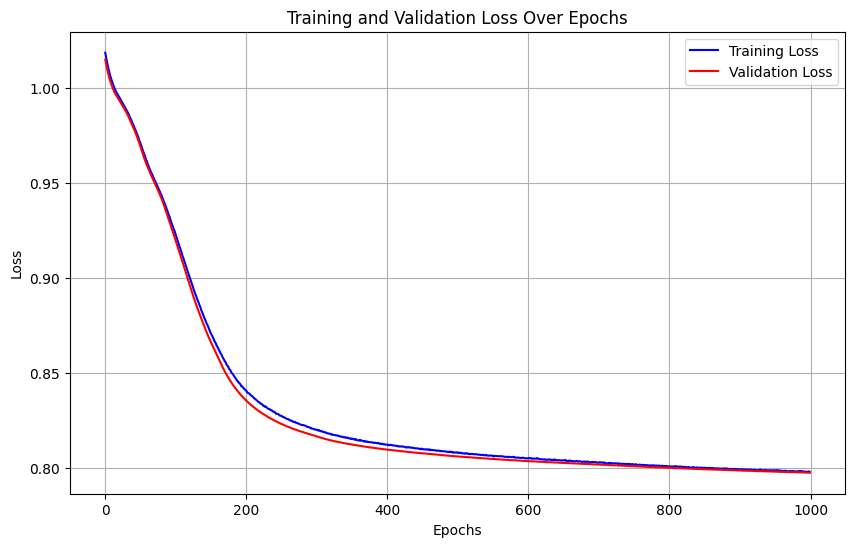

Training run 27/50 for 80% of the data...
Sample size for 80%: 159804


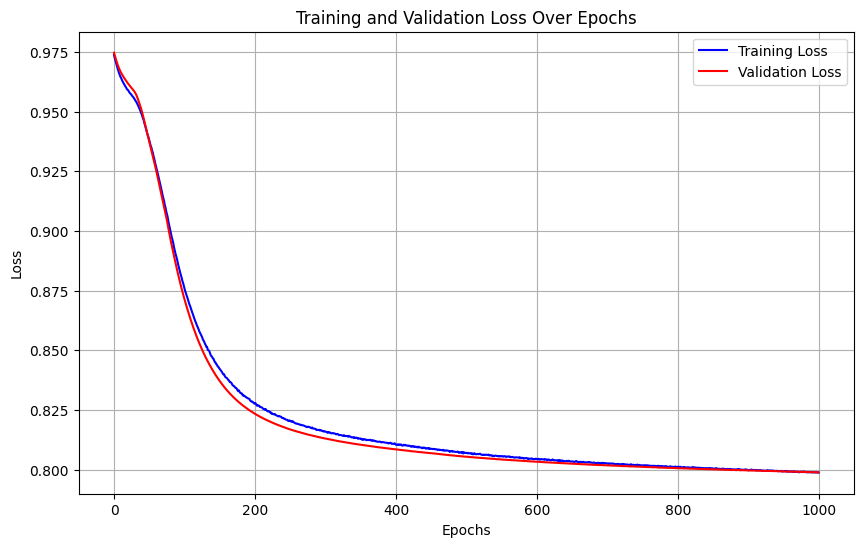

Training run 28/50 for 80% of the data...
Sample size for 80%: 159804


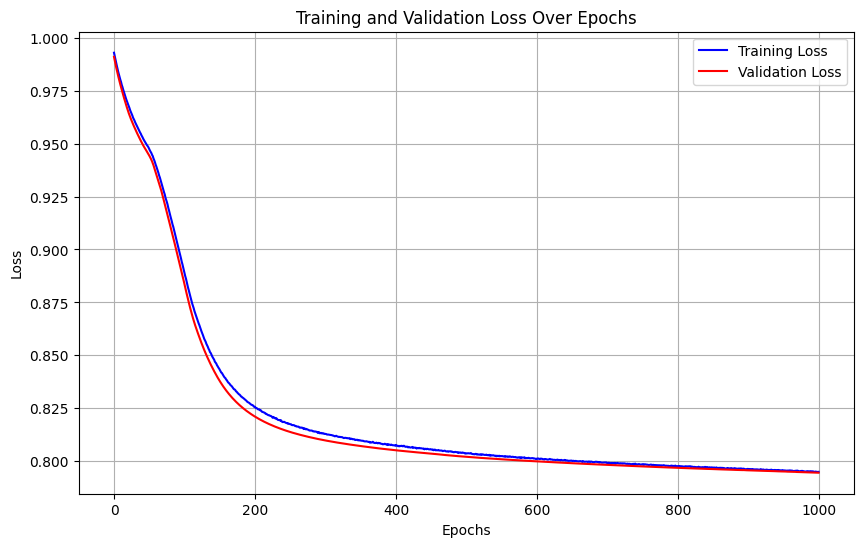

Training run 29/50 for 80% of the data...
Sample size for 80%: 159804


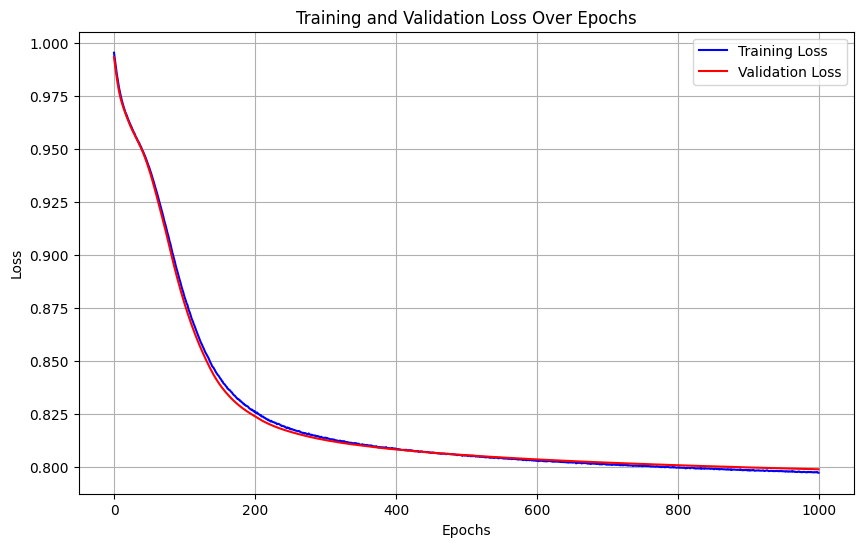

Training run 30/50 for 80% of the data...
Sample size for 80%: 159804


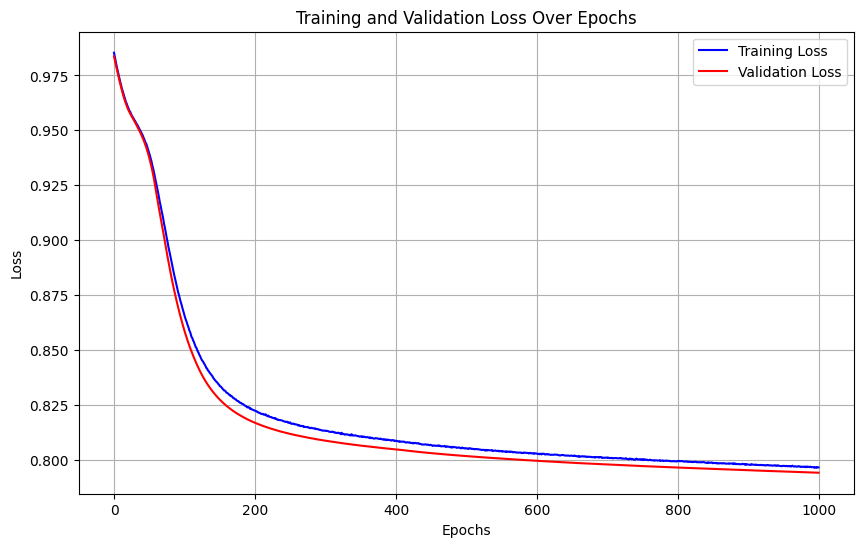

Training run 31/50 for 80% of the data...
Sample size for 80%: 159804


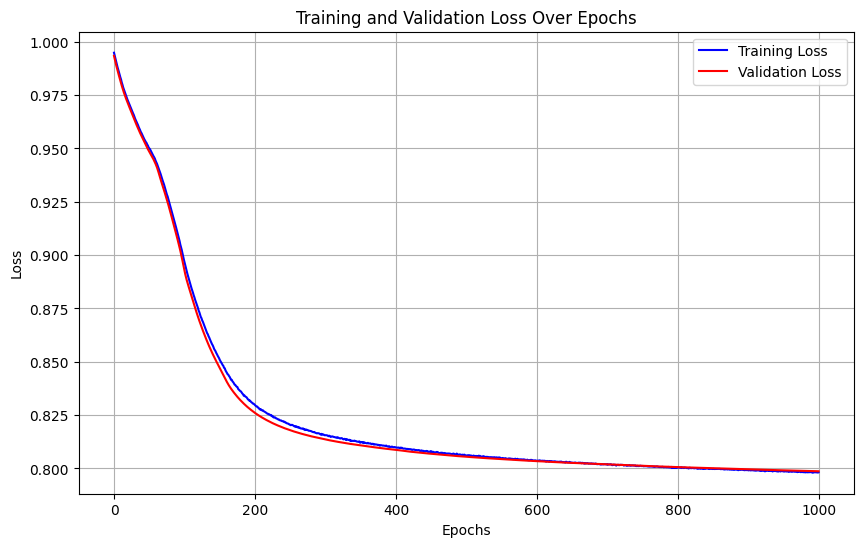

Training run 32/50 for 80% of the data...
Sample size for 80%: 159804


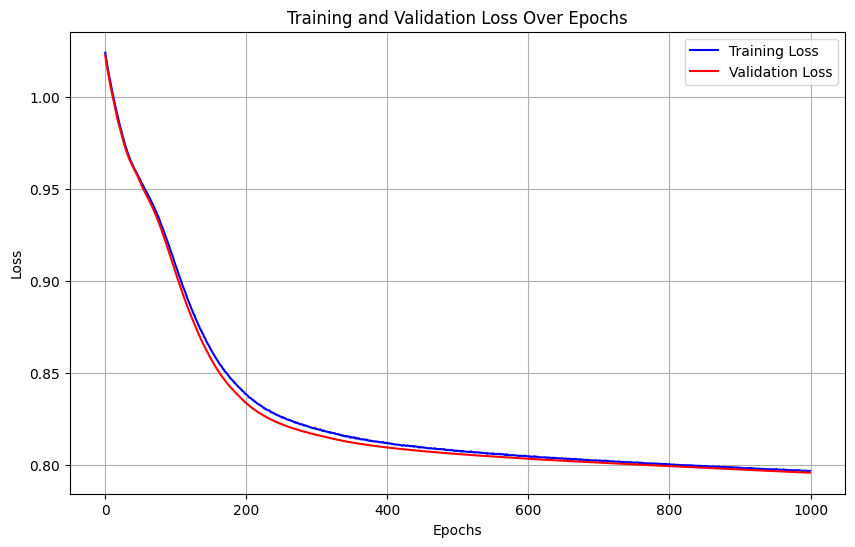

Training run 33/50 for 80% of the data...
Sample size for 80%: 159804


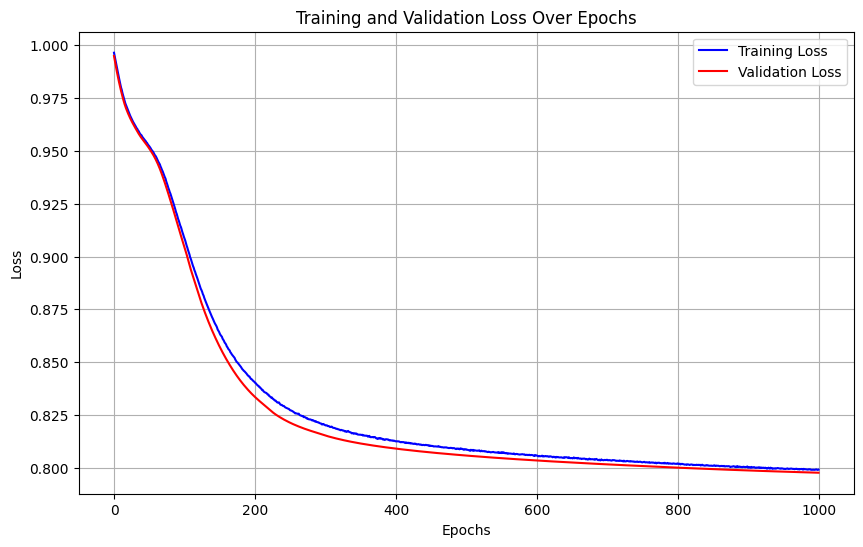

Training run 34/50 for 80% of the data...
Sample size for 80%: 159804


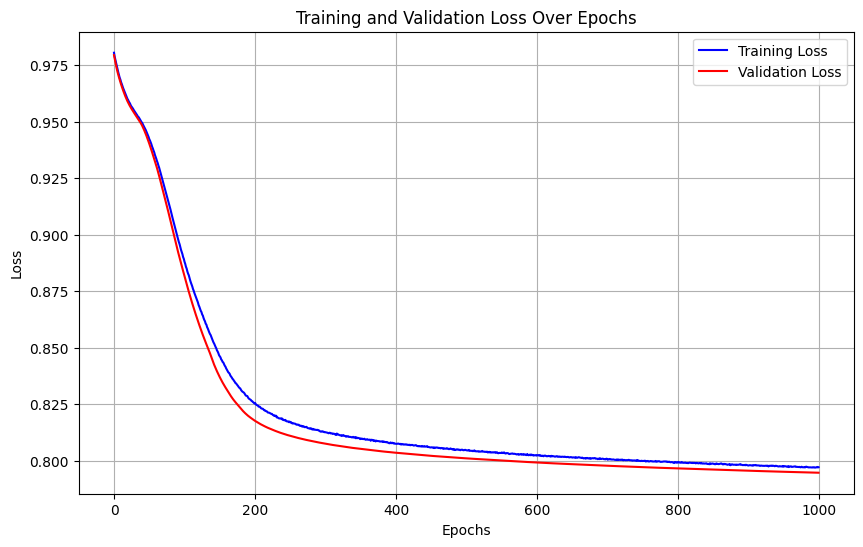

Training run 35/50 for 80% of the data...
Sample size for 80%: 159804


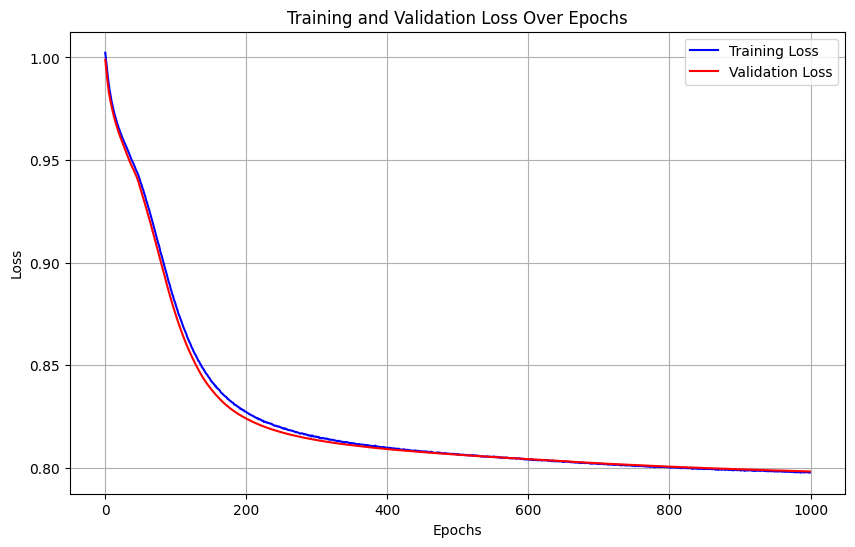

Training run 36/50 for 80% of the data...
Sample size for 80%: 159804


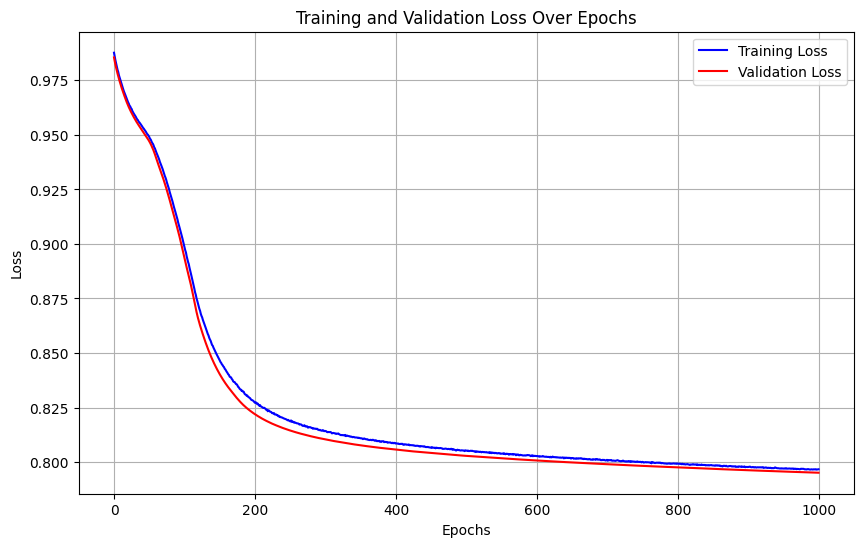

Training run 37/50 for 80% of the data...
Sample size for 80%: 159804


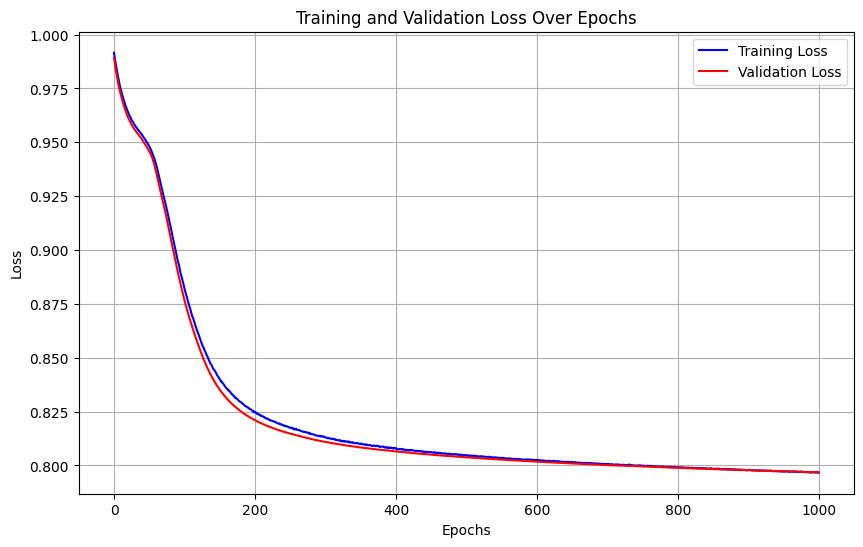

Training run 38/50 for 80% of the data...
Sample size for 80%: 159804


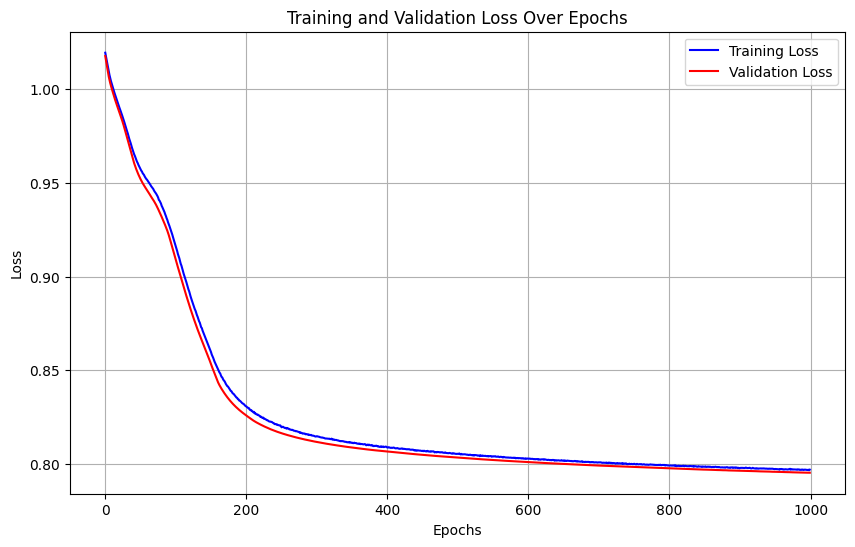

Training run 39/50 for 80% of the data...
Sample size for 80%: 159804


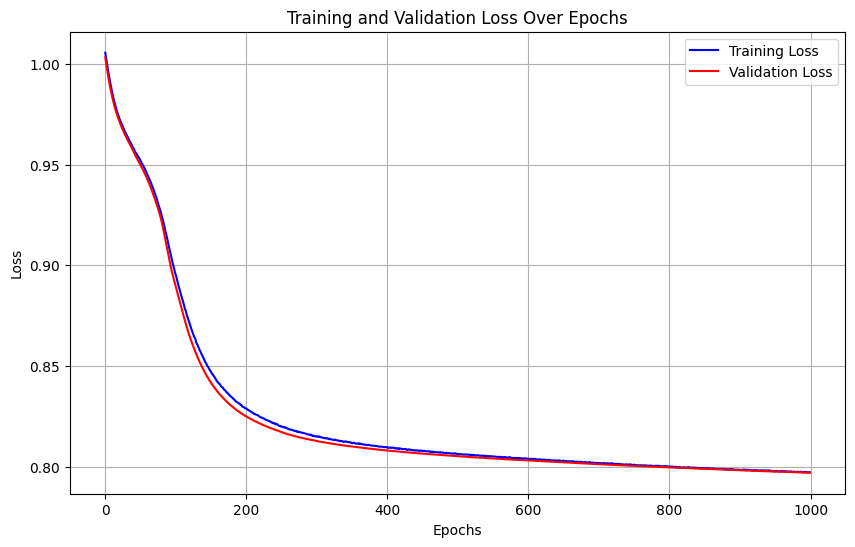

Training run 40/50 for 80% of the data...
Sample size for 80%: 159804


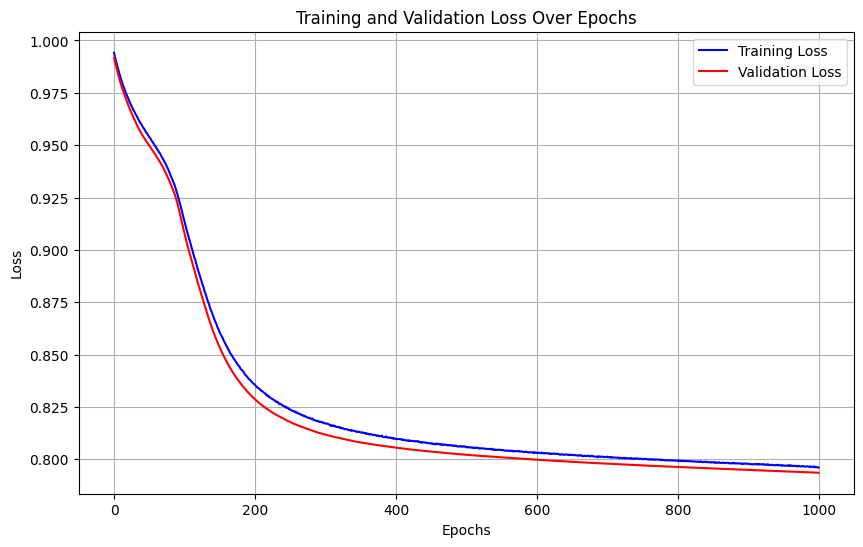

Training run 41/50 for 80% of the data...
Sample size for 80%: 159804


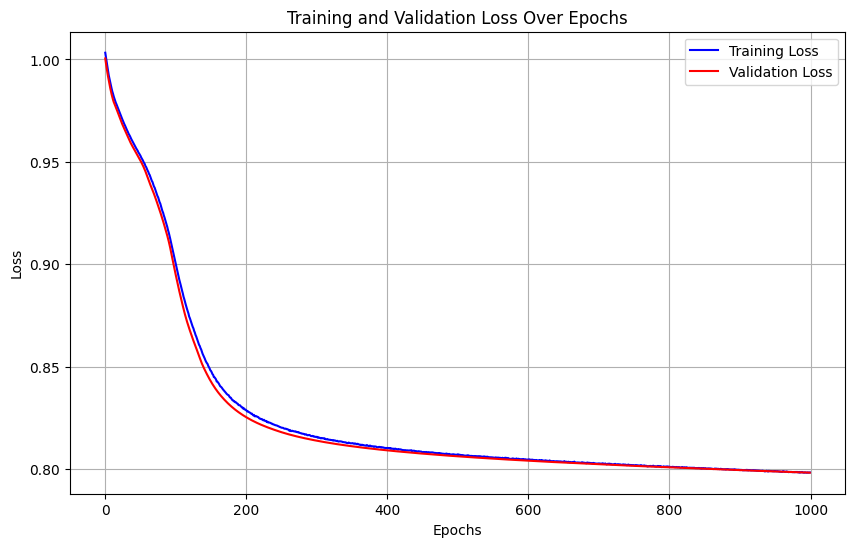

Training run 42/50 for 80% of the data...
Sample size for 80%: 159804


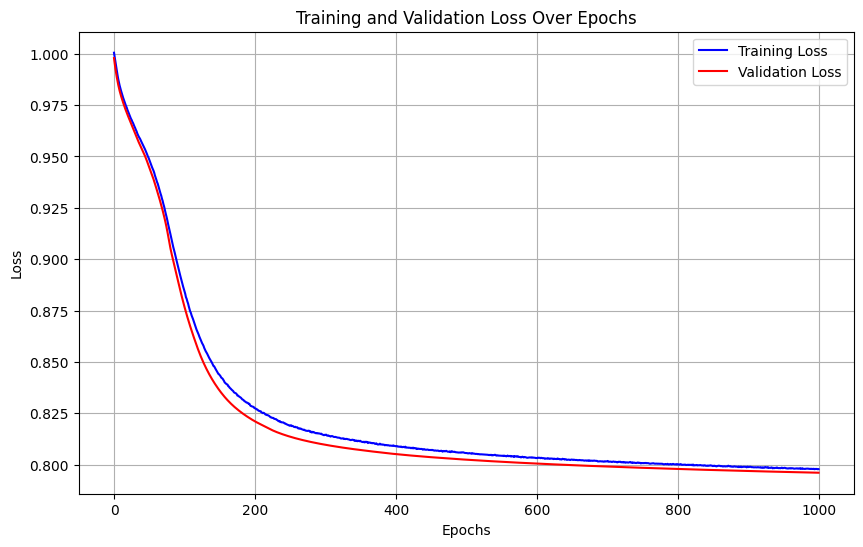

Training run 43/50 for 80% of the data...
Sample size for 80%: 159804


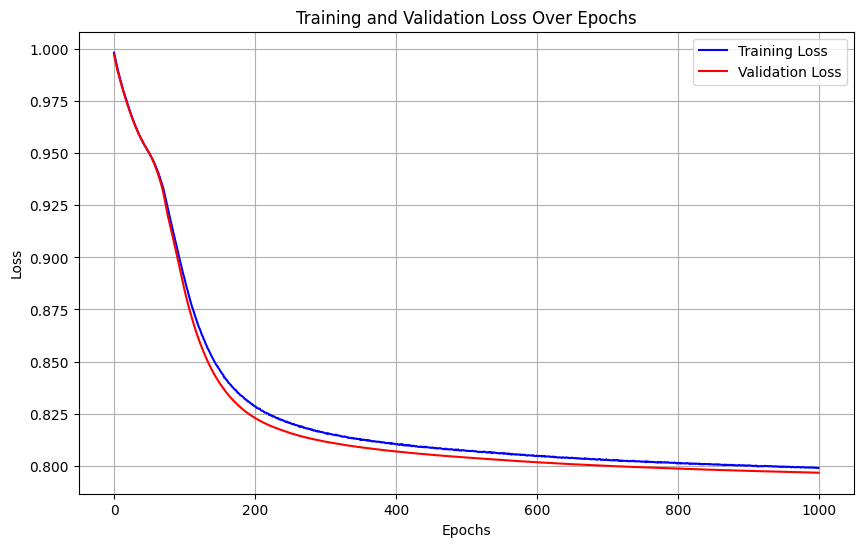

Training run 44/50 for 80% of the data...
Sample size for 80%: 159804


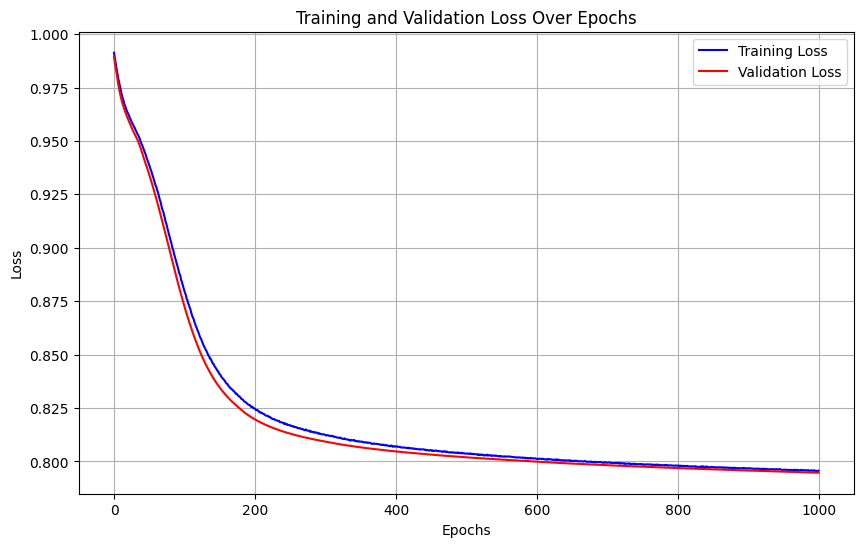

Training run 45/50 for 80% of the data...
Sample size for 80%: 159804


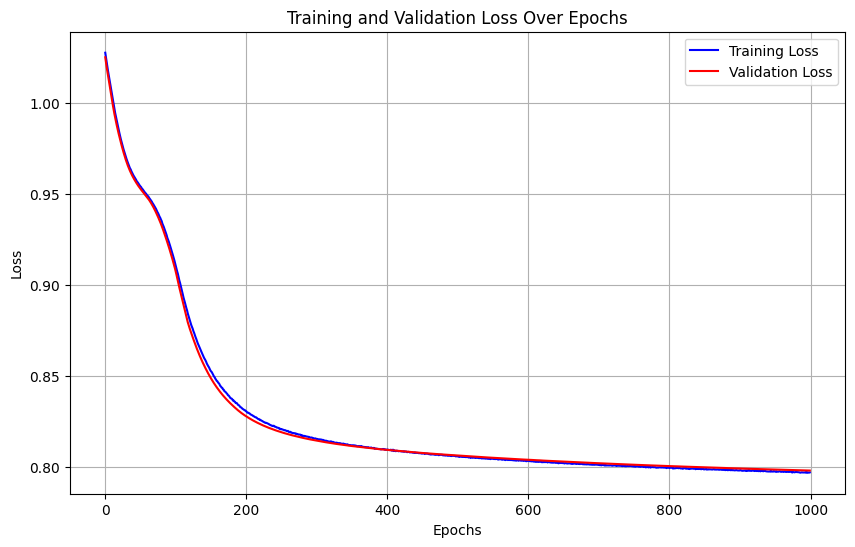

Training run 46/50 for 80% of the data...
Sample size for 80%: 159804


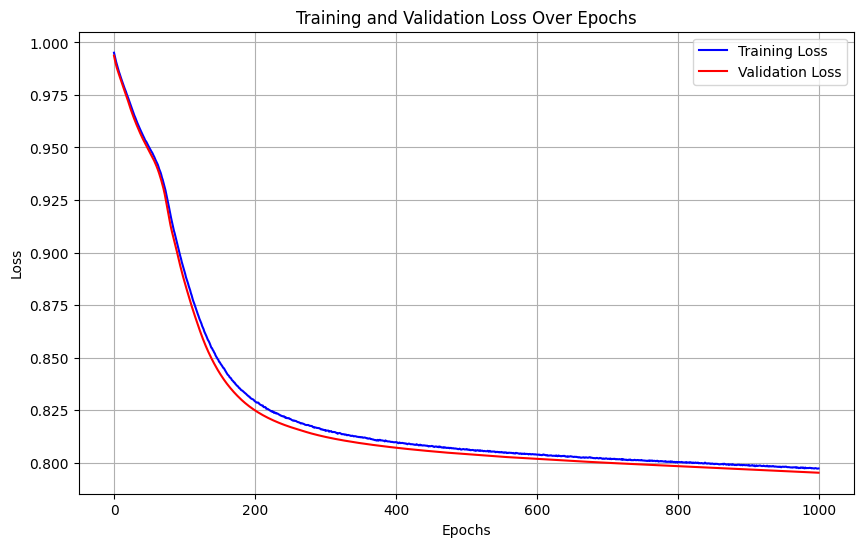

Training run 47/50 for 80% of the data...
Sample size for 80%: 159804


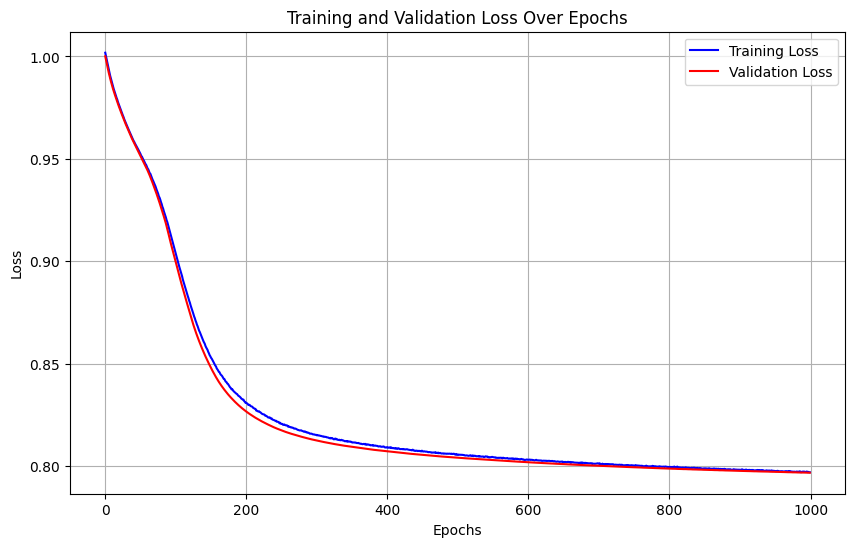

Training run 48/50 for 80% of the data...
Sample size for 80%: 159804


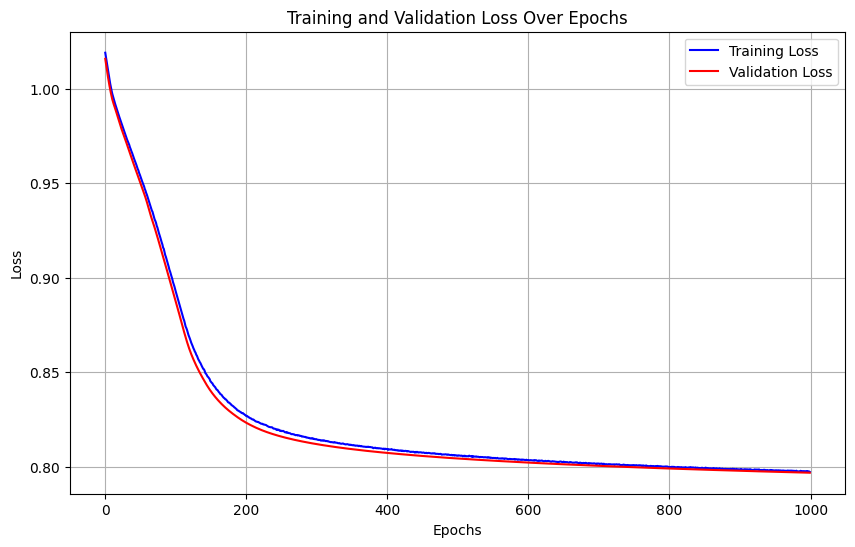

Training run 49/50 for 80% of the data...
Sample size for 80%: 159804


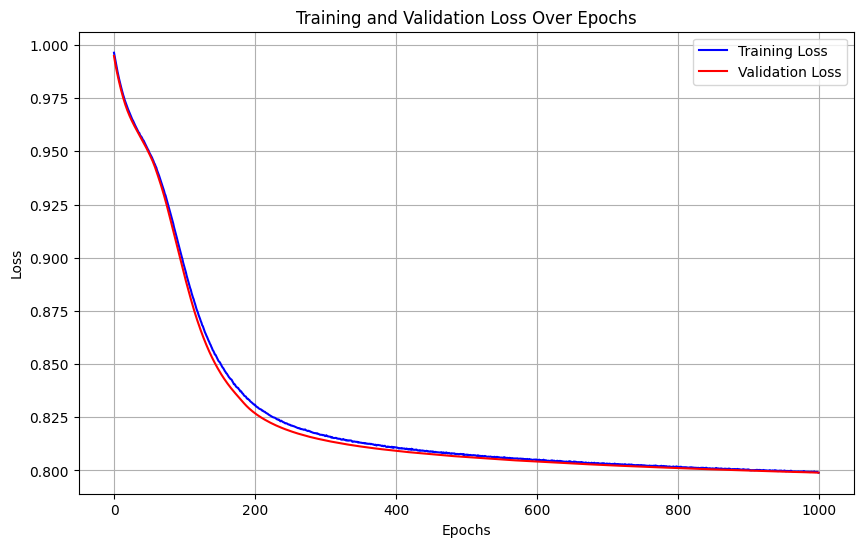

Training run 50/50 for 80% of the data...
Sample size for 80%: 159804


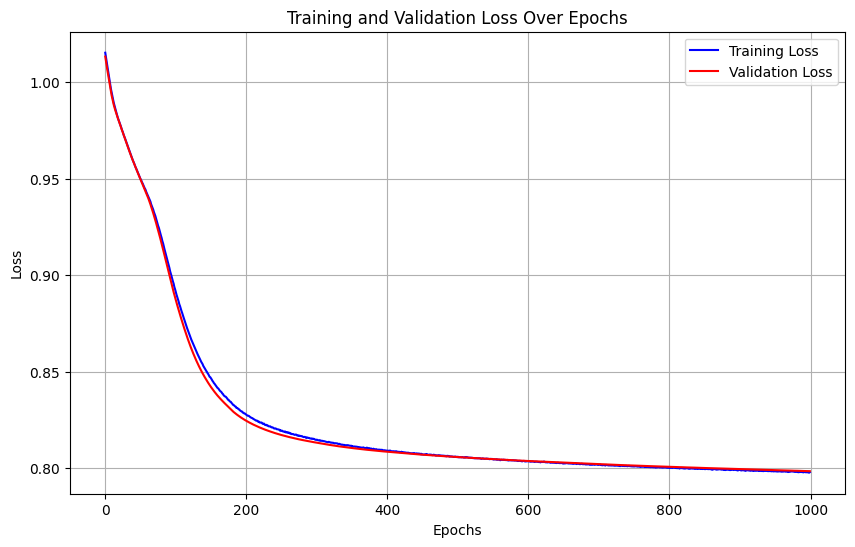

Metrics for 80% of data:
Final Metrics (Aggregated Predictions): {'accuracy': np.float64(0.8586727574231093), 'precision': np.float64(0.7813618968625), 'recall': np.float64(0.7575260776116939), 'f1': np.float64(0.769247313753324), 'fpr': np.float64(0.09567251219328522)}
Metrics Across Runs:
accuracy: 0.8587 ± 0.0022
precision: 0.7814 ± 0.0048
recall: 0.7575 ± 0.0042
f1: 0.7692 ± 0.0033
fpr: 0.0957 ± 0.0024
Training model for 100% of the data...
Training run 1/50 for 100% of the data...
Sample size for 100%: 199755


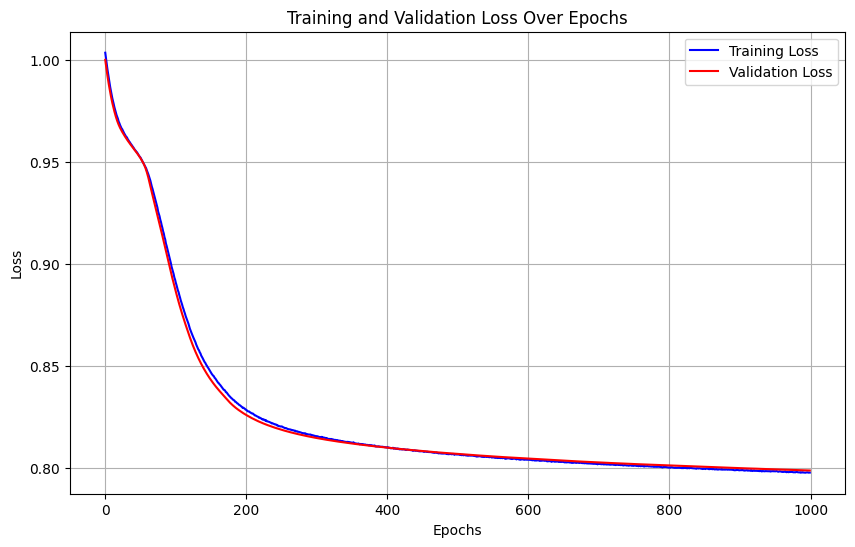

Training run 2/50 for 100% of the data...
Sample size for 100%: 199755


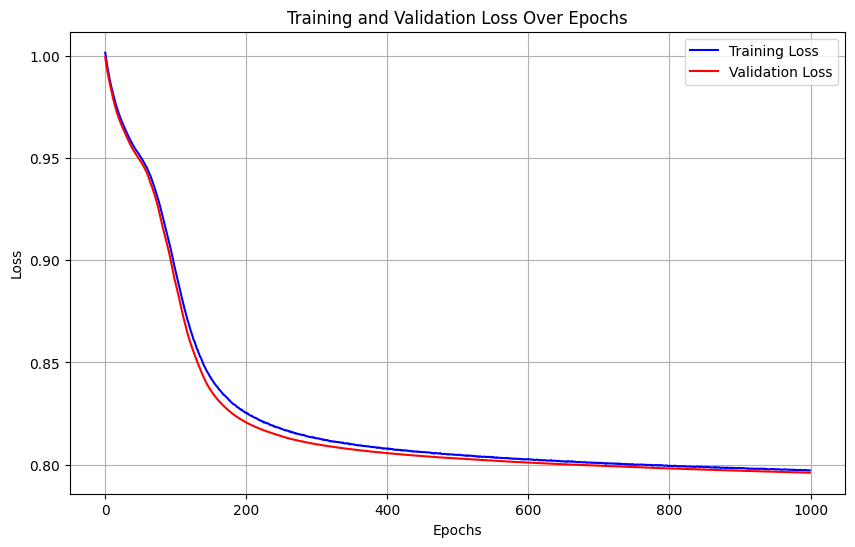

Training run 3/50 for 100% of the data...
Sample size for 100%: 199755


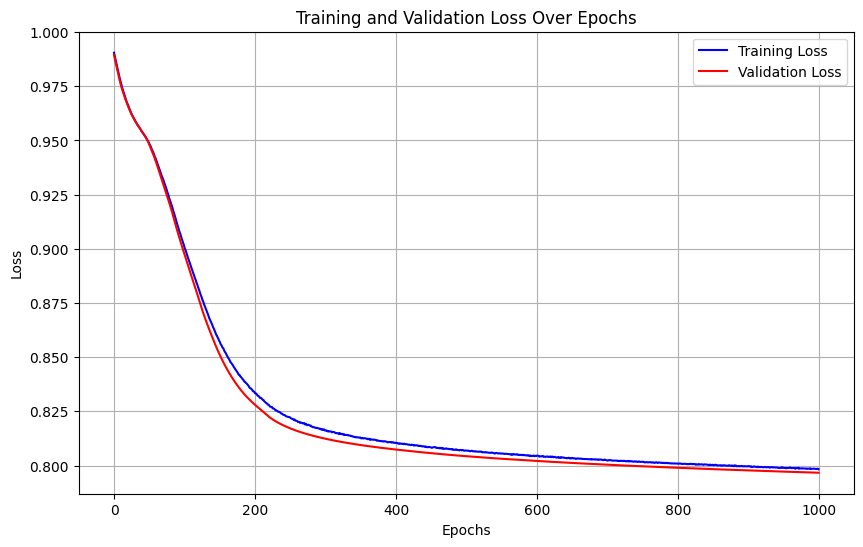

Training run 4/50 for 100% of the data...
Sample size for 100%: 199755


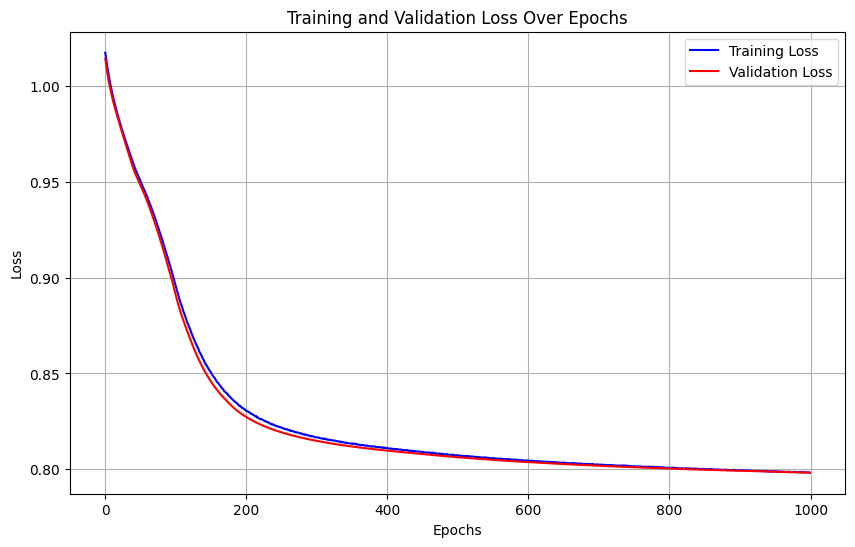

Training run 5/50 for 100% of the data...
Sample size for 100%: 199755


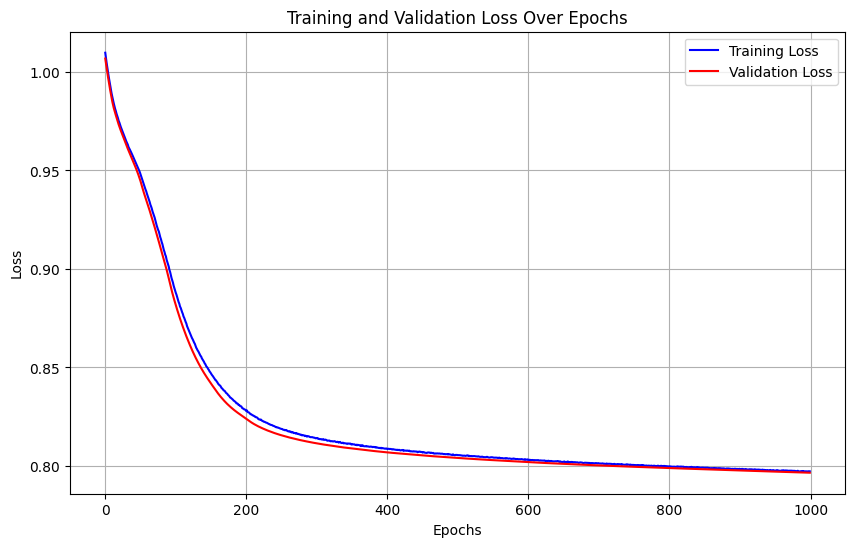

Training run 6/50 for 100% of the data...
Sample size for 100%: 199755


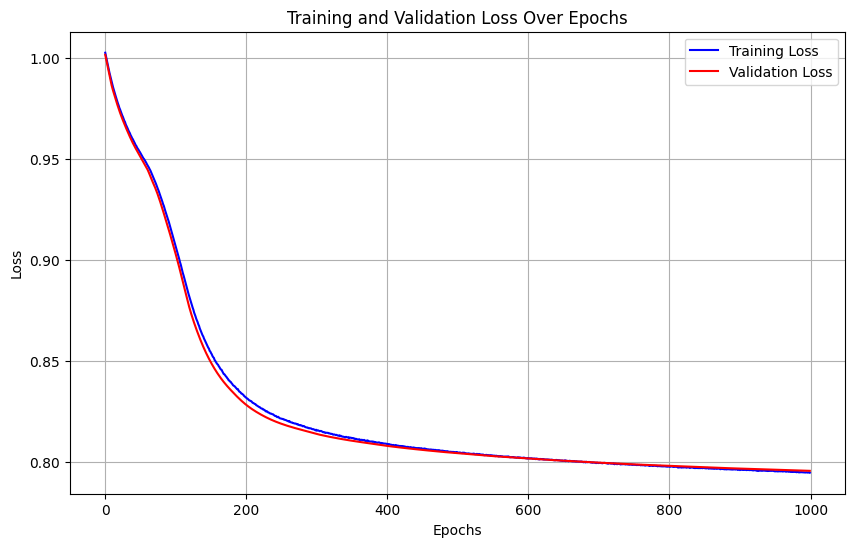

Training run 7/50 for 100% of the data...
Sample size for 100%: 199755


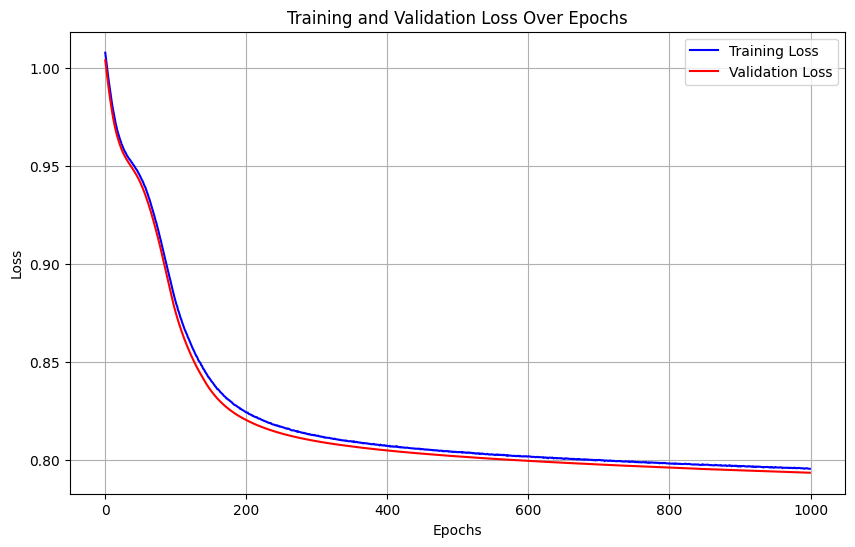

Training run 8/50 for 100% of the data...
Sample size for 100%: 199755


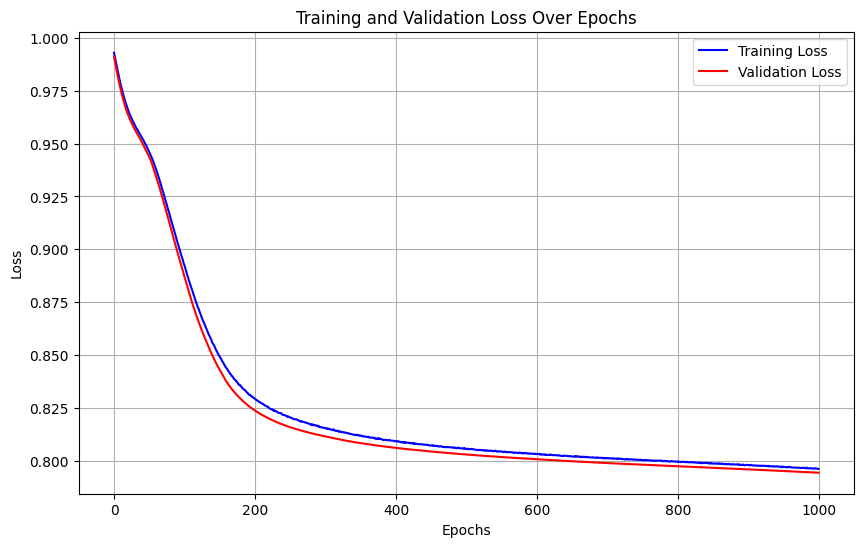

Training run 9/50 for 100% of the data...
Sample size for 100%: 199755


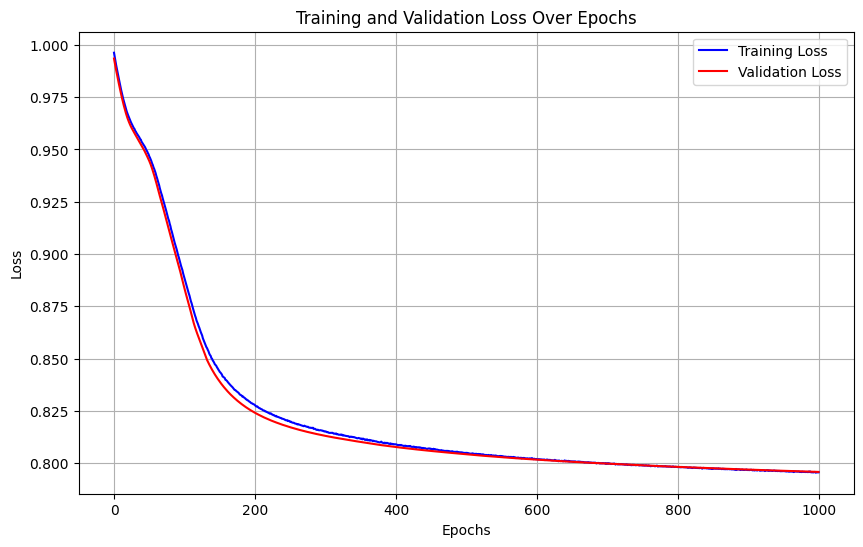

Training run 10/50 for 100% of the data...
Sample size for 100%: 199755


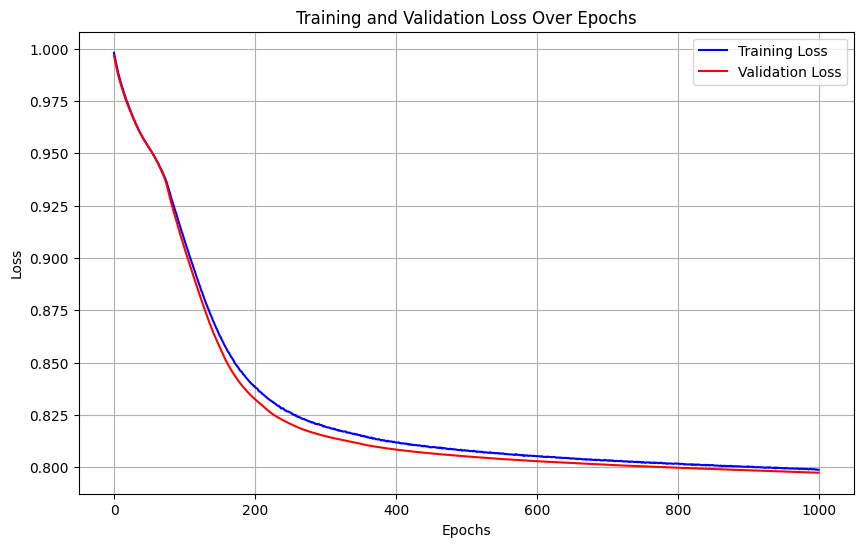

Training run 11/50 for 100% of the data...
Sample size for 100%: 199755


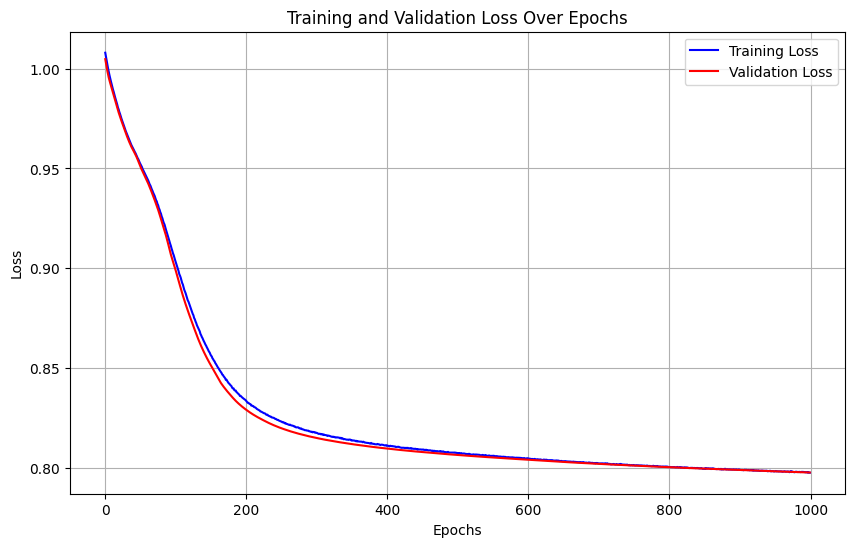

Training run 12/50 for 100% of the data...
Sample size for 100%: 199755


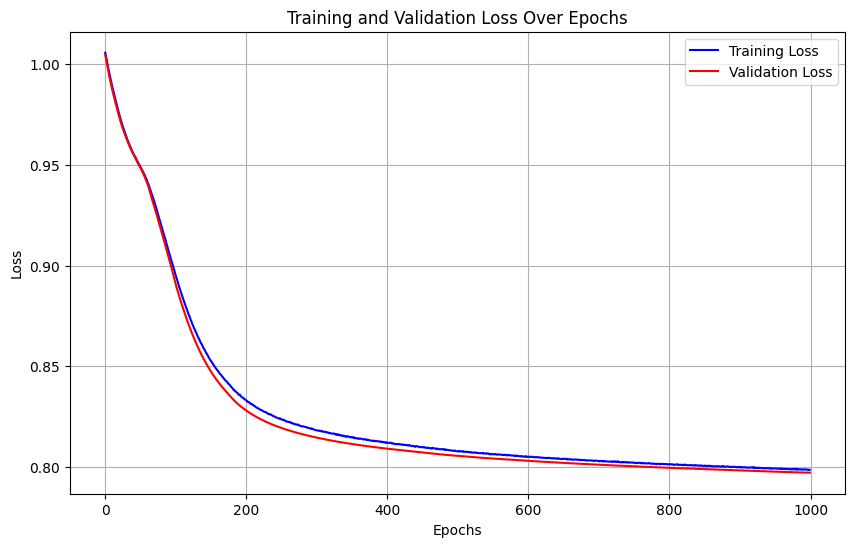

Training run 13/50 for 100% of the data...
Sample size for 100%: 199755


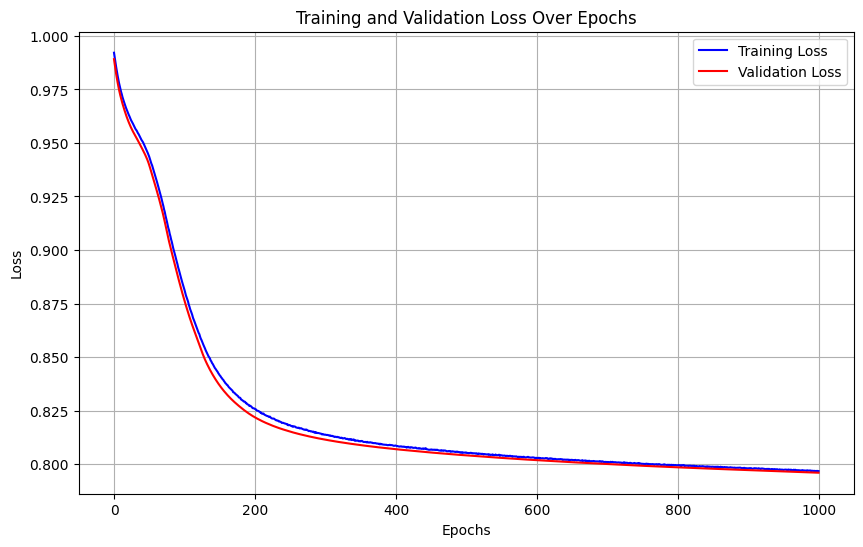

Training run 14/50 for 100% of the data...
Sample size for 100%: 199755


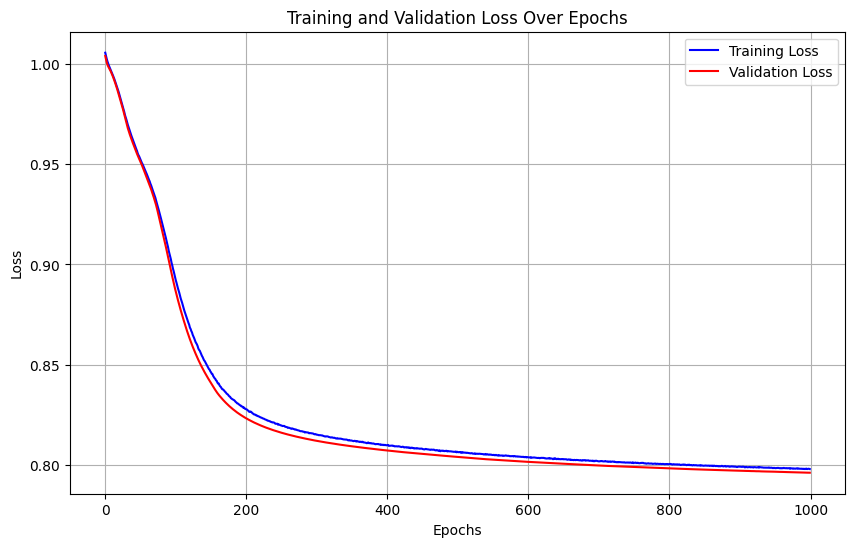

Training run 15/50 for 100% of the data...
Sample size for 100%: 199755


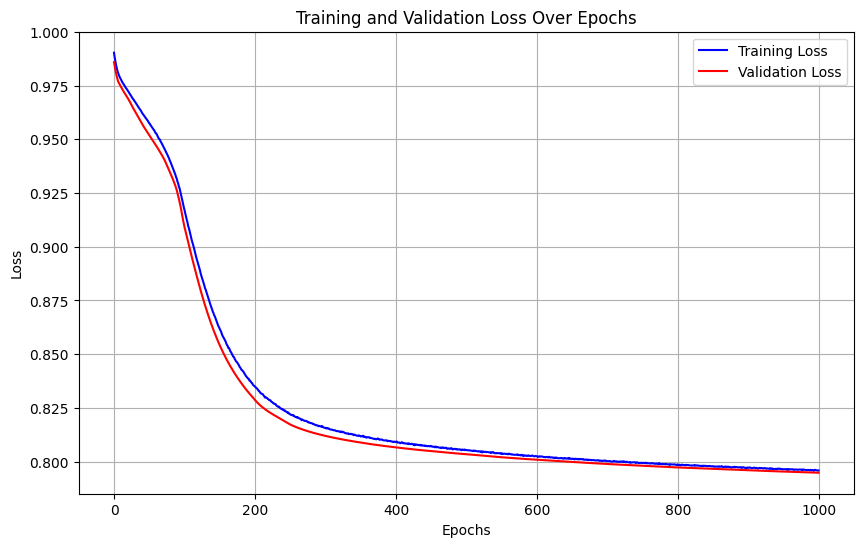

Training run 16/50 for 100% of the data...
Sample size for 100%: 199755


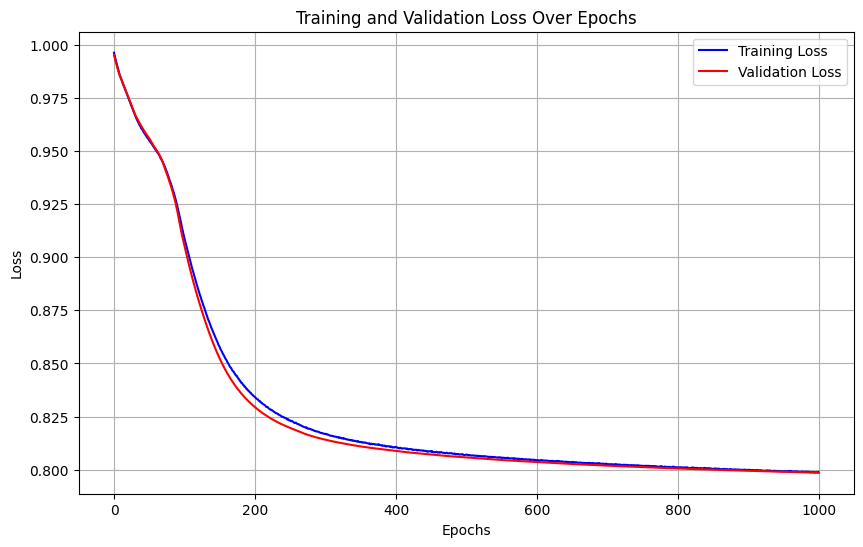

Training run 17/50 for 100% of the data...
Sample size for 100%: 199755


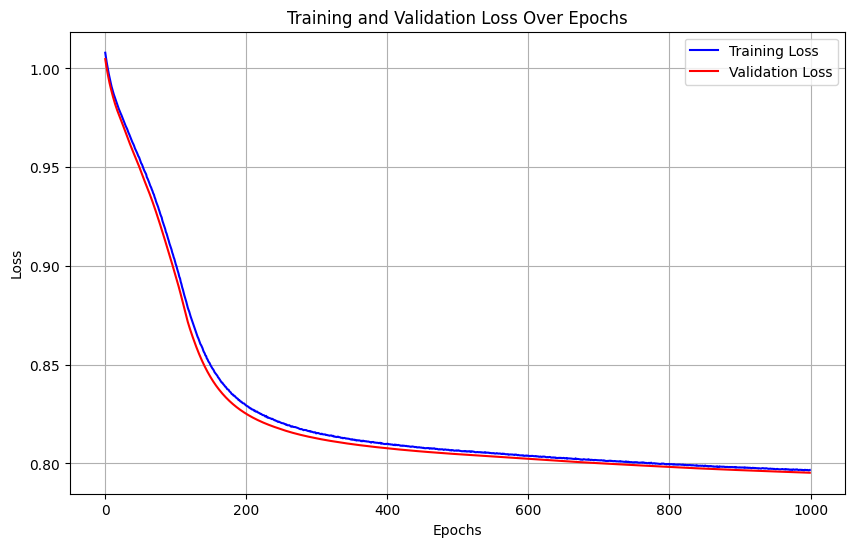

Training run 18/50 for 100% of the data...
Sample size for 100%: 199755


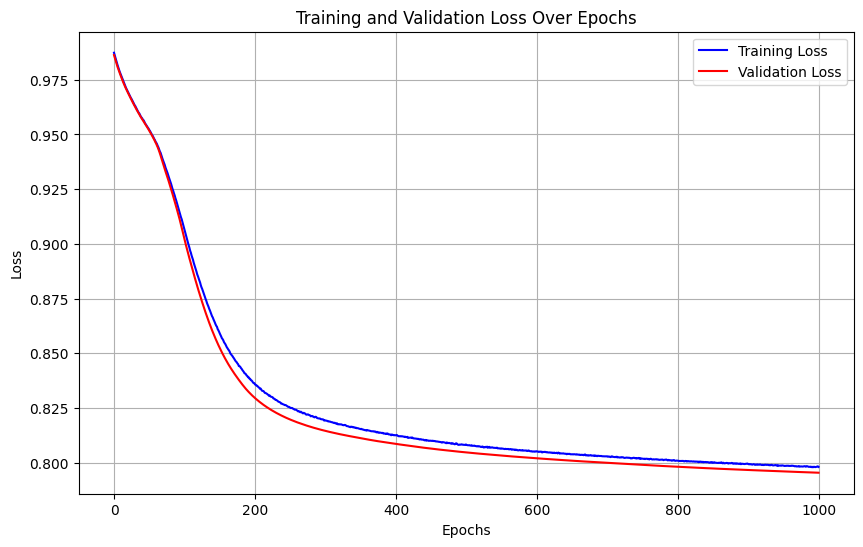

Training run 19/50 for 100% of the data...
Sample size for 100%: 199755


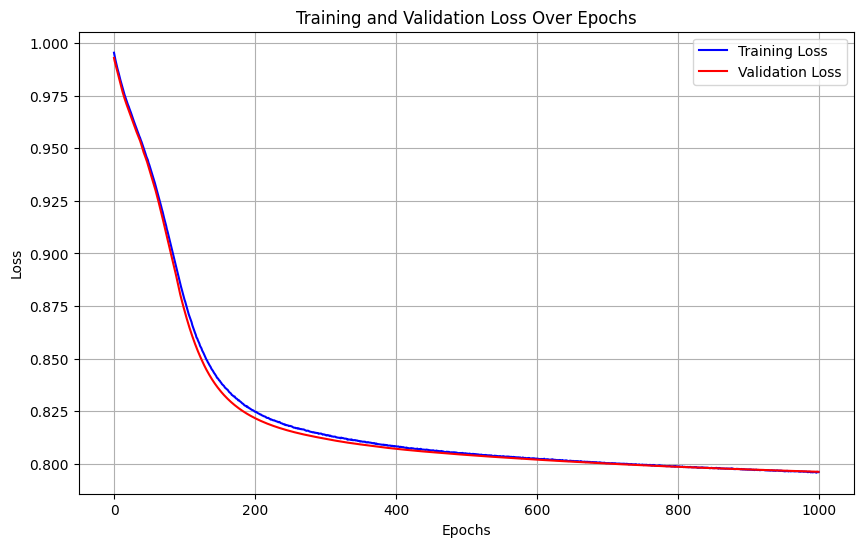

Training run 20/50 for 100% of the data...
Sample size for 100%: 199755


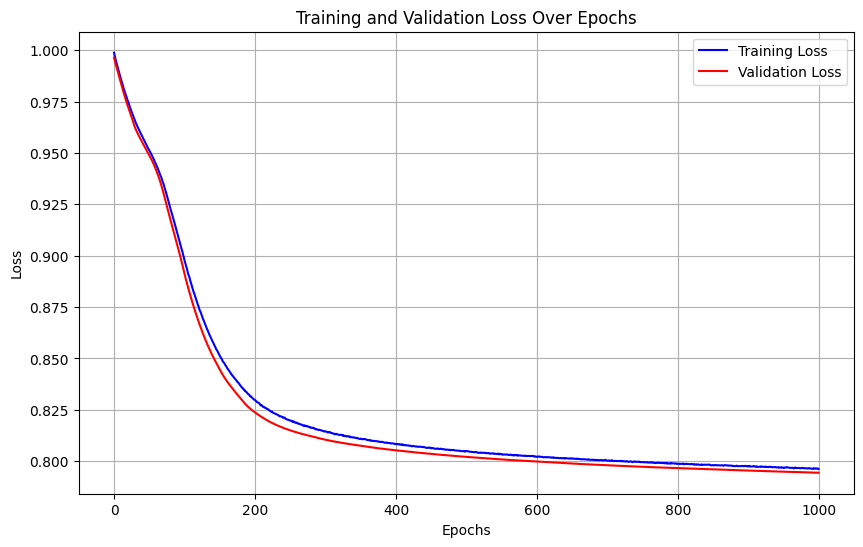

Training run 21/50 for 100% of the data...
Sample size for 100%: 199755


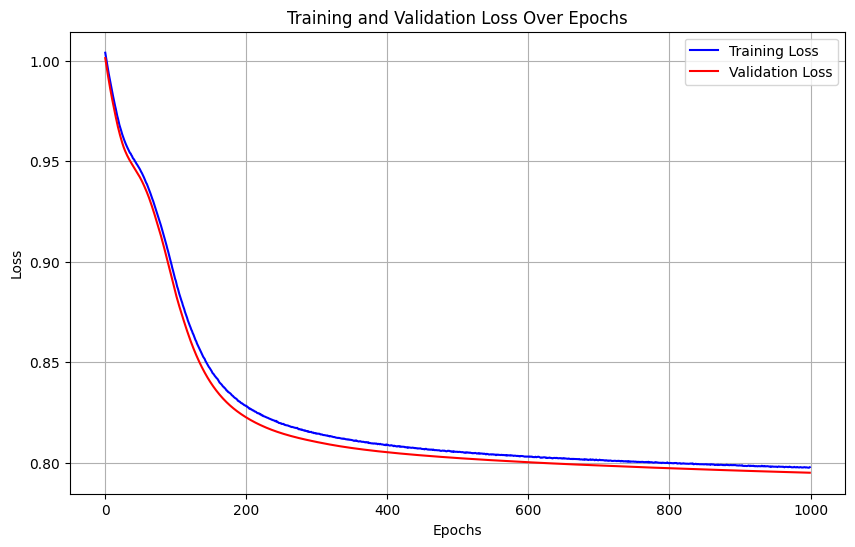

Training run 22/50 for 100% of the data...
Sample size for 100%: 199755


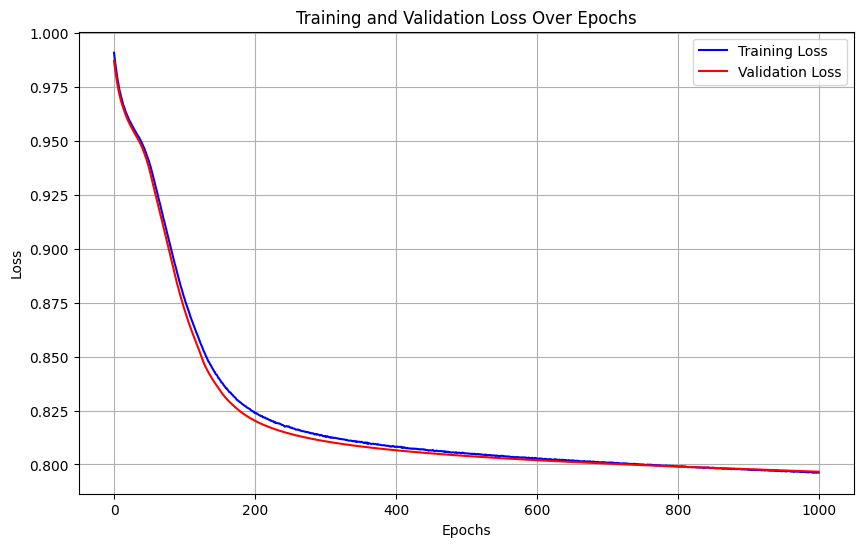

Training run 23/50 for 100% of the data...
Sample size for 100%: 199755


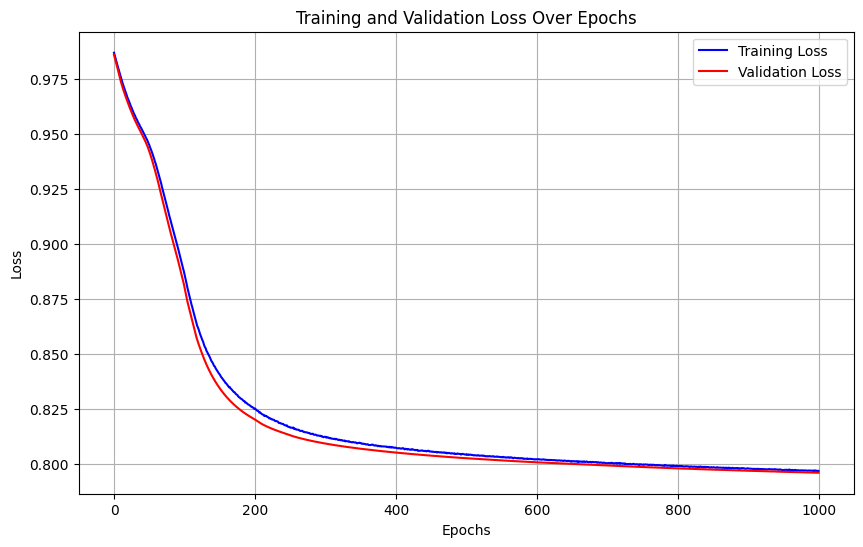

Training run 24/50 for 100% of the data...
Sample size for 100%: 199755


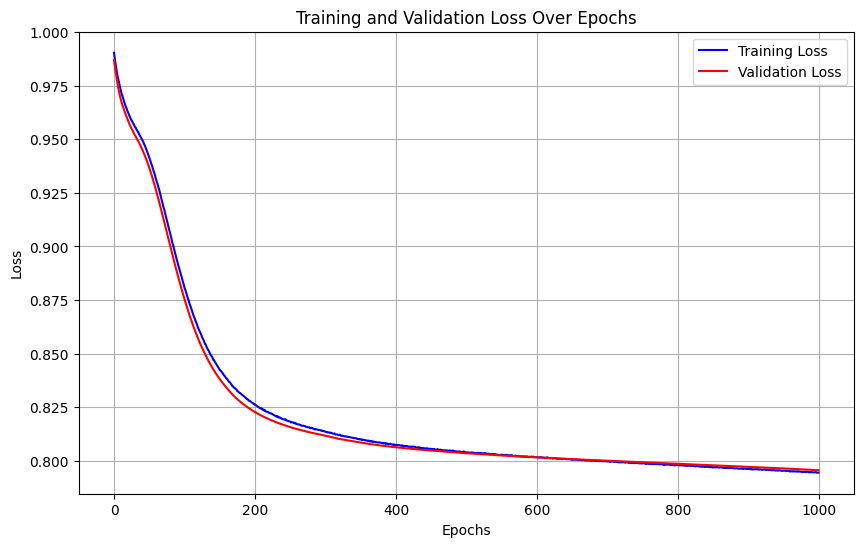

Training run 25/50 for 100% of the data...
Sample size for 100%: 199755


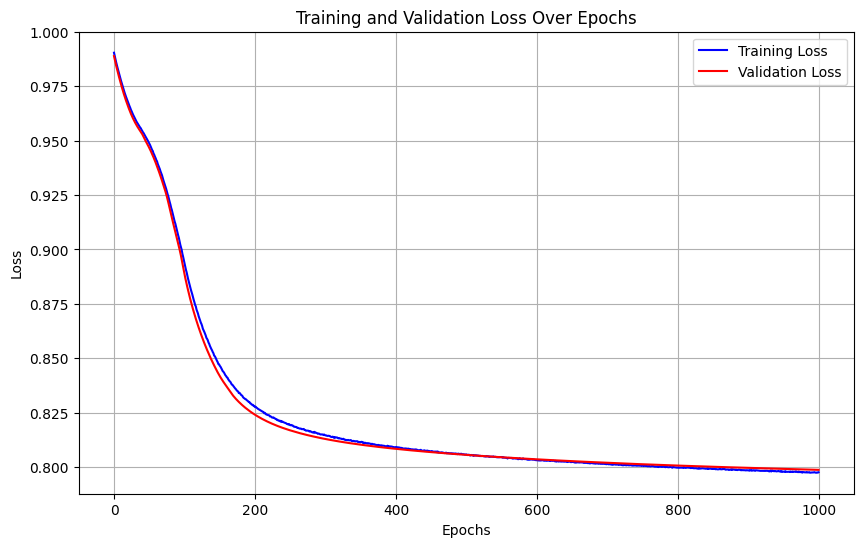

Training run 26/50 for 100% of the data...
Sample size for 100%: 199755


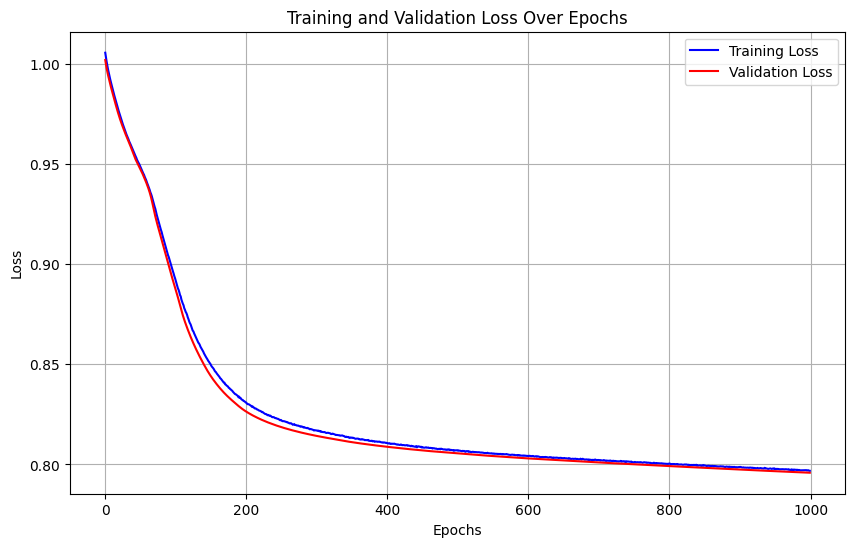

Training run 27/50 for 100% of the data...
Sample size for 100%: 199755


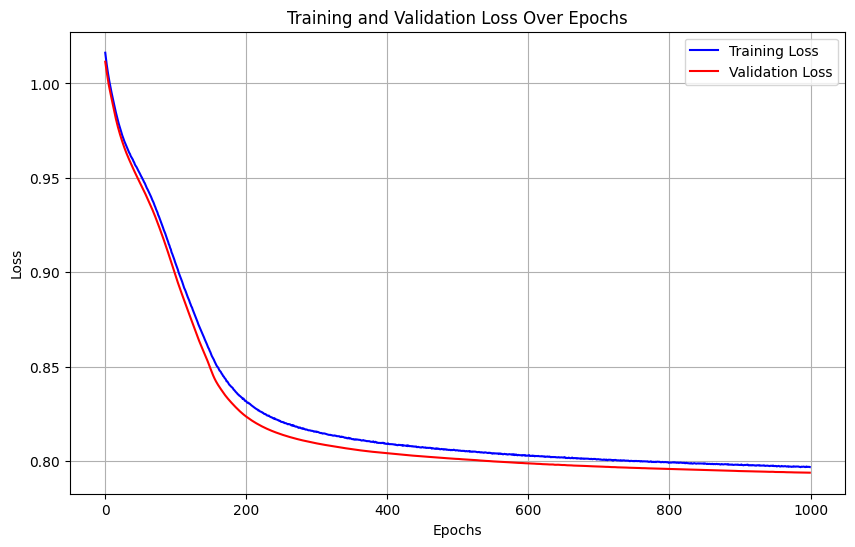

Training run 28/50 for 100% of the data...
Sample size for 100%: 199755


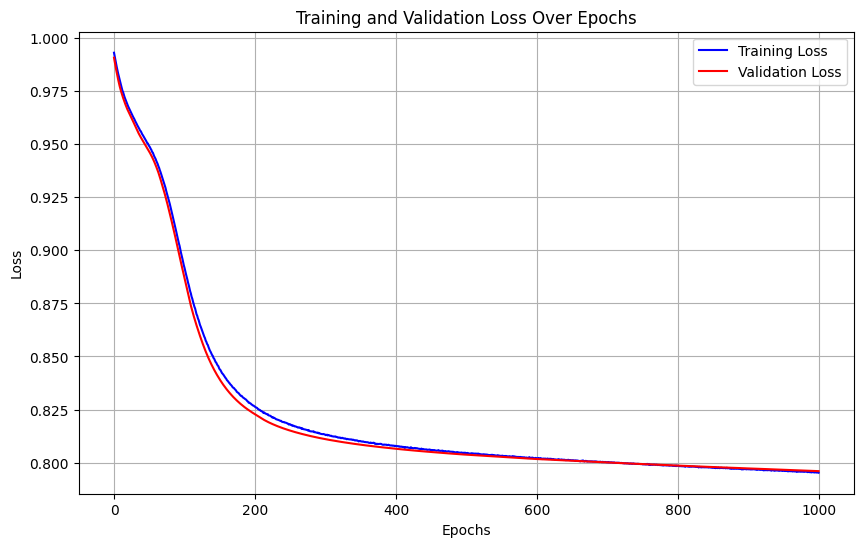

Training run 29/50 for 100% of the data...
Sample size for 100%: 199755


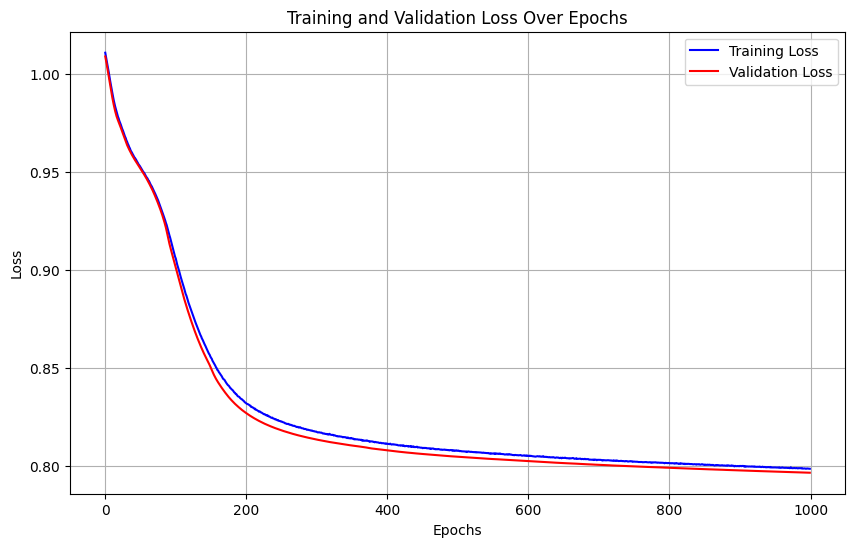

Training run 30/50 for 100% of the data...
Sample size for 100%: 199755


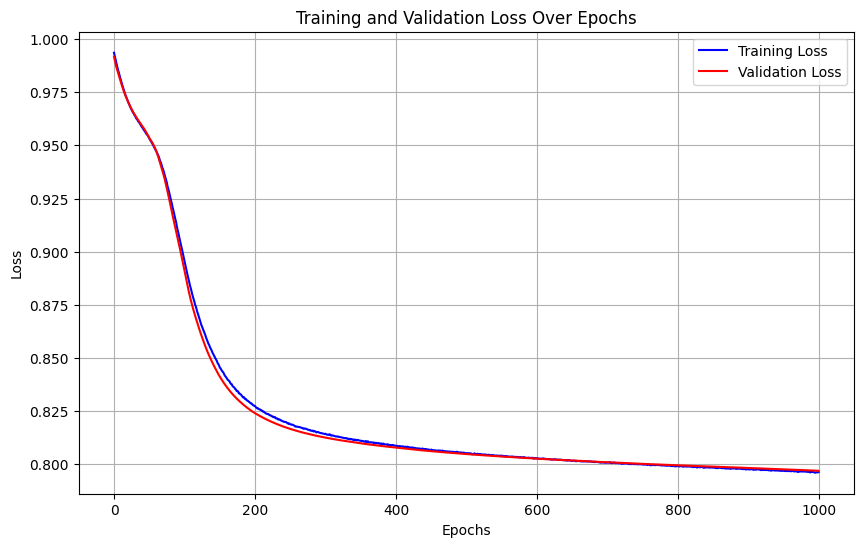

Training run 31/50 for 100% of the data...
Sample size for 100%: 199755


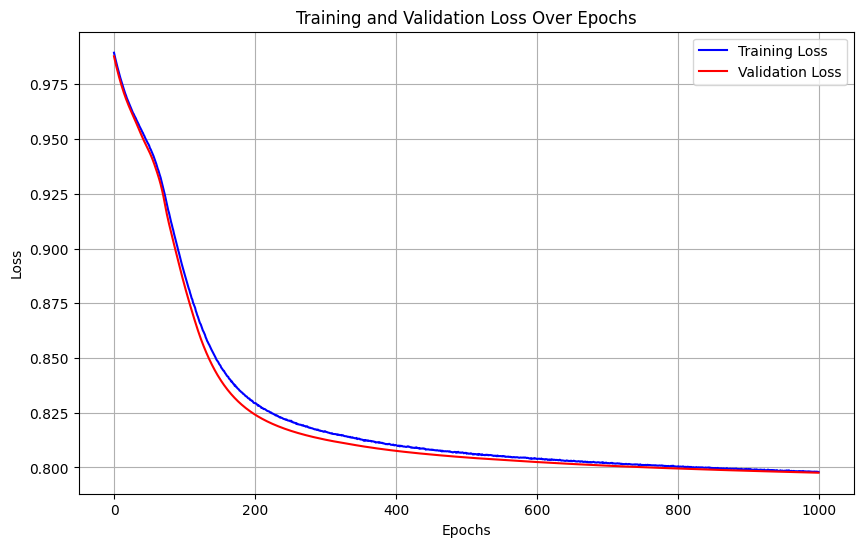

Training run 32/50 for 100% of the data...
Sample size for 100%: 199755


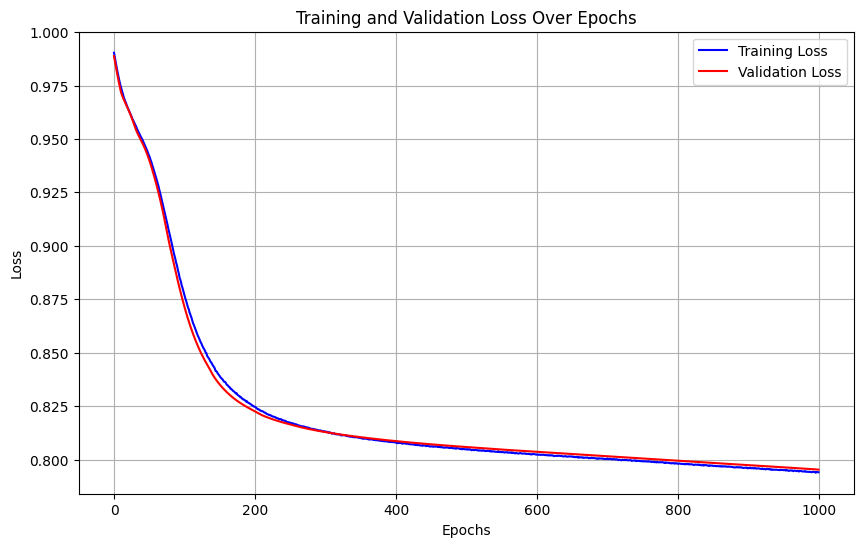

Training run 33/50 for 100% of the data...
Sample size for 100%: 199755


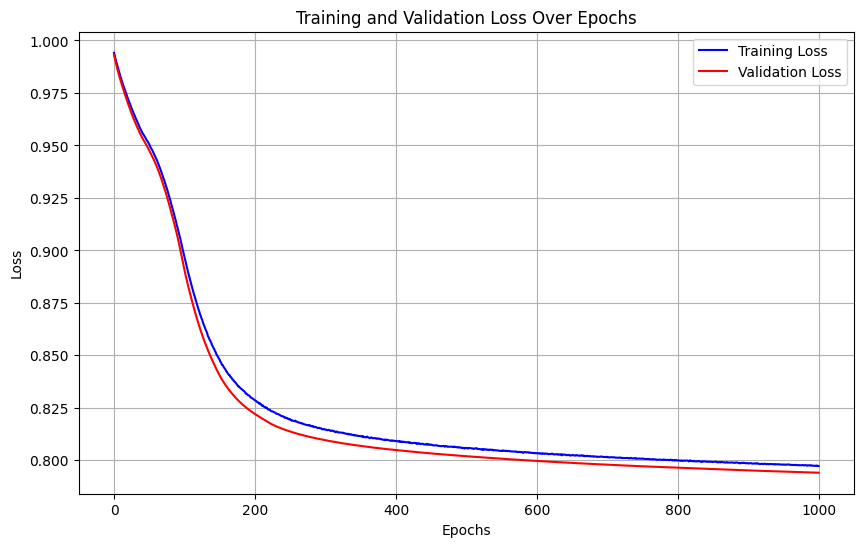

Training run 34/50 for 100% of the data...
Sample size for 100%: 199755


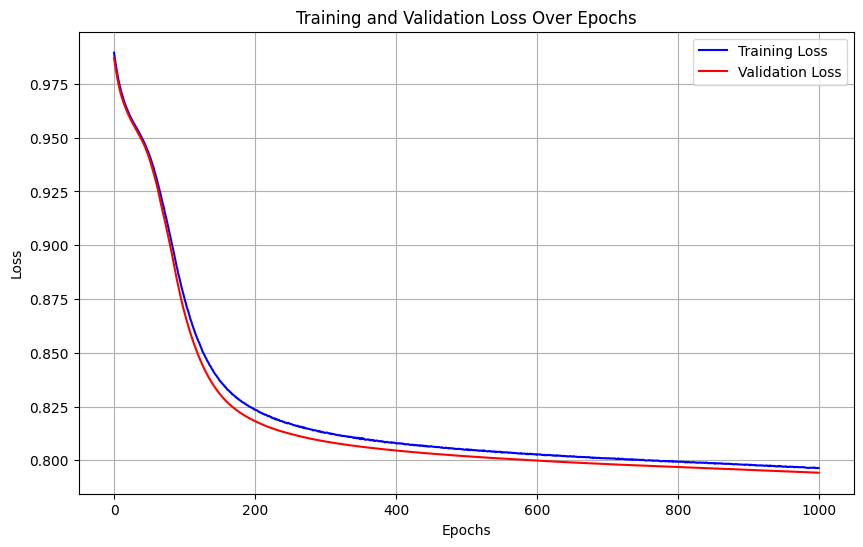

Training run 35/50 for 100% of the data...
Sample size for 100%: 199755


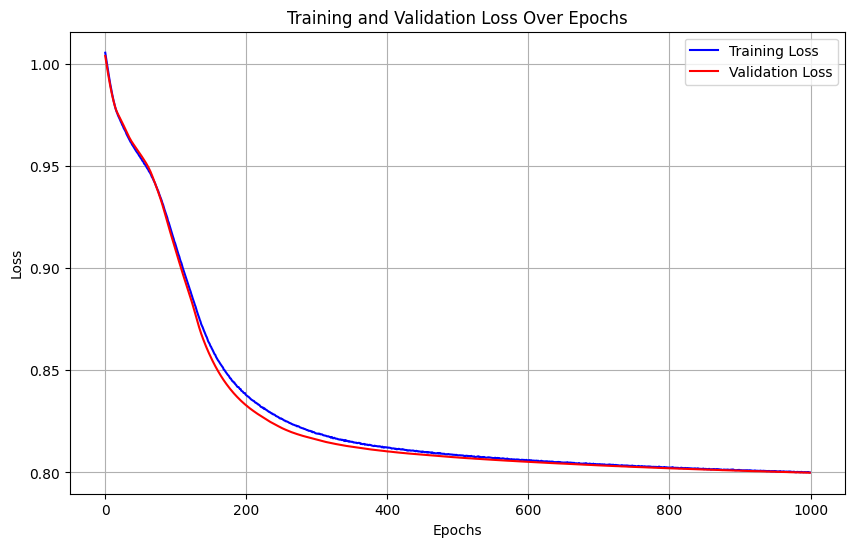

Training run 36/50 for 100% of the data...
Sample size for 100%: 199755


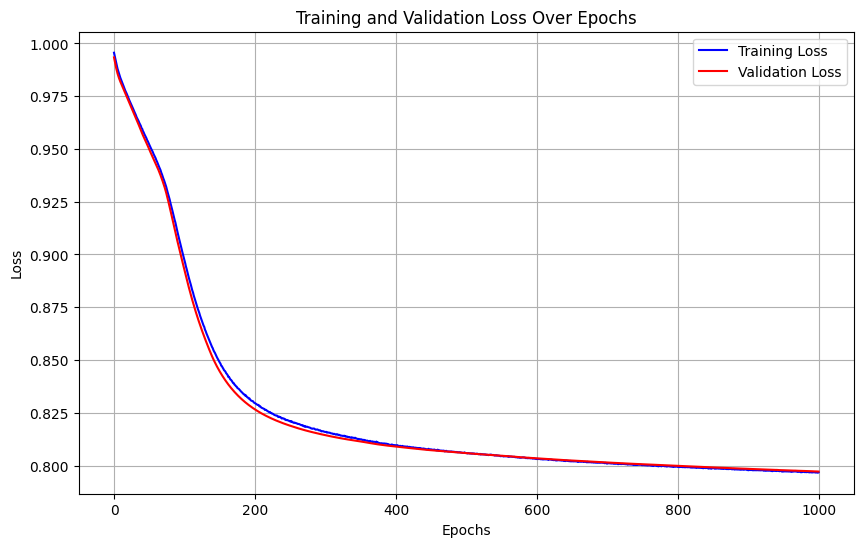

Training run 37/50 for 100% of the data...
Sample size for 100%: 199755


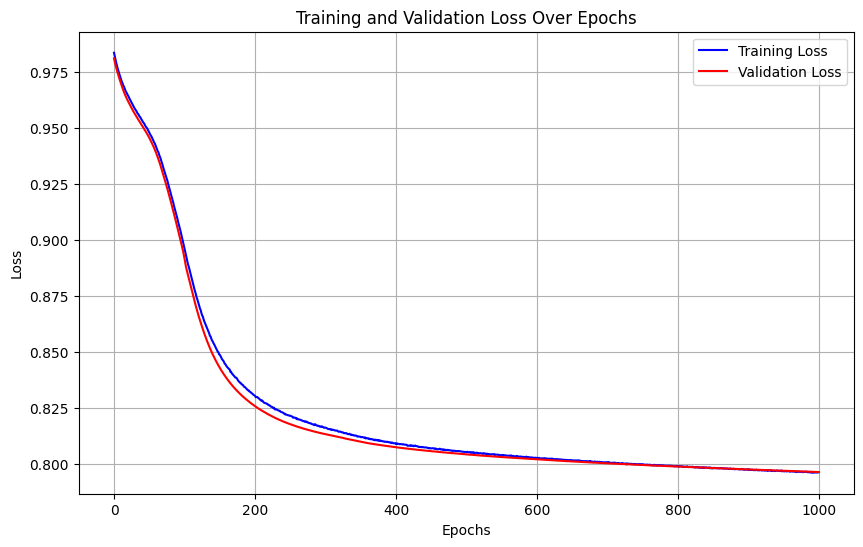

Training run 38/50 for 100% of the data...
Sample size for 100%: 199755


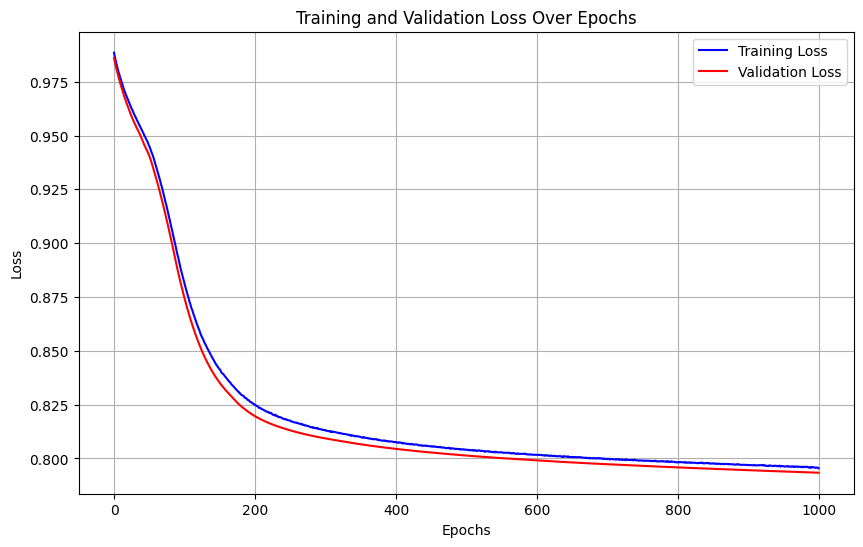

Training run 39/50 for 100% of the data...
Sample size for 100%: 199755


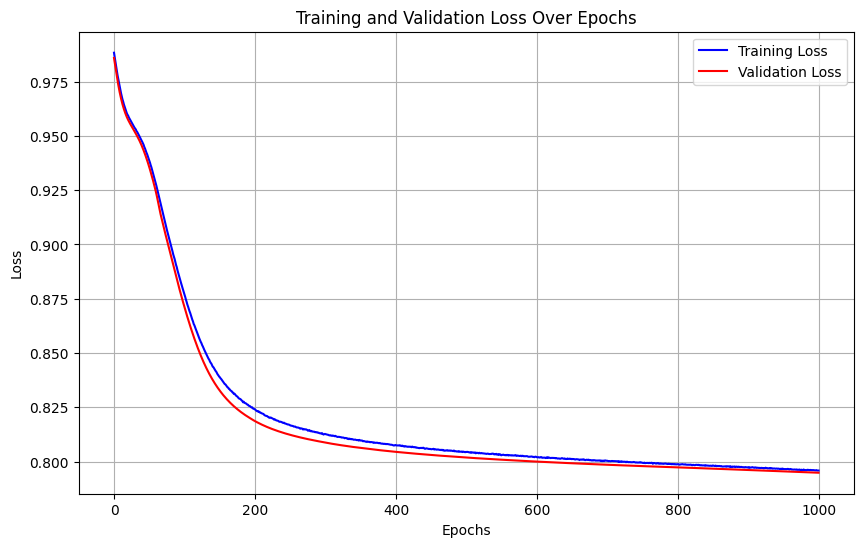

Training run 40/50 for 100% of the data...
Sample size for 100%: 199755


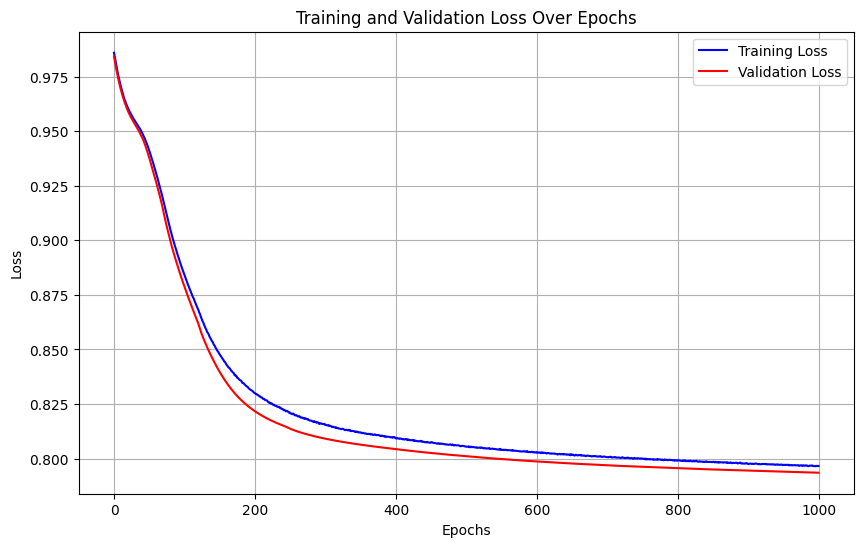

Training run 41/50 for 100% of the data...
Sample size for 100%: 199755


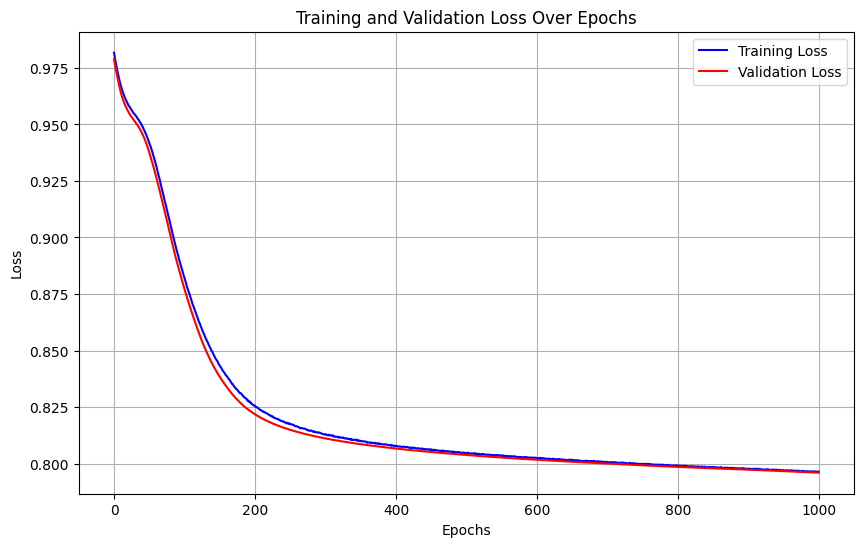

Training run 42/50 for 100% of the data...
Sample size for 100%: 199755


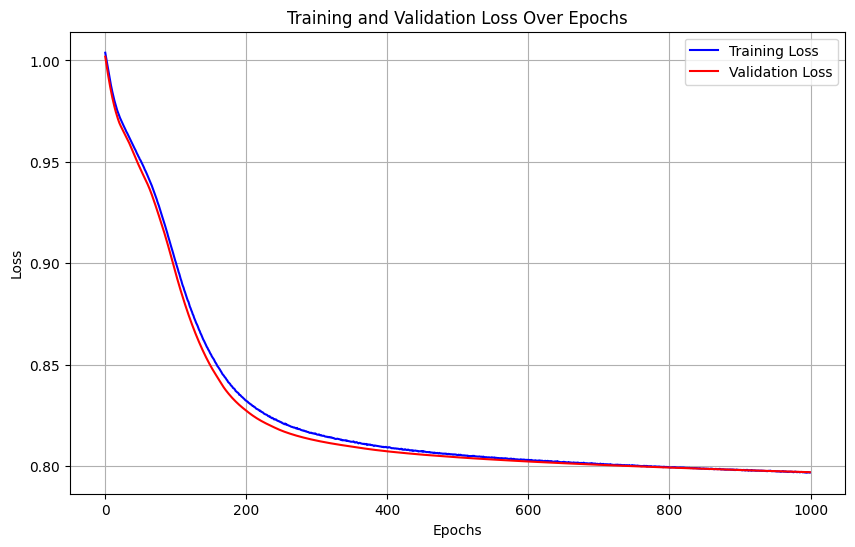

Training run 43/50 for 100% of the data...
Sample size for 100%: 199755


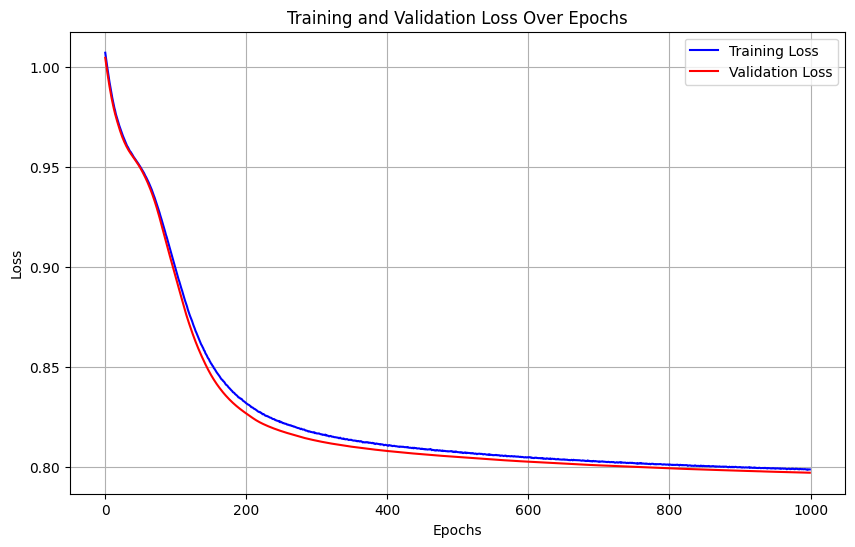

Training run 44/50 for 100% of the data...
Sample size for 100%: 199755


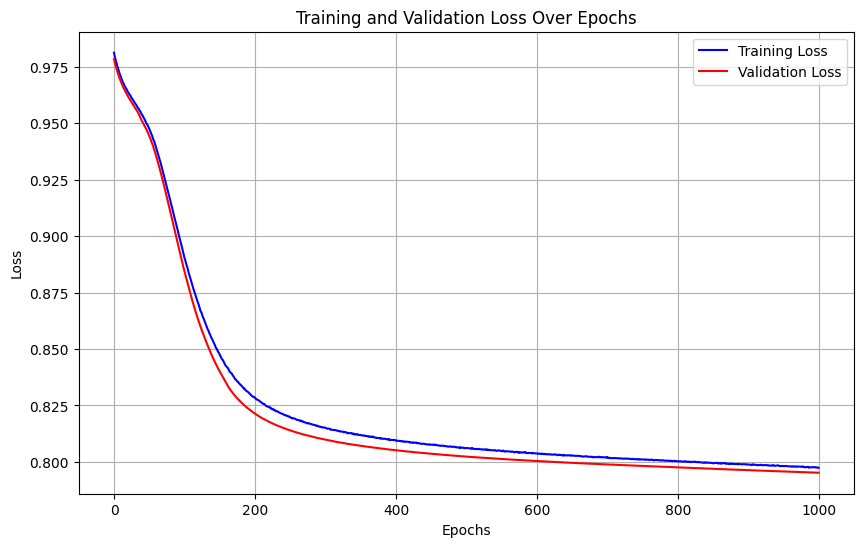

Training run 45/50 for 100% of the data...
Sample size for 100%: 199755


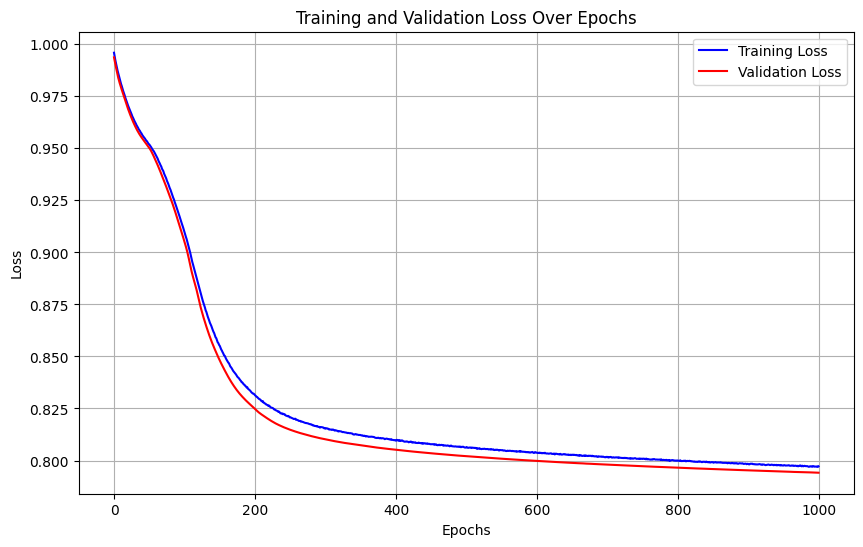

Training run 46/50 for 100% of the data...
Sample size for 100%: 199755


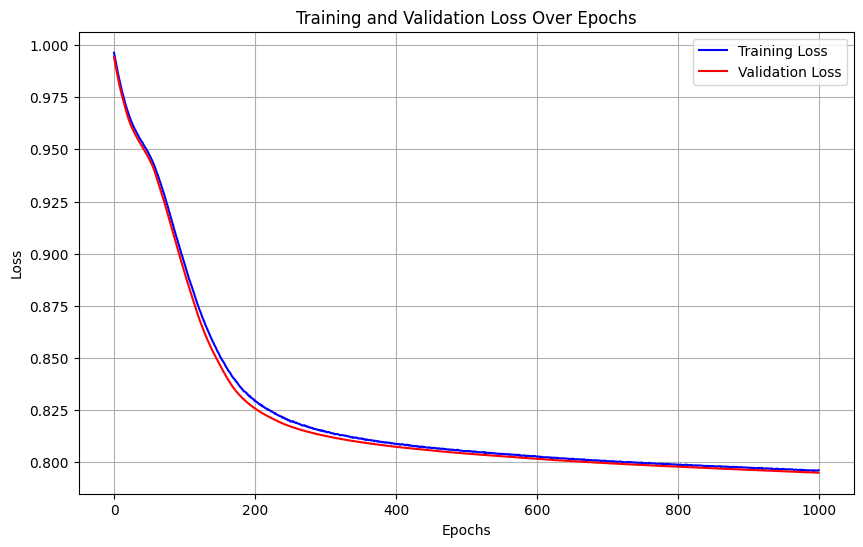

Training run 47/50 for 100% of the data...
Sample size for 100%: 199755


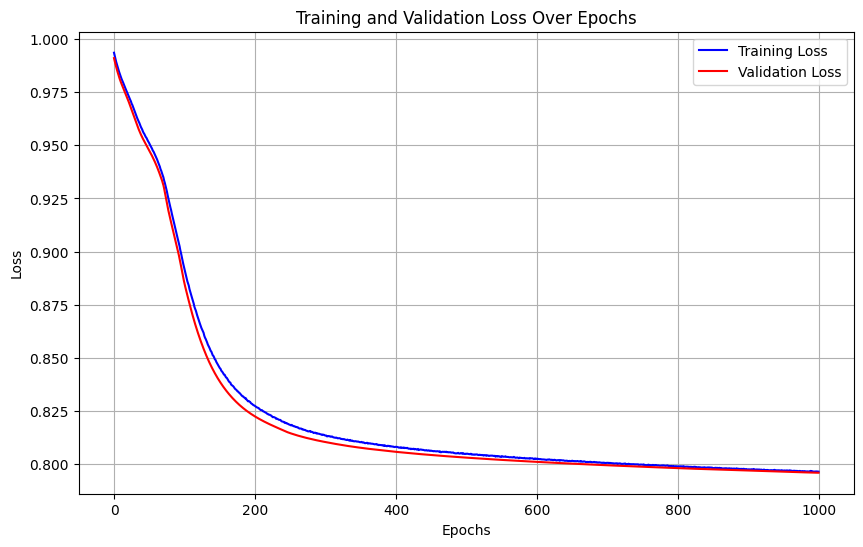

Training run 48/50 for 100% of the data...
Sample size for 100%: 199755


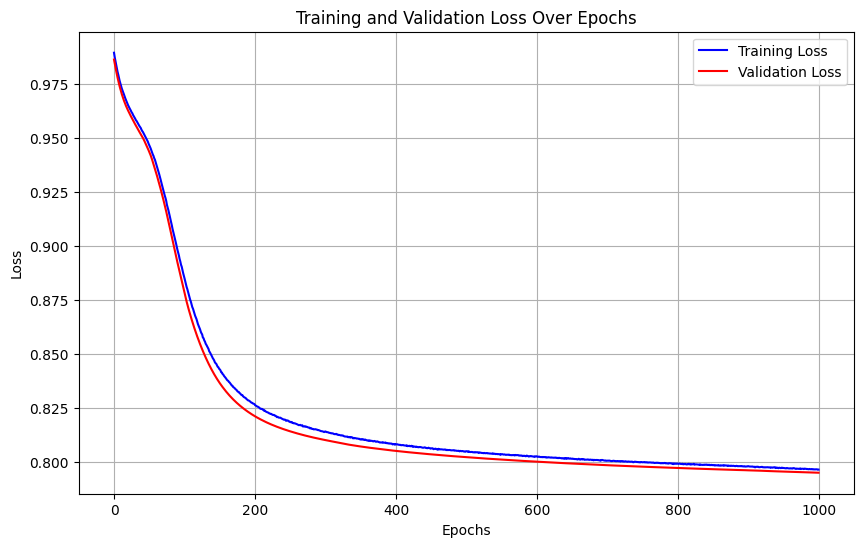

Training run 49/50 for 100% of the data...
Sample size for 100%: 199755


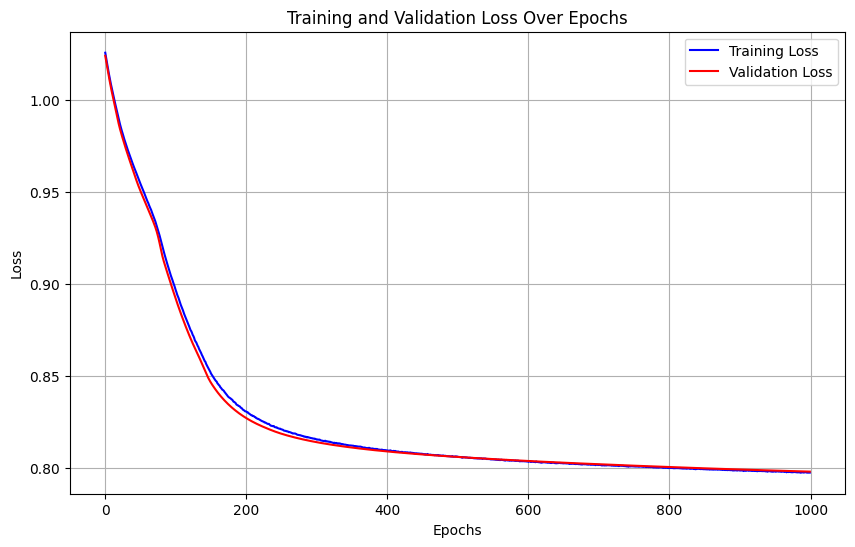

Training run 50/50 for 100% of the data...
Sample size for 100%: 199755


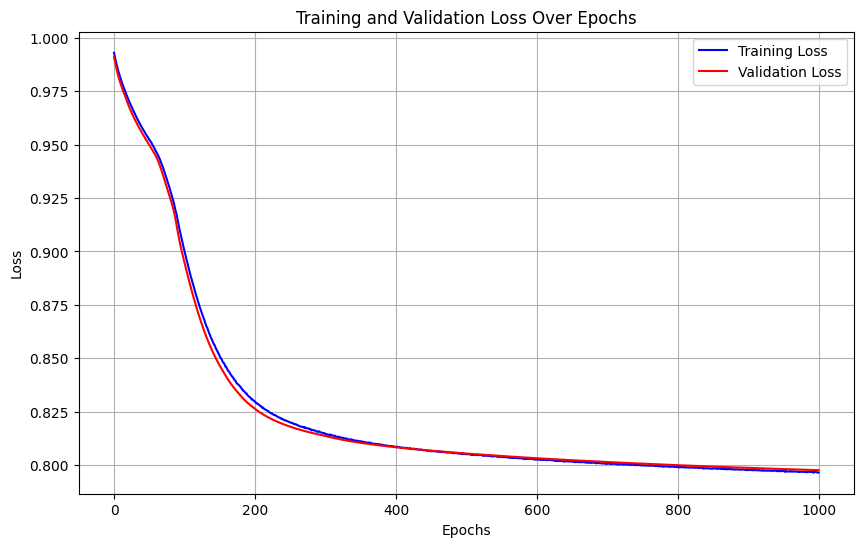

Metrics for 100% of data:
Final Metrics (Aggregated Predictions): {'accuracy': np.float64(0.8592560887086681), 'precision': np.float64(0.7823296971221794), 'recall': np.float64(0.758510078211834), 'f1': np.float64(0.7702266746185288), 'fpr': np.float64(0.09527321428508699)}
Metrics Across Runs:
accuracy: 0.8593 ± 0.0021
precision: 0.7823 ± 0.0045
recall: 0.7585 ± 0.0044
f1: 0.7702 ± 0.0036
fpr: 0.0953 ± 0.0024


In [16]:
for percentage in percentages:
    print(f"Training model for {percentage}% of the data...")

    models = []
    val_embeddings_list = []
    val_redshifts_list = []

    # Initialize lists to store metrics across all MC runs
    all_final_metrics = []
    all_metrics_mean = []
    all_metrics_std = []

    for i in range(n_mc_runs):
        print(f"Training run {i+1}/{n_mc_runs} for {percentage}% of the data...")
        
        # Sample the data for the current run with a different random seed
        sampled_embeddings, sampled_redshifts = get_sampled_data(embeddings, redshifts, percentage, random_seed=42+i)  
        
        # Split data with a different random seed for each run
        X_train, X_val, y_train, y_val = train_test_split(
            sampled_embeddings, sampled_redshifts, test_size=0.2, random_state=42+i
        )
        X_train, X_val = torch.tensor(X_train, dtype=torch.float32), torch.tensor(X_val, dtype=torch.float32)
        y_train, y_val = torch.tensor(y_train, dtype=torch.float32), torch.tensor(y_val, dtype=torch.float32)

        num_neg = (y_train == 0).sum().item()  # Number of negative samples
        num_pos = (y_train == 1).sum().item()  # Number of positive samples
        pos_weight = torch.tensor([num_neg / num_pos], dtype=torch.float32)
        
        # Re-initialize the model for each run
        model = NNModel(input_dim=X_train.shape[1], task_type=task_type)
        
        # Train model
        trainer = ModelTrainer(model, lr=lr, epochs=epochs, task_type=task_type, pos_weight=pos_weight)        
        train_losses, val_losses = trainer.train(X_train, y_train, X_val, y_val)
        
        # Store the trained model and validation data
        models.append(model)
        val_embeddings_list.append(X_val.numpy())
        val_redshifts_list.append(y_val.numpy())
        
        plot_loss(train_losses, val_losses, epochs=epochs)
        
        # Evaluate the model for this run
        evaluator = ModelEvaluator(task_type=task_type)
        final_metrics, metrics_mean, metrics_std, predictions = evaluator.evaluate(
            model, X_val.numpy(), y_val.numpy(), n_mc_runs=1, poisson_noise = False
        )
        
        # Store metrics for this run
        all_final_metrics.append(final_metrics)
        all_metrics_mean.append(metrics_mean)
        all_metrics_std.append(metrics_std)

    # Compute mean and std of metrics across all MC runs
    final_metrics_aggregated = {
        k: np.mean([m[k] for m in all_final_metrics]) for k in all_final_metrics[0]
    }
    metrics_mean_aggregated = {
        k: np.mean([m[k] for m in all_metrics_mean]) for k in all_metrics_mean[0]
    }
    metrics_std_aggregated = {
        k: np.std([m[k] for m in all_metrics_mean]) for k in all_metrics_mean[0]
    }

    # Print formatted metrics
    print(f"Metrics for {percentage}% of data:")
    print("Final Metrics (Aggregated Predictions):", final_metrics_aggregated)
    print("Metrics Across Runs:")
    for key in metrics_mean_aggregated:
        print(f"{key}: {metrics_mean_aggregated[key]:.4f} ± {metrics_std_aggregated[key]:.4f}")
    
    # Write results to file
    write_results_to_file(model_name,percentage, modality, parameter, final_metrics_aggregated, metrics_mean_aggregated, metrics_std_aggregated)